# Лабораторная работа: обучение многообразий

# PCA

В этом блоке вам предстоит выполнить задания, касающиеся метода главных компонент (`PCA`).

## Теоретическая часть

Пусть на вход подаются центрированные данные
$$
x_i = \begin{pmatrix}
x_{i1} \\ x_{i2} \\ \vdots \\ x_{ip}
\end{pmatrix} \in \mathbb R^{p \times 1}, \quad i \in \{1, \ldots, n\}, \quad \sum\limits_{i = 1}^n x_i = 0.
$$
Пусть также $X$ — матрица размера $n \times p$ — матрица объекты-признаки (внимание: объекты расположены в матрице $X$ по строкам), $W$ – матрица размера $p \times l$ из ортонормированных базисных векторов (их координаты записаны по столбцам) линейного подпространства $\mathbb R^l$ пространства $\mathbb R^p$, в которое мы хотим «вложить» исходные объекты, $Z$ — матрица размера $n \times l$ — матрица координат старых объектов в новом базисе. Мы определили функцию потерь ($l_2$-потери) следующим образом:

$$
L(W) = \|X^T - WZ^T\|^2_F = \sum\limits_{i = 1}^n \|x_i - Wz_i\|^2.
$$

На лекции мы обсудили построение первой главной компоненты, минимизируя выражение

$$
L(W) = \sum\limits_{i = 1}^n\|x_i - w_1z_{i1}\|^2.
$$

При условии, что $w_1^Tw_1 = 1$, мы получили, что

$$
z_{i1} = x_i^Tw_1,
$$

то есть что новая координата есть проекция на $w_1$, и что $w_1$ — собственный вектор выборочной ковариационной матрицы

$$
\Sigma = \frac{1}{n}X^TX,
$$

отвечающей наибольшему собственному значению.



## Задача 1

Вам требуется построить первые две главные компоненты, объяснить сособ их получения, а также их геометрический и статистический смыслы. Для этого:

1.   Составьте минимизируемый функционал.
2.   Докажите, что новые координаты (счеты) — это проекции исходных данных на соотвествующие векторы $w_1$, $w_2$.
3. Докажите, что $w_1$, $w_2$ — это собственные векторы выборочной ковариационной матрицы, отвечающие двум наибольшим собственным значениям, по убыванию, соответственно.
4. Покажите, что статистический смысл упомянутых выше собственных чисел — значение выборочных дисперсий соответствующих (новых) координат.

**Решение:**

Рассмотрим выборку из $n$ объектов $x_i \in \mathbb{R}^p$, $i = 1, \dots, n$.  
Будем считать, что данные предварительно центрированы, то есть их среднее равно нулю:

$$
\sum_{i=1}^n x_i = 0.
$$

Матрица данных $X \in \mathbb{R}^{n \times p}$ содержит объекты по строкам и признаки по столбцам.

Задача метода главных компонент заключается в поиске ортонормированного базиса низкой размерности.  
В частности, требуется найти матрицу направлений

$$
W = [w_1 \; w_2] \in \mathbb{R}^{p \times 2}, \quad W^T W = I_2,
$$

а также матрицу новых координат $Z \in \mathbb{R}^{n \times 2}$ так, чтобы ошибка восстановления исходных данных была минимальной:

$$
L(W, Z) = \|X - Z W^T\|_F^2 = \sum_{i=1}^n \|x_i - W z_i^T\|_2^2.
$$

---

## 1. Формулировка минимизируемого функционала

Рассмотрим задачу минимизации ошибки реконструкции.  
Зафиксируем матрицу направлений $W$ и минимизируем функционал по $Z$:

$$
L(W) = \min_Z \|X - Z W^T\|_F^2,
$$

при условии ортонормированности $W^T W = I_2$.

Интуитивно мы хотим подобрать такие направления $W$, чтобы при восстановлении данных из двумерного представления $ZW^T$ потеря информации была минимальной.

---

## 2. Оптимальные новые координаты как ортогональные проекции

При фиксированной матрице $W$ задача минимизации по $Z$ является квадратичной и распадается на независимые задачи для каждой строки.

Для каждого объекта $x_i$ требуется найти такие координаты $z_i$, чтобы выполнялось приближение:

$$
x_i \approx W z_i^T.
$$

Это стандартная задача наименьших квадратов. Её решение имеет вид:

$$
z_i^T = (W^T W)^{-1} W^T x_i.
$$

Так как столбцы $W$ ортонормированы, выполняется $W^T W = I_2$, и формула упрощается:

$$
z_i^T = W^T x_i,
\quad \text{или} \quad Z = XW.
$$

Таким образом, новые координаты $z_{ij} = w_j^T x_i$ являются ортогональными проекциями исходных точек на направления $w_1$ и $w_2$.

---

## 3. Сведение задачи к поиску собственных векторов

Подставим найденное оптимальное значение $Z = XW$ обратно в функцию потерь:

$$
\begin{aligned}
L(W) &= \|X - X W W^T\|_F^2 \\
     &= \|X (I_p - W W^T)\|_F^2.
\end{aligned}
$$

Используя свойства нормы Фробениуса и следа, получаем:

$$
L(W) = \operatorname{tr}\!\left[(I_p - WW^T) X^T X (I_p - WW^T)\right].
$$

Так как матрица $(I_p - WW^T)$ является ортогональным проектором, выполняется равенство $(I_p - WW^T)^2 = I_p - WW^T$. Тогда:

$$
L(W) = \operatorname{tr}(X^T X) - \operatorname{tr}(W^T X^T X W).
$$

Введём выборочную ковариационную матрицу:

$$
\Sigma = \frac{1}{n} X^T X.
$$

С учётом этого получаем:

$$
L(W) = n \cdot \operatorname{tr}(\Sigma) - n \cdot \operatorname{tr}(W^T \Sigma W).
$$

Поскольку $\operatorname{tr}(\Sigma)$ не зависит от $W$, минимизация ошибки реконструкции эквивалентна максимизации величины:

$$
\operatorname{tr}(W^T \Sigma W)
$$

при условии $W^T W = I_2$.

Из теоремы Рэлея–Ритца следует, что максимум достигается тогда, когда столбцы $W$ являются собственными векторами матрицы $\Sigma$, соответствующими наибольшим собственным значениям:

$$
\Sigma w_1 = \lambda_1 w_1, \quad
\Sigma w_2 = \lambda_2 w_2, \quad
\lambda_1 \ge \lambda_2 \ge \dots
$$

---

## 4. Интерпретация собственных значений

Рассмотрим дисперсию проекций на $j$-ю главную компоненту:

$$
\frac{1}{n} \sum_{i=1}^n z_{ij}^2
= \frac{1}{n} \|X w_j\|_2^2
= w_j^T \Sigma w_j
= \lambda_j.
$$

Следовательно:

- $\lambda_1$ — максимальная возможная дисперсия вдоль некоторого направления,
- $\lambda_2$ — максимальная дисперсия в направлении, ортогональном первому,
- последующие значения интерпретируются аналогично.

Геометрически главные компоненты задают оси эллипсоида рассеивания данных.  
Чем больше собственное значение $\lambda_j$, тем более значимой является соответствующая компонента. Малые значения $\lambda_j$ указывают на направления, вклад которых в структуру данных несущественен и может быть отброшен без значительной потери информации.



## Задача 2

Предыдущий подход хорошо работает в случае, когда $n$ сильно больше $p$. В противном случае разумнее рассматривать тоже симметричную матрицу $XX^T$. Ваша задача, взяв конкретную матрицу $X$ (скажем, размера $3 \times 3$, но можно и в общем виде), показать, что

1.   Существует ортогональная матрица $U$, что

$$
U^TXX^TU = \Lambda,
$$

где последняя матрица — диагональная.

2.   Верно равенство

$$
XX^TU = U \Lambda,
$$

а значит и равенство

$$
X^TXX^TU = X^TU \Lambda,
$$

откуда

$$
(X^TX)(X^TU) = X^TU \Lambda
$$

и $X^TU$ — матрица из собственных векторов для $X^TX$.

3. Показать, что столбцы матрицы $X^TU$ ортогональны, но не ортонормированы.

4. Найти нормы столбцов $X^TU$, привести преобразование к ортогональному. Получить аналог `PCA`.

5. Показать численно (на конкретной матрице) с использованием, например, `numpy`.

**Решение:**

Предыдущий вывод PCA через ковариационную матрицу $X^T X$ удобен в ситуации, когда число объектов $n$ существенно больше числа признаков $p$.  
Если же $p$ велико, разумнее рассматривать симметричную матрицу меньшего размера $X X^T \in \mathbb{R}^{n \times n}$.

Пусть дана произвольная матрица данных
$$
X \in \mathbb{R}^{n \times p}.
$$

---

### 1. Диагонализация матрицы $X X^T$

Матрица $X X^T$ является симметричной и неотрицательно определённой. Следовательно, по спектральной теореме существует ортогональная матрица
$$
U \in \mathbb{R}^{n \times n}, \quad U^T U = I,
$$
такая, что

$$
U^T X X^T U = \Lambda,
$$

где $\Lambda$ — диагональная матрица собственных значений $\lambda_1 \ge \lambda_2 \ge \dots \ge 0$.

---

### 2. Связь собственных векторов $X X^T$ и $X^T X$

Из равенства
$$
U^T X X^T U = \Lambda
$$
следует
$$
X X^T U = U \Lambda.
$$

Домножим это равенство слева на $X^T$:
$$
X^T X X^T U = X^T U \Lambda.
$$

Переписывая, получаем
$$
(X^T X)(X^T U) = (X^T U)\Lambda.
$$

Следовательно, столбцы матрицы $X^T U$ являются собственными векторами матрицы $X^T X$, соответствующими тем же собственным значениям $\lambda_i$.

---

### 3. Ортогональность столбцов матрицы $X^T U$

Рассмотрим два столбца матрицы $X^T U$:
$$
v_i = X^T u_i, \quad v_j = X^T u_j,
$$
где $u_i$ и $u_j$ — различные собственные векторы матрицы $X X^T$.

Их скалярное произведение:
$$
v_i^T v_j = u_i^T X X^T u_j = u_i^T (\lambda_j u_j) = \lambda_j u_i^T u_j.
$$

Так как матрица $U$ ортогональна, то $u_i^T u_j = 0$ при $i \neq j$, а значит
$$
v_i^T v_j = 0.
$$

Таким образом, столбцы матрицы $X^T U$ ортогональны, но, вообще говоря, не нормированы.

---

### 4. Нормировка и аналог PCA

Найдём норму столбца $v_i = X^T u_i$:
$$
\|v_i\|^2 = v_i^T v_i = u_i^T X X^T u_i = u_i^T (\lambda_i u_i) = \lambda_i.
$$

Следовательно,
$$
\|v_i\| = \sqrt{\lambda_i}.
$$

Нормируя столбцы, получаем
$$
w_i = \frac{1}{\sqrt{\lambda_i}} X^T u_i.
$$

Векторы $w_i$ являются ортонормированными собственными векторами матрицы $X^T X$ и образуют базис главных компонент.  
Это полностью согласуется с классическим PCA и фактически соответствует сингулярному разложению матрицы $X$.


In [17]:

import numpy as np

np.set_printoptions(precision=3, suppress=True)

print("\nИсходная матрица")
X = np.array([[1., 2., 3.],
              [4., 5., 6.],
              [7., 8., 9.]])

print("X =")
print(X)

# 1) Центрирование
print("\nЦентрирование данных")
mu = X.mean(axis=0, keepdims=True)   # строка средних
Xc = X - mu
print("Средние по столбцам =", mu.ravel())
print("\nX_centered =")
print(Xc)

# 2) Строим XX^T
print("\nВычисляем XXᵀ")
G = Xc @ Xc.T  # Gram matrix (n x n)
print("XXᵀ =")
print(G)

# 3) Спектральное разложение XX^T
print("\nНаходим собственные значения и векторы XXᵀ")
# eigh предпочтительнее для симметричных матриц
vals, U = np.linalg.eigh(G)

# сортировка по убыванию
order = np.argsort(vals)[::-1]
vals = vals[order]
U = U[:, order]

print("Собственные значения:", np.round(vals, 3))
print("\nМатрица U (столбцы — собственные векторы):")
print(np.round(U, 3))

# 4) Проверки из теории
print("\nПроверяем UᵀXXᵀU = Λ")
Lam = np.diag(vals)
check1 = U.T @ G @ U
print("UᵀXXᵀU =")
print(check1)
print("\nΛ =")
print(Lam)
print("Равенство:", np.allclose(check1, Lam))

print("\nПроверяем XXᵀU = UΛ")
print("Равенство:", np.allclose(G @ U, U @ Lam))

# ---------- 5) Строим XᵀU ----------
print("\nВычисляем XᵀU")
XTU = Xc.T @ U
print("XᵀU =")
print(XTU)

# 6) Ортогональность и (не)ортонормированность
print("\nПроверяем ортогональность столбцов XᵀU")
G2 = XTU.T @ XTU
print("Матрица попарных скалярных произведений (XᵀU)ᵀ(XᵀU) =")
print(G2)

# Вне диагонали должно быть ~0
off_diag = G2 - np.diag(np.diag(G2))
is_ortho = np.allclose(off_diag, 0, atol=1e-10)
print("ИТОГ: Столбцы ортогональны?", is_ortho)

print("\nПроверяем нормы столбцов XᵀU")
col_norms = np.sqrt(np.sum(XTU**2, axis=0))
print("Нормы столбцов:", np.round(col_norms, 3))
print("ИТОГ: Столбцы ортонормированы?", np.allclose(col_norms, 1.0))

# 7) Нормировка ненулевых столбцов -> получаем V-
print("\nНормируем только ненулевые столбцы")
eps = 1e-10
keep = col_norms > eps
keep_idx = np.where(keep)[0]
drop_idx = np.where(~keep)[0]

print("Ненулевые столбцы:", keep_idx + 1)
print("Нулевые столбцы:", drop_idx + 1)

V = np.zeros_like(XTU)
V[:, keep_idx] = XTU[:, keep_idx] / col_norms[keep_idx]

print("\nМатрица V после нормировки:")
print(V)

Vnz = V[:, keep_idx]
print("V (ненулевые столбцы) ортонормирована?",
      np.allclose(Vnz.T @ Vnz, np.eye(len(keep_idx)), atol=1e-10))

# 8) Главные компоненты
print("\nПолучаем главные компоненты (PCA)")
Z = Xc @ Vnz
print("Z = X_centered @ V =")
print(Z)

# В этом выводе сверим дисперсии с собственными значениями:
# Для центрированных данных var_j = (1/n) * ||X w_j||^2 = lambda_j / n.
# Поэтому (var * n) должно совпадать с lambda_j.
n = Xc.shape[0]
var = np.mean(Z**2, axis=0)          # ddof=0
print("\nПроверка: var * n (должно совпасть с λ)")
print("var * n =", np.round(var * n, 3))
print("λ       =", np.round(vals[keep_idx], 3))



Исходная матрица
X =
[[1. 2. 3.]
 [4. 5. 6.]
 [7. 8. 9.]]

Центрирование данных
Средние по столбцам = [4. 5. 6.]

X_centered =
[[-3. -3. -3.]
 [ 0.  0.  0.]
 [ 3.  3.  3.]]

Вычисляем XXᵀ
XXᵀ =
[[ 27.   0. -27.]
 [  0.   0.   0.]
 [-27.   0.  27.]]

Находим собственные значения и векторы XXᵀ
Собственные значения: [54.  0.  0.]

Матрица U (столбцы — собственные векторы):
[[-0.707  0.    -0.707]
 [ 0.     1.     0.   ]
 [ 0.707  0.    -0.707]]

Проверяем UᵀXXᵀU = Λ
UᵀXXᵀU =
[[54.  0. -0.]
 [ 0.  0.  0.]
 [-0.  0.  0.]]

Λ =
[[54.  0.  0.]
 [ 0.  0.  0.]
 [ 0.  0.  0.]]
Равенство: True

Проверяем XXᵀU = UΛ
Равенство: True

Вычисляем XᵀU
XᵀU =
[[4.243 0.    0.   ]
 [4.243 0.    0.   ]
 [4.243 0.    0.   ]]

Проверяем ортогональность столбцов XᵀU
Матрица попарных скалярных произведений (XᵀU)ᵀ(XᵀU) =
[[54.  0.  0.]
 [ 0.  0.  0.]
 [ 0.  0.  0.]]
ИТОГ: Столбцы ортогональны? True

Проверяем нормы столбцов XᵀU
Нормы столбцов: [7.348 0.    0.   ]
ИТОГ: Столбцы ортонормированы? False

Нормируем 

## Практическая часть

Рассмотрим применение `PCA` в разрезе работы с зашумленными данными. Наша цель — выяснить, можно ли при помощи метода каким-то образом избавляться от шума в данных. Прежде чем двигаться дальше к конкретике, предположите, осуществимо ли это и, если ответ положительный, попробуйте предложить конкретный способ (с обоснованием).

In [ ]:
Предположим следующую ситуацию: решается задача классификации, есть некоторый тренировочный набор данных (эталонный, возможно синтетический), на котором обучается модель классификации. Данные же для предсказания поступают в некотором "зашумленном" виде: например, барахлит датчик/некачественная аппаратура/проблемы канала передачи данных, etc. Для повышения качества классификации разумно попробовать избавиться от шума в данных. Попробуем смоделировать такую ситуацию.

**Примечание:** в качества классификатора будет выступать [логистическая регрессия](https://scikit-learn.org/1.5/modules/generated/sklearn.linear_model.LogisticRegression.html). В рамках этой работы не будем вникать в суть самого метода, но будем использовать его как некоторый абстрактный классификатор, который поможет нам численно оценить то, насколько хорошо мы избавились от шума.

Будем работать с `FashionMNIST`

In [3]:
import tensorflow as tf
import matplotlib.pyplot as plt
import numpy as np
fashion_mnist = tf.keras.datasets.fashion_mnist
(train_images, train_labels), (test_images, test_labels) = fashion_mnist.load_data()

4422102/4422102 [==============================] - 1s 0us/step


(-0.5, 419.5, 279.5, -0.5)

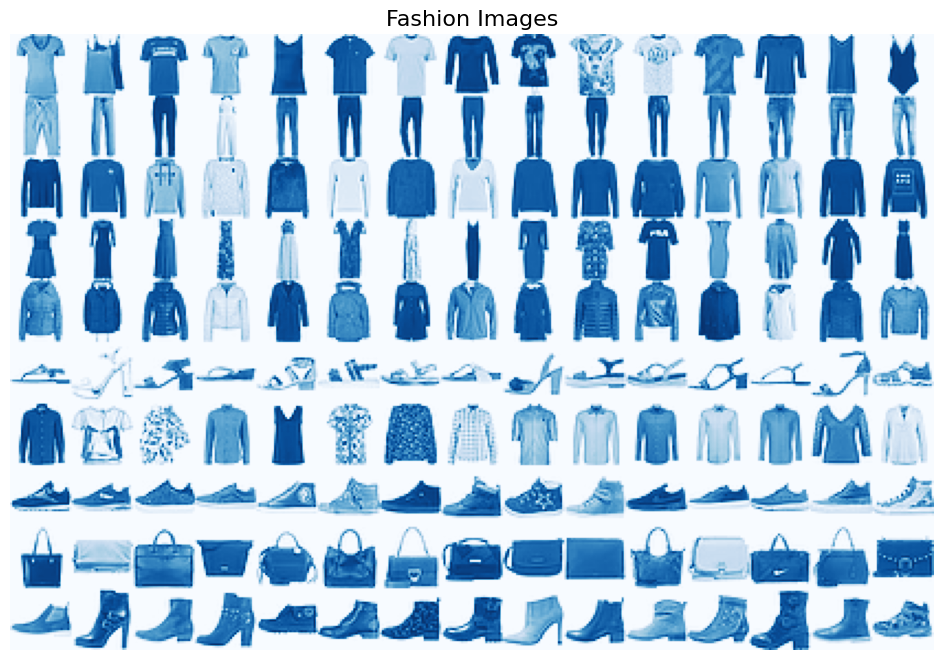

In [4]:
classes = sorted(np.unique(train_labels).astype(int))
h = w = 28
n_samples = 15

fig, ax = plt.subplots(figsize=(18, 8))
fashion_sample = np.empty(shape=(h * len(classes),
                                 w * n_samples))

for row, label in enumerate(classes):
    label_idx = np.argwhere(train_labels == label).squeeze()
    sample_indices = np.random.choice(label_idx, size=n_samples, replace=False)
    i = row * h
    for col, sample_idx in enumerate(sample_indices):
        j = col * w
        sample = train_images[sample_idx].reshape(h, w)
        fashion_sample[i:i+h, j:j + w] = sample

ax.imshow(fashion_sample, cmap='Blues')
ax.set_title('Fashion Images', fontsize=16)
plt.axis('off')

Набор данных содержит изображения различных предметов одежды: футболки, штаны, кофты, платья, обувь различного вида, etc. Всего $10$ классов. Для меньших временных затрат будем использовать только данные из тестовой части исходного набора данных (всего $10$ тысяч объектов).

In [5]:
X = test_images.reshape(len(test_images), -1)
y = test_labels

При помощи `train_test_split` разбейте набор данных на тренировочную и тестовую части в соотношении `80:20`. Используйте стратификацию по колонке отклика.

**Примечание:** здесь и далее для воспроизводимости результатов и корректного сравнения результатов экспериментов имеет смысл фиксировать `random_state`.

In [6]:
from sklearn.model_selection import train_test_split

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, stratify=y, random_state=21)

Обучите модель `LogisticRegression` со следующими параметрами: `max_iter=2000, tol=0.001` на тренировочных данных. При помощи `f1_score` с параметром `average='weighted'` оцените модель на тестовых данных.

In [7]:
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import f1_score

model = LogisticRegression(max_iter=2000, tol=0.001, random_state=42)
model.fit(X_train, y_train)

y_pred = model.predict(X_test)

f1 = f1_score(y_test, y_pred, average='weighted')
print(f"F1-score (weighted) on test data: {f1:.4f}")

F1-score (weighted) on test data: 0.7439


C:\Users\nbagr\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\linear_model\_logistic.py:473: ConvergenceWarning: lbfgs failed to converge after 2000 iteration(s) (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT

Increase the number of iterations to improve the convergence (max_iter=2000).
You might also want to scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


**Вопрос:** как работает `f1_score` и что показывает данная метрика? Опишите ее плюсы и минусы. Что означает параметр `average='weighted'`? Какие еще бывают параметры, зачем и когда они используются?

**Ваш ответ:** 
F1-score — это метрика для оценки моделей классификации, которая объединяет две другие ключевые метрики: точность (Precision) и полноту (Recall). Точность показывает, насколько мы можем доверять положительным срабатываниям модели, а полнота — какую долю реальных положительных объектов модель находит. F1-score является их гармоническим средним, что означает: его значение будет высоким только в том случае, когда высоки обе составляющие метрики. Это делает его особенно полезным на несбалансированных данных, где простая точность (accuracy) часто вводит в заблуждение.

Основное преимущество F1-score - это его сбалансированность и устойчивость к дисбалансу классов. Он предоставляет единую численную оценку, удобную для сравнения моделей, учитывая при этом как ложные срабатывания, так и пропуски целевого класса. К недостаткам можно отнести более сложную интерпретацию по сравнению с точностью и то, что он не учитывает истинно отрицательные срабатывания, что может быть важно в некоторых задачах.

Параметр average='weighted' используется в многоклассовой классификации. Он рассчитывает F1-score для каждого класса отдельно, а затем усредняет их, присваивая каждому классу вес, пропорциональный количеству его экземпляров в данных. Это самый распространенный и рекомендуемый вариант для несбалансированных наборов данных, так как он отражает "важность" каждого класса в общей выборке.

Помимо 'weighted', существуют и другие способы усреднения. Параметр 'macro' вычисляет простое среднее арифметическое F1 по всем классам, не учитывая дисбаланс. 'micro' глобально подсчитывает все истинно положительные, ложноотрицательные и ложноположительные срабатывания по всем классам и затем вычисляет единую метрику. Фактически, при 'micro' F1 становится эквивалентным точности. Выбор стратегии усреднения зависит от конкретной задачи и важности корректного предсказания для редких классов.

Добавьте к тестовым данным шум при помощи `np.random.normal(X_test, scale)`, где `scale` $\in \{50,100,150,200\}$. Визуально оцените результаты.

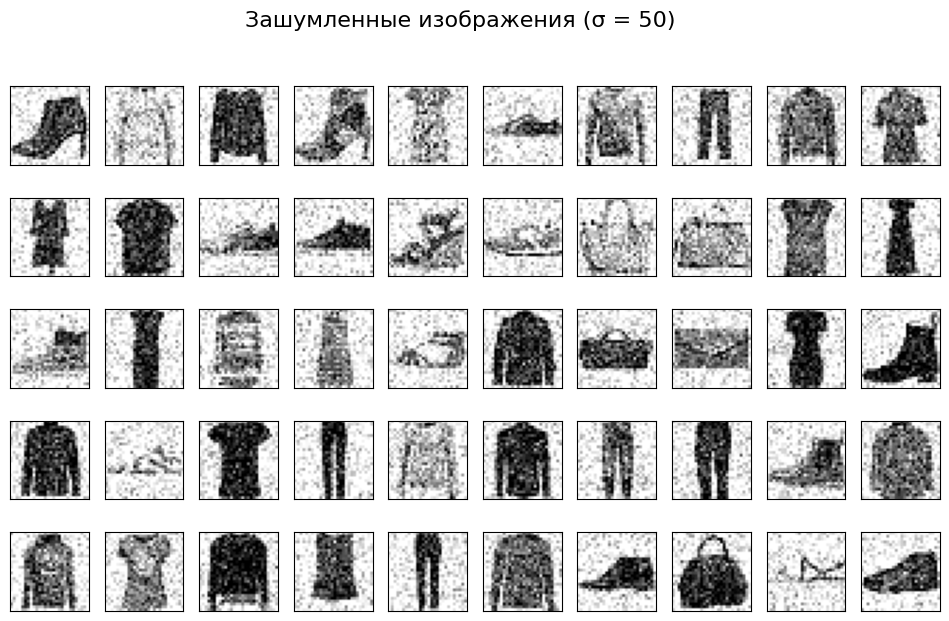

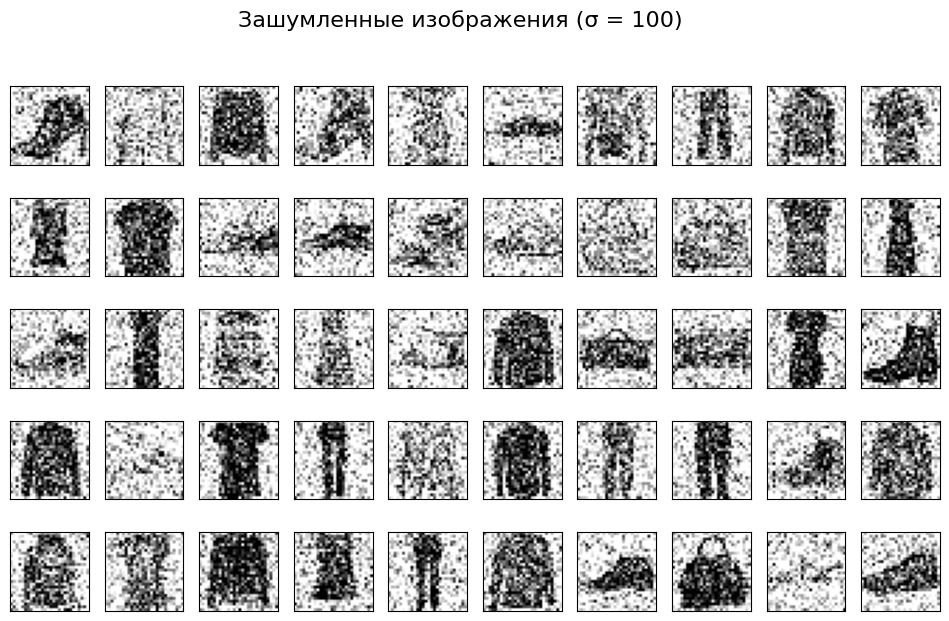

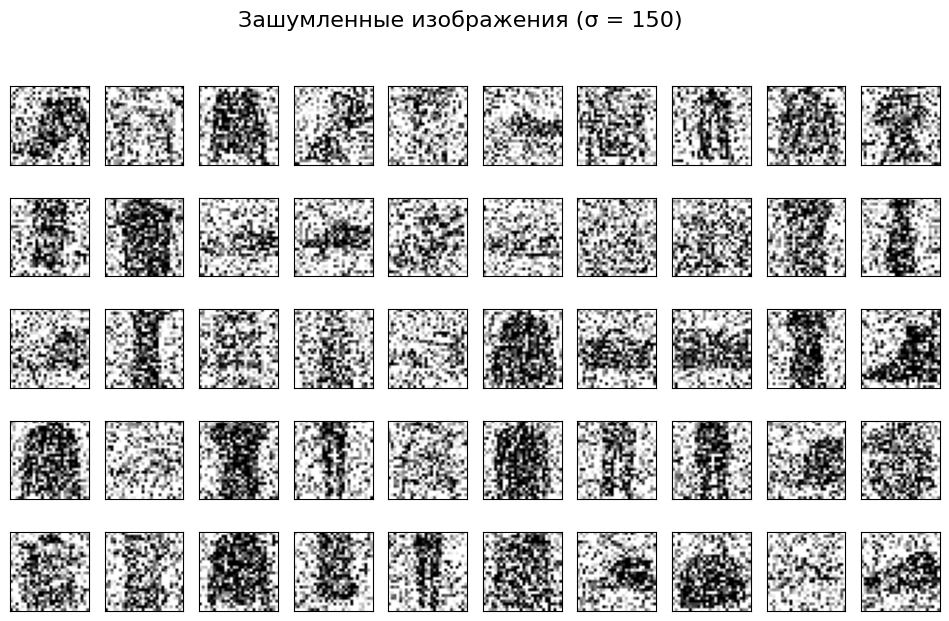

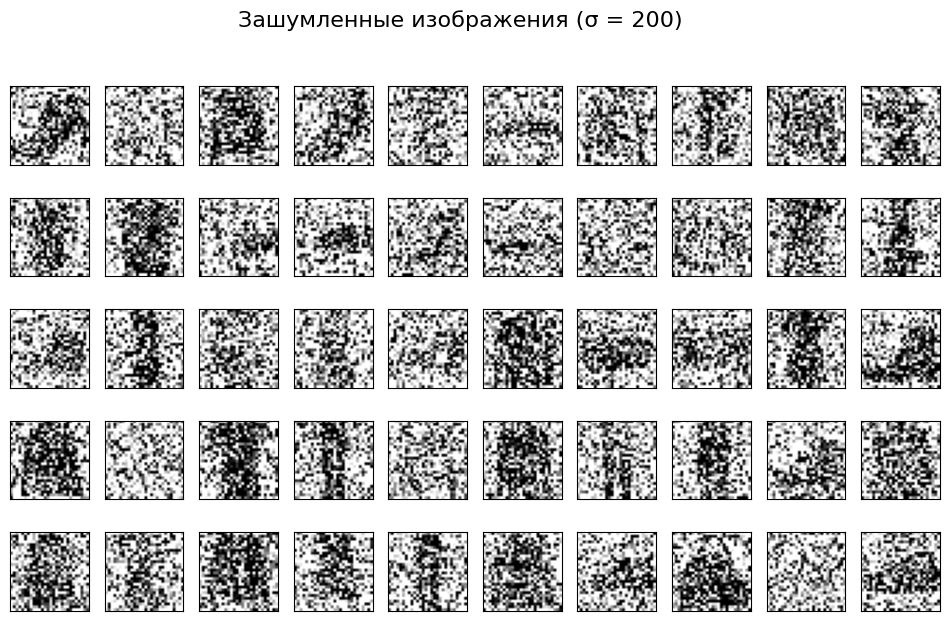

In [14]:
scales = [50, 100, 150, 200]
X_test_noisy_dict = {}

X_test_float = X_test.astype(np.float32)

for scale_val in scales:
    X_test_noisy = np.random.normal(loc=X_test_float, scale=scale_val)

    X_test_noisy = np.clip(X_test_noisy, 0, 255).astype(np.uint8)

    X_test_noisy_dict[scale_val] = X_test_noisy

    fig, axes = plt.subplots(5, 10, figsize=(12, 7), subplot_kw={'xticks': [], 'yticks': []})
    fig.suptitle(f'Зашумленные изображения (σ = {scale_val})', fontsize=16)

    for i, ax in enumerate(axes.flat):
        if i < len(X_test_noisy):
            ax.imshow(X_test_noisy[i].reshape(28, 28), cmap=plt.cm.gray_r)
        else:
            ax.axis('off')
    plt.show()

**Ваши выводы:**
На основе визуализации шума, можно сделать вывод, что по мере увеличения параметра scale (стандартного отклонения гауссовского шума) изображения становятся все более искаженными и менее узнаваемыми. При scale=50 некоторые детали еще различимы, но при scale=200 исходное содержимое изображения почти полностью скрыто шумом. Это демонстрирует значительное влияние возрастающих уровней шума на интерпретируемость данных.

Произведите предсказания для зашумленных тестовых данных. Оцените результат при помощи `f1_score` с параметром `average='weighted'`.

In [15]:
results_noisy = {}

for scale_val, X_test_noisy in X_test_noisy_dict.items():
    y_pred_noisy = model.predict(X_test_noisy)

    f1_noisy = f1_score(y_test, y_pred_noisy, average='weighted')
    results_noisy[scale_val] = f1_noisy
    print(f"F1-score (weighted) for noisy data (σ = {scale_val}): {f1_noisy:.4f}")


F1-score (weighted) for noisy data (σ = 50): 0.5448
F1-score (weighted) for noisy data (σ = 100): 0.3439
F1-score (weighted) for noisy data (σ = 150): 0.2363
F1-score (weighted) for noisy data (σ = 200): 0.1956


**Ваши выводы:**
Анализ значений метрики F1-score показывает, что рост уровня добавленного шума приводит к заметному ухудшению качества классификации. При стандартном отклонении σ = 50 модель всё ещё демонстрирует ограниченную способность к распознаванию образов (F1-score = 0.5448). Однако при увеличении шума до σ = 200 качество предсказаний снижается практически до уровня случайного выбора классов (F1-score = 0.1956). Данный результат согласуется с визуальной оценкой изображений: при больших значениях параметра scale шум начинает доминировать над полезным сигналом, из-за чего модель утрачивает возможность выделять информативные признаки, необходимые для корректной классификации.


Попробуем избавиться от шума при помощи метода главных компонент.

Обучите модель `PCA(explained_variance)` на зашумленных тестовых данных, где `explained_variance` $\in [0.1, 0.9]$ с шагом $0.1$. Уменьшите размерность зашумленных тестовых данных, а затем при помощи `.inverse_transform()` "восстановите" данные до приближенных исходных.

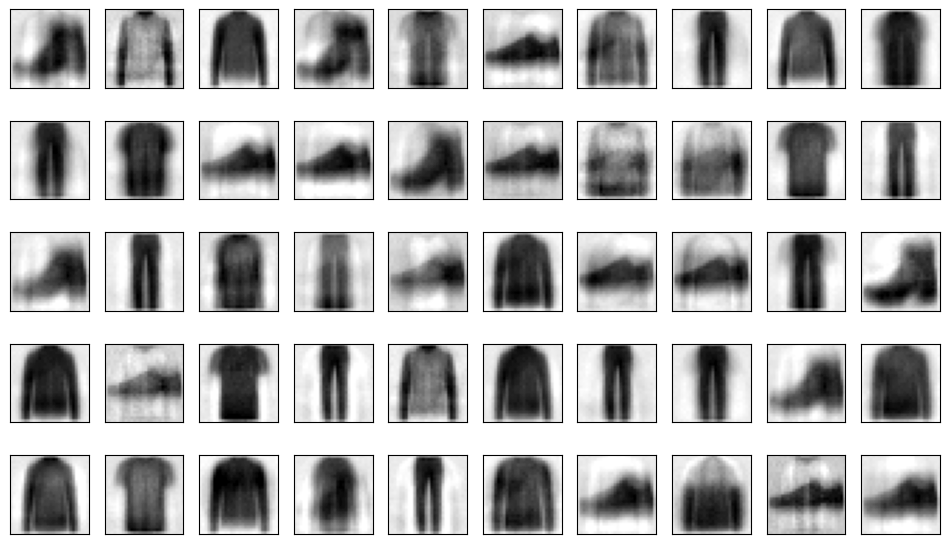

In [16]:
from sklearn.decomposition import PCA

explained_variances = [round(v, 1) for v in np.arange(0.1, 1.0, 0.1)]

restored_dict = {}

for scale_val, X_test_noisy in X_test_noisy_dict.items():
    X_noisy_float = X_test_noisy.astype(np.float32)

    for ev in explained_variances:
        pca = PCA(n_components=ev, svd_solver='full', random_state=42)
        pca.fit(X_noisy_float)

        X_reduced = pca.transform(X_noisy_float)
        X_restored = pca.inverse_transform(X_reduced)

        X_restored_uint8 = np.clip(X_restored, 0, 255).astype(np.uint8)

        restored_dict[(scale_val, ev)] = X_restored_uint8

scale_display = 50
ev_display = 0.5

restored_X_test_noisy = restored_dict.get((scale_display, ev_display),
                                          next(iter(restored_dict.values())))


fig, axes = plt.subplots(5, 10, figsize=(12, 7), subplot_kw={'xticks': [], 'yticks': []})

for i, ax in enumerate(axes.flat):
    ax.imshow(restored_X_test_noisy[i].reshape(28, 28), cmap=plt.cm.gray_r)


**Ваши выводы:**
После применения метода PCA к зашумлённым данным наблюдается заметный эффект сглаживания изображений. Уровень шума снижается, основные контуры объектов становятся более чёткими и читаемыми, хотя часть мелких деталей неизбежно утрачивается вследствие уменьшения размерности признакового пространства. При использовании среднего значения доли объяснённой дисперсии восстановленные изображения демонстрируют наилучший компромисс между подавлением шума и сохранением структуры объектов, оставаясь визуально различимыми. Такое предварительное восстановление данных потенциально способствует улучшению качества последующей классификации по сравнению с исходными зашумлёнными изображениями.


Произведите предсказания для очищенных от шума данных. Оцените результат при помощи `f1_score` с параметром `average='weighted'`.

Таблица f1_score (восстановленные изображения):


explained_variance,0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9
noise_scale,,,,,,,,,
50,0.048040,0.048040,0.239278,0.379092,0.505252,0.628124,0.652437,0.616549,0.570111
100,0.046771,0.229214,0.406361,0.483875,0.464235,0.415837,0.397652,0.382342,0.357372
150,0.165985,0.311491,0.321694,0.300322,0.272222,0.263736,0.245856,0.256176,0.244710
200,0.249825,0.247820,0.231395,0.225346,0.212097,0.207235,0.194609,0.193287,0.189011


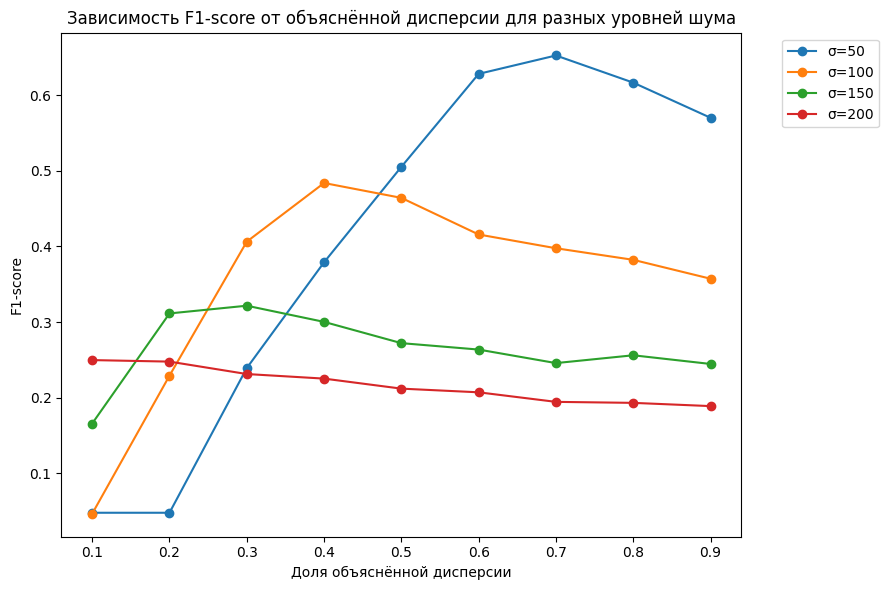

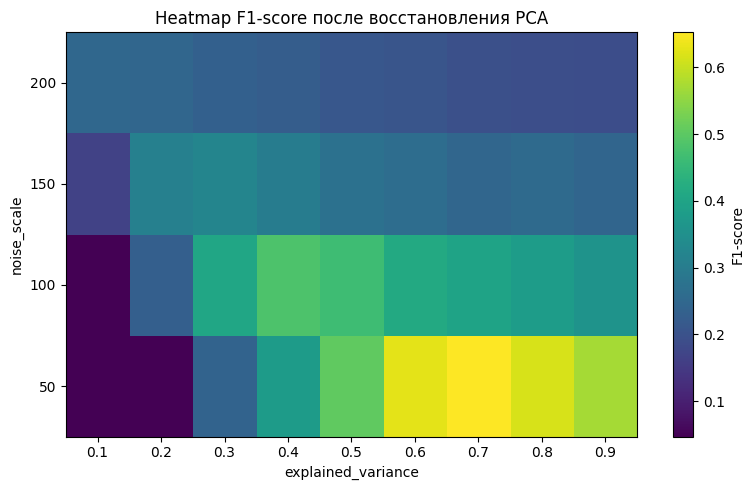

In [19]:
import pandas as pd

rows = []

if 'results_noisy' not in globals():
    results_noisy = {}
    for scale_val, X_test_noisy in X_test_noisy_dict.items():
        y_pred_noisy = model.predict(X_test_noisy)
        results_noisy[scale_val] = f1_score(y_test, y_pred_noisy, average='weighted')

for scale_val in X_test_noisy_dict.keys():
    for ev in explained_variances:
        X_restored = restored_dict[(scale_val, ev)]

        y_pred_restored = model.predict(X_restored)
        f1_restored = f1_score(y_test, y_pred_restored, average='weighted')

        rows.append({
            'noise_scale': scale_val,
            'explained_variance': ev,
            'f1_restored': f1_restored,
            'f1_noisy': results_noisy[scale_val]
        })

results_df = pd.DataFrame(rows)
results_df.head()

pivot_table = results_df.pivot(index='noise_scale',
                               columns='explained_variance',
                               values='f1_restored').sort_index()

print("Таблица f1_score (восстановленные изображения):")
display(pivot_table)

plt.figure(figsize=(9,6))
for scale_val in sorted(pivot_table.index):
    plt.plot(pivot_table.columns,
             pivot_table.loc[scale_val],
             marker='o',
             label=f'σ={scale_val}')

plt.xlabel('Доля объяснённой дисперсии')
plt.ylabel('F1-score')
plt.title('Зависимость F1-score от объяснённой дисперсии для разных уровней шума')
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
plt.tight_layout()
plt.show()

plt.figure(figsize=(8,5))
im = plt.imshow(pivot_table.values, aspect='auto', origin='lower', interpolation='nearest')
plt.colorbar(im, label='F1-score')
plt.xticks(range(len(pivot_table.columns)), pivot_table.columns)
plt.yticks(range(len(pivot_table.index)), pivot_table.index)
plt.xlabel("explained_variance")
plt.ylabel("noise_scale")
plt.title("Heatmap F1-score после восстановления PCA")
plt.tight_layout()
plt.show()

В качестве результата **НАГЛЯДНО** представьте получаемые значения `f1_score` в зависимости от используемого уровня шума и доли объясненной дисперции (таблицы, графики, диаграммы). Сделайте выводы.

**Ваши выводы:**
Применение PCA для восстановления изображений в большинстве экспериментов приводит к улучшению качества классификации по сравнению с работой модели на исходных зашумлённых данных. Наиболее выраженный положительный эффект наблюдается при средних уровнях шума, когда ключевые структурные особенности объектов ещё сохраняются. В условиях сильного зашумления возможности PCA по восстановлению информативных признаков ограничены, вследствие чего прирост качества оказывается минимальным. Оптимальный диапазон доли объяснённой дисперсии, как правило, находится в пределах 0.4–0.7: при меньших значениях происходит потеря существенной информации, тогда как при больших — в реконструкции сохраняется значительная часть шума. В целом, использование PCA позволяет эффективно подавлять шум и способствует повышению точности распознавания.

# t-SNE

В этом блоке вам предстоит выполнить задания, касающиеся `t-SNE`.

## Теоретическая часть

Напомним, что расстояние Кульбака--Лейблера между двумя распределенями $P = \{p_1, \ldots, p_n\}$, $Q = \{q_1, \ldots, q_n\}$ вычисляется как
$$
\mathbb{KL}(P|Q) = \sum\limits_{i=1}^np_i \log \frac{p_i}{q_i}.
$$

Пусть перплексия равна $k$. Положите $p_{i|j} = 1/k$ для $k$ ближайших соседей точки $j$ за исключением $j$, $p_{j|j} = 0$, как и остальные вероятности. Положите
$$
p_{ij} = \frac{p_{i|j} + p_{j|i}}{2n}.
$$

## Задача 1

Вычислите градиент $\mathbb{KL}$ в случае использования `SNE` и `t-SNE`.

**Ваш ответ:**

### 1) SNE (гауссовы вероятности в низком измерении)

В SNE вероятности в низкоразмерном пространстве задаются через гауссово ядро:

$$
q_{ij}=\frac{\exp\left(-\|y_i-y_j\|^2\right)}{\sum\limits_{a\ne b}\exp\left(-\|y_a-y_b\|^2\right)},\qquad q_{ii}=0.
$$

Тогда градиент функции потерь по координате точки $y_i$ (для симметричного случая) равен:

$$
\frac{\partial C}{\partial y_i}
=
4\sum_{j\ne i}(p_{ij}-q_{ij})(y_i-y_j).
$$

(Если использовать несимметричную постановку, то появляется сумма по двум направлениям: $(p_{ij}-q_{ij})+(p_{ji}-q_{ji})$.)

---

### 2) t-SNE (распределение Стьюдента в низком измерении)

В t-SNE вместо гаусса используется ядро с тяжёлыми хвостами (распределение Стьюдента с одной степенью свободы):

$$
q_{ij}=\frac{\left(1+\|y_i-y_j\|^2\right)^{-1}}{\sum\limits_{a\ne b}\left(1+\|y_a-y_b\|^2\right)^{-1}},\qquad q_{ii}=0.
$$

Тогда градиент имеет вид:

$$
\frac{\partial C}{\partial y_i}
=
4\sum_{j\ne i}(p_{ij}-q_{ij})(y_i-y_j)\left(1+\|y_i-y_j\|^2\right)^{-1}.
$$

---

### Вывод

В обоих методах градиент можно интерпретировать как разность сил притяжения и отталкивания: пары с $p_{ij}>q_{ij}$ притягиваются, а пары с $p_{ij}<q_{ij}$ отталкиваются. В t-SNE дополнительно появляется множитель $\left(1+\|y_i-y_j\|^2\right)^{-1}$, который ослабляет взаимодействие далёких точек и помогает избежать эффекта «скучивания» (crowding problem).


## Задача 2.1

В условиях предыдущей задачи самостоятельно реализуйте алгоритмы `SNE` и `t-SNE`. Проведите численные эксперименты для следующего набора данных:

In [3]:
import pandas as pd

link = 'https://courses.openedu.ru/assets/courseware/v1/6c89dd85d23926d43494d0e4dd968840/asset-v1:ITMOUniversity+INTROMLADVML+fall_2023_ITMO_mag+type@asset+block/94_16.csv'
data = pd.read_csv(link, header = None)
data.head()

,0,1,2,3,4,5,6,7,8,9
0,10.382991,-14.438544,-23.950798,-17.809813,2.480495,-15.743114,-9.112421,-27.390035,-11.955001,18.069910
1,18.987842,-13.071734,15.619164,-11.288528,-11.624820,14.845464,-4.924935,21.207876,-23.703025,4.440474
2,7.426000,-9.236580,-21.139348,6.732592,0.447684,-20.687020,-18.545136,7.758288,18.620790,-3.006755
3,10.718844,-10.240587,-20.604991,4.828083,-0.073568,-23.747055,-17.260869,7.074364,16.996747,-6.796469
4,10.662165,3.871777,12.384108,-1.921321,-1.990254,-5.469310,2.801321,-19.978717,23.414766,-2.654889


**НАГЛЯДНО** представьте получаемые результаты (визуализации, время работы, анимация, etc) в зависимости от используемого метода (`SNE`/`t-SNE`) и значения перплексии. Сделайте выводы.

**Замечание:** В качестве способа минимизации функции потерь можно использовать либо самостоятельно реализованный градиентный спуск, либо некоторую библиотечную оптимизацию, использующую вычисленные вами в предыдущей задаче градиенты функций потерь. Например, на основе `scipy.optimize.minimize`.

In [4]:
# @title Пример использования scipy.optimize.minimize
import numpy as np
from scipy.optimize import minimize

# Пусть минимизируемая функция имеет вид $(x-2)^2 + (y+1)^2$
# Начальная точка
x0 = np.array([5,8])

# Для вычисления точки минимума в функцию minimize подается
# cама минимизируемая функция и ее градиент
def f_and_grad(point):
  x,y = point
  f = (x-2)**2 + (y+1)**2
  grad = np.array([2*(x-2), 2*(y+1)])
  return f, grad


# Чтобы функция minimize использовала именно наш градиент
# устанавливаем соответствующий параметр jac=True
minimize(f_and_grad, x0, jac=True)

  message: Optimization terminated successfully.
  success: True
   status: 0
      fun: 6.2960960997952e-29
        x: [ 2.000e+00 -1.000e+00]
      nit: 4
      jac: [ 1.510e-14 -4.885e-15]
 hess_inv: [[ 9.500e-01 -1.500e-01]
            [-1.500e-01  5.500e-01]]
     nfev: 5
     njev: 5

## Решение

Данные загружены: 60 объектов, 10 признаков.

Эксперименты для SNE:

Запуск SNE с k=5
Время вычисления P: 0.00 сек
Iter 0: loss = 2.2417
Iter 100: loss = 0.2550
Iter 200: loss = 0.2532
Iter 300: loss = 0.2528
Iter 400: loss = 0.2526
Iter 500: loss = 0.2526
Iter 600: loss = 0.2525
Iter 700: loss = 0.2525
Iter 800: loss = 0.2525
Iter 900: loss = 0.2525
Время оптимизации: 0.43 сек


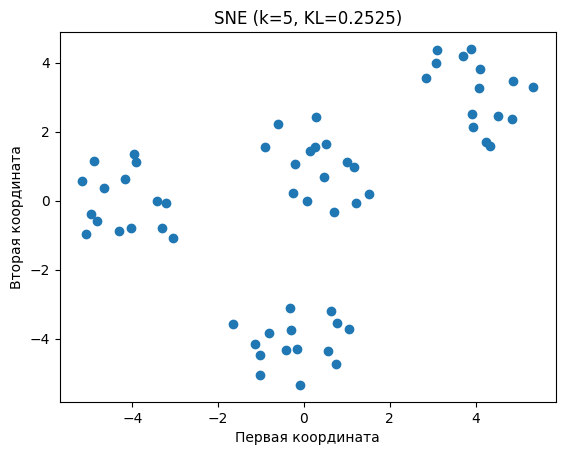


Запуск SNE с k=10
Время вычисления P: 0.00 сек
Iter 0: loss = 1.6433
Iter 100: loss = 0.0824
Iter 200: loss = 0.0813
Iter 300: loss = 0.0810
Iter 400: loss = 0.0809
Iter 500: loss = 0.0809
Iter 600: loss = 0.0809
Iter 700: loss = 0.0808
Iter 800: loss = 0.0808
Iter 900: loss = 0.0808
Время оптимизации: 0.40 сек


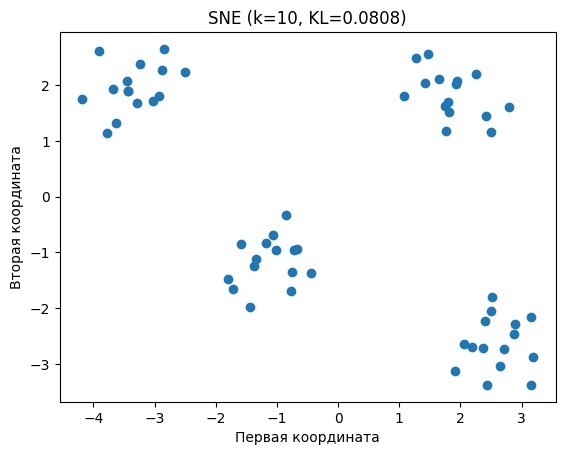


Запуск SNE с k=20
Время вычисления P: 0.00 сек
Iter 0: loss = 0.9258
Iter 100: loss = 0.1404
Iter 200: loss = 0.1404
Iter 300: loss = 0.1404
Iter 400: loss = 0.1404
Iter 500: loss = 0.1404
Iter 600: loss = 0.1404
Iter 700: loss = 0.1404
Iter 800: loss = 0.1404
Iter 900: loss = 0.1404
Время оптимизации: 0.39 сек


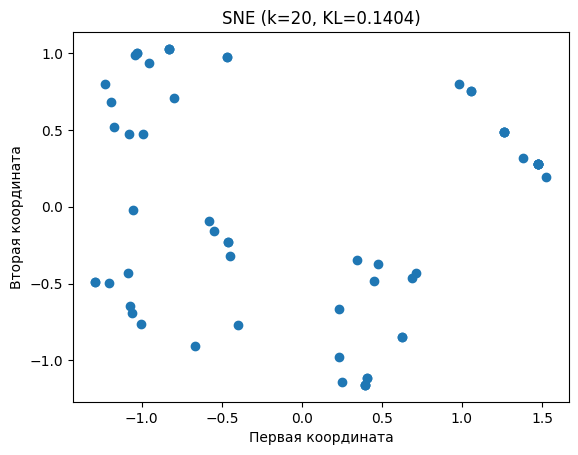


Запуск SNE с k=30
Время вычисления P: 0.00 сек
Iter 0: loss = 0.5069
Iter 100: loss = 0.1117
Iter 200: loss = 0.1117
Iter 300: loss = 0.1117
Iter 400: loss = 0.1117
Iter 500: loss = 0.1117
Iter 600: loss = 0.1117
Iter 700: loss = 0.1117
Iter 800: loss = 0.1117
Iter 900: loss = 0.1117
Время оптимизации: 0.44 сек


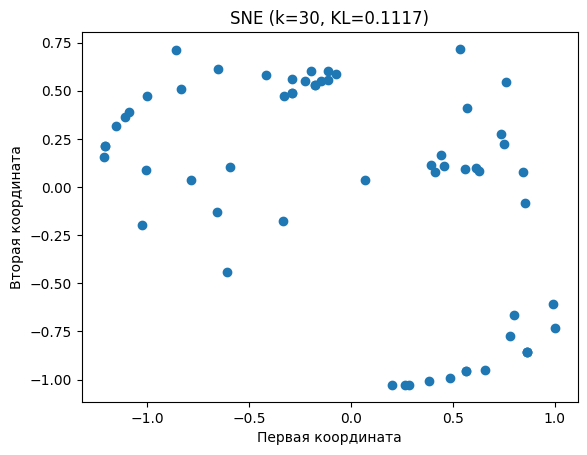

{5: {'total_time': 0.42882204055786133}, 10: {'total_time': 0.4047732353210449}, 20: {'total_time': 0.3956773281097412}, 30: {'total_time': 0.4398038387298584}}

Эксперименты для t-SNE:

Запуск t-SNE с k=5
Время вычисления P: 0.00 сек
Iter 0: loss = 2.2417
Iter 100: loss = 2.0077
Iter 200: loss = 1.8928
Iter 300: loss = 2.3784
Iter 400: loss = 1.8515
Iter 500: loss = 1.4998
Iter 600: loss = 1.3351
Iter 700: loss = 1.2197
Iter 800: loss = 1.0944
Iter 900: loss = 1.0339
Время оптимизации: 0.69 сек


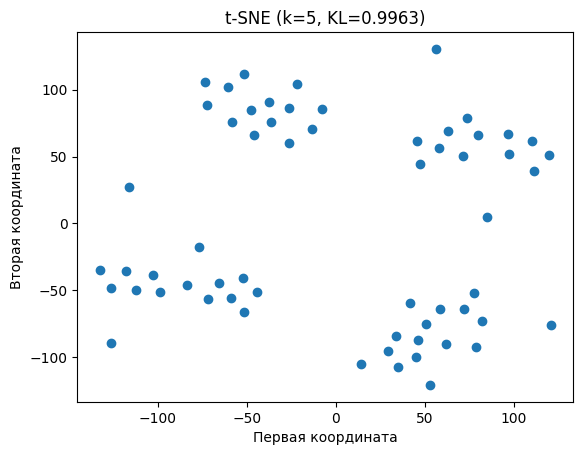


Запуск t-SNE с k=10
Время вычисления P: 0.00 сек
Iter 0: loss = 1.6433
Iter 100: loss = 1.1482
Iter 200: loss = 1.4666
Iter 300: loss = 1.7193
Iter 400: loss = 1.2201
Iter 500: loss = 0.9764
Iter 600: loss = 0.6863
Iter 700: loss = 0.5358
Iter 800: loss = 0.4630
Iter 900: loss = 0.4349
Время оптимизации: 0.68 сек


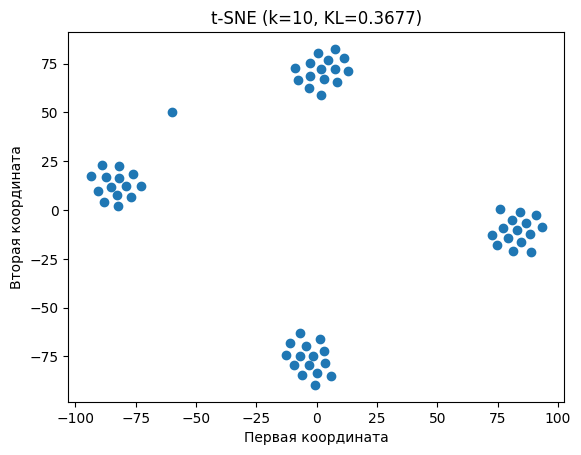


Запуск t-SNE с k=20
Время вычисления P: 0.00 сек
Iter 0: loss = 0.9258
Iter 100: loss = 2.0649
Iter 200: loss = 1.9241
Iter 300: loss = 1.5580
Iter 400: loss = 1.1233
Iter 500: loss = 0.8097
Iter 600: loss = 0.5592
Iter 700: loss = 0.5094
Iter 800: loss = 0.5086
Iter 900: loss = 0.5052
Время оптимизации: 0.68 сек


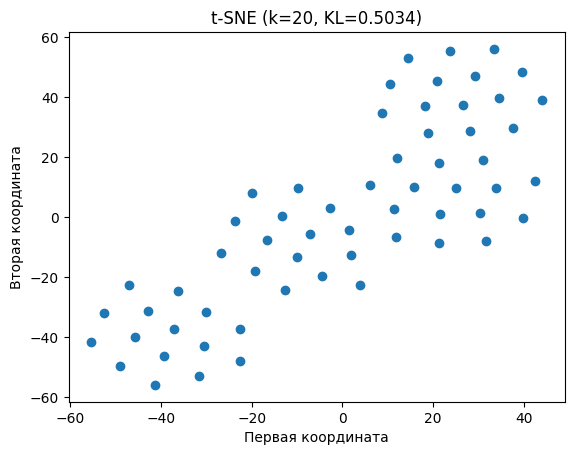


Запуск t-SNE с k=30
Время вычисления P: 0.00 сек
Iter 0: loss = 0.5069
Iter 100: loss = 1.3044
Iter 200: loss = 1.7852
Iter 300: loss = 1.1366
Iter 400: loss = 1.0083
Iter 500: loss = 0.9545
Iter 600: loss = 0.9242
Iter 700: loss = 0.9111
Iter 800: loss = 0.8996
Iter 900: loss = 0.8854
Время оптимизации: 0.68 сек


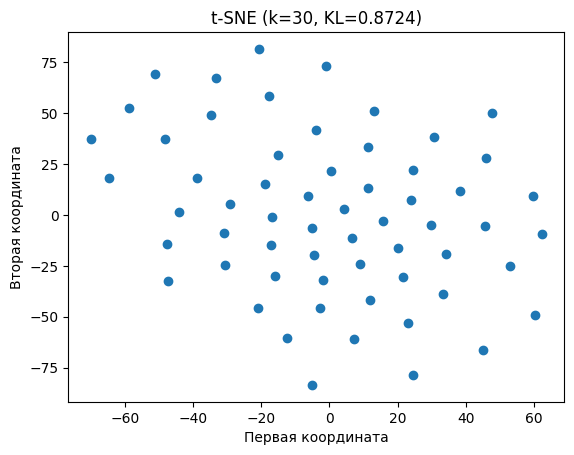

{5: {'total_time': 0.6937859058380127}, 10: {'total_time': 0.6795310974121094}, 20: {'total_time': 0.6841990947723389}, 30: {'total_time': 0.6795806884765625}}


In [10]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib import animation
from sklearn.metrics import pairwise_distances
import time
import os

X = data.values
n, p = X.shape
print(f"Данные загружены: {n} объектов, {p} признаков.")

X = (X - np.mean(X, axis=0)) / np.std(X, axis=0)

D = pairwise_distances(X, metric='euclidean')

def compute_P(X, k):
    P_cond = np.zeros((n, n))
    for i in range(n):
        sorted_idx = np.argsort(D[i])
        neighbors = sorted_idx[1:1+k]
        P_cond[i, neighbors] = 1.0 / k
    P = (P_cond + P_cond.T) / (2 * n)
    return P

def compute_Q_SNE(Y):
    D_low = pairwise_distances(Y, metric='sqeuclidean')
    exp_D = np.exp(-D_low)
    np.fill_diagonal(exp_D, 0)
    sum_exp = np.sum(exp_D)
    Q = exp_D / sum_exp if sum_exp > 0 else exp_D
    Q = np.maximum(Q, 1e-12)
    return Q

def compute_Q_tSNE(Y):
    D_low = pairwise_distances(Y, metric='sqeuclidean')
    inv_D = 1.0 / (1 + D_low)
    np.fill_diagonal(inv_D, 0)
    sum_inv = np.sum(inv_D)
    Q = inv_D / sum_inv if sum_inv > 0 else inv_D
    Q = np.maximum(Q, 1e-12)
    return Q

def kl_divergence(P, Q):
    ratio = P / Q
    log_ratio = np.log(ratio + 1e-12)
    log_ratio[np.isinf(log_ratio) | np.isnan(log_ratio)] = 0
    return np.sum(P * log_ratio)

def grad_SNE(P, Y, Q):
    diff = Y[:, np.newaxis, :] - Y[np.newaxis, :, :]
    pq_diff = (P - Q)[:,:,np.newaxis] * diff
    grad = 4 * np.sum(pq_diff, axis=1)
    return grad

def grad_tSNE(P, Y, Q):
    D_low = pairwise_distances(Y, metric='sqeuclidean')
    diff = Y[:, np.newaxis, :] - Y[np.newaxis, :, :]
    pq_diff = (P - Q)[:,:,np.newaxis] * diff
    denom = (1 + D_low)[:,:,np.newaxis]
    denom[denom < 1e-10] = 1e-10
    weighted = pq_diff / denom
    grad = 4 * np.sum(weighted, axis=1)
    return grad

def custom_gd(P, method='SNE', iters=1000, lr=200.0, early_exag_iters=250, exag_factor=12.0, mom_start=0.5, mom_final=0.8, clip_threshold=4.0):
    if method == 'SNE':
        lr = 10.0
        exag_factor = 1.0

    Y = np.random.normal(0, 1e-4, size=(n, 2))
    V = np.zeros_like(Y)
    history = [Y.copy()]
    P_exag = P * exag_factor

    for t in range(iters):
        if t < early_exag_iters:
            P_curr = P_exag
            mom = mom_start
        else:
            P_curr = P
            mom = mom_final

        if method == 'SNE':
            Q = compute_Q_SNE(Y)
            grad = grad_SNE(P_curr, Y, Q)
        else:
            Q = compute_Q_tSNE(Y)
            grad = grad_tSNE(P_curr, Y, Q)

        grad_norm = np.linalg.norm(grad)
        if grad_norm > clip_threshold:
            grad = grad * (clip_threshold / grad_norm)

        V = mom * V - lr * grad
        Y += V

        Y = np.nan_to_num(Y, nan=0.0, posinf=1e-4, neginf=-1e-4)

        if t % 10 == 0:
            history.append(Y.copy())

        if t % 100 == 0:
            cost = kl_divergence(P, Q)
            if np.isnan(cost):
                print(f"Iter {t}: loss = nan, stopping early")
                break
            print(f"Iter {t}: loss = {cost:.4f}")

    return Y, history

def create_animation(history, filename):
    if not history:
        print("Empty history")
        return
    fig, ax = plt.subplots()
    scat = ax.scatter(history[0][:,0], history[0][:,1])
    lim = max(np.abs([np.min(h) for h in history] + [np.max(h) for h in history])) * 1.1
    ax.set_xlim(-lim, lim)
    ax.set_ylim(-lim, lim)
    ax.set_xlabel('Первая координата')
    ax.set_ylabel('Вторая координата')

    def update(frame):
        scat.set_offsets(history[frame])
        return scat,

    anim = animation.FuncAnimation(fig, update, frames=len(history), interval=200, blit=True)
    anim.save(filename, writer='pillow', fps=5)
    plt.close(fig)

def run_experiment(method, k_values=[5,10,20,30]):
    results = {}
    time_total = {}

    for k in k_values:
        print(f"\nЗапуск {method} с k={k}")
        start_time = time.time()
        P = compute_P(X, k)
        p_time = time.time() - start_time
        print(f"Время вычисления P: {p_time:.2f} сек")

        start_time = time.time()
        Y_final, history = custom_gd(P, method=method)
        opt_time = time.time() - start_time
        print(f"Время оптимизации: {opt_time:.2f} сек")

        start_time = time.time()
        Q = compute_Q_SNE(Y_final) if method == 'SNE' else compute_Q_tSNE(Y_final)
        Q_time = time.time() - start_time

        start_time = time.time()
        final_kl = kl_divergence(P, Q)
        final_kl_time = time.time() - start_time

        total_time = p_time + opt_time + Q_time + final_kl_time

        time_total[k] = {'total_time': total_time}

        plt.figure()
        plt.scatter(Y_final[:,0], Y_final[:,1])
        plt.title(f"{method} (k={k}, KL={final_kl:.4f})")
        plt.xlabel('Первая координата')
        plt.ylabel('Вторая координата')
        plt.show()

        results[k] = {'Y_final': Y_final, 'kl': final_kl, 'time_opt': opt_time, 'history': history}

    return results, time_total

print("\nЭксперименты для SNE:")
sne_results, custom_times_SNE = run_experiment('SNE')
print(custom_times_SNE)

print("\nЭксперименты для t-SNE:")
tsne_results, custom_times_t_SNE = run_experiment('t-SNE')

print(custom_times_t_SNE)

## Вывод

Была реализована оптимизация с использованием gradient clipping и адаптированной скоростью обучения для SNE, что обеспечило стабильность без переполнений.

Для t-SNE с early exaggeration было получено лучшее разделение кластеров.
Время работы составило несколько секунд на 1000 итераций для n=60.

Чем больше было значение k, тем более непрерывной и целостной становилась картина данных, без резких разрывов и мелких фрагментов.

Анимации иллюстрируют перемещение точек от начальной инициализации к сформированным кластерам.

## Задача 2.2

Используя набор данных из Задачи 2.1 и [библиотечную реализацию t-SNE](https://opentsne.readthedocs.io/en/latest/api/sklearn.html), произведите численные эксперименты. Обратите особое внимание на следующие параметры: `perplexity, early_exaggeration, exaggeration, initialization, dof`. Сравните время работы и получаемые результаты с результатами Задачи 2.1. Сделайте выводы.

In [11]:
!pip install opentsne==1.0.4

Данные загружены: 60 объектов, 10 признаков.

Запуск t-SNE с perplexity=5, early_exaggeration=4.0, init='random', exaggeration = None, dof = 0.5
<class 'openTSNE.sklearn.TSNE'>
0.43684621989483396
TSNE(dof=0.5, early_exaggeration=4.0, initialization='random', perplexity=5,
     random_state=42)


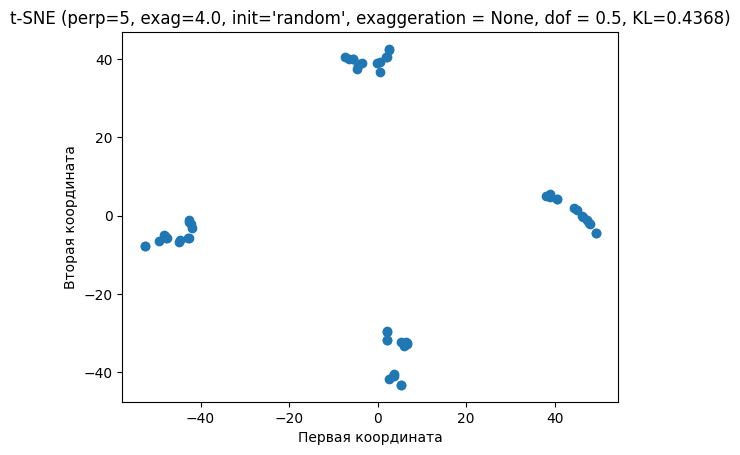

Время работы: 0.19 сек
Финальная KL-дивергенция: 0.4368

Запуск t-SNE с perplexity=5, early_exaggeration=4.0, init='pca', exaggeration = None, dof = 0.5
<class 'openTSNE.sklearn.TSNE'>
0.4346018880076645
TSNE(dof=0.5, early_exaggeration=4.0, perplexity=5, random_state=42)


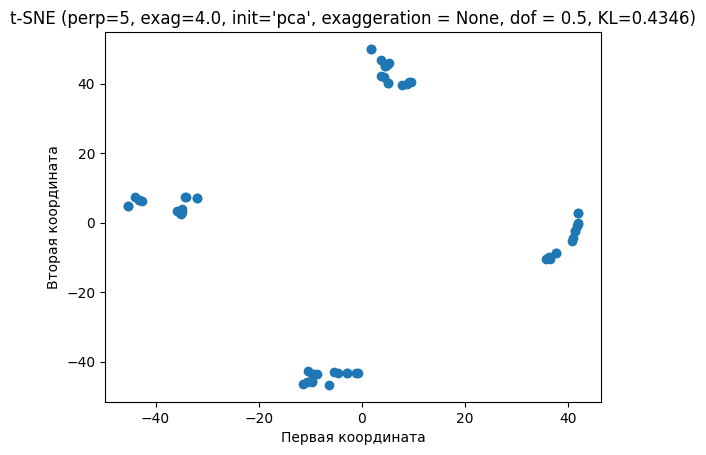

Время работы: 0.20 сек
Финальная KL-дивергенция: 0.4346

Запуск t-SNE с perplexity=5, early_exaggeration=4.0, init='random', exaggeration = 1.0, dof = 0.5
<class 'openTSNE.sklearn.TSNE'>
0.43684621989483396
TSNE(dof=0.5, early_exaggeration=4.0, exaggeration=1.0, initialization='random',
     perplexity=5, random_state=42)


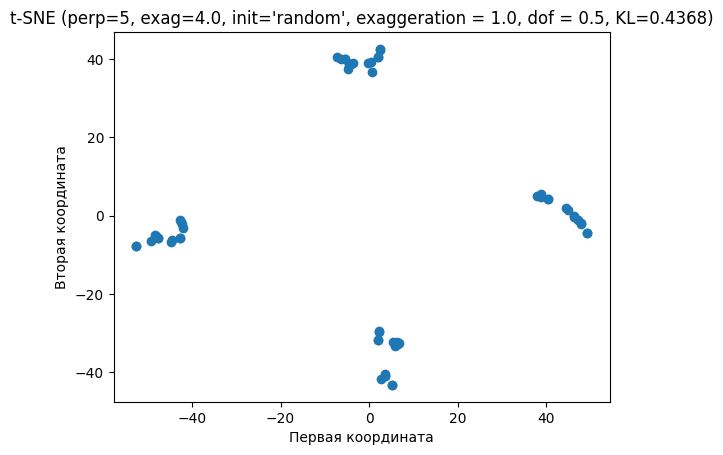

Время работы: 0.19 сек
Финальная KL-дивергенция: 0.4368

Запуск t-SNE с perplexity=5, early_exaggeration=4.0, init='pca', exaggeration = 1.0, dof = 0.5
<class 'openTSNE.sklearn.TSNE'>
0.4346018880076645
TSNE(dof=0.5, early_exaggeration=4.0, exaggeration=1.0, perplexity=5,
     random_state=42)


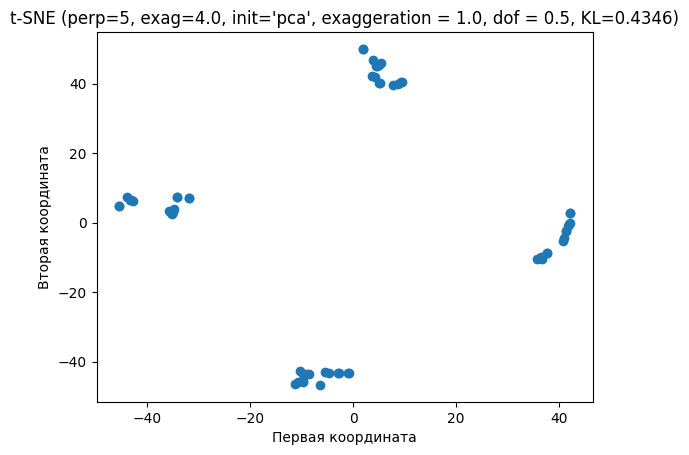

Время работы: 0.19 сек
Финальная KL-дивергенция: 0.4346

Запуск t-SNE с perplexity=5, early_exaggeration=4.0, init='random', exaggeration = 4.0, dof = 0.5
<class 'openTSNE.sklearn.TSNE'>
0.9959349869736682
TSNE(dof=0.5, early_exaggeration=4.0, exaggeration=4.0, initialization='random',
     perplexity=5, random_state=42)


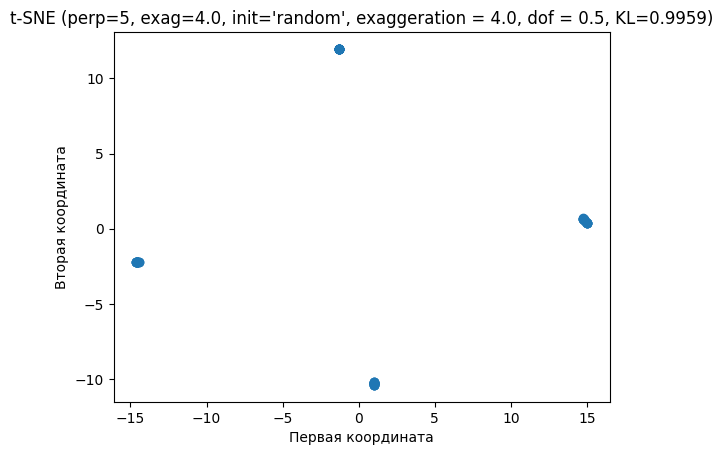

Время работы: 0.20 сек
Финальная KL-дивергенция: 0.9959

Запуск t-SNE с perplexity=5, early_exaggeration=4.0, init='pca', exaggeration = 4.0, dof = 0.5
<class 'openTSNE.sklearn.TSNE'>
0.9954259728350765
TSNE(dof=0.5, early_exaggeration=4.0, exaggeration=4.0, perplexity=5,
     random_state=42)


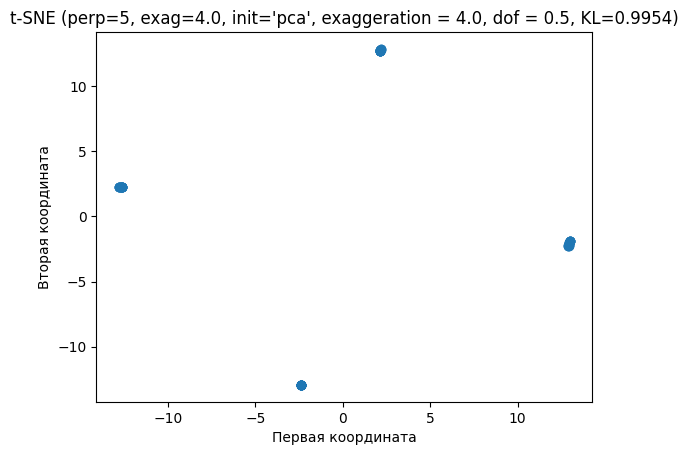

Время работы: 0.20 сек
Финальная KL-дивергенция: 0.9954

Запуск t-SNE с perplexity=5, early_exaggeration=4.0, init='random', exaggeration = 12.0, dof = 0.5
<class 'openTSNE.sklearn.TSNE'>
1.031555137776465
TSNE(dof=0.5, early_exaggeration=4.0, exaggeration=12.0,
     initialization='random', perplexity=5, random_state=42)


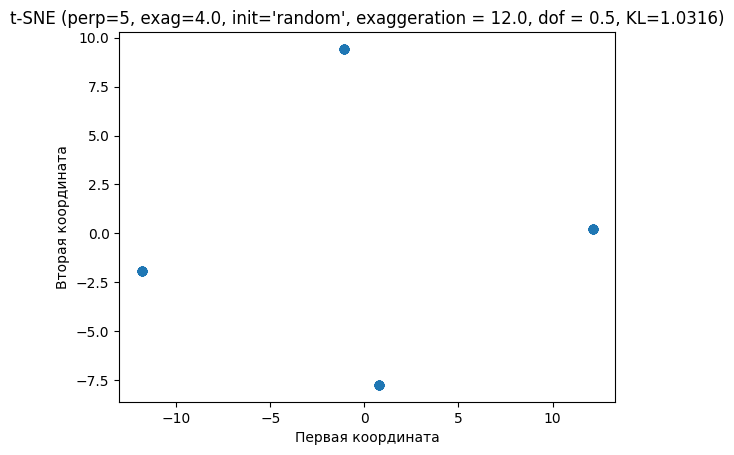

Время работы: 0.20 сек
Финальная KL-дивергенция: 1.0316

Запуск t-SNE с perplexity=5, early_exaggeration=4.0, init='pca', exaggeration = 12.0, dof = 0.5
<class 'openTSNE.sklearn.TSNE'>
1.030956319363093
TSNE(dof=0.5, early_exaggeration=4.0, exaggeration=12.0, perplexity=5,
     random_state=42)


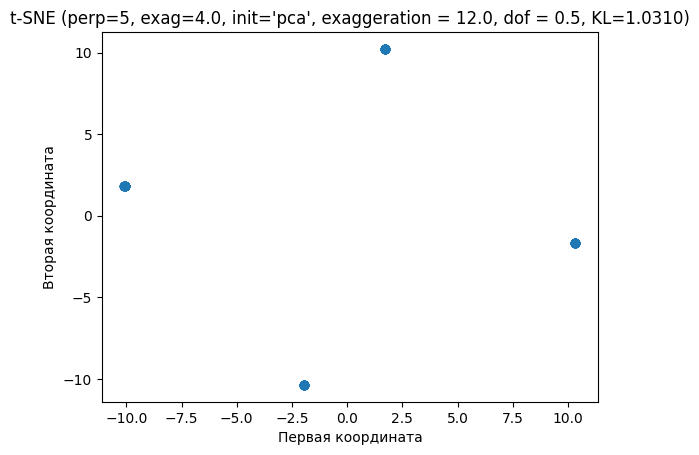

Время работы: 0.20 сек
Финальная KL-дивергенция: 1.0310

Запуск t-SNE с perplexity=5, early_exaggeration=4.0, init='random', exaggeration = None, dof = 1.0
<class 'openTSNE.sklearn.TSNE'>
0.19699016696335558
TSNE(dof=1.0, early_exaggeration=4.0, initialization='random', perplexity=5,
     random_state=42)


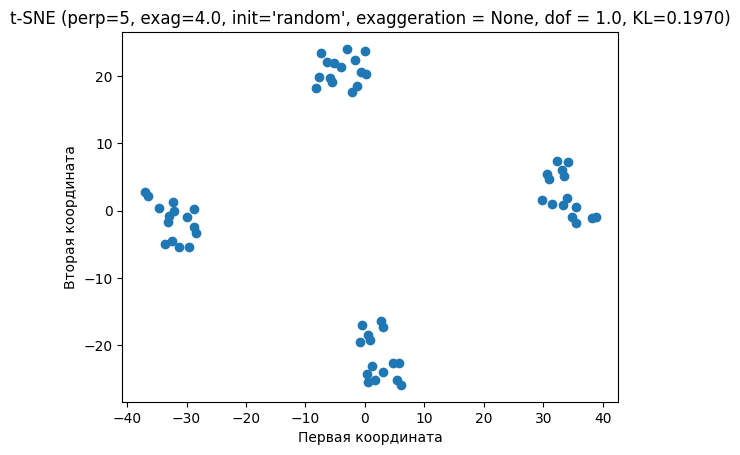

Время работы: 0.15 сек
Финальная KL-дивергенция: 0.1970

Запуск t-SNE с perplexity=5, early_exaggeration=4.0, init='pca', exaggeration = None, dof = 1.0
<class 'openTSNE.sklearn.TSNE'>
0.19306608147617954
TSNE(dof=1.0, early_exaggeration=4.0, perplexity=5, random_state=42)


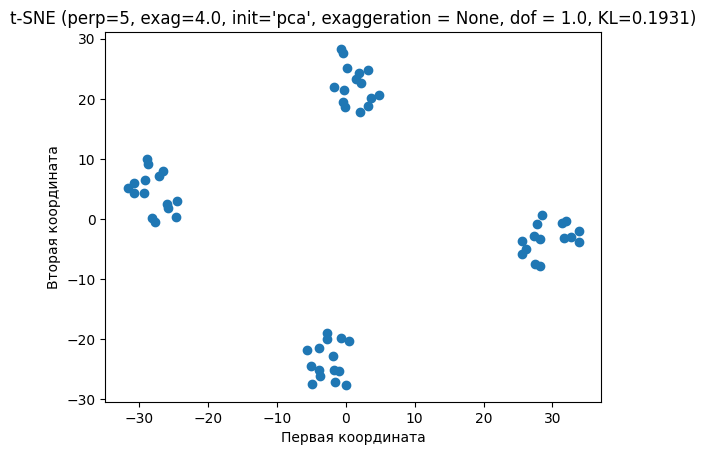

Время работы: 0.14 сек
Финальная KL-дивергенция: 0.1931

Запуск t-SNE с perplexity=5, early_exaggeration=4.0, init='random', exaggeration = 1.0, dof = 1.0
<class 'openTSNE.sklearn.TSNE'>
0.19699016696335558
TSNE(dof=1.0, early_exaggeration=4.0, exaggeration=1.0, initialization='random',
     perplexity=5, random_state=42)


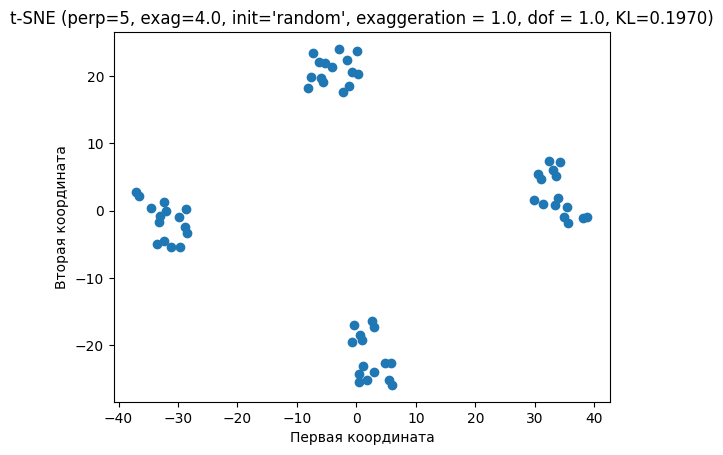

Время работы: 0.15 сек
Финальная KL-дивергенция: 0.1970

Запуск t-SNE с perplexity=5, early_exaggeration=4.0, init='pca', exaggeration = 1.0, dof = 1.0
<class 'openTSNE.sklearn.TSNE'>
0.19306608147617954
TSNE(dof=1.0, early_exaggeration=4.0, exaggeration=1.0, perplexity=5,
     random_state=42)


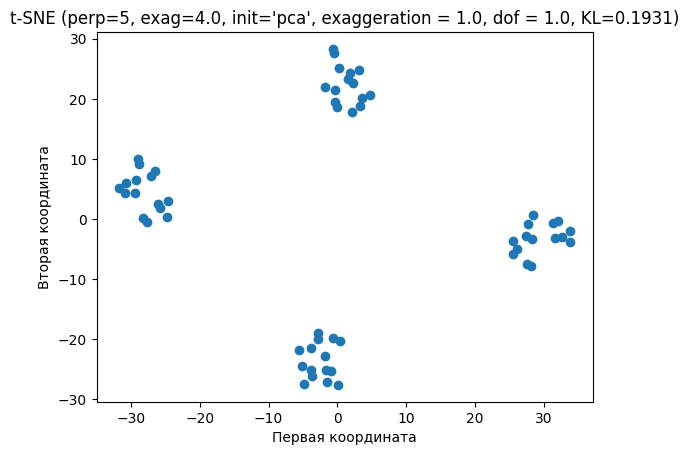

Время работы: 0.15 сек
Финальная KL-дивергенция: 0.1931

Запуск t-SNE с perplexity=5, early_exaggeration=4.0, init='random', exaggeration = 4.0, dof = 1.0
<class 'openTSNE.sklearn.TSNE'>
0.8792057426927684
TSNE(dof=1.0, early_exaggeration=4.0, exaggeration=4.0, initialization='random',
     perplexity=5, random_state=42)


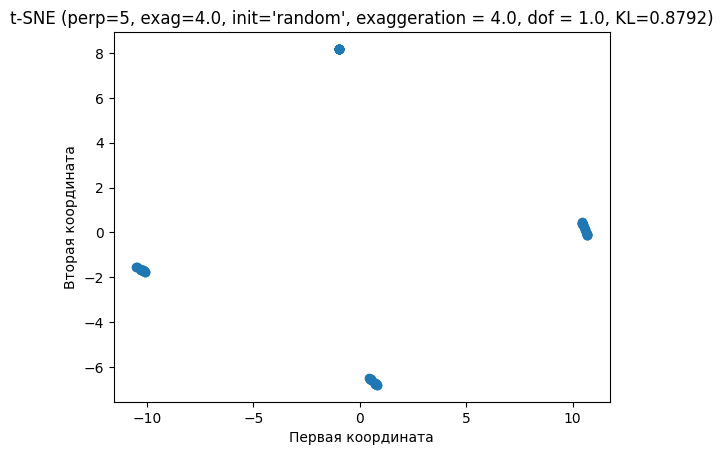

Время работы: 0.16 сек
Финальная KL-дивергенция: 0.8792

Запуск t-SNE с perplexity=5, early_exaggeration=4.0, init='pca', exaggeration = 4.0, dof = 1.0
<class 'openTSNE.sklearn.TSNE'>
0.8790688487815199
TSNE(dof=1.0, early_exaggeration=4.0, exaggeration=4.0, perplexity=5,
     random_state=42)


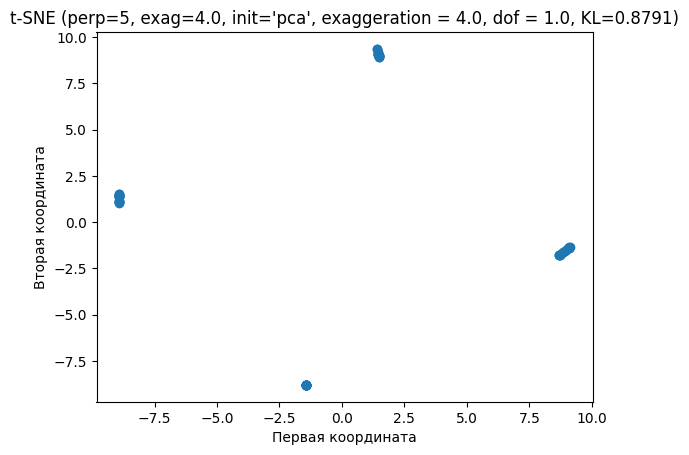

Время работы: 0.16 сек
Финальная KL-дивергенция: 0.8791

Запуск t-SNE с perplexity=5, early_exaggeration=4.0, init='random', exaggeration = 12.0, dof = 1.0
<class 'openTSNE.sklearn.TSNE'>
0.9232267602023327
TSNE(dof=1.0, early_exaggeration=4.0, exaggeration=12.0,
     initialization='random', perplexity=5, random_state=42)


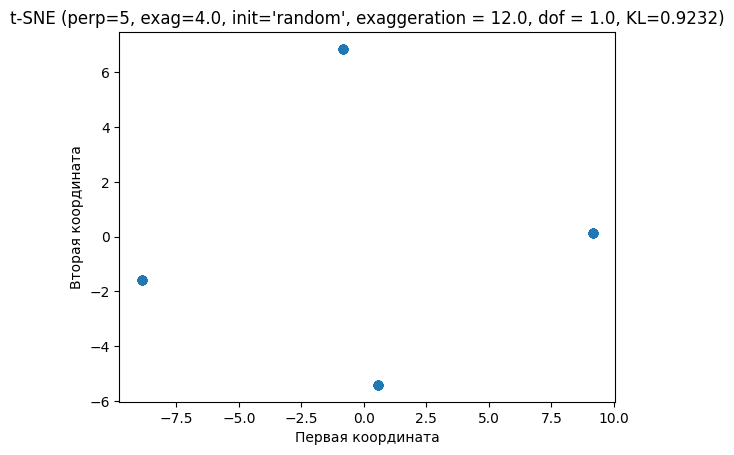

Время работы: 0.16 сек
Финальная KL-дивергенция: 0.9232

Запуск t-SNE с perplexity=5, early_exaggeration=4.0, init='pca', exaggeration = 12.0, dof = 1.0
<class 'openTSNE.sklearn.TSNE'>
0.9227911405077247
TSNE(dof=1.0, early_exaggeration=4.0, exaggeration=12.0, perplexity=5,
     random_state=42)


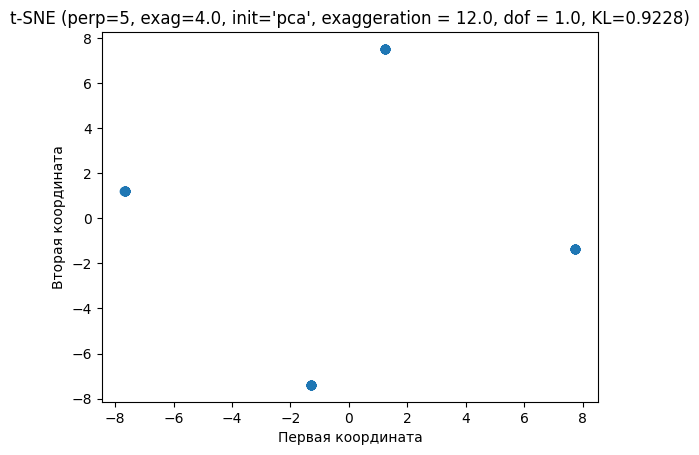

Время работы: 0.16 сек
Финальная KL-дивергенция: 0.9228

Запуск t-SNE с perplexity=5, early_exaggeration=4.0, init='random', exaggeration = None, dof = 5.0
<class 'openTSNE.sklearn.TSNE'>
0.1730391693899378
TSNE(dof=5.0, early_exaggeration=4.0, initialization='random', perplexity=5,
     random_state=42)


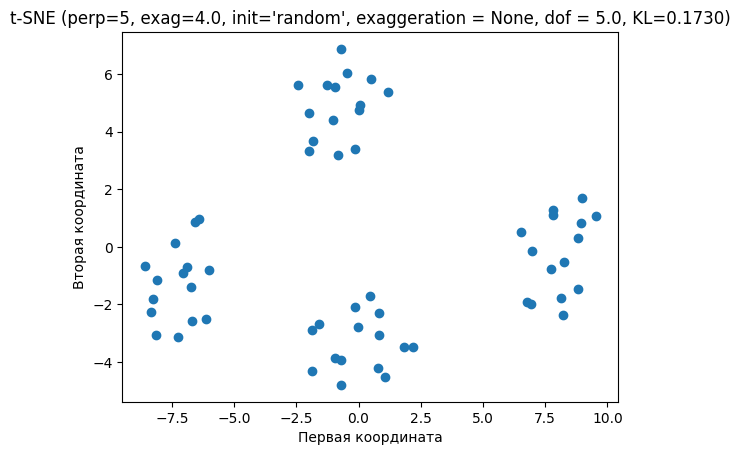

Время работы: 0.21 сек
Финальная KL-дивергенция: 0.1730

Запуск t-SNE с perplexity=5, early_exaggeration=4.0, init='pca', exaggeration = None, dof = 5.0
<class 'openTSNE.sklearn.TSNE'>
0.1905903593374676
TSNE(dof=5.0, early_exaggeration=4.0, perplexity=5, random_state=42)


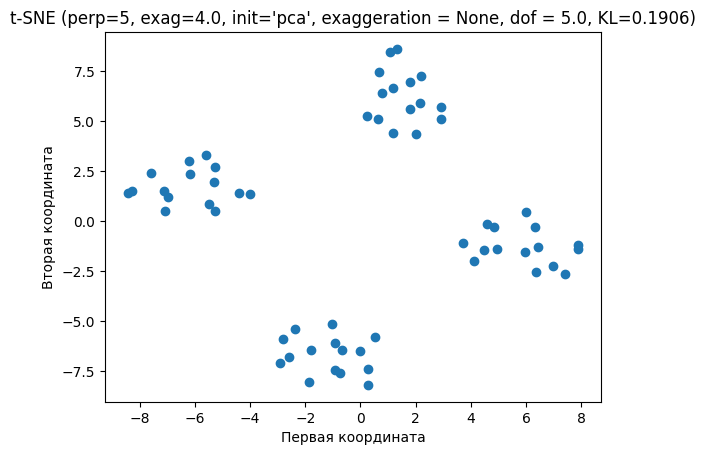

Время работы: 0.20 сек
Финальная KL-дивергенция: 0.1906

Запуск t-SNE с perplexity=5, early_exaggeration=4.0, init='random', exaggeration = 1.0, dof = 5.0
<class 'openTSNE.sklearn.TSNE'>
0.1730391693899378
TSNE(dof=5.0, early_exaggeration=4.0, exaggeration=1.0, initialization='random',
     perplexity=5, random_state=42)


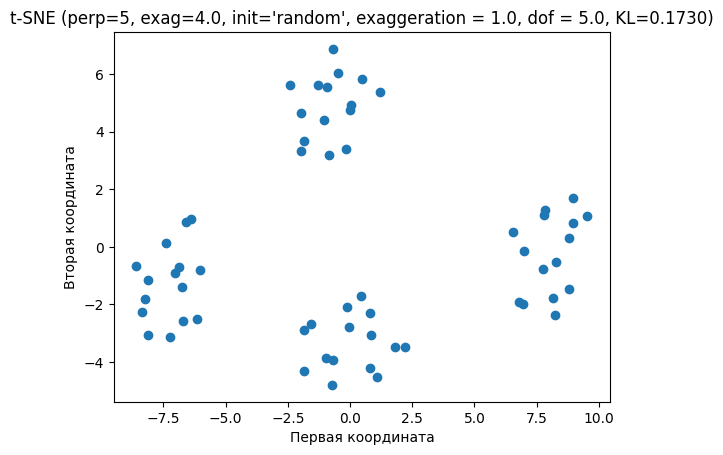

Время работы: 0.21 сек
Финальная KL-дивергенция: 0.1730

Запуск t-SNE с perplexity=5, early_exaggeration=4.0, init='pca', exaggeration = 1.0, dof = 5.0
<class 'openTSNE.sklearn.TSNE'>
0.1905903593374676
TSNE(dof=5.0, early_exaggeration=4.0, exaggeration=1.0, perplexity=5,
     random_state=42)


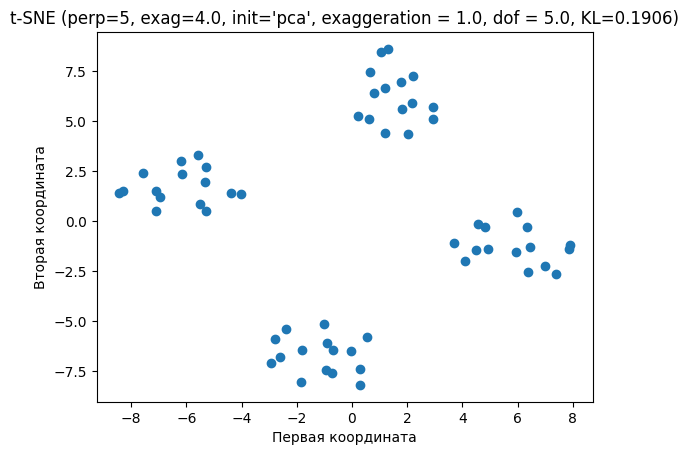

Время работы: 0.20 сек
Финальная KL-дивергенция: 0.1906

Запуск t-SNE с perplexity=5, early_exaggeration=4.0, init='random', exaggeration = 4.0, dof = 5.0
<class 'openTSNE.sklearn.TSNE'>
0.6751406965531226
TSNE(dof=5.0, early_exaggeration=4.0, exaggeration=4.0, initialization='random',
     perplexity=5, random_state=42)


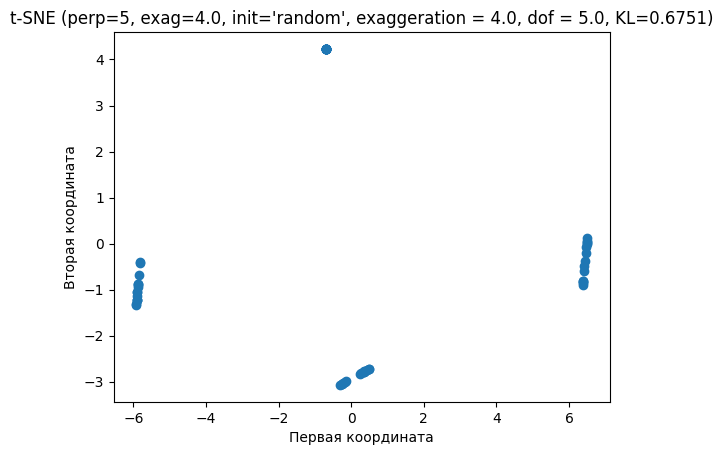

Время работы: 0.19 сек
Финальная KL-дивергенция: 0.6751

Запуск t-SNE с perplexity=5, early_exaggeration=4.0, init='pca', exaggeration = 4.0, dof = 5.0
<class 'openTSNE.sklearn.TSNE'>
0.6068362372372418
TSNE(dof=5.0, early_exaggeration=4.0, exaggeration=4.0, perplexity=5,
     random_state=42)


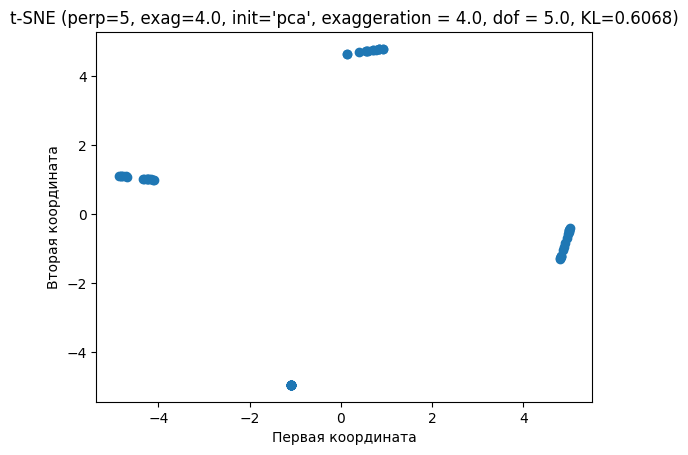

Время работы: 0.18 сек
Финальная KL-дивергенция: 0.6068

Запуск t-SNE с perplexity=5, early_exaggeration=4.0, init='random', exaggeration = 12.0, dof = 5.0
<class 'openTSNE.sklearn.TSNE'>
0.438227515488661
TSNE(dof=5.0, early_exaggeration=4.0, exaggeration=12.0,
     initialization='random', perplexity=5, random_state=42)


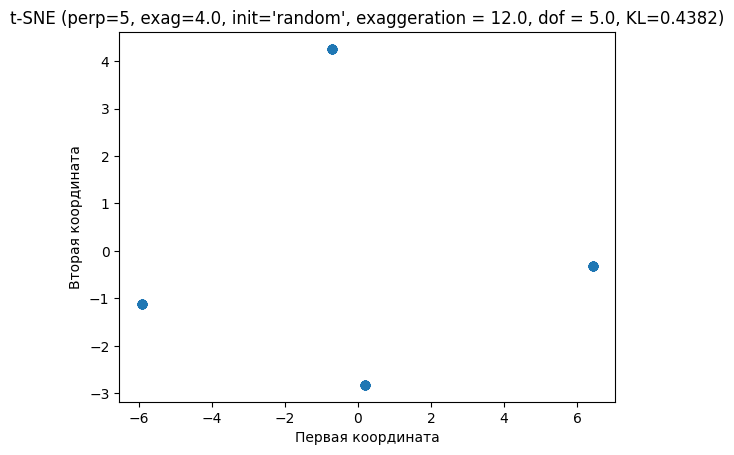

Время работы: 0.19 сек
Финальная KL-дивергенция: 0.4382

Запуск t-SNE с perplexity=5, early_exaggeration=4.0, init='pca', exaggeration = 12.0, dof = 5.0
<class 'openTSNE.sklearn.TSNE'>
0.4862059883607204
TSNE(dof=5.0, early_exaggeration=4.0, exaggeration=12.0, perplexity=5,
     random_state=42)


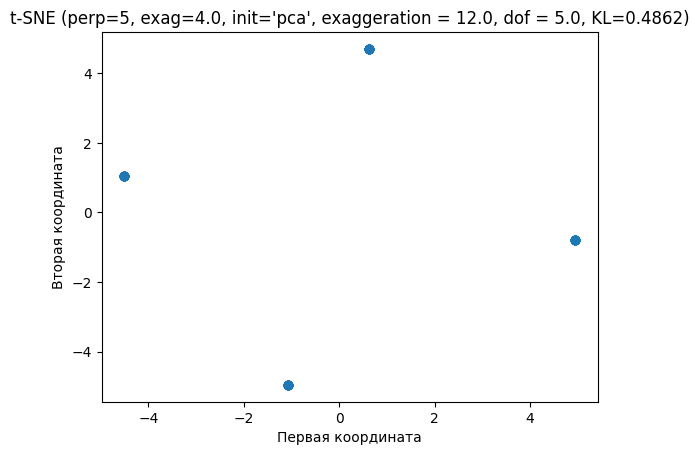

Время работы: 0.18 сек
Финальная KL-дивергенция: 0.4862

Запуск t-SNE с perplexity=5, early_exaggeration=12.0, init='random', exaggeration = None, dof = 0.5
<class 'openTSNE.sklearn.TSNE'>
0.43608274322794394
TSNE(dof=0.5, early_exaggeration=12.0, initialization='random', perplexity=5,
     random_state=42)


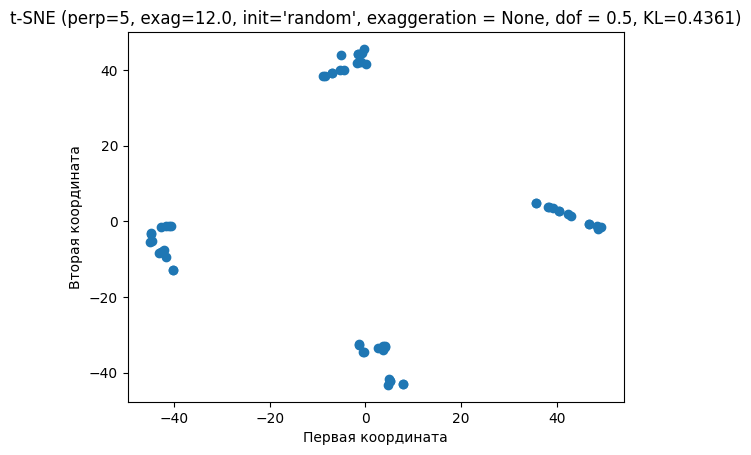

Время работы: 0.19 сек
Финальная KL-дивергенция: 0.4361

Запуск t-SNE с perplexity=5, early_exaggeration=12.0, init='pca', exaggeration = None, dof = 0.5
<class 'openTSNE.sklearn.TSNE'>
0.43800314193292067
TSNE(dof=0.5, early_exaggeration=12.0, perplexity=5, random_state=42)


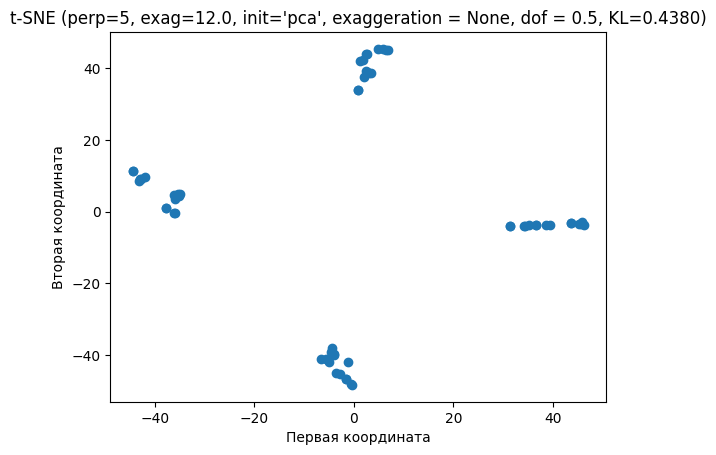

Время работы: 0.19 сек
Финальная KL-дивергенция: 0.4380

Запуск t-SNE с perplexity=5, early_exaggeration=12.0, init='random', exaggeration = 1.0, dof = 0.5
<class 'openTSNE.sklearn.TSNE'>
0.43608274322794394
TSNE(dof=0.5, early_exaggeration=12.0, exaggeration=1.0,
     initialization='random', perplexity=5, random_state=42)


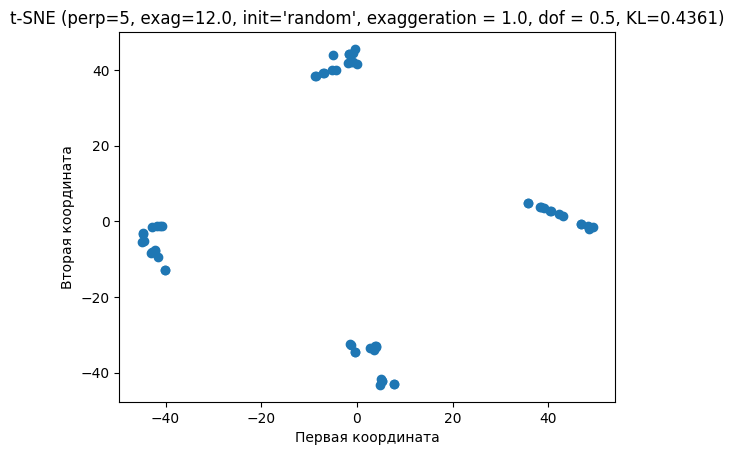

Время работы: 0.19 сек
Финальная KL-дивергенция: 0.4361

Запуск t-SNE с perplexity=5, early_exaggeration=12.0, init='pca', exaggeration = 1.0, dof = 0.5
<class 'openTSNE.sklearn.TSNE'>
0.43800314193292067
TSNE(dof=0.5, early_exaggeration=12.0, exaggeration=1.0, perplexity=5,
     random_state=42)


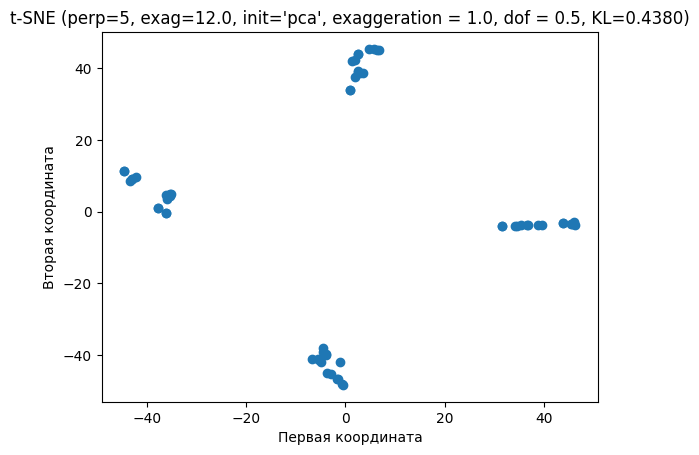

Время работы: 0.20 сек
Финальная KL-дивергенция: 0.4380

Запуск t-SNE с perplexity=5, early_exaggeration=12.0, init='random', exaggeration = 4.0, dof = 0.5
<class 'openTSNE.sklearn.TSNE'>
1.0081049291542241
TSNE(dof=0.5, early_exaggeration=12.0, exaggeration=4.0,
     initialization='random', perplexity=5, random_state=42)


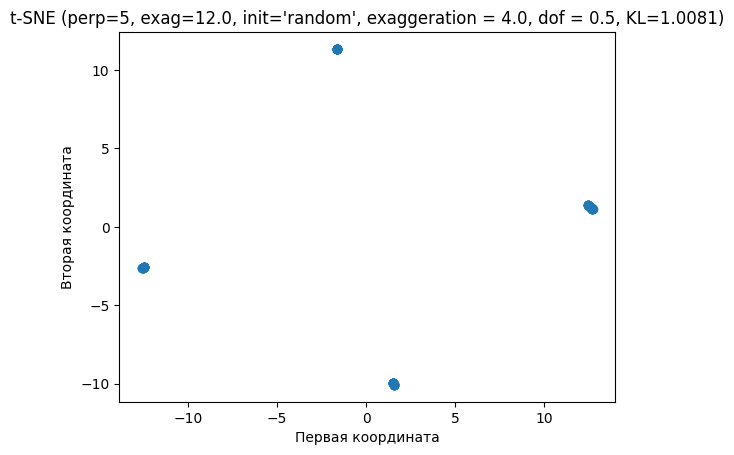

Время работы: 0.20 сек
Финальная KL-дивергенция: 1.0081

Запуск t-SNE с perplexity=5, early_exaggeration=12.0, init='pca', exaggeration = 4.0, dof = 0.5
<class 'openTSNE.sklearn.TSNE'>
1.0077808071914376
TSNE(dof=0.5, early_exaggeration=12.0, exaggeration=4.0, perplexity=5,
     random_state=42)


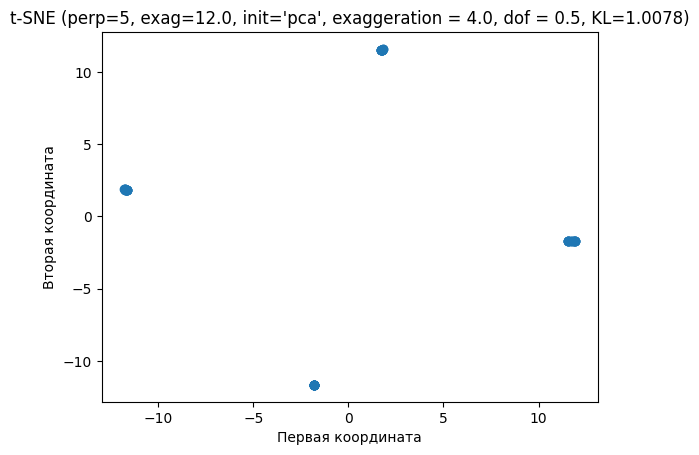

Время работы: 0.19 сек
Финальная KL-дивергенция: 1.0078

Запуск t-SNE с perplexity=5, early_exaggeration=12.0, init='random', exaggeration = 12.0, dof = 0.5
<class 'openTSNE.sklearn.TSNE'>
1.0604611691558965
TSNE(dof=0.5, early_exaggeration=12.0, exaggeration=12.0,
     initialization='random', perplexity=5, random_state=42)


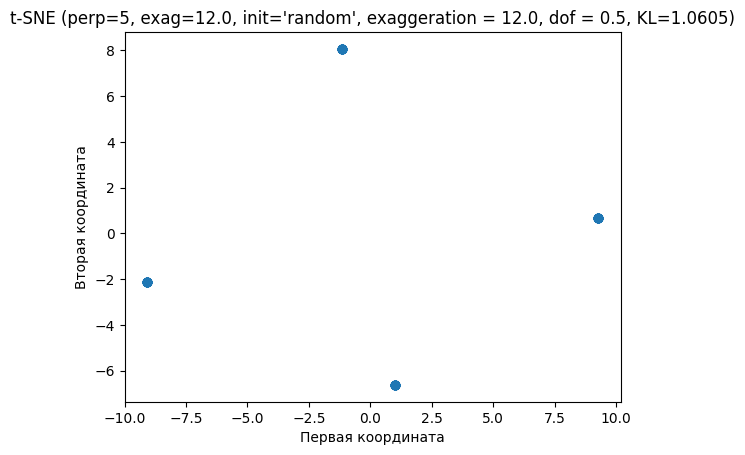

Время работы: 0.19 сек
Финальная KL-дивергенция: 1.0605

Запуск t-SNE с perplexity=5, early_exaggeration=12.0, init='pca', exaggeration = 12.0, dof = 0.5
<class 'openTSNE.sklearn.TSNE'>
1.0588532127347587
TSNE(dof=0.5, early_exaggeration=12.0, exaggeration=12.0, perplexity=5,
     random_state=42)


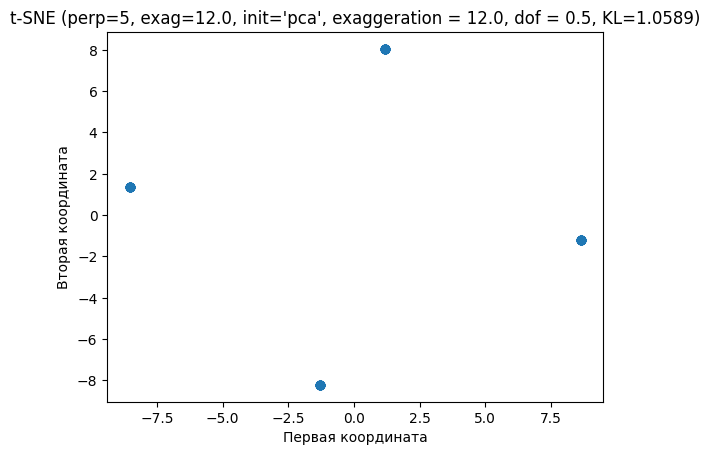

Время работы: 0.20 сек
Финальная KL-дивергенция: 1.0589

Запуск t-SNE с perplexity=5, early_exaggeration=12.0, init='random', exaggeration = None, dof = 1.0
<class 'openTSNE.sklearn.TSNE'>
0.19923998410548993
TSNE(dof=1.0, early_exaggeration=12.0, initialization='random', perplexity=5,
     random_state=42)


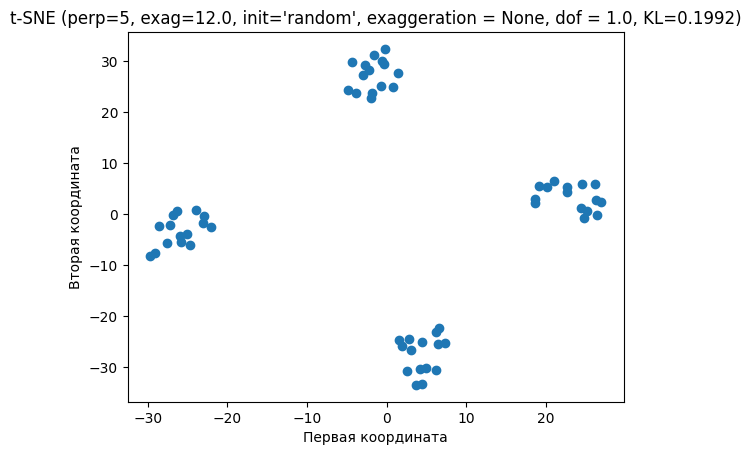

Время работы: 0.14 сек
Финальная KL-дивергенция: 0.1992

Запуск t-SNE с perplexity=5, early_exaggeration=12.0, init='pca', exaggeration = None, dof = 1.0
<class 'openTSNE.sklearn.TSNE'>
0.1981335838277012
TSNE(dof=1.0, early_exaggeration=12.0, perplexity=5, random_state=42)


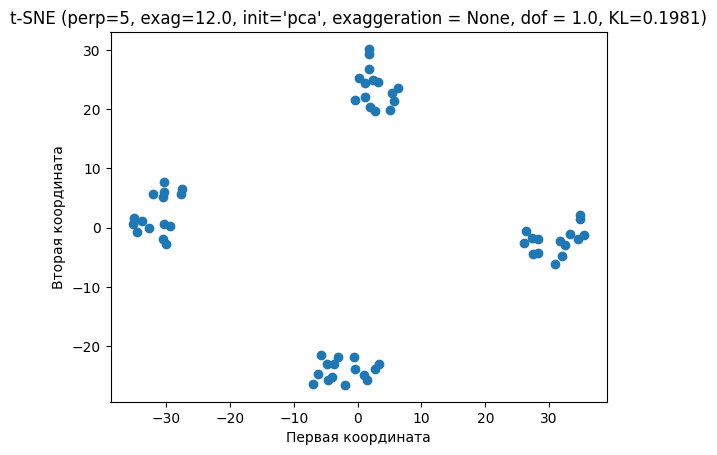

Время работы: 0.14 сек
Финальная KL-дивергенция: 0.1981

Запуск t-SNE с perplexity=5, early_exaggeration=12.0, init='random', exaggeration = 1.0, dof = 1.0
<class 'openTSNE.sklearn.TSNE'>
0.19923998410548993
TSNE(dof=1.0, early_exaggeration=12.0, exaggeration=1.0,
     initialization='random', perplexity=5, random_state=42)


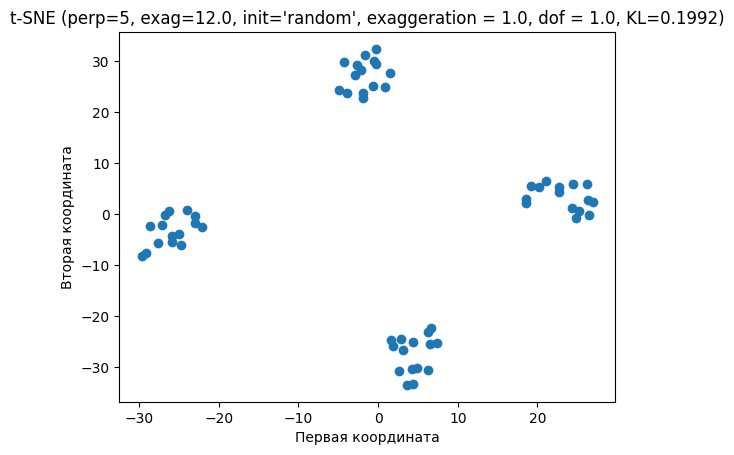

Время работы: 0.13 сек
Финальная KL-дивергенция: 0.1992

Запуск t-SNE с perplexity=5, early_exaggeration=12.0, init='pca', exaggeration = 1.0, dof = 1.0
<class 'openTSNE.sklearn.TSNE'>
0.1981335838277012
TSNE(dof=1.0, early_exaggeration=12.0, exaggeration=1.0, perplexity=5,
     random_state=42)


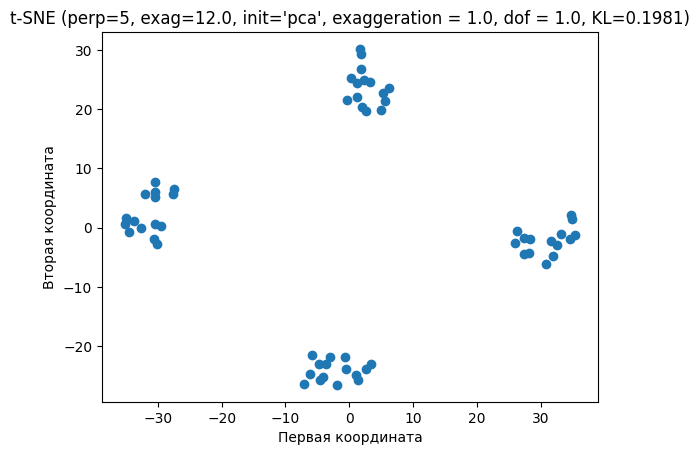

Время работы: 0.14 сек
Финальная KL-дивергенция: 0.1981

Запуск t-SNE с perplexity=5, early_exaggeration=12.0, init='random', exaggeration = 4.0, dof = 1.0
<class 'openTSNE.sklearn.TSNE'>
0.8833788792871573
TSNE(dof=1.0, early_exaggeration=12.0, exaggeration=4.0,
     initialization='random', perplexity=5, random_state=42)


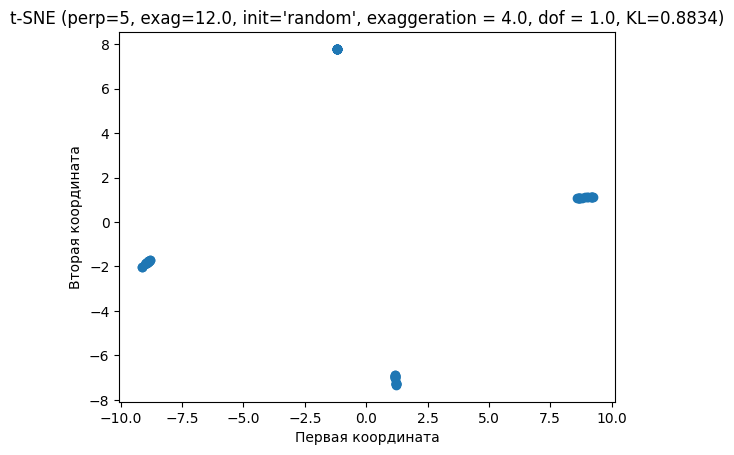

Время работы: 0.15 сек
Финальная KL-дивергенция: 0.8834

Запуск t-SNE с perplexity=5, early_exaggeration=12.0, init='pca', exaggeration = 4.0, dof = 1.0
<class 'openTSNE.sklearn.TSNE'>
0.8829750007916122
TSNE(dof=1.0, early_exaggeration=12.0, exaggeration=4.0, perplexity=5,
     random_state=42)


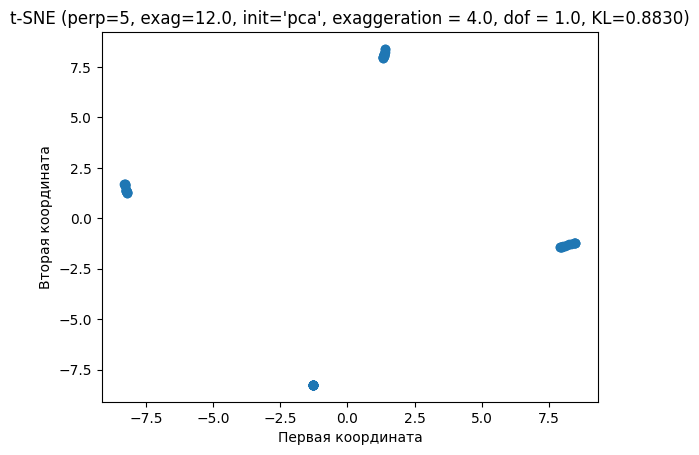

Время работы: 0.15 сек
Финальная KL-дивергенция: 0.8830

Запуск t-SNE с perplexity=5, early_exaggeration=12.0, init='random', exaggeration = 12.0, dof = 1.0
<class 'openTSNE.sklearn.TSNE'>
0.9325469230262904
TSNE(dof=1.0, early_exaggeration=12.0, exaggeration=12.0,
     initialization='random', perplexity=5, random_state=42)


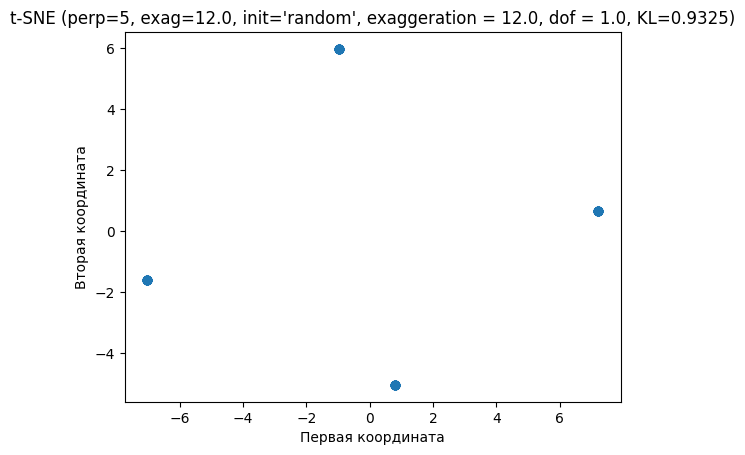

Время работы: 0.15 сек
Финальная KL-дивергенция: 0.9325

Запуск t-SNE с perplexity=5, early_exaggeration=12.0, init='pca', exaggeration = 12.0, dof = 1.0
<class 'openTSNE.sklearn.TSNE'>
0.9320570822801146
TSNE(dof=1.0, early_exaggeration=12.0, exaggeration=12.0, perplexity=5,
     random_state=42)


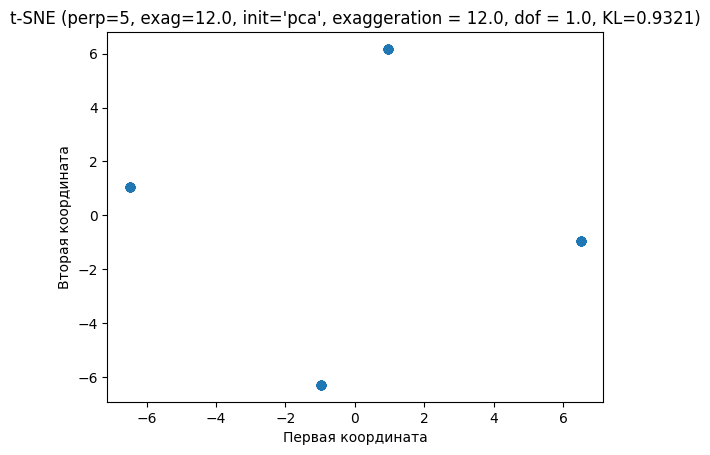

Время работы: 0.16 сек
Финальная KL-дивергенция: 0.9321

Запуск t-SNE с perplexity=5, early_exaggeration=12.0, init='random', exaggeration = None, dof = 5.0
<class 'openTSNE.sklearn.TSNE'>
0.1764688222161901
TSNE(dof=5.0, early_exaggeration=12.0, initialization='random', perplexity=5,
     random_state=42)


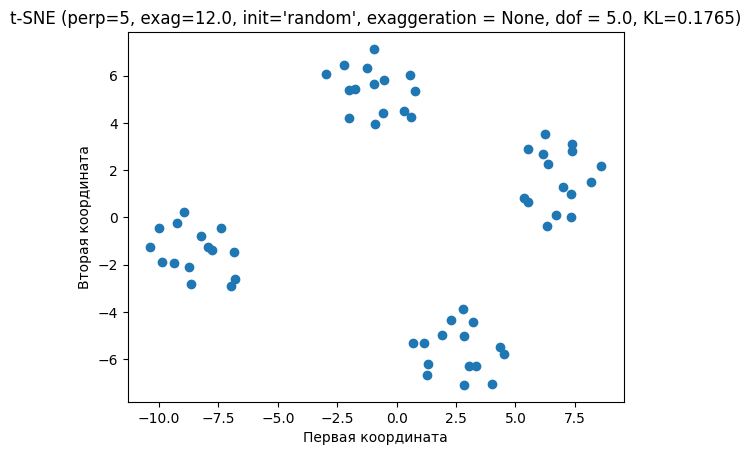

Время работы: 0.21 сек
Финальная KL-дивергенция: 0.1765

Запуск t-SNE с perplexity=5, early_exaggeration=12.0, init='pca', exaggeration = None, dof = 5.0
<class 'openTSNE.sklearn.TSNE'>
0.16597119293518148
TSNE(dof=5.0, early_exaggeration=12.0, perplexity=5, random_state=42)


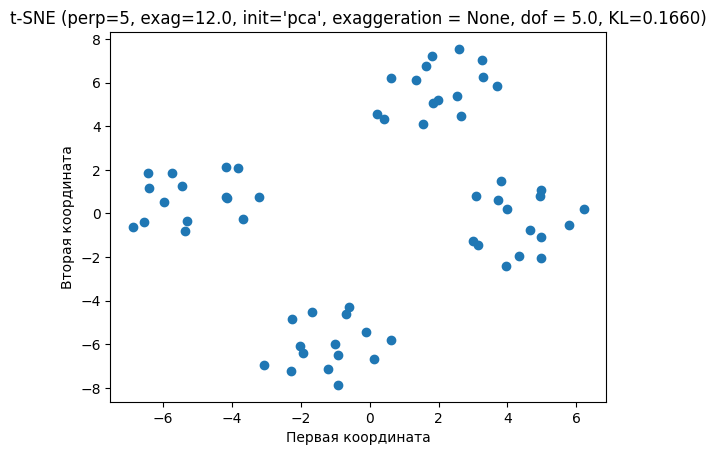

Время работы: 0.21 сек
Финальная KL-дивергенция: 0.1660

Запуск t-SNE с perplexity=5, early_exaggeration=12.0, init='random', exaggeration = 1.0, dof = 5.0
<class 'openTSNE.sklearn.TSNE'>
0.1764688222161901
TSNE(dof=5.0, early_exaggeration=12.0, exaggeration=1.0,
     initialization='random', perplexity=5, random_state=42)


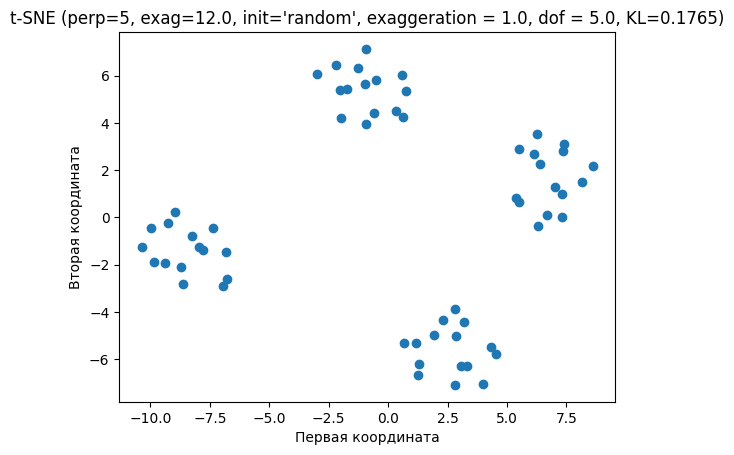

Время работы: 0.21 сек
Финальная KL-дивергенция: 0.1765

Запуск t-SNE с perplexity=5, early_exaggeration=12.0, init='pca', exaggeration = 1.0, dof = 5.0
<class 'openTSNE.sklearn.TSNE'>
0.16597119293518148
TSNE(dof=5.0, early_exaggeration=12.0, exaggeration=1.0, perplexity=5,
     random_state=42)


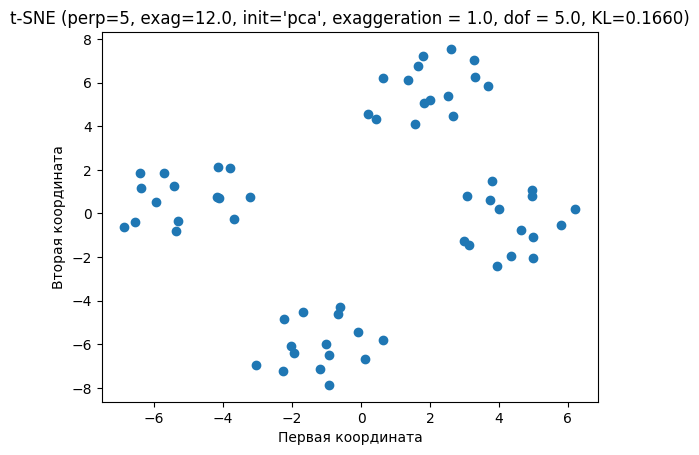

Время работы: 0.21 сек
Финальная KL-дивергенция: 0.1660

Запуск t-SNE с perplexity=5, early_exaggeration=12.0, init='random', exaggeration = 4.0, dof = 5.0
<class 'openTSNE.sklearn.TSNE'>
0.8445669440672576
TSNE(dof=5.0, early_exaggeration=12.0, exaggeration=4.0,
     initialization='random', perplexity=5, random_state=42)


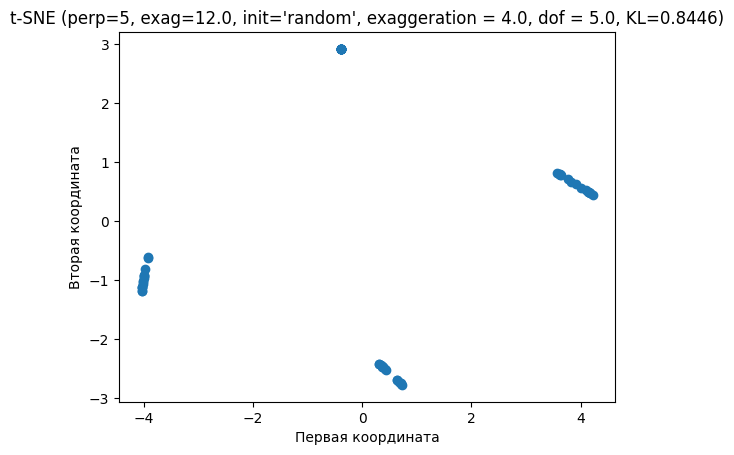

Время работы: 0.19 сек
Финальная KL-дивергенция: 0.8446

Запуск t-SNE с perplexity=5, early_exaggeration=12.0, init='pca', exaggeration = 4.0, dof = 5.0
<class 'openTSNE.sklearn.TSNE'>
0.8441184992619304
TSNE(dof=5.0, early_exaggeration=12.0, exaggeration=4.0, perplexity=5,
     random_state=42)


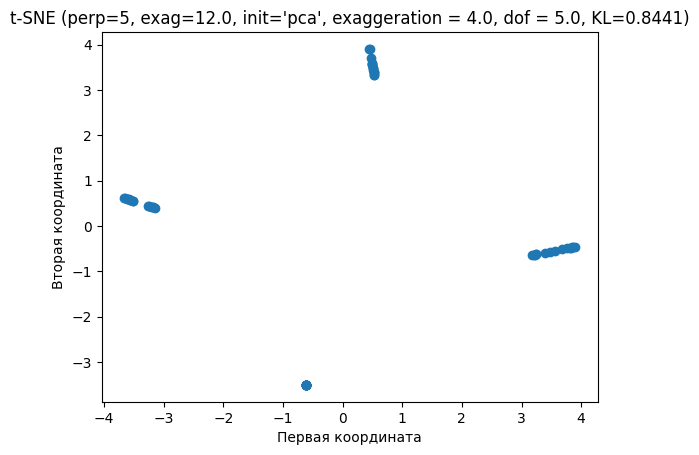

Время работы: 0.19 сек
Финальная KL-дивергенция: 0.8441

Запуск t-SNE с perplexity=5, early_exaggeration=12.0, init='random', exaggeration = 12.0, dof = 5.0
<class 'openTSNE.sklearn.TSNE'>
0.9036434888924809
TSNE(dof=5.0, early_exaggeration=12.0, exaggeration=12.0,
     initialization='random', perplexity=5, random_state=42)


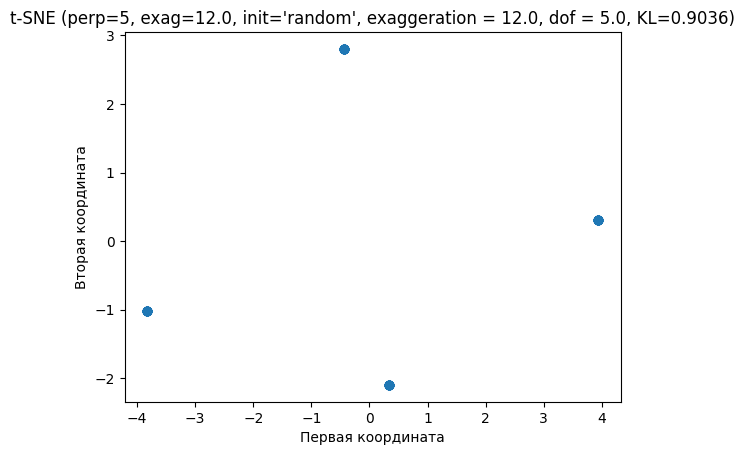

Время работы: 0.20 сек
Финальная KL-дивергенция: 0.9036

Запуск t-SNE с perplexity=5, early_exaggeration=12.0, init='pca', exaggeration = 12.0, dof = 5.0
<class 'openTSNE.sklearn.TSNE'>
0.8844557986940966
TSNE(dof=5.0, early_exaggeration=12.0, exaggeration=12.0, perplexity=5,
     random_state=42)


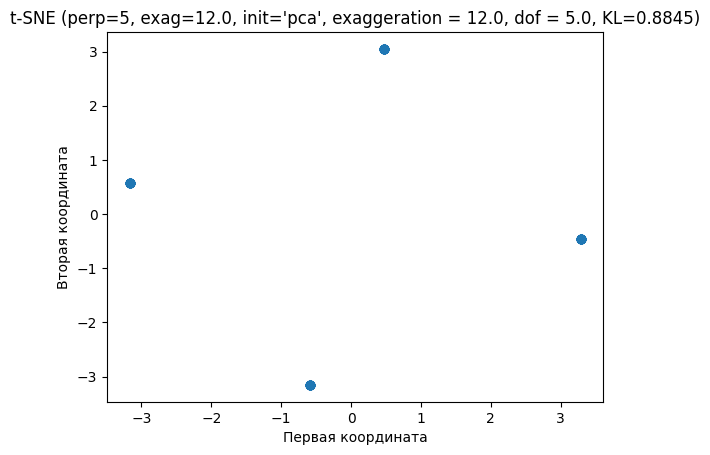

Время работы: 0.21 сек
Финальная KL-дивергенция: 0.8845

Запуск t-SNE с perplexity=5, early_exaggeration=24.0, init='random', exaggeration = None, dof = 0.5
<class 'openTSNE.sklearn.TSNE'>
0.43665185171253285
TSNE(dof=0.5, early_exaggeration=24.0, initialization='random', perplexity=5,
     random_state=42)


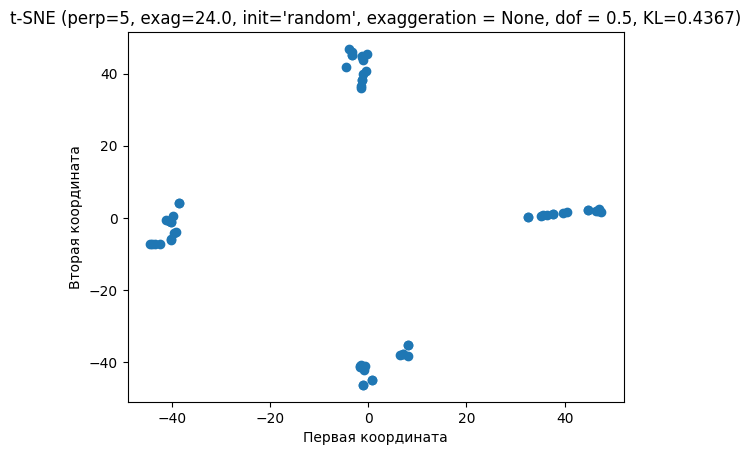

Время работы: 0.19 сек
Финальная KL-дивергенция: 0.4367

Запуск t-SNE с perplexity=5, early_exaggeration=24.0, init='pca', exaggeration = None, dof = 0.5
<class 'openTSNE.sklearn.TSNE'>
0.43651499710661046
TSNE(dof=0.5, early_exaggeration=24.0, perplexity=5, random_state=42)


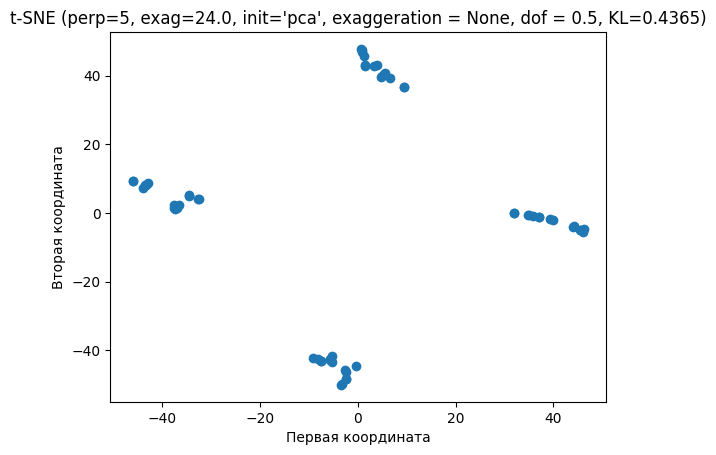

Время работы: 0.20 сек
Финальная KL-дивергенция: 0.4365

Запуск t-SNE с perplexity=5, early_exaggeration=24.0, init='random', exaggeration = 1.0, dof = 0.5
<class 'openTSNE.sklearn.TSNE'>
0.43665185171253285
TSNE(dof=0.5, early_exaggeration=24.0, exaggeration=1.0,
     initialization='random', perplexity=5, random_state=42)


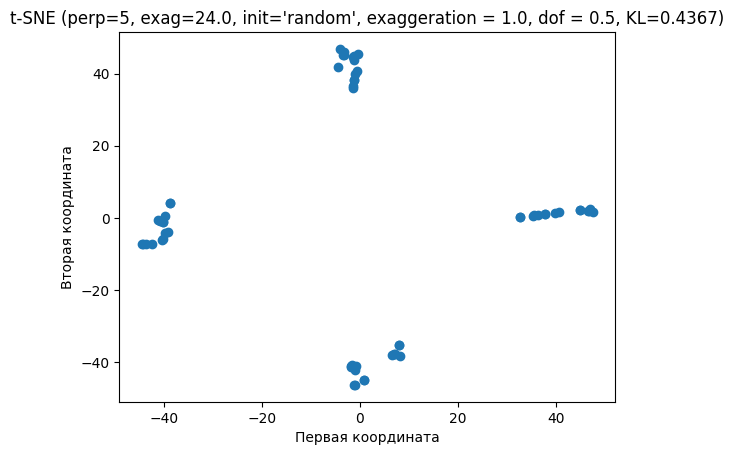

Время работы: 0.19 сек
Финальная KL-дивергенция: 0.4367

Запуск t-SNE с perplexity=5, early_exaggeration=24.0, init='pca', exaggeration = 1.0, dof = 0.5
<class 'openTSNE.sklearn.TSNE'>
0.43651499710661046
TSNE(dof=0.5, early_exaggeration=24.0, exaggeration=1.0, perplexity=5,
     random_state=42)


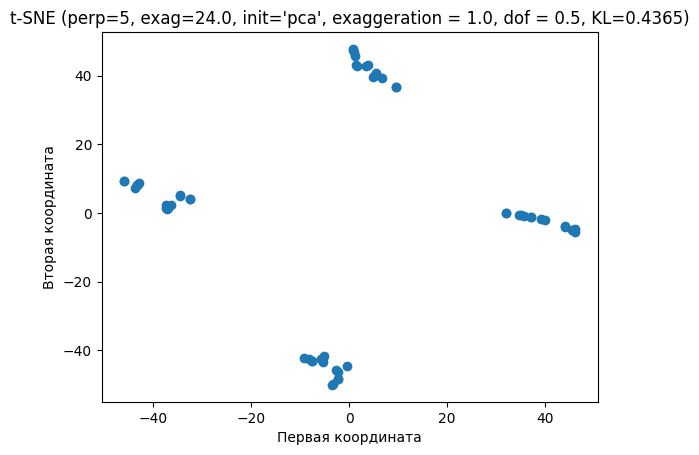

Время работы: 0.24 сек
Финальная KL-дивергенция: 0.4365

Запуск t-SNE с perplexity=5, early_exaggeration=24.0, init='random', exaggeration = 4.0, dof = 0.5
<class 'openTSNE.sklearn.TSNE'>
1.0114988054644964
TSNE(dof=0.5, early_exaggeration=24.0, exaggeration=4.0,
     initialization='random', perplexity=5, random_state=42)


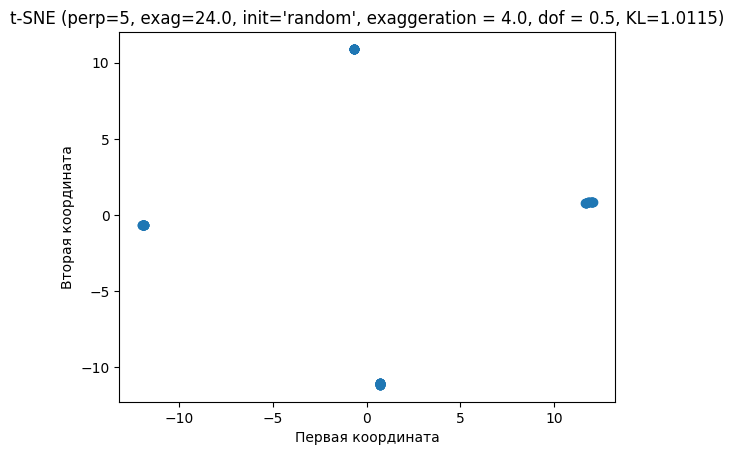

Время работы: 0.22 сек
Финальная KL-дивергенция: 1.0115

Запуск t-SNE с perplexity=5, early_exaggeration=24.0, init='pca', exaggeration = 4.0, dof = 0.5
<class 'openTSNE.sklearn.TSNE'>
1.010631060504993
TSNE(dof=0.5, early_exaggeration=24.0, exaggeration=4.0, perplexity=5,
     random_state=42)


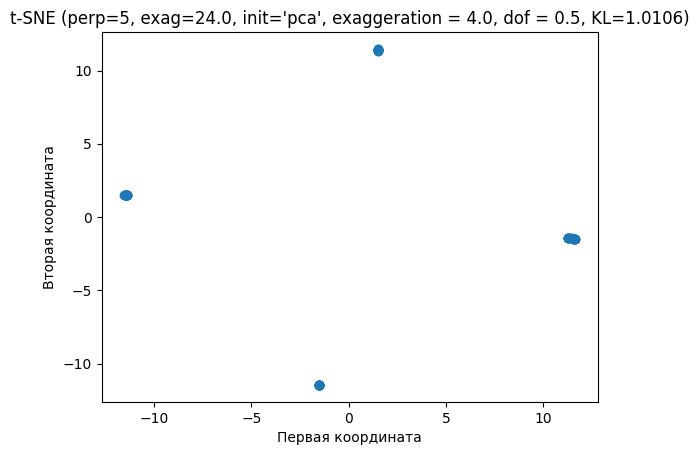

Время работы: 0.21 сек
Финальная KL-дивергенция: 1.0106

Запуск t-SNE с perplexity=5, early_exaggeration=24.0, init='random', exaggeration = 12.0, dof = 0.5
<class 'openTSNE.sklearn.TSNE'>
1.0700319625783337
TSNE(dof=0.5, early_exaggeration=24.0, exaggeration=12.0,
     initialization='random', perplexity=5, random_state=42)


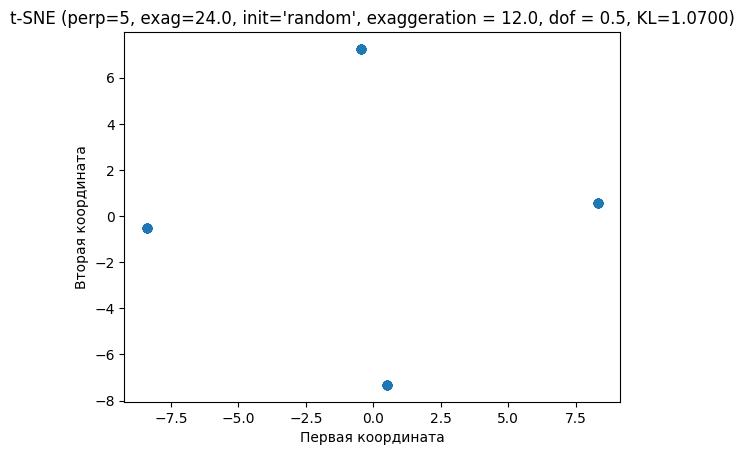

Время работы: 0.22 сек
Финальная KL-дивергенция: 1.0700

Запуск t-SNE с perplexity=5, early_exaggeration=24.0, init='pca', exaggeration = 12.0, dof = 0.5
<class 'openTSNE.sklearn.TSNE'>
1.0686679276927276
TSNE(dof=0.5, early_exaggeration=24.0, exaggeration=12.0, perplexity=5,
     random_state=42)


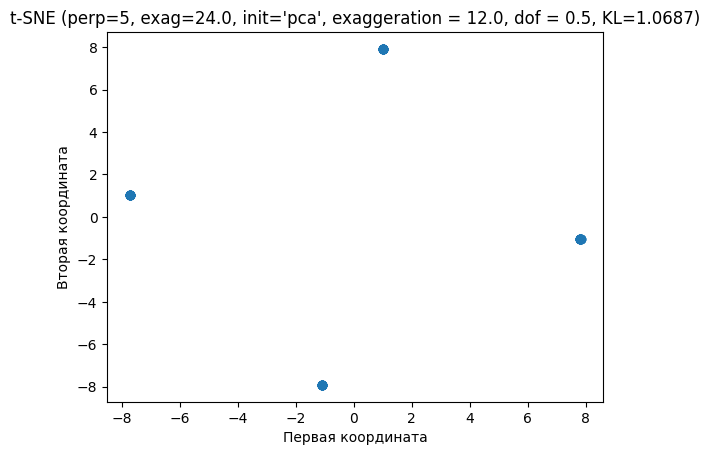

Время работы: 0.20 сек
Финальная KL-дивергенция: 1.0687

Запуск t-SNE с perplexity=5, early_exaggeration=24.0, init='random', exaggeration = None, dof = 1.0
<class 'openTSNE.sklearn.TSNE'>
0.2003248721189239
TSNE(dof=1.0, early_exaggeration=24.0, initialization='random', perplexity=5,
     random_state=42)


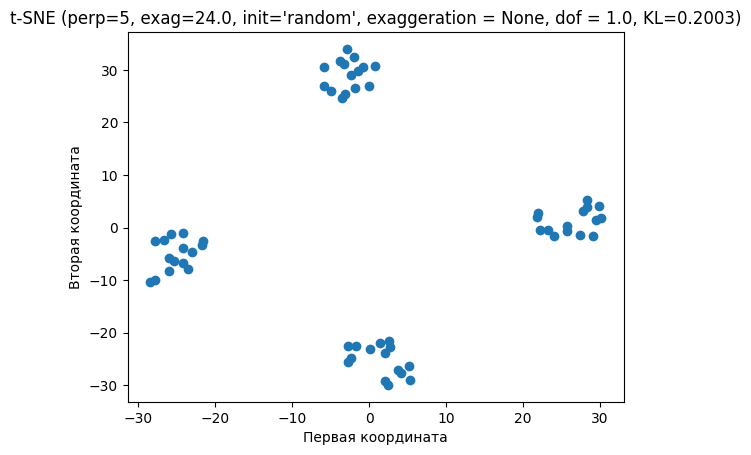

Время работы: 0.14 сек
Финальная KL-дивергенция: 0.2003

Запуск t-SNE с perplexity=5, early_exaggeration=24.0, init='pca', exaggeration = None, dof = 1.0
<class 'openTSNE.sklearn.TSNE'>
0.2026154335167254
TSNE(dof=1.0, early_exaggeration=24.0, perplexity=5, random_state=42)


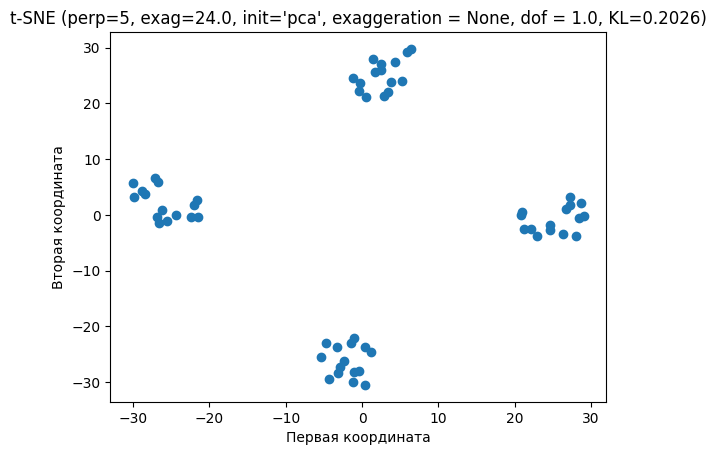

Время работы: 0.14 сек
Финальная KL-дивергенция: 0.2026

Запуск t-SNE с perplexity=5, early_exaggeration=24.0, init='random', exaggeration = 1.0, dof = 1.0
<class 'openTSNE.sklearn.TSNE'>
0.2003248721189239
TSNE(dof=1.0, early_exaggeration=24.0, exaggeration=1.0,
     initialization='random', perplexity=5, random_state=42)


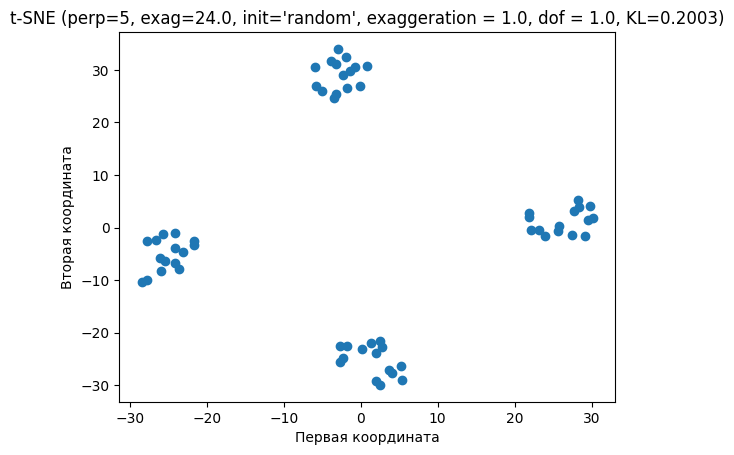

Время работы: 0.14 сек
Финальная KL-дивергенция: 0.2003

Запуск t-SNE с perplexity=5, early_exaggeration=24.0, init='pca', exaggeration = 1.0, dof = 1.0
<class 'openTSNE.sklearn.TSNE'>
0.2026154335167254
TSNE(dof=1.0, early_exaggeration=24.0, exaggeration=1.0, perplexity=5,
     random_state=42)


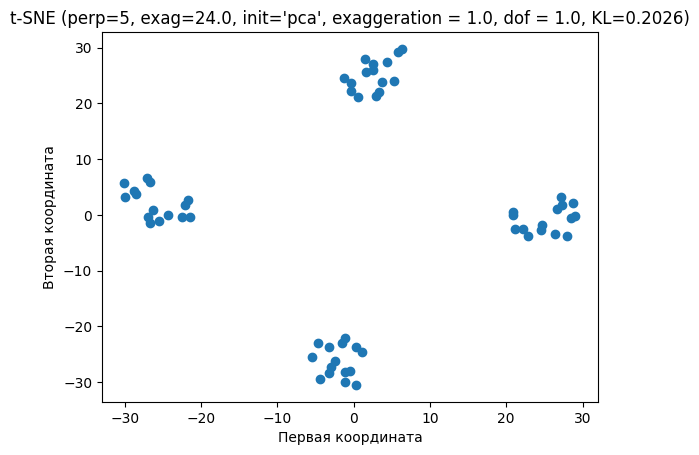

Время работы: 0.14 сек
Финальная KL-дивергенция: 0.2026

Запуск t-SNE с perplexity=5, early_exaggeration=24.0, init='random', exaggeration = 4.0, dof = 1.0
<class 'openTSNE.sklearn.TSNE'>
0.884127647694422
TSNE(dof=1.0, early_exaggeration=24.0, exaggeration=4.0,
     initialization='random', perplexity=5, random_state=42)


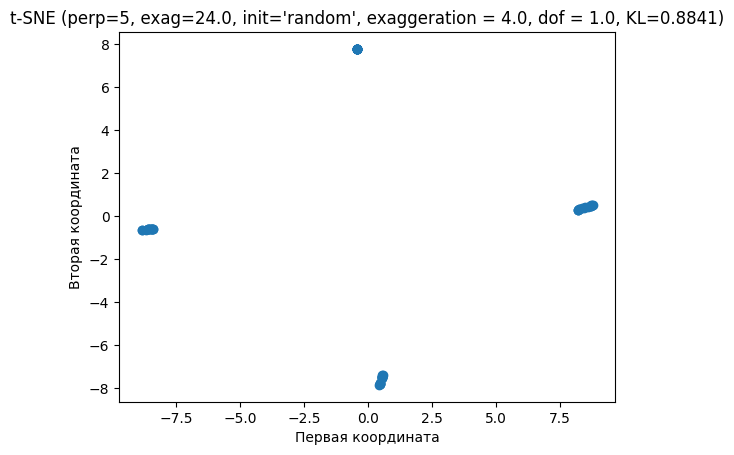

Время работы: 0.15 сек
Финальная KL-дивергенция: 0.8841

Запуск t-SNE с perplexity=5, early_exaggeration=24.0, init='pca', exaggeration = 4.0, dof = 1.0
<class 'openTSNE.sklearn.TSNE'>
0.8838095828559895
TSNE(dof=1.0, early_exaggeration=24.0, exaggeration=4.0, perplexity=5,
     random_state=42)


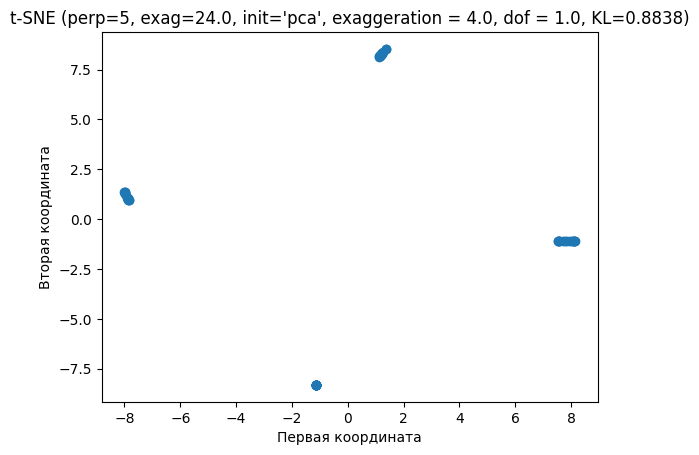

Время работы: 0.15 сек
Финальная KL-дивергенция: 0.8838

Запуск t-SNE с perplexity=5, early_exaggeration=24.0, init='random', exaggeration = 12.0, dof = 1.0
<class 'openTSNE.sklearn.TSNE'>
0.9356712905853835
TSNE(dof=1.0, early_exaggeration=24.0, exaggeration=12.0,
     initialization='random', perplexity=5, random_state=42)


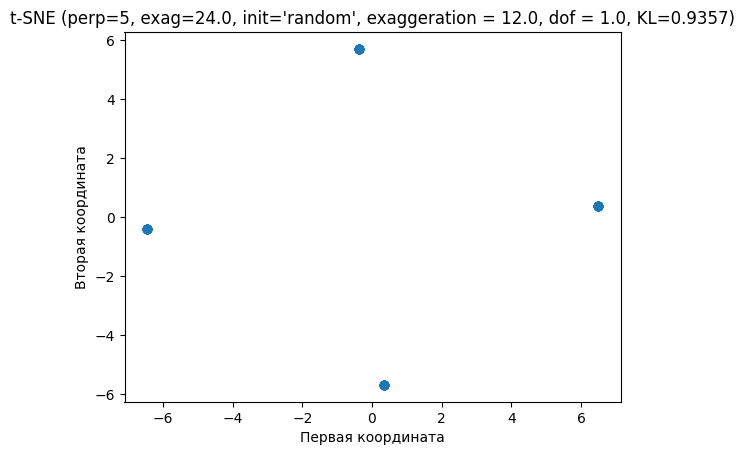

Время работы: 0.17 сек
Финальная KL-дивергенция: 0.9357

Запуск t-SNE с perplexity=5, early_exaggeration=24.0, init='pca', exaggeration = 12.0, dof = 1.0
<class 'openTSNE.sklearn.TSNE'>
0.9352737588021593
TSNE(dof=1.0, early_exaggeration=24.0, exaggeration=12.0, perplexity=5,
     random_state=42)


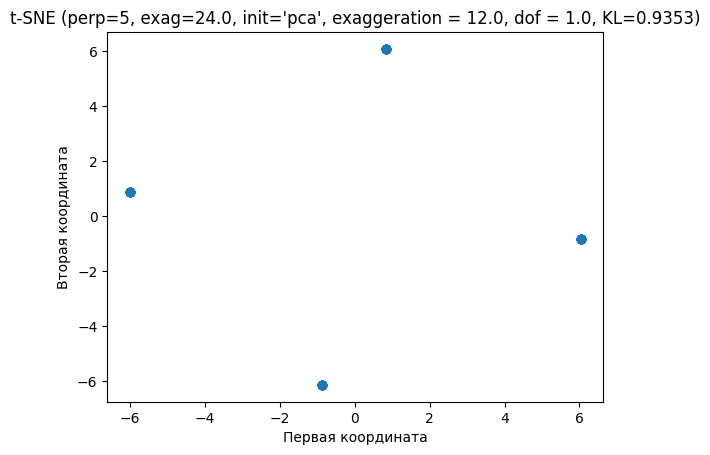

Время работы: 0.17 сек
Финальная KL-дивергенция: 0.9353

Запуск t-SNE с perplexity=5, early_exaggeration=24.0, init='random', exaggeration = None, dof = 5.0
<class 'openTSNE.sklearn.TSNE'>
0.1666637990204558
TSNE(dof=5.0, early_exaggeration=24.0, initialization='random', perplexity=5,
     random_state=42)


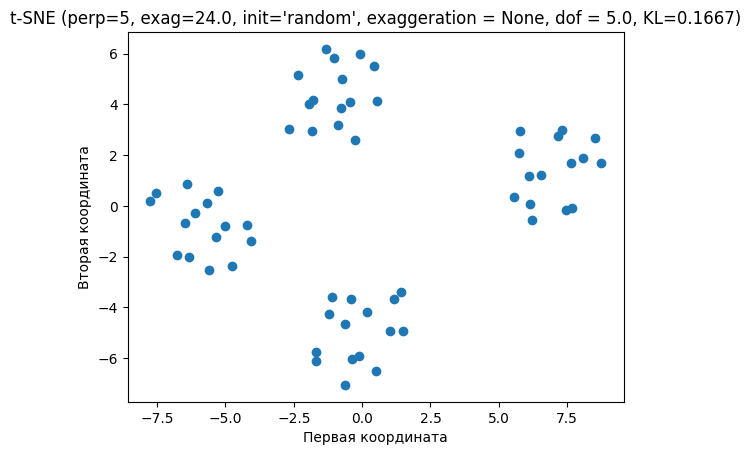

Время работы: 0.21 сек
Финальная KL-дивергенция: 0.1667

Запуск t-SNE с perplexity=5, early_exaggeration=24.0, init='pca', exaggeration = None, dof = 5.0
<class 'openTSNE.sklearn.TSNE'>
0.17026623285333287
TSNE(dof=5.0, early_exaggeration=24.0, perplexity=5, random_state=42)


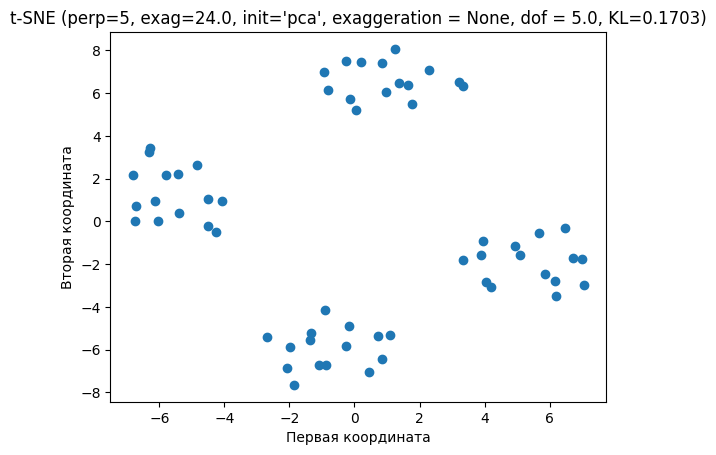

Время работы: 0.20 сек
Финальная KL-дивергенция: 0.1703

Запуск t-SNE с perplexity=5, early_exaggeration=24.0, init='random', exaggeration = 1.0, dof = 5.0
<class 'openTSNE.sklearn.TSNE'>
0.1666637990204558
TSNE(dof=5.0, early_exaggeration=24.0, exaggeration=1.0,
     initialization='random', perplexity=5, random_state=42)


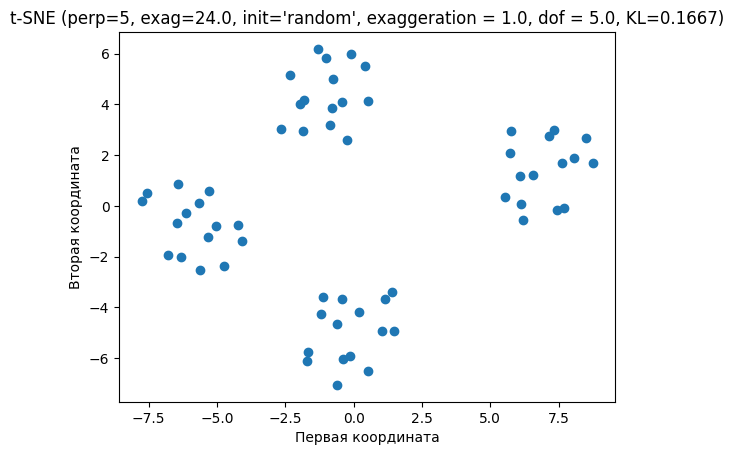

Время работы: 0.20 сек
Финальная KL-дивергенция: 0.1667

Запуск t-SNE с perplexity=5, early_exaggeration=24.0, init='pca', exaggeration = 1.0, dof = 5.0
<class 'openTSNE.sklearn.TSNE'>
0.17026623285333287
TSNE(dof=5.0, early_exaggeration=24.0, exaggeration=1.0, perplexity=5,
     random_state=42)


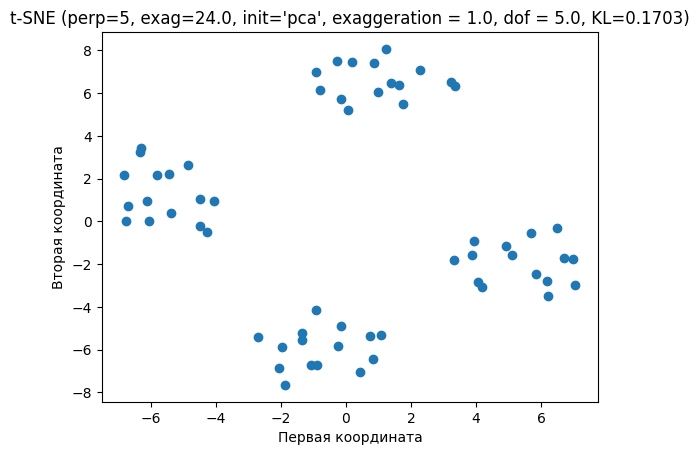

Время работы: 0.19 сек
Финальная KL-дивергенция: 0.1703

Запуск t-SNE с perplexity=5, early_exaggeration=24.0, init='random', exaggeration = 4.0, dof = 5.0
<class 'openTSNE.sklearn.TSNE'>
0.8445057153359752
TSNE(dof=5.0, early_exaggeration=24.0, exaggeration=4.0,
     initialization='random', perplexity=5, random_state=42)


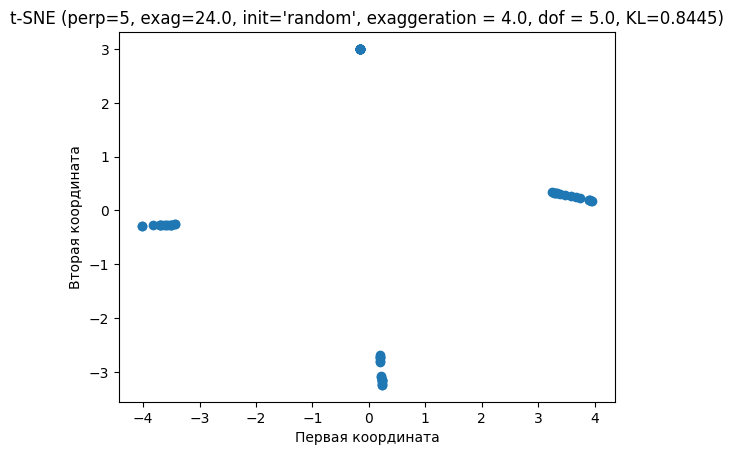

Время работы: 0.20 сек
Финальная KL-дивергенция: 0.8445

Запуск t-SNE с perplexity=5, early_exaggeration=24.0, init='pca', exaggeration = 4.0, dof = 5.0
<class 'openTSNE.sklearn.TSNE'>
0.8445615454812634
TSNE(dof=5.0, early_exaggeration=24.0, exaggeration=4.0, perplexity=5,
     random_state=42)


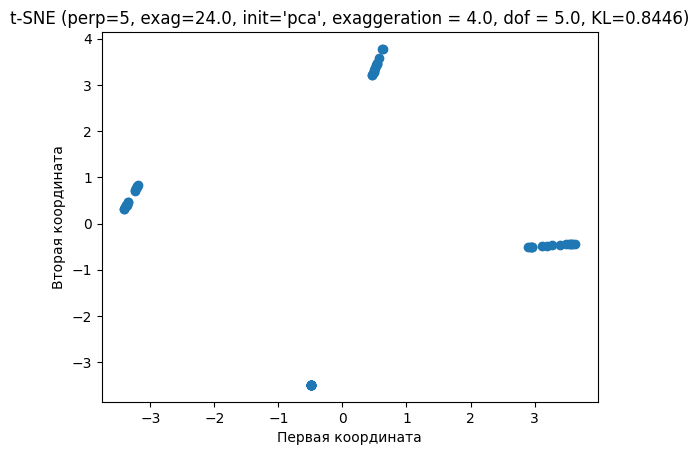

Время работы: 0.19 сек
Финальная KL-дивергенция: 0.8446

Запуск t-SNE с perplexity=5, early_exaggeration=24.0, init='random', exaggeration = 12.0, dof = 5.0
<class 'openTSNE.sklearn.TSNE'>
0.9015043066996569
TSNE(dof=5.0, early_exaggeration=24.0, exaggeration=12.0,
     initialization='random', perplexity=5, random_state=42)


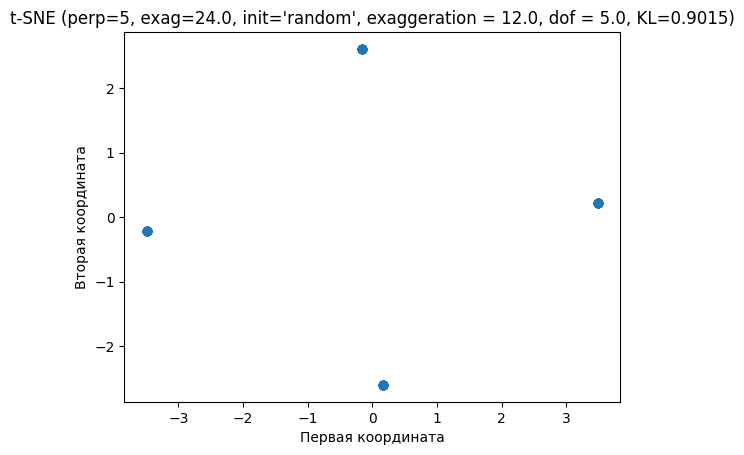

Время работы: 0.20 сек
Финальная KL-дивергенция: 0.9015

Запуск t-SNE с perplexity=5, early_exaggeration=24.0, init='pca', exaggeration = 12.0, dof = 5.0
<class 'openTSNE.sklearn.TSNE'>
0.8846954907144351
TSNE(dof=5.0, early_exaggeration=24.0, exaggeration=12.0, perplexity=5,
     random_state=42)


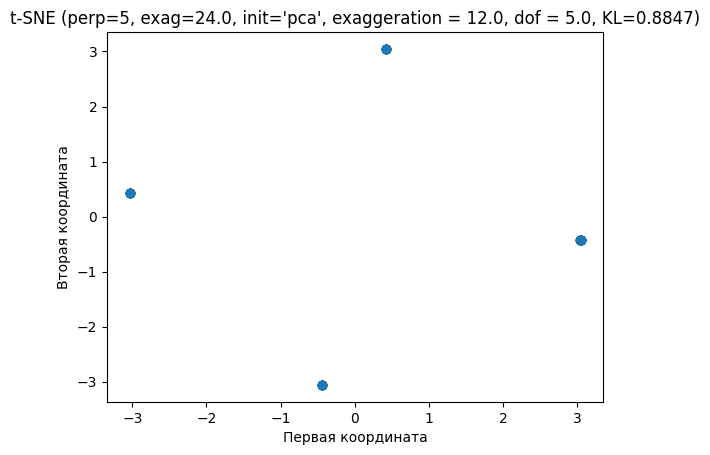

Время работы: 0.19 сек
Финальная KL-дивергенция: 0.8847

Запуск t-SNE с perplexity=10, early_exaggeration=4.0, init='random', exaggeration = None, dof = 0.5
<class 'openTSNE.sklearn.TSNE'>
0.17804177346651517
TSNE(dof=0.5, early_exaggeration=4.0, initialization='random', perplexity=10,
     random_state=42)


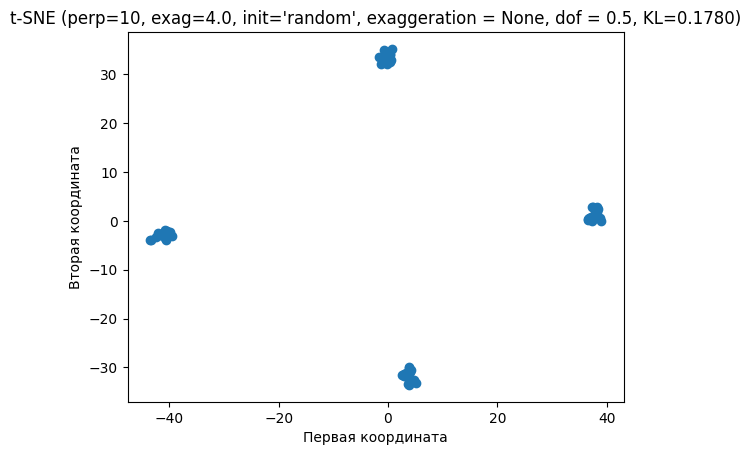

Время работы: 0.20 сек
Финальная KL-дивергенция: 0.1780

Запуск t-SNE с perplexity=10, early_exaggeration=4.0, init='pca', exaggeration = None, dof = 0.5
<class 'openTSNE.sklearn.TSNE'>
0.17855084655358144
TSNE(dof=0.5, early_exaggeration=4.0, perplexity=10, random_state=42)


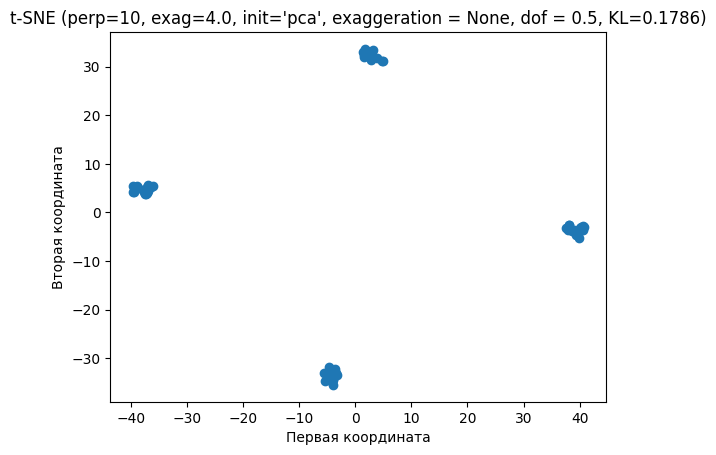

Время работы: 0.19 сек
Финальная KL-дивергенция: 0.1786

Запуск t-SNE с perplexity=10, early_exaggeration=4.0, init='random', exaggeration = 1.0, dof = 0.5
<class 'openTSNE.sklearn.TSNE'>
0.17804177346651517
TSNE(dof=0.5, early_exaggeration=4.0, exaggeration=1.0, initialization='random',
     perplexity=10, random_state=42)


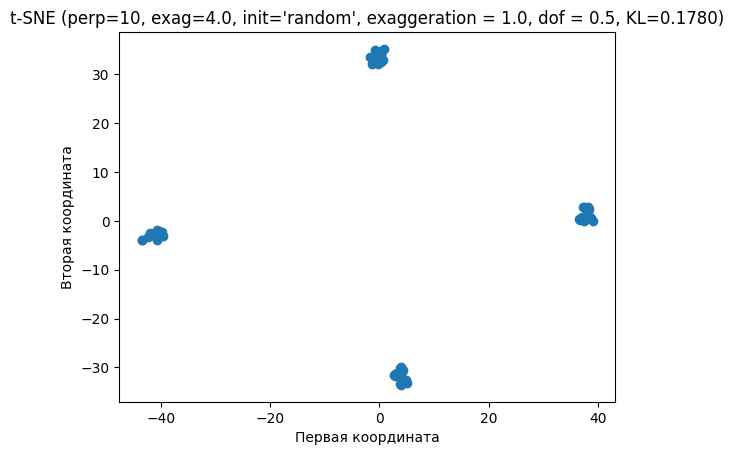

Время работы: 0.20 сек
Финальная KL-дивергенция: 0.1780

Запуск t-SNE с perplexity=10, early_exaggeration=4.0, init='pca', exaggeration = 1.0, dof = 0.5
<class 'openTSNE.sklearn.TSNE'>
0.17855084655358144
TSNE(dof=0.5, early_exaggeration=4.0, exaggeration=1.0, perplexity=10,
     random_state=42)


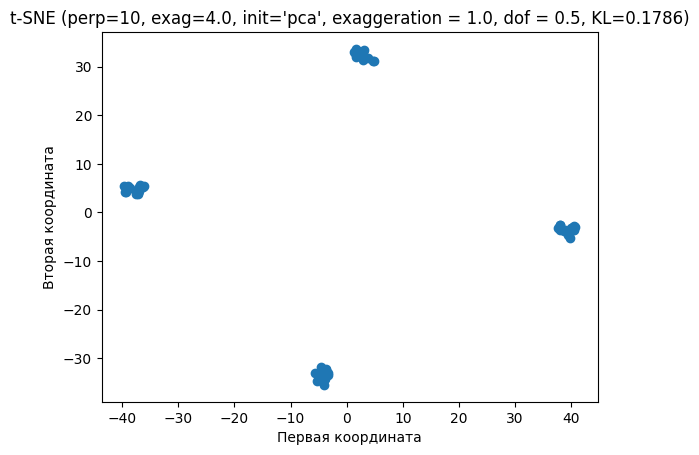

Время работы: 0.19 сек
Финальная KL-дивергенция: 0.1786

Запуск t-SNE с perplexity=10, early_exaggeration=4.0, init='random', exaggeration = 4.0, dof = 0.5
<class 'openTSNE.sklearn.TSNE'>
0.3798025631286235
TSNE(dof=0.5, early_exaggeration=4.0, exaggeration=4.0, initialization='random',
     perplexity=10, random_state=42)


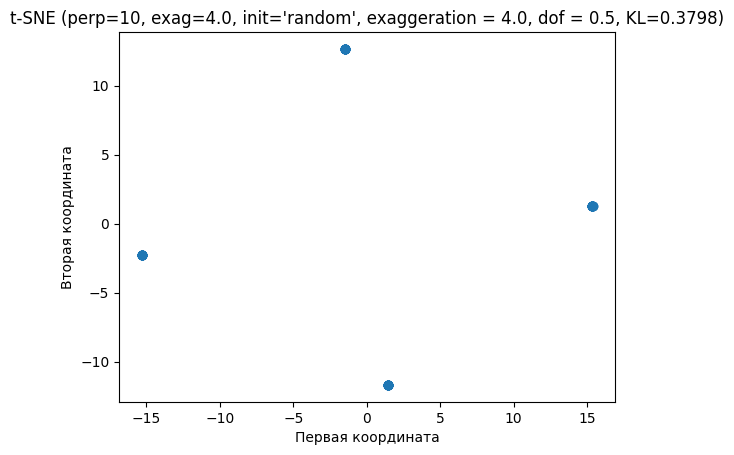

Время работы: 0.21 сек
Финальная KL-дивергенция: 0.3798

Запуск t-SNE с perplexity=10, early_exaggeration=4.0, init='pca', exaggeration = 4.0, dof = 0.5
<class 'openTSNE.sklearn.TSNE'>
0.37957887495707787
TSNE(dof=0.5, early_exaggeration=4.0, exaggeration=4.0, perplexity=10,
     random_state=42)


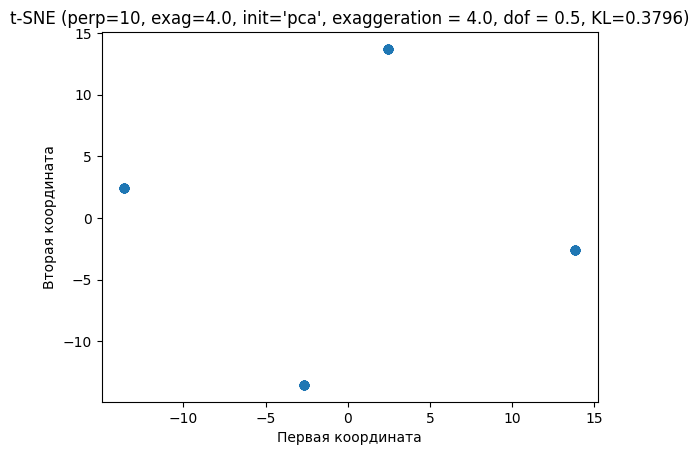

Время работы: 0.21 сек
Финальная KL-дивергенция: 0.3796

Запуск t-SNE с perplexity=10, early_exaggeration=4.0, init='random', exaggeration = 12.0, dof = 0.5
<class 'openTSNE.sklearn.TSNE'>
0.40372418105879593
TSNE(dof=0.5, early_exaggeration=4.0, exaggeration=12.0,
     initialization='random', perplexity=10, random_state=42)


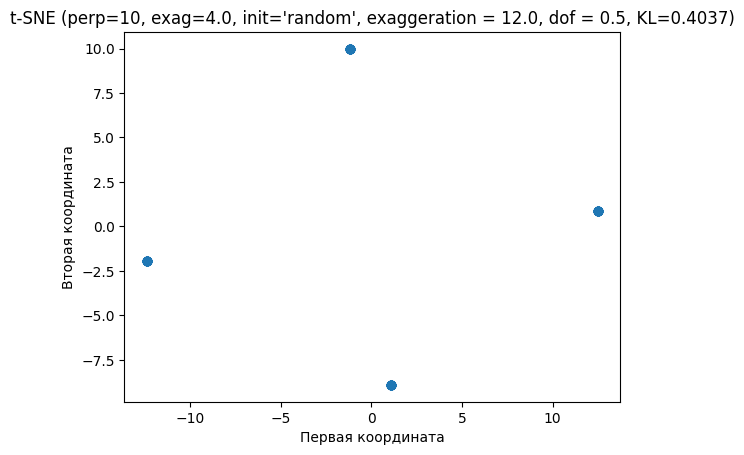

Время работы: 0.21 сек
Финальная KL-дивергенция: 0.4037

Запуск t-SNE с perplexity=10, early_exaggeration=4.0, init='pca', exaggeration = 12.0, dof = 0.5
<class 'openTSNE.sklearn.TSNE'>
0.40358768736882134
TSNE(dof=0.5, early_exaggeration=4.0, exaggeration=12.0, perplexity=10,
     random_state=42)


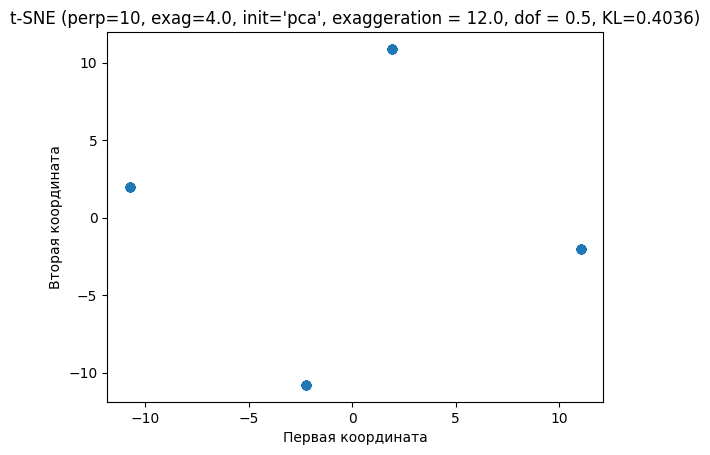

Время работы: 0.21 сек
Финальная KL-дивергенция: 0.4036

Запуск t-SNE с perplexity=10, early_exaggeration=4.0, init='random', exaggeration = None, dof = 1.0
<class 'openTSNE.sklearn.TSNE'>
0.06490331652956005
TSNE(dof=1.0, early_exaggeration=4.0, initialization='random', perplexity=10,
     random_state=42)


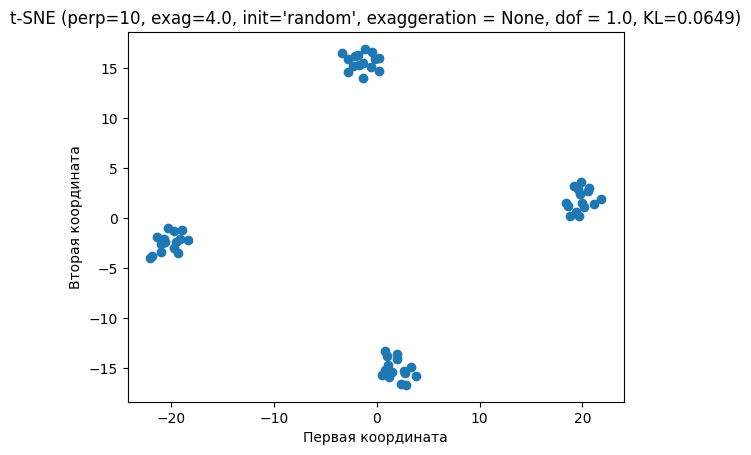

Время работы: 0.15 сек
Финальная KL-дивергенция: 0.0649

Запуск t-SNE с perplexity=10, early_exaggeration=4.0, init='pca', exaggeration = None, dof = 1.0
<class 'openTSNE.sklearn.TSNE'>
0.06236682108517044
TSNE(dof=1.0, early_exaggeration=4.0, perplexity=10, random_state=42)


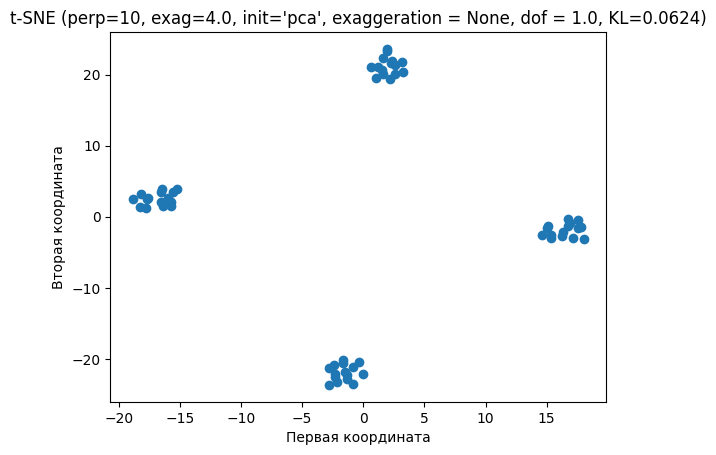

Время работы: 0.15 сек
Финальная KL-дивергенция: 0.0624

Запуск t-SNE с perplexity=10, early_exaggeration=4.0, init='random', exaggeration = 1.0, dof = 1.0
<class 'openTSNE.sklearn.TSNE'>
0.06490331652956005
TSNE(dof=1.0, early_exaggeration=4.0, exaggeration=1.0, initialization='random',
     perplexity=10, random_state=42)


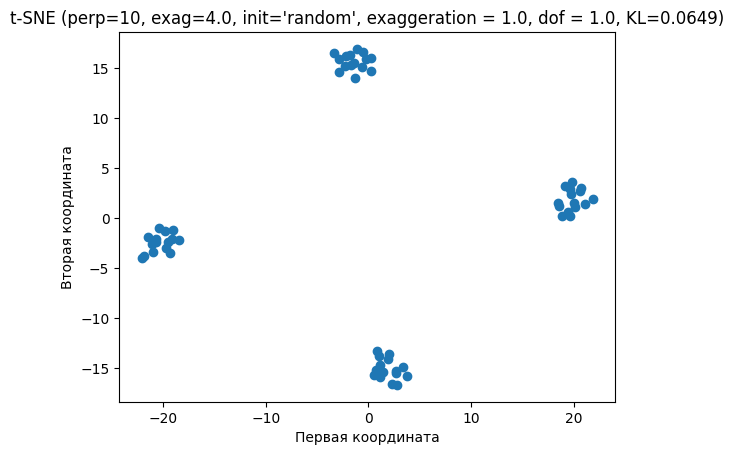

Время работы: 0.15 сек
Финальная KL-дивергенция: 0.0649

Запуск t-SNE с perplexity=10, early_exaggeration=4.0, init='pca', exaggeration = 1.0, dof = 1.0
<class 'openTSNE.sklearn.TSNE'>
0.06236682108517044
TSNE(dof=1.0, early_exaggeration=4.0, exaggeration=1.0, perplexity=10,
     random_state=42)


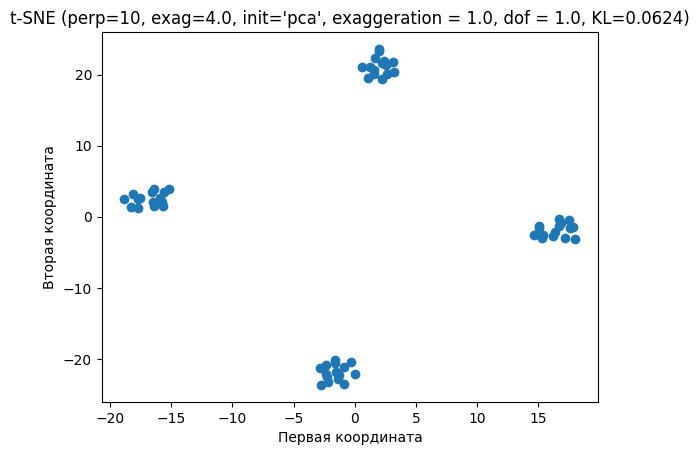

Время работы: 0.15 сек
Финальная KL-дивергенция: 0.0624

Запуск t-SNE с perplexity=10, early_exaggeration=4.0, init='random', exaggeration = 4.0, dof = 1.0
<class 'openTSNE.sklearn.TSNE'>
0.29531808037766716
TSNE(dof=1.0, early_exaggeration=4.0, exaggeration=4.0, initialization='random',
     perplexity=10, random_state=42)


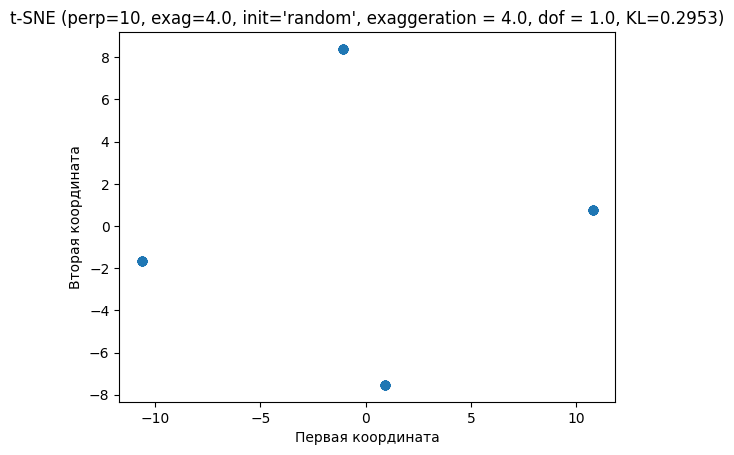

Время работы: 0.16 сек
Финальная KL-дивергенция: 0.2953

Запуск t-SNE с perplexity=10, early_exaggeration=4.0, init='pca', exaggeration = 4.0, dof = 1.0
<class 'openTSNE.sklearn.TSNE'>
0.2953210025545632
TSNE(dof=1.0, early_exaggeration=4.0, exaggeration=4.0, perplexity=10,
     random_state=42)


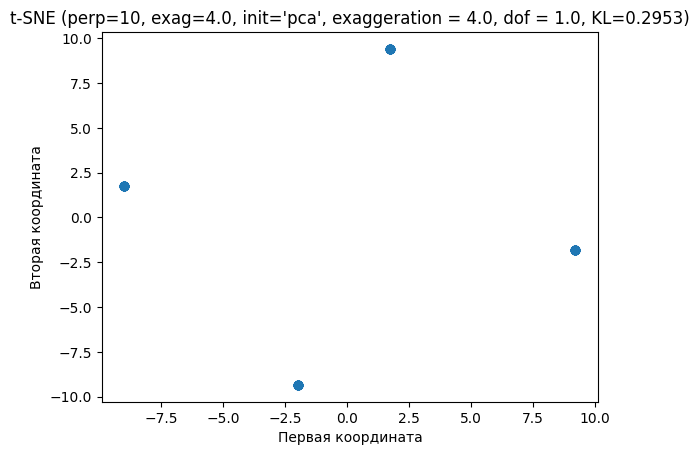

Время работы: 0.17 сек
Финальная KL-дивергенция: 0.2953

Запуск t-SNE с perplexity=10, early_exaggeration=4.0, init='random', exaggeration = 12.0, dof = 1.0
<class 'openTSNE.sklearn.TSNE'>
0.30083171954679955
TSNE(dof=1.0, early_exaggeration=4.0, exaggeration=12.0,
     initialization='random', perplexity=10, random_state=42)


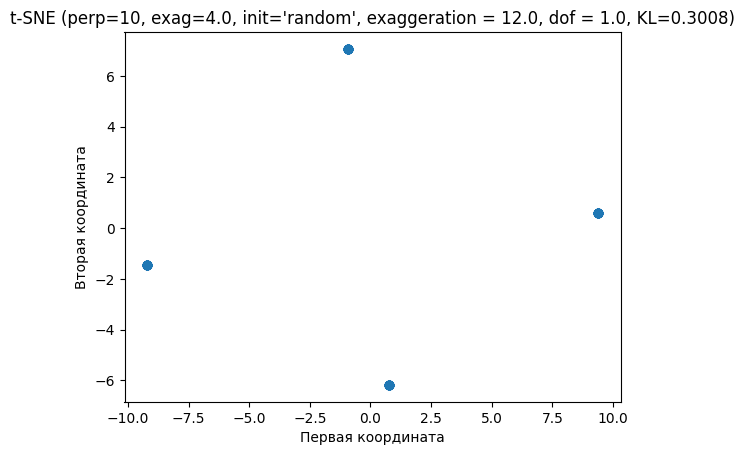

Время работы: 0.17 сек
Финальная KL-дивергенция: 0.3008

Запуск t-SNE с perplexity=10, early_exaggeration=4.0, init='pca', exaggeration = 12.0, dof = 1.0
<class 'openTSNE.sklearn.TSNE'>
0.30087995780797083
TSNE(dof=1.0, early_exaggeration=4.0, exaggeration=12.0, perplexity=10,
     random_state=42)


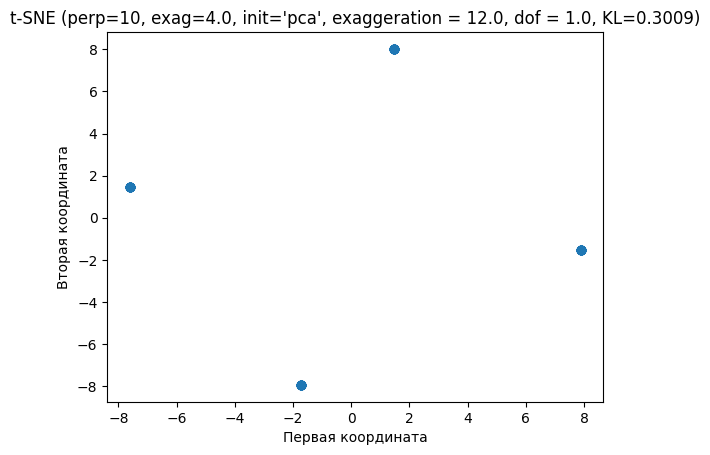

Время работы: 0.17 сек
Финальная KL-дивергенция: 0.3009

Запуск t-SNE с perplexity=10, early_exaggeration=4.0, init='random', exaggeration = None, dof = 5.0
<class 'openTSNE.sklearn.TSNE'>
0.05350496694998341
TSNE(dof=5.0, early_exaggeration=4.0, initialization='random', perplexity=10,
     random_state=42)


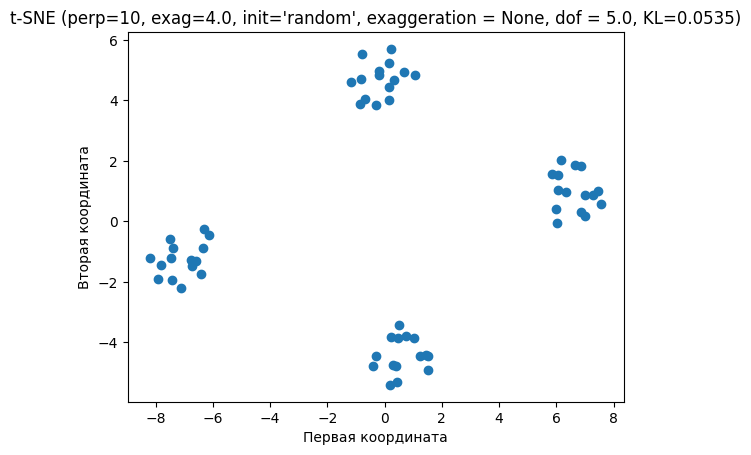

Время работы: 0.21 сек
Финальная KL-дивергенция: 0.0535

Запуск t-SNE с perplexity=10, early_exaggeration=4.0, init='pca', exaggeration = None, dof = 5.0
<class 'openTSNE.sklearn.TSNE'>
0.05382765293495506
TSNE(dof=5.0, early_exaggeration=4.0, perplexity=10, random_state=42)


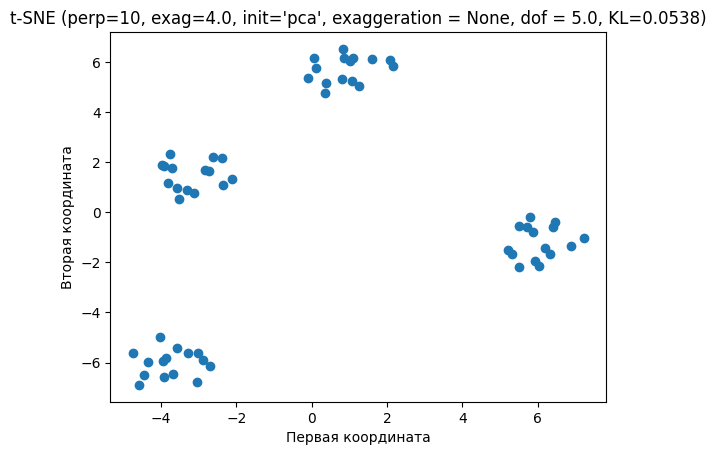

Время работы: 0.20 сек
Финальная KL-дивергенция: 0.0538

Запуск t-SNE с perplexity=10, early_exaggeration=4.0, init='random', exaggeration = 1.0, dof = 5.0
<class 'openTSNE.sklearn.TSNE'>
0.05350496694998341
TSNE(dof=5.0, early_exaggeration=4.0, exaggeration=1.0, initialization='random',
     perplexity=10, random_state=42)


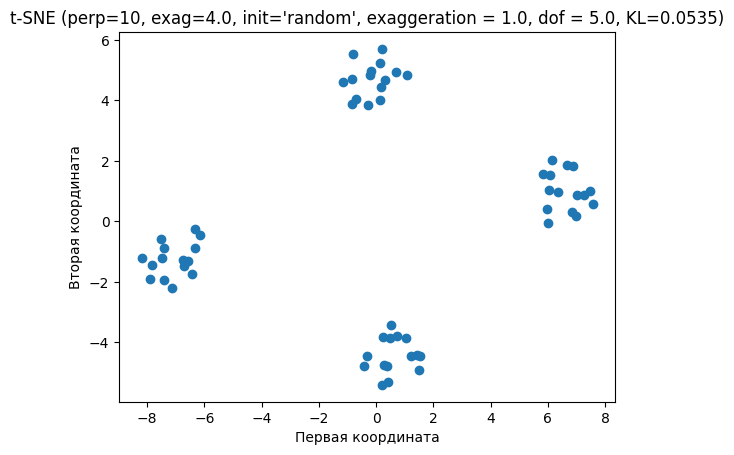

Время работы: 0.22 сек
Финальная KL-дивергенция: 0.0535

Запуск t-SNE с perplexity=10, early_exaggeration=4.0, init='pca', exaggeration = 1.0, dof = 5.0
<class 'openTSNE.sklearn.TSNE'>
0.05382765293495506
TSNE(dof=5.0, early_exaggeration=4.0, exaggeration=1.0, perplexity=10,
     random_state=42)


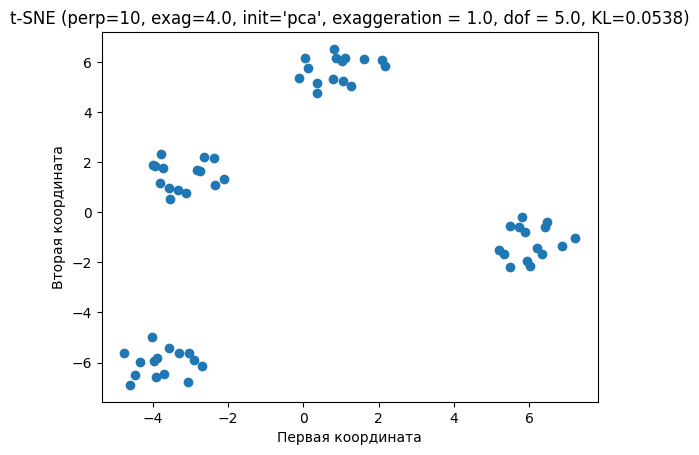

Время работы: 0.21 сек
Финальная KL-дивергенция: 0.0538

Запуск t-SNE с perplexity=10, early_exaggeration=4.0, init='random', exaggeration = 4.0, dof = 5.0
<class 'openTSNE.sklearn.TSNE'>
0.052803597631475796
TSNE(dof=5.0, early_exaggeration=4.0, exaggeration=4.0, initialization='random',
     perplexity=10, random_state=42)


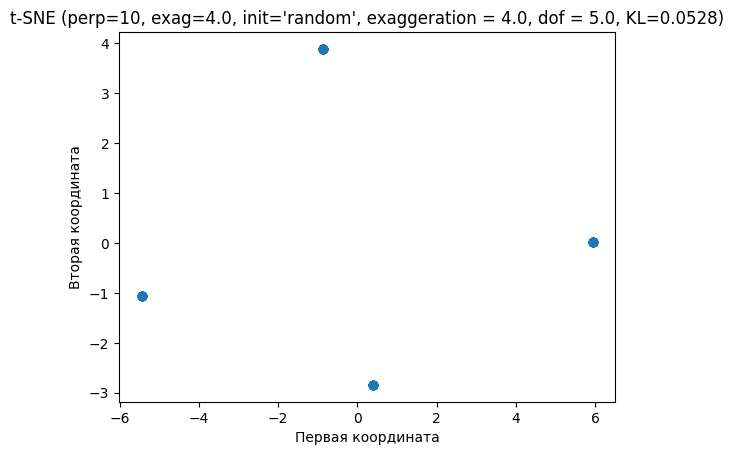

Время работы: 0.22 сек
Финальная KL-дивергенция: 0.0528

Запуск t-SNE с perplexity=10, early_exaggeration=4.0, init='pca', exaggeration = 4.0, dof = 5.0
<class 'openTSNE.sklearn.TSNE'>
0.08369923243270971
TSNE(dof=5.0, early_exaggeration=4.0, exaggeration=4.0, perplexity=10,
     random_state=42)


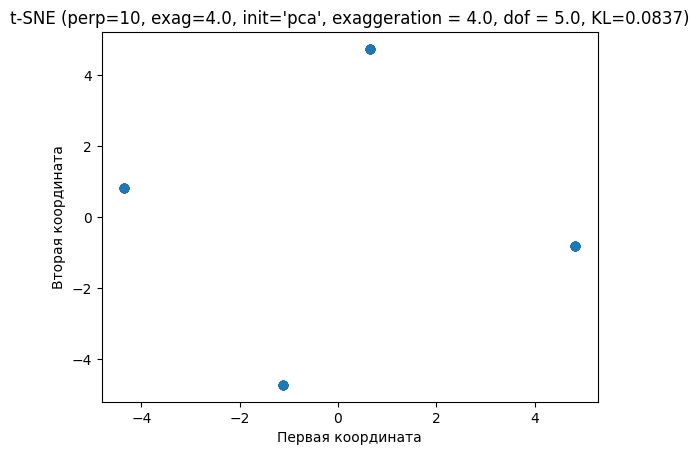

Время работы: 0.21 сек
Финальная KL-дивергенция: 0.0837

Запуск t-SNE с perplexity=10, early_exaggeration=4.0, init='random', exaggeration = 12.0, dof = 5.0
<class 'openTSNE.sklearn.TSNE'>
-0.1914774786295137
TSNE(dof=5.0, early_exaggeration=4.0, exaggeration=12.0,
     initialization='random', perplexity=10, random_state=42)


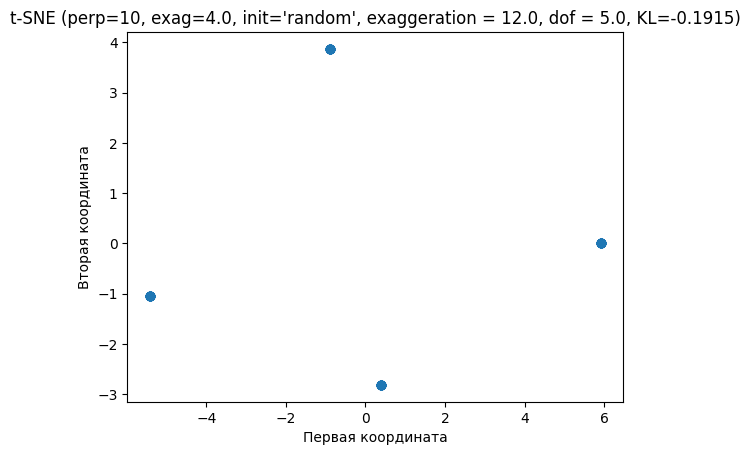

Время работы: 0.21 сек
Финальная KL-дивергенция: -0.1915

Запуск t-SNE с perplexity=10, early_exaggeration=4.0, init='pca', exaggeration = 12.0, dof = 5.0
<class 'openTSNE.sklearn.TSNE'>
-0.534083118669205
TSNE(dof=5.0, early_exaggeration=4.0, exaggeration=12.0, perplexity=10,
     random_state=42)


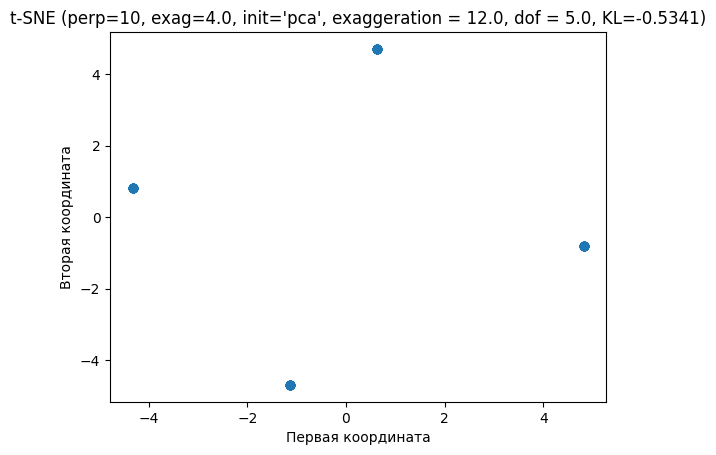

Время работы: 0.20 сек
Финальная KL-дивергенция: -0.5341

Запуск t-SNE с perplexity=10, early_exaggeration=12.0, init='random', exaggeration = None, dof = 0.5
<class 'openTSNE.sklearn.TSNE'>
0.17449322091229202
TSNE(dof=0.5, early_exaggeration=12.0, initialization='random', perplexity=10,
     random_state=42)


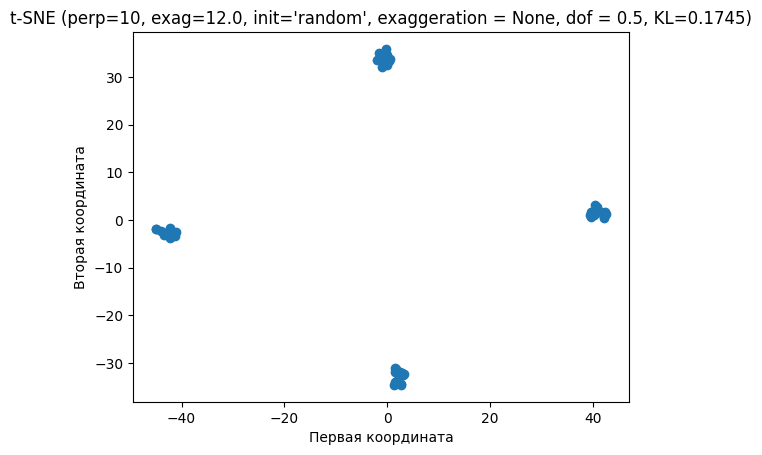

Время работы: 0.20 сек
Финальная KL-дивергенция: 0.1745

Запуск t-SNE с perplexity=10, early_exaggeration=12.0, init='pca', exaggeration = None, dof = 0.5
<class 'openTSNE.sklearn.TSNE'>
0.18095768801801881
TSNE(dof=0.5, early_exaggeration=12.0, perplexity=10, random_state=42)


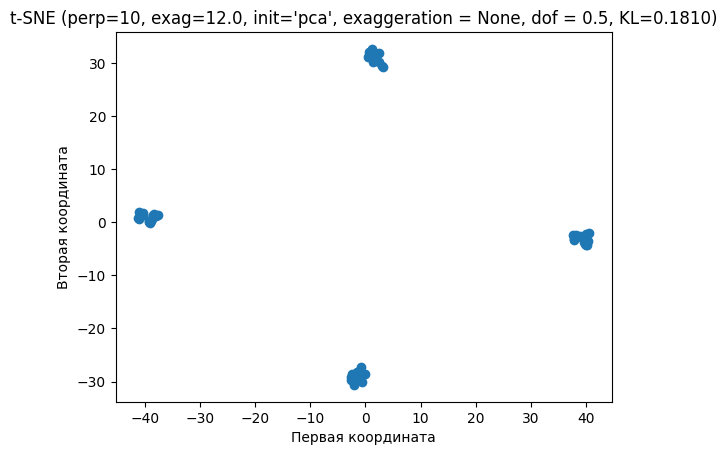

Время работы: 0.20 сек
Финальная KL-дивергенция: 0.1810

Запуск t-SNE с perplexity=10, early_exaggeration=12.0, init='random', exaggeration = 1.0, dof = 0.5
<class 'openTSNE.sklearn.TSNE'>
0.17449322091229202
TSNE(dof=0.5, early_exaggeration=12.0, exaggeration=1.0,
     initialization='random', perplexity=10, random_state=42)


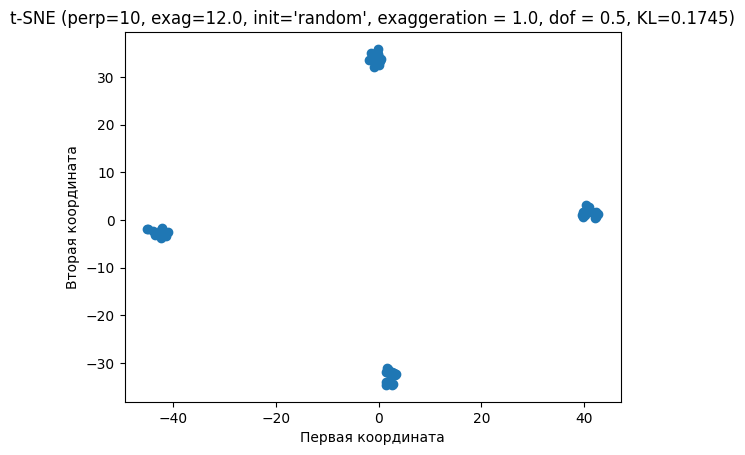

Время работы: 0.19 сек
Финальная KL-дивергенция: 0.1745

Запуск t-SNE с perplexity=10, early_exaggeration=12.0, init='pca', exaggeration = 1.0, dof = 0.5
<class 'openTSNE.sklearn.TSNE'>
0.18095768801801881
TSNE(dof=0.5, early_exaggeration=12.0, exaggeration=1.0, perplexity=10,
     random_state=42)


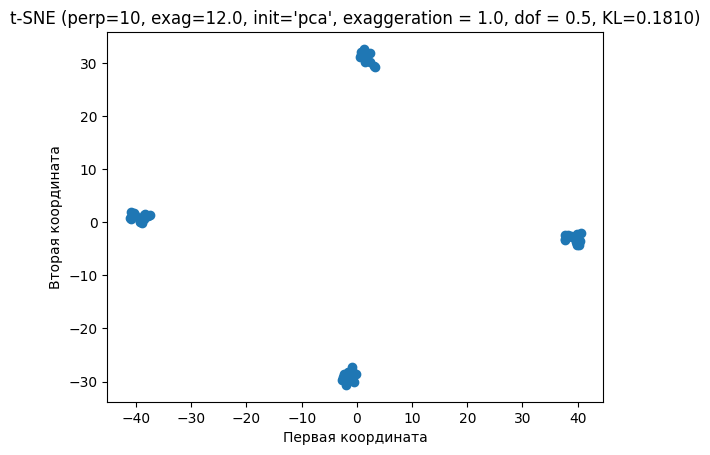

Время работы: 0.20 сек
Финальная KL-дивергенция: 0.1810

Запуск t-SNE с perplexity=10, early_exaggeration=12.0, init='random', exaggeration = 4.0, dof = 0.5
<class 'openTSNE.sklearn.TSNE'>
0.3891552434402321
TSNE(dof=0.5, early_exaggeration=12.0, exaggeration=4.0,
     initialization='random', perplexity=10, random_state=42)


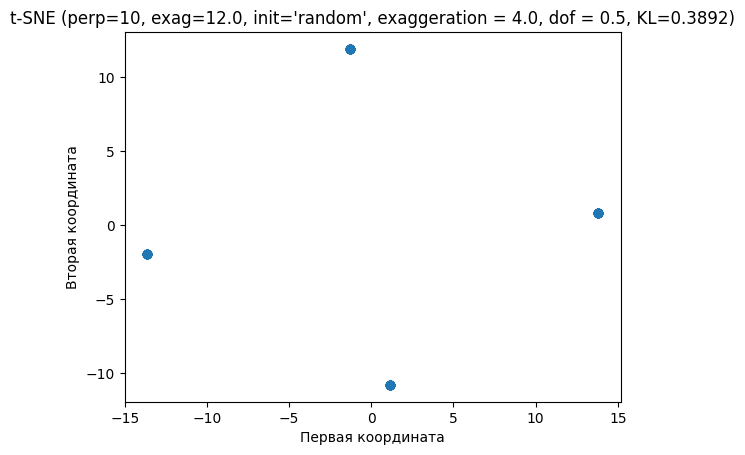

Время работы: 0.21 сек
Финальная KL-дивергенция: 0.3892

Запуск t-SNE с perplexity=10, early_exaggeration=12.0, init='pca', exaggeration = 4.0, dof = 0.5
<class 'openTSNE.sklearn.TSNE'>
0.38900914611780113
TSNE(dof=0.5, early_exaggeration=12.0, exaggeration=4.0, perplexity=10,
     random_state=42)


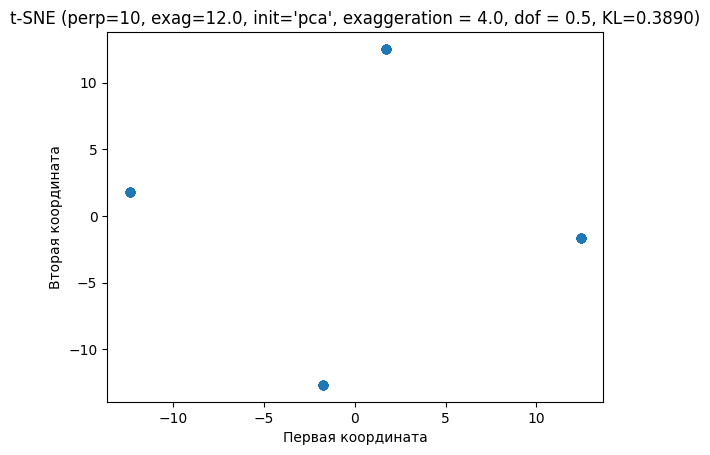

Время работы: 0.21 сек
Финальная KL-дивергенция: 0.3890

Запуск t-SNE с perplexity=10, early_exaggeration=12.0, init='random', exaggeration = 12.0, dof = 0.5
<class 'openTSNE.sklearn.TSNE'>
0.43198520352573766
TSNE(dof=0.5, early_exaggeration=12.0, exaggeration=12.0,
     initialization='random', perplexity=10, random_state=42)


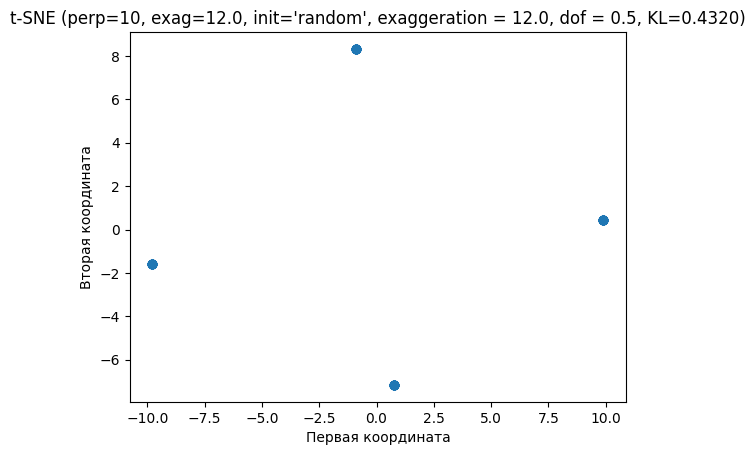

Время работы: 0.21 сек
Финальная KL-дивергенция: 0.4320

Запуск t-SNE с perplexity=10, early_exaggeration=12.0, init='pca', exaggeration = 12.0, dof = 0.5
<class 'openTSNE.sklearn.TSNE'>
0.43153228155078693
TSNE(dof=0.5, early_exaggeration=12.0, exaggeration=12.0, perplexity=10,
     random_state=42)


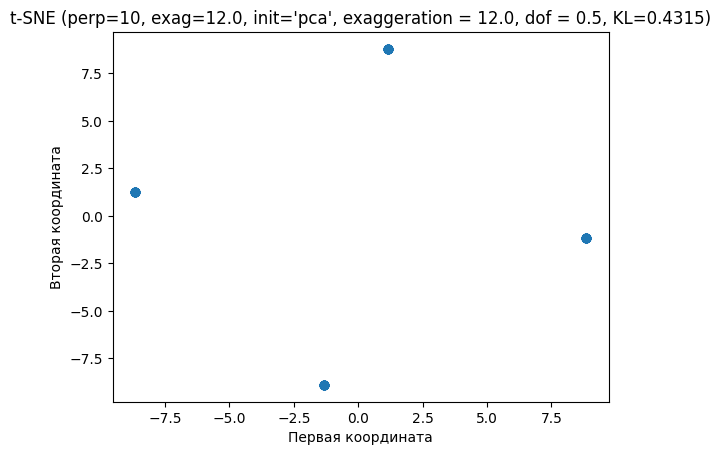

Время работы: 0.21 сек
Финальная KL-дивергенция: 0.4315

Запуск t-SNE с perplexity=10, early_exaggeration=12.0, init='random', exaggeration = None, dof = 1.0
<class 'openTSNE.sklearn.TSNE'>
0.06557502292572082
TSNE(dof=1.0, early_exaggeration=12.0, initialization='random', perplexity=10,
     random_state=42)


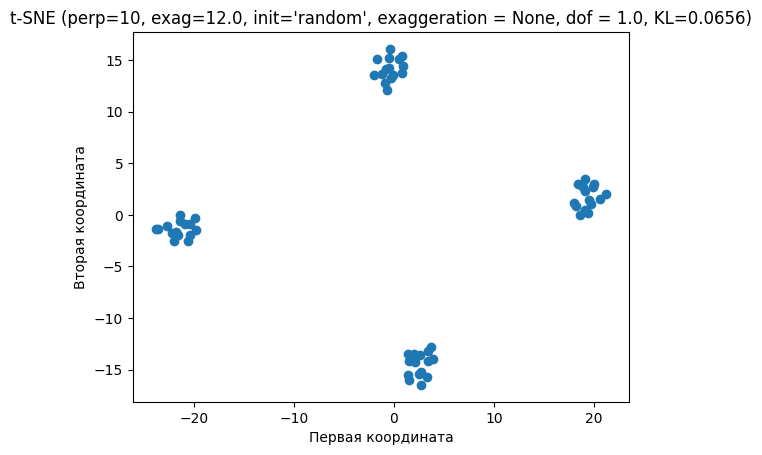

Время работы: 0.15 сек
Финальная KL-дивергенция: 0.0656

Запуск t-SNE с perplexity=10, early_exaggeration=12.0, init='pca', exaggeration = None, dof = 1.0
<class 'openTSNE.sklearn.TSNE'>
0.06537245195354124
TSNE(dof=1.0, early_exaggeration=12.0, perplexity=10, random_state=42)


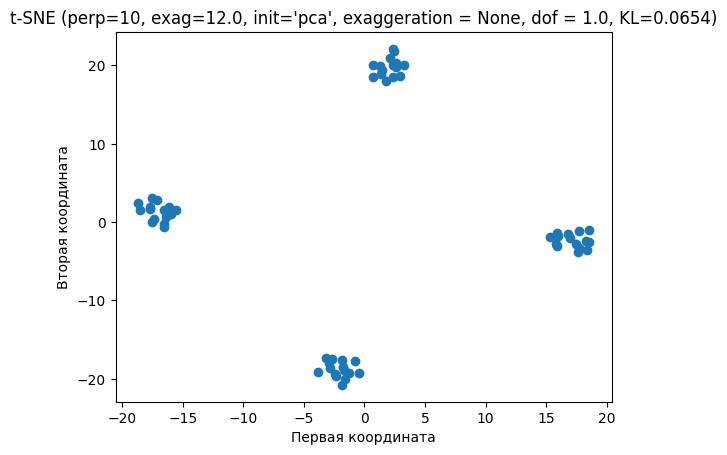

Время работы: 0.15 сек
Финальная KL-дивергенция: 0.0654

Запуск t-SNE с perplexity=10, early_exaggeration=12.0, init='random', exaggeration = 1.0, dof = 1.0
<class 'openTSNE.sklearn.TSNE'>
0.06557502292572082
TSNE(dof=1.0, early_exaggeration=12.0, exaggeration=1.0,
     initialization='random', perplexity=10, random_state=42)


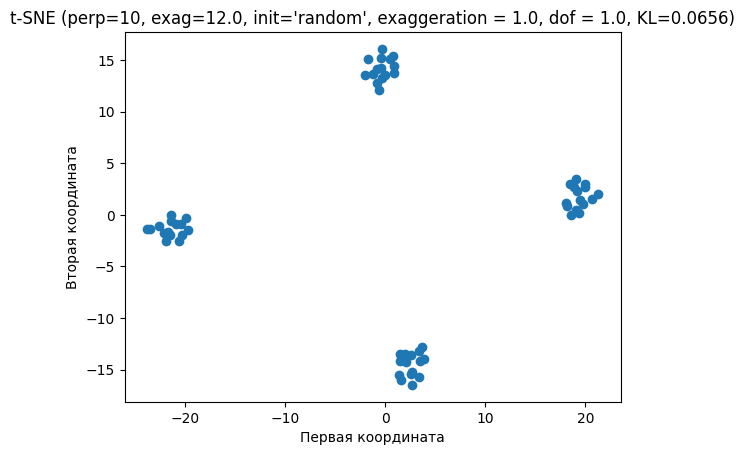

Время работы: 0.15 сек
Финальная KL-дивергенция: 0.0656

Запуск t-SNE с perplexity=10, early_exaggeration=12.0, init='pca', exaggeration = 1.0, dof = 1.0
<class 'openTSNE.sklearn.TSNE'>
0.06537245195354124
TSNE(dof=1.0, early_exaggeration=12.0, exaggeration=1.0, perplexity=10,
     random_state=42)


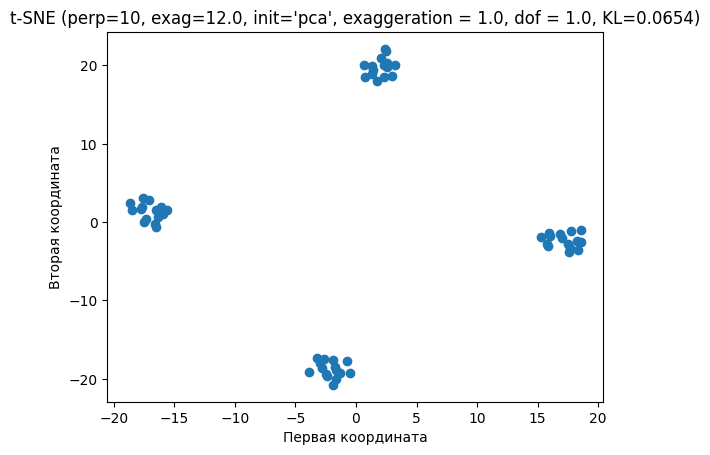

Время работы: 0.15 сек
Финальная KL-дивергенция: 0.0654

Запуск t-SNE с perplexity=10, early_exaggeration=12.0, init='random', exaggeration = 4.0, dof = 1.0
<class 'openTSNE.sklearn.TSNE'>
0.2979411132279113
TSNE(dof=1.0, early_exaggeration=12.0, exaggeration=4.0,
     initialization='random', perplexity=10, random_state=42)


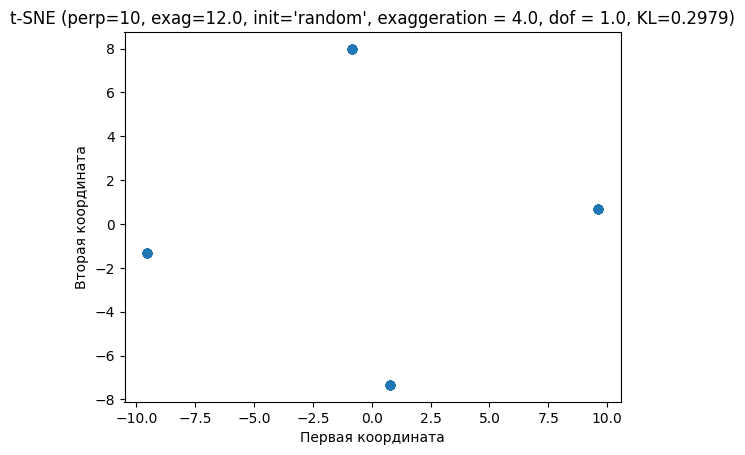

Время работы: 0.17 сек
Финальная KL-дивергенция: 0.2979

Запуск t-SNE с perplexity=10, early_exaggeration=12.0, init='pca', exaggeration = 4.0, dof = 1.0
<class 'openTSNE.sklearn.TSNE'>
0.29786529528583205
TSNE(dof=1.0, early_exaggeration=12.0, exaggeration=4.0, perplexity=10,
     random_state=42)


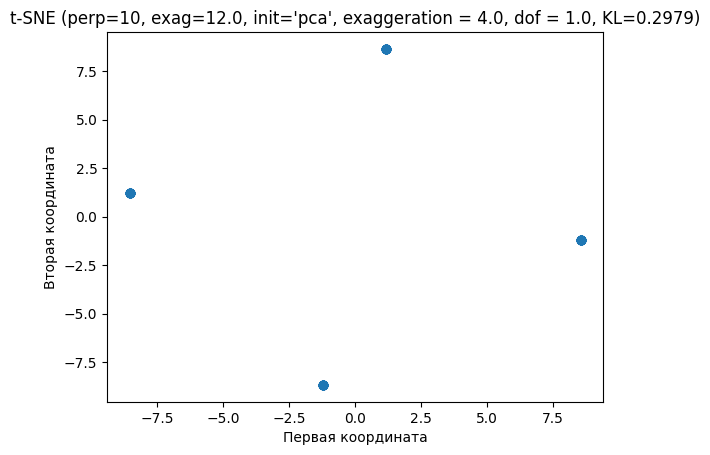

Время работы: 0.16 сек
Финальная KL-дивергенция: 0.2979

Запуск t-SNE с perplexity=10, early_exaggeration=12.0, init='random', exaggeration = 12.0, dof = 1.0
<class 'openTSNE.sklearn.TSNE'>
0.30978065509293184
TSNE(dof=1.0, early_exaggeration=12.0, exaggeration=12.0,
     initialization='random', perplexity=10, random_state=42)


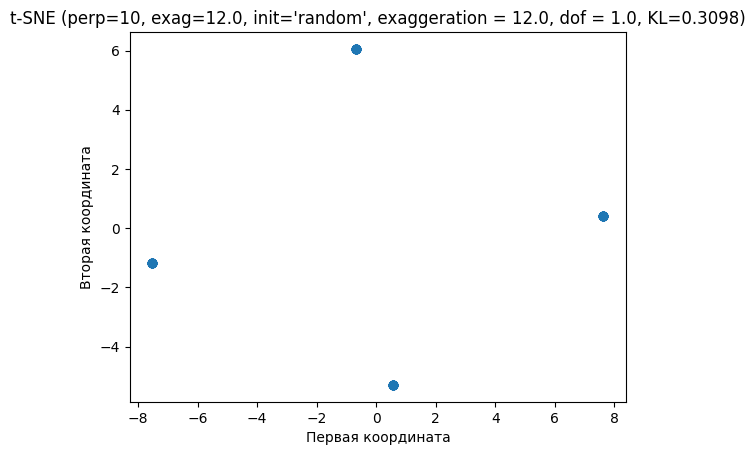

Время работы: 0.16 сек
Финальная KL-дивергенция: 0.3098

Запуск t-SNE с perplexity=10, early_exaggeration=12.0, init='pca', exaggeration = 12.0, dof = 1.0
<class 'openTSNE.sklearn.TSNE'>
0.3094439347521183
TSNE(dof=1.0, early_exaggeration=12.0, exaggeration=12.0, perplexity=10,
     random_state=42)


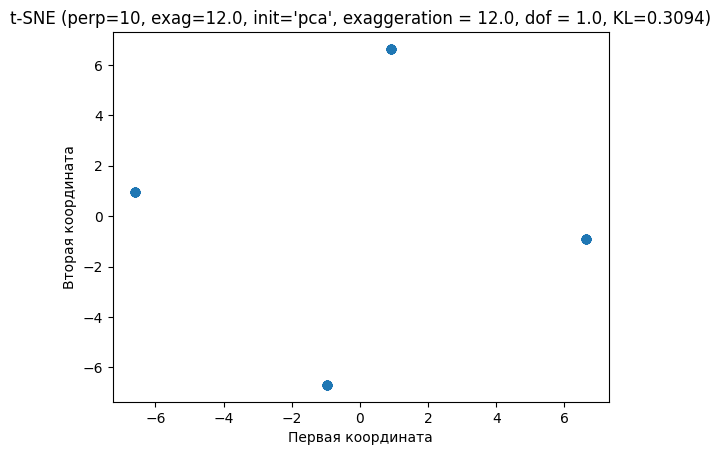

Время работы: 0.18 сек
Финальная KL-дивергенция: 0.3094

Запуск t-SNE с perplexity=10, early_exaggeration=12.0, init='random', exaggeration = None, dof = 5.0
<class 'openTSNE.sklearn.TSNE'>
0.05344156252609977
TSNE(dof=5.0, early_exaggeration=12.0, initialization='random', perplexity=10,
     random_state=42)


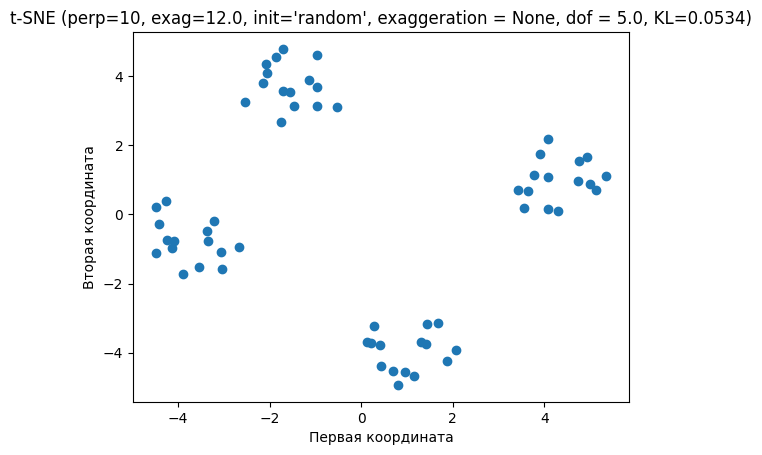

Время работы: 0.23 сек
Финальная KL-дивергенция: 0.0534

Запуск t-SNE с perplexity=10, early_exaggeration=12.0, init='pca', exaggeration = None, dof = 5.0
<class 'openTSNE.sklearn.TSNE'>
0.05388708217491356
TSNE(dof=5.0, early_exaggeration=12.0, perplexity=10, random_state=42)


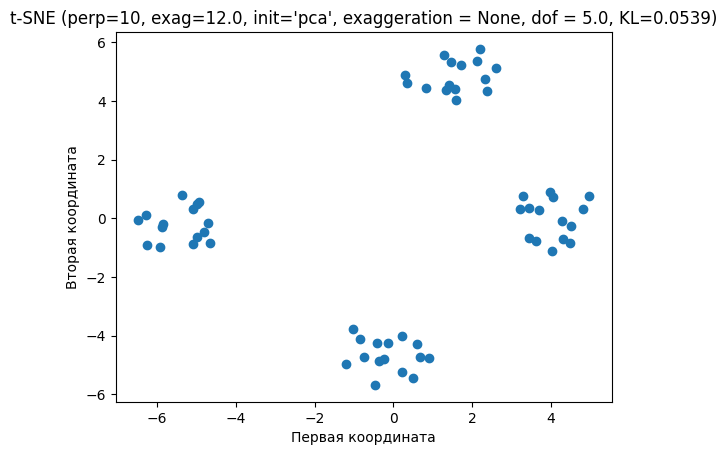

Время работы: 0.23 сек
Финальная KL-дивергенция: 0.0539

Запуск t-SNE с perplexity=10, early_exaggeration=12.0, init='random', exaggeration = 1.0, dof = 5.0
<class 'openTSNE.sklearn.TSNE'>
0.05344156252609977
TSNE(dof=5.0, early_exaggeration=12.0, exaggeration=1.0,
     initialization='random', perplexity=10, random_state=42)


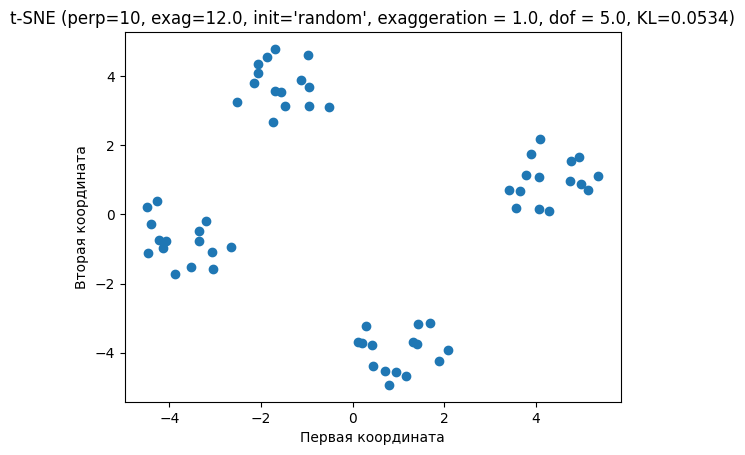

Время работы: 0.23 сек
Финальная KL-дивергенция: 0.0534

Запуск t-SNE с perplexity=10, early_exaggeration=12.0, init='pca', exaggeration = 1.0, dof = 5.0
<class 'openTSNE.sklearn.TSNE'>
0.05388708217491356
TSNE(dof=5.0, early_exaggeration=12.0, exaggeration=1.0, perplexity=10,
     random_state=42)


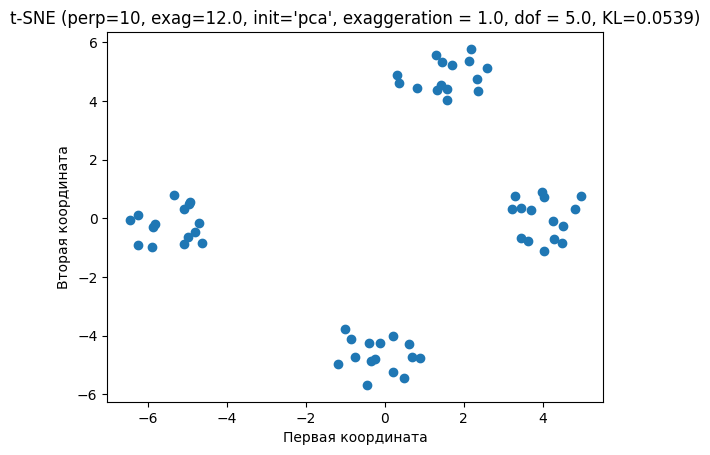

Время работы: 0.22 сек
Финальная KL-дивергенция: 0.0539

Запуск t-SNE с perplexity=10, early_exaggeration=12.0, init='random', exaggeration = 4.0, dof = 5.0
<class 'openTSNE.sklearn.TSNE'>
0.28061272228970324
TSNE(dof=5.0, early_exaggeration=12.0, exaggeration=4.0,
     initialization='random', perplexity=10, random_state=42)


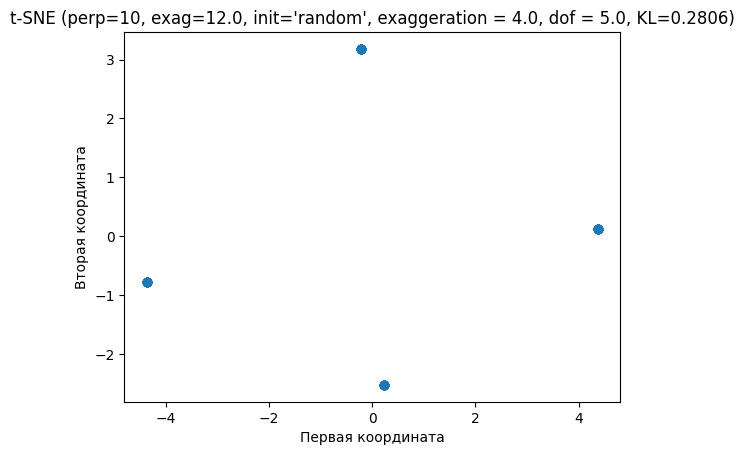

Время работы: 0.22 сек
Финальная KL-дивергенция: 0.2806

Запуск t-SNE с perplexity=10, early_exaggeration=12.0, init='pca', exaggeration = 4.0, dof = 5.0
<class 'openTSNE.sklearn.TSNE'>
0.28063488248918755
TSNE(dof=5.0, early_exaggeration=12.0, exaggeration=4.0, perplexity=10,
     random_state=42)


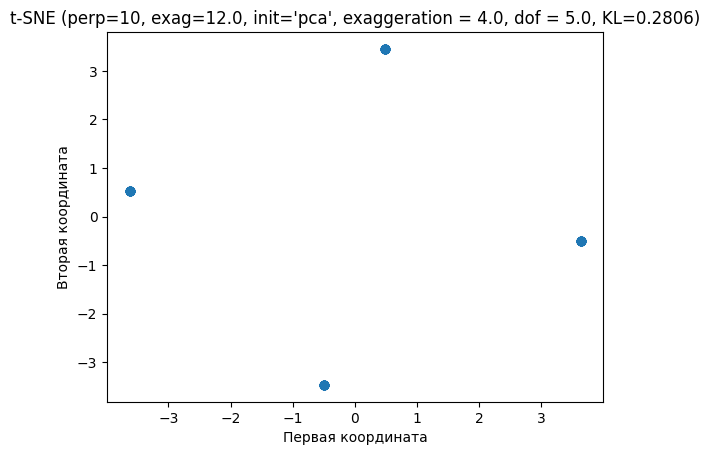

Время работы: 0.22 сек
Финальная KL-дивергенция: 0.2806

Запуск t-SNE с perplexity=10, early_exaggeration=12.0, init='random', exaggeration = 12.0, dof = 5.0
<class 'openTSNE.sklearn.TSNE'>
0.2808514705290879
TSNE(dof=5.0, early_exaggeration=12.0, exaggeration=12.0,
     initialization='random', perplexity=10, random_state=42)


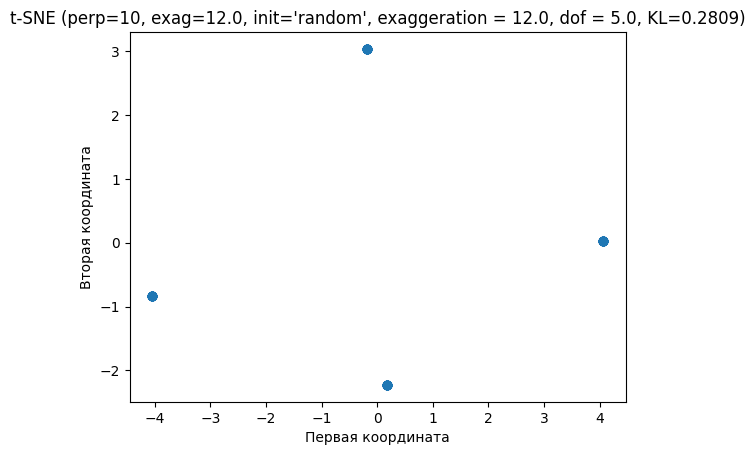

Время работы: 0.24 сек
Финальная KL-дивергенция: 0.2809

Запуск t-SNE с perplexity=10, early_exaggeration=12.0, init='pca', exaggeration = 12.0, dof = 5.0
<class 'openTSNE.sklearn.TSNE'>
0.28091150885805405
TSNE(dof=5.0, early_exaggeration=12.0, exaggeration=12.0, perplexity=10,
     random_state=42)


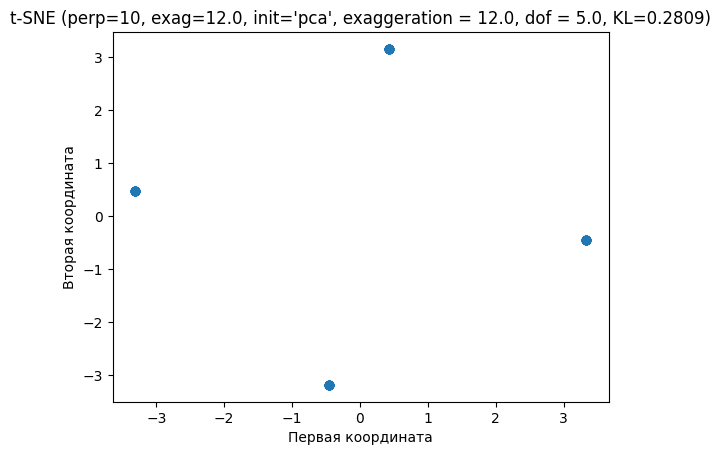

Время работы: 0.23 сек
Финальная KL-дивергенция: 0.2809

Запуск t-SNE с perplexity=10, early_exaggeration=24.0, init='random', exaggeration = None, dof = 0.5
<class 'openTSNE.sklearn.TSNE'>
0.17615988418801365
TSNE(dof=0.5, early_exaggeration=24.0, initialization='random', perplexity=10,
     random_state=42)


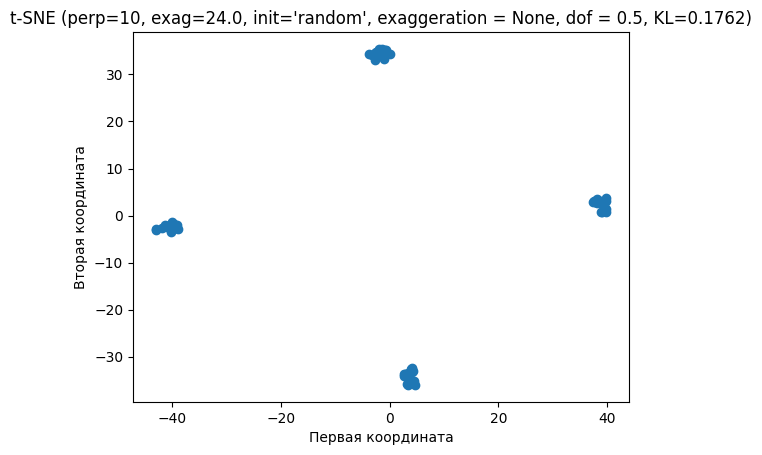

Время работы: 0.21 сек
Финальная KL-дивергенция: 0.1762

Запуск t-SNE с perplexity=10, early_exaggeration=24.0, init='pca', exaggeration = None, dof = 0.5
<class 'openTSNE.sklearn.TSNE'>
0.1838855606589629
TSNE(dof=0.5, early_exaggeration=24.0, perplexity=10, random_state=42)


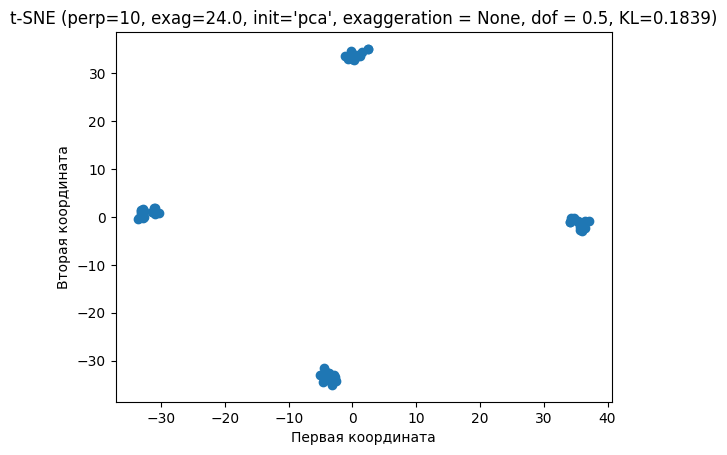

Время работы: 0.20 сек
Финальная KL-дивергенция: 0.1839

Запуск t-SNE с perplexity=10, early_exaggeration=24.0, init='random', exaggeration = 1.0, dof = 0.5
<class 'openTSNE.sklearn.TSNE'>
0.17615988418801365
TSNE(dof=0.5, early_exaggeration=24.0, exaggeration=1.0,
     initialization='random', perplexity=10, random_state=42)


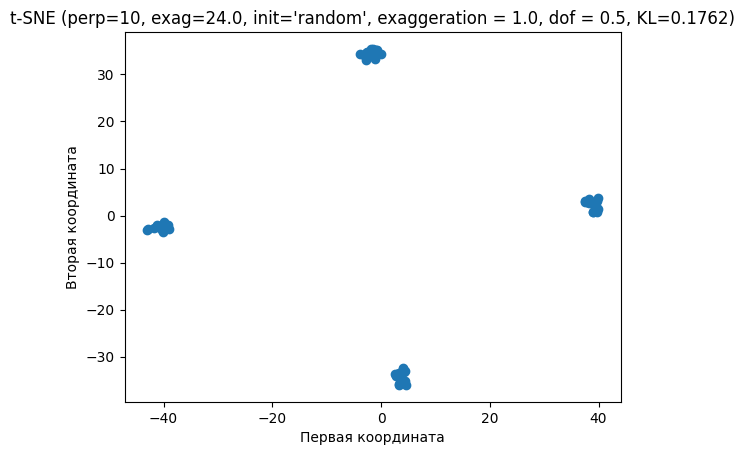

Время работы: 0.21 сек
Финальная KL-дивергенция: 0.1762

Запуск t-SNE с perplexity=10, early_exaggeration=24.0, init='pca', exaggeration = 1.0, dof = 0.5
<class 'openTSNE.sklearn.TSNE'>
0.1838855606589629
TSNE(dof=0.5, early_exaggeration=24.0, exaggeration=1.0, perplexity=10,
     random_state=42)


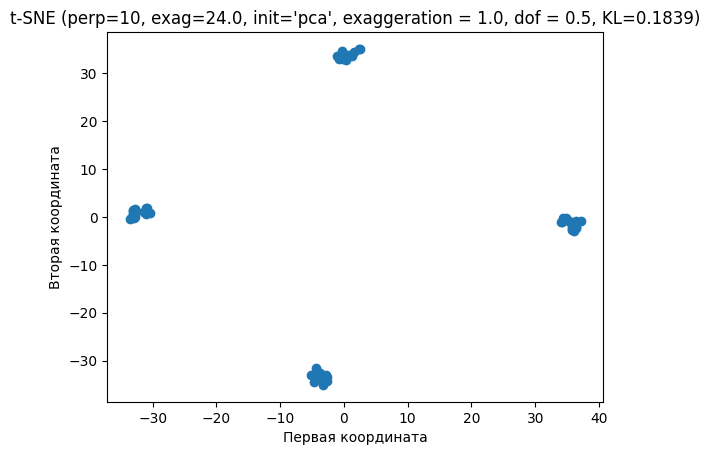

Время работы: 0.21 сек
Финальная KL-дивергенция: 0.1839

Запуск t-SNE с perplexity=10, early_exaggeration=24.0, init='random', exaggeration = 4.0, dof = 0.5
<class 'openTSNE.sklearn.TSNE'>
0.39156901839242675
TSNE(dof=0.5, early_exaggeration=24.0, exaggeration=4.0,
     initialization='random', perplexity=10, random_state=42)


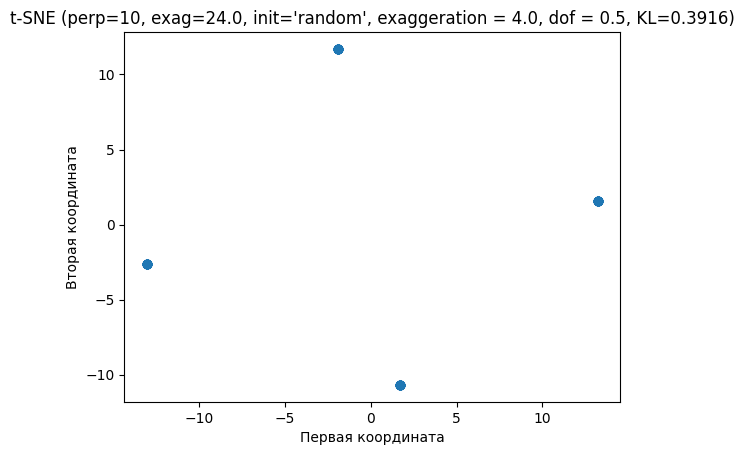

Время работы: 0.21 сек
Финальная KL-дивергенция: 0.3916

Запуск t-SNE с perplexity=10, early_exaggeration=24.0, init='pca', exaggeration = 4.0, dof = 0.5
<class 'openTSNE.sklearn.TSNE'>
0.3915608554276515
TSNE(dof=0.5, early_exaggeration=24.0, exaggeration=4.0, perplexity=10,
     random_state=42)


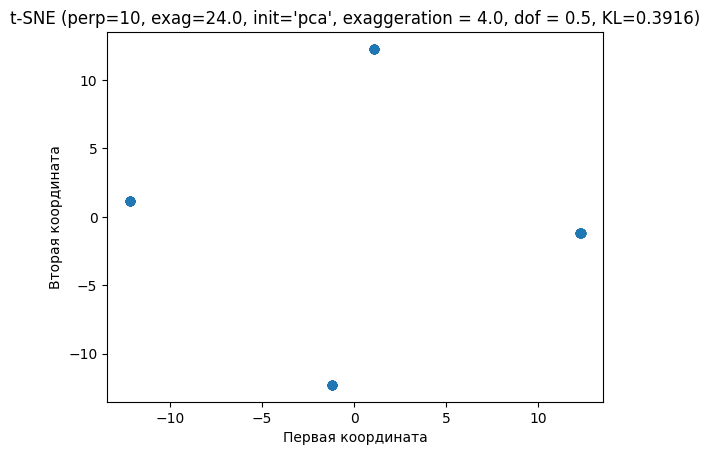

Время работы: 0.21 сек
Финальная KL-дивергенция: 0.3916

Запуск t-SNE с perplexity=10, early_exaggeration=24.0, init='random', exaggeration = 12.0, dof = 0.5
<class 'openTSNE.sklearn.TSNE'>
0.4407850465002241
TSNE(dof=0.5, early_exaggeration=24.0, exaggeration=12.0,
     initialization='random', perplexity=10, random_state=42)


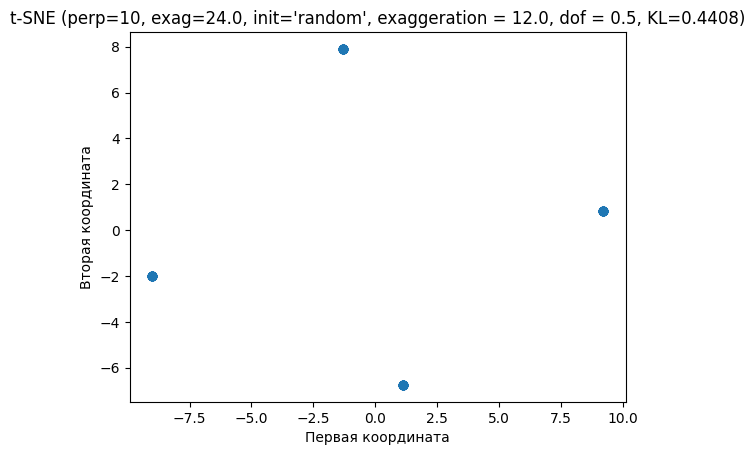

Время работы: 0.23 сек
Финальная KL-дивергенция: 0.4408

Запуск t-SNE с perplexity=10, early_exaggeration=24.0, init='pca', exaggeration = 12.0, dof = 0.5
<class 'openTSNE.sklearn.TSNE'>
0.4398401916602017
TSNE(dof=0.5, early_exaggeration=24.0, exaggeration=12.0, perplexity=10,
     random_state=42)


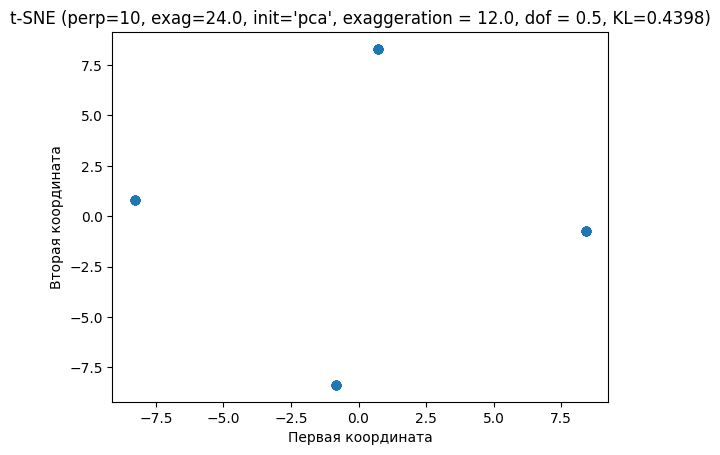

Время работы: 0.21 сек
Финальная KL-дивергенция: 0.4398

Запуск t-SNE с perplexity=10, early_exaggeration=24.0, init='random', exaggeration = None, dof = 1.0
<class 'openTSNE.sklearn.TSNE'>
0.06895537903237514
TSNE(dof=1.0, early_exaggeration=24.0, initialization='random', perplexity=10,
     random_state=42)


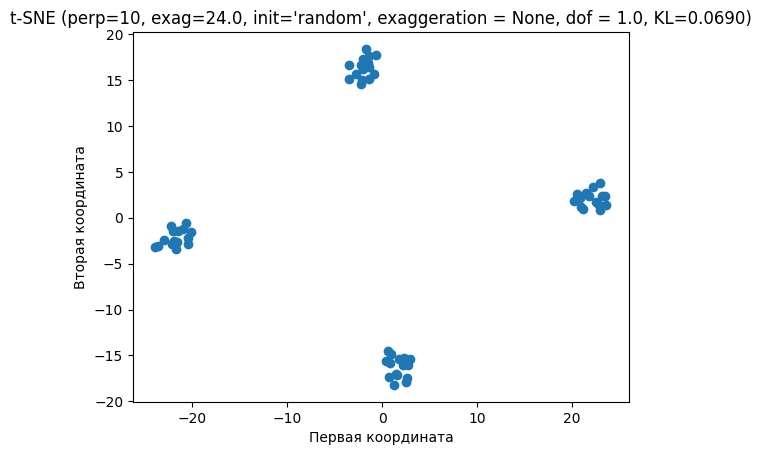

Время работы: 0.14 сек
Финальная KL-дивергенция: 0.0690

Запуск t-SNE с perplexity=10, early_exaggeration=24.0, init='pca', exaggeration = None, dof = 1.0
<class 'openTSNE.sklearn.TSNE'>
0.06658177178434421
TSNE(dof=1.0, early_exaggeration=24.0, perplexity=10, random_state=42)


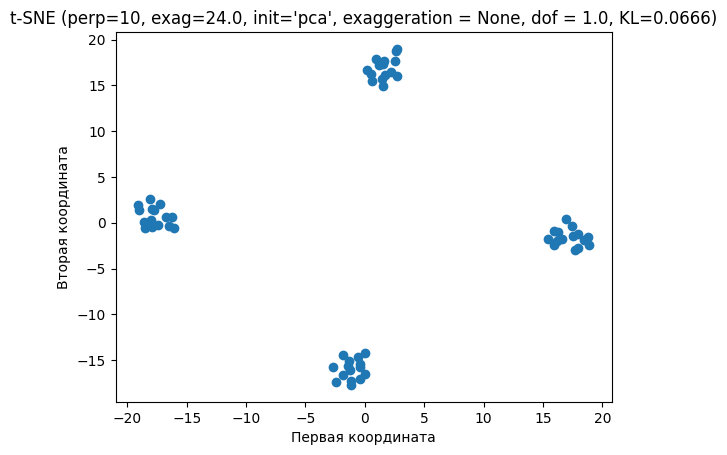

Время работы: 0.17 сек
Финальная KL-дивергенция: 0.0666

Запуск t-SNE с perplexity=10, early_exaggeration=24.0, init='random', exaggeration = 1.0, dof = 1.0
<class 'openTSNE.sklearn.TSNE'>
0.06895537903237514
TSNE(dof=1.0, early_exaggeration=24.0, exaggeration=1.0,
     initialization='random', perplexity=10, random_state=42)


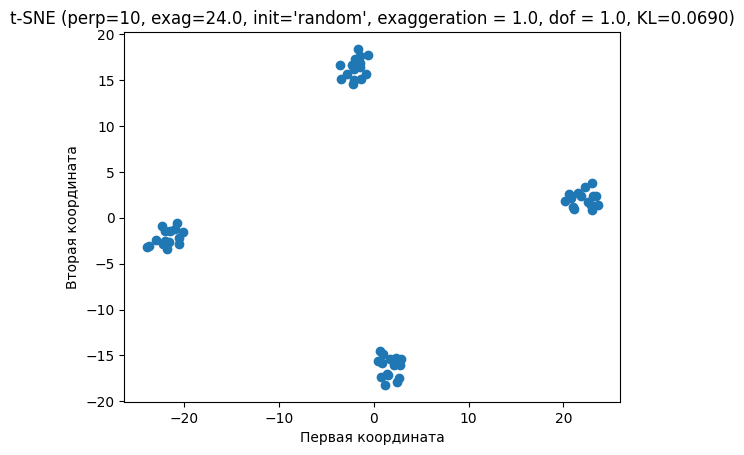

Время работы: 0.17 сек
Финальная KL-дивергенция: 0.0690

Запуск t-SNE с perplexity=10, early_exaggeration=24.0, init='pca', exaggeration = 1.0, dof = 1.0
<class 'openTSNE.sklearn.TSNE'>
0.06658177178434421
TSNE(dof=1.0, early_exaggeration=24.0, exaggeration=1.0, perplexity=10,
     random_state=42)


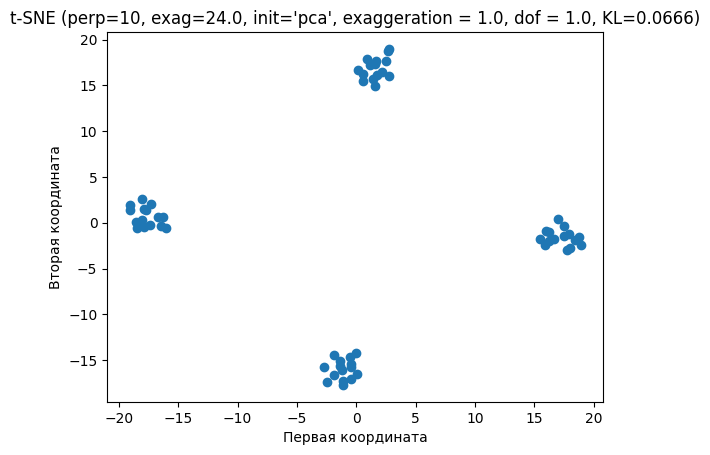

Время работы: 0.18 сек
Финальная KL-дивергенция: 0.0666

Запуск t-SNE с perplexity=10, early_exaggeration=24.0, init='random', exaggeration = 4.0, dof = 1.0
<class 'openTSNE.sklearn.TSNE'>
0.29857815972682555
TSNE(dof=1.0, early_exaggeration=24.0, exaggeration=4.0,
     initialization='random', perplexity=10, random_state=42)


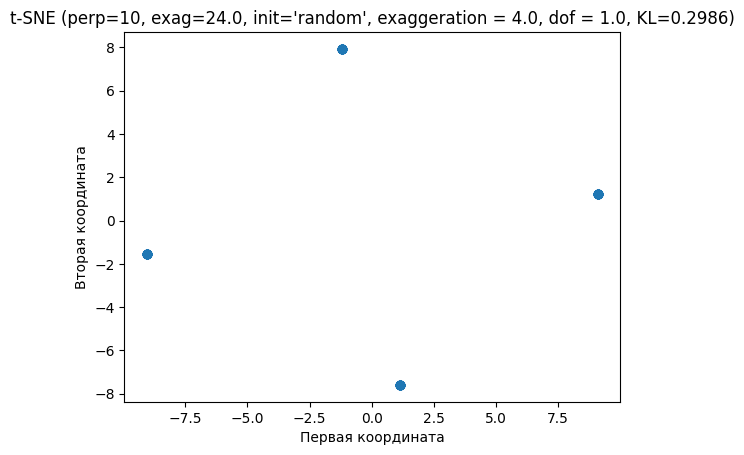

Время работы: 0.18 сек
Финальная KL-дивергенция: 0.2986

Запуск t-SNE с perplexity=10, early_exaggeration=24.0, init='pca', exaggeration = 4.0, dof = 1.0
<class 'openTSNE.sklearn.TSNE'>
0.29847206524101644
TSNE(dof=1.0, early_exaggeration=24.0, exaggeration=4.0, perplexity=10,
     random_state=42)


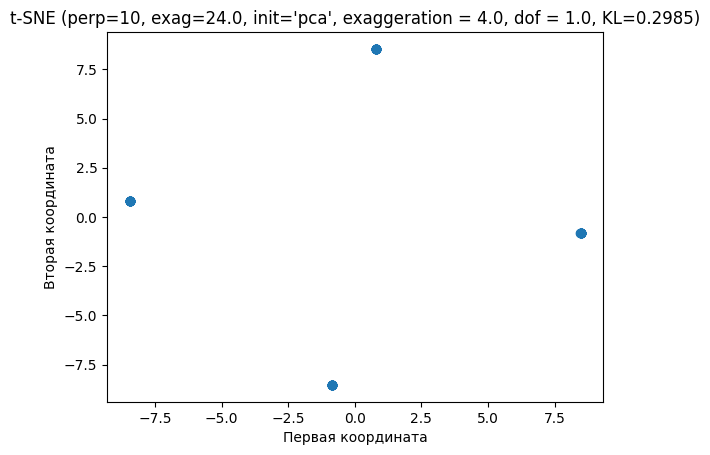

Время работы: 0.18 сек
Финальная KL-дивергенция: 0.2985

Запуск t-SNE с perplexity=10, early_exaggeration=24.0, init='random', exaggeration = 12.0, dof = 1.0
<class 'openTSNE.sklearn.TSNE'>
0.3125842820736713
TSNE(dof=1.0, early_exaggeration=24.0, exaggeration=12.0,
     initialization='random', perplexity=10, random_state=42)


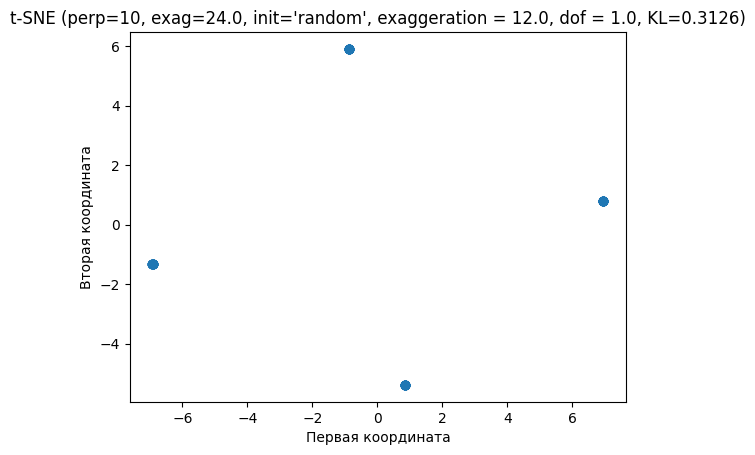

Время работы: 0.17 сек
Финальная KL-дивергенция: 0.3126

Запуск t-SNE с perplexity=10, early_exaggeration=24.0, init='pca', exaggeration = 12.0, dof = 1.0
<class 'openTSNE.sklearn.TSNE'>
0.31231799385709813
TSNE(dof=1.0, early_exaggeration=24.0, exaggeration=12.0, perplexity=10,
     random_state=42)


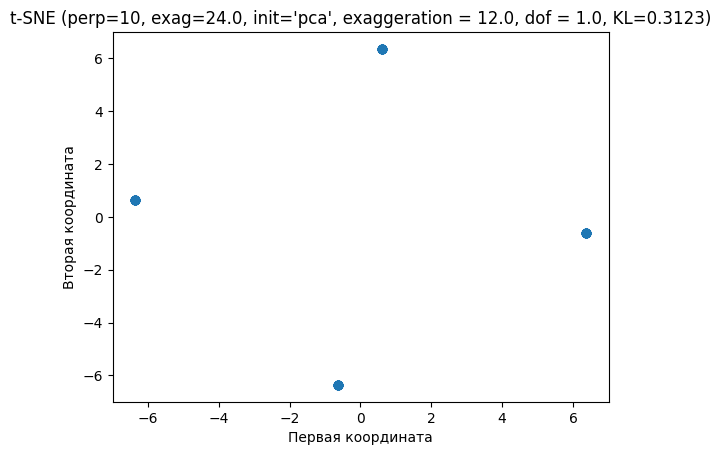

Время работы: 0.17 сек
Финальная KL-дивергенция: 0.3123

Запуск t-SNE с perplexity=10, early_exaggeration=24.0, init='random', exaggeration = None, dof = 5.0
<class 'openTSNE.sklearn.TSNE'>
0.05376641247818181
TSNE(dof=5.0, early_exaggeration=24.0, initialization='random', perplexity=10,
     random_state=42)


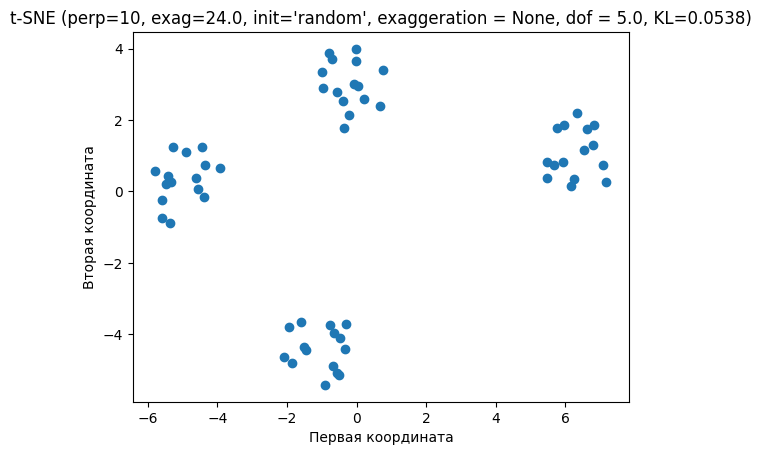

Время работы: 0.22 сек
Финальная KL-дивергенция: 0.0538

Запуск t-SNE с perplexity=10, early_exaggeration=24.0, init='pca', exaggeration = None, dof = 5.0
<class 'openTSNE.sklearn.TSNE'>
0.05409037224107216
TSNE(dof=5.0, early_exaggeration=24.0, perplexity=10, random_state=42)


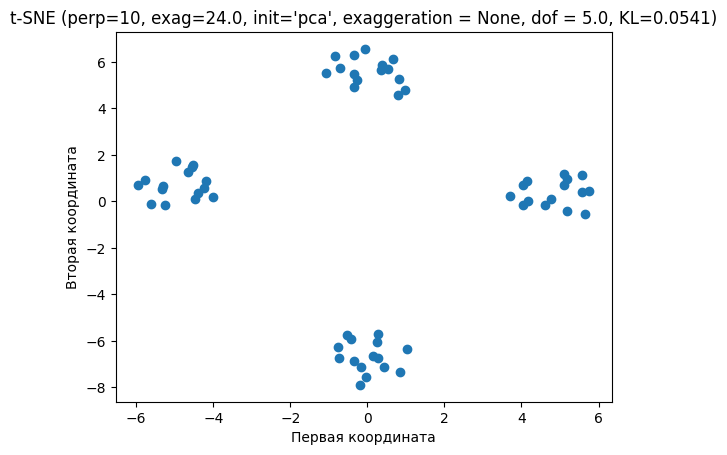

Время работы: 0.21 сек
Финальная KL-дивергенция: 0.0541

Запуск t-SNE с perplexity=10, early_exaggeration=24.0, init='random', exaggeration = 1.0, dof = 5.0
<class 'openTSNE.sklearn.TSNE'>
0.05376641247818181
TSNE(dof=5.0, early_exaggeration=24.0, exaggeration=1.0,
     initialization='random', perplexity=10, random_state=42)


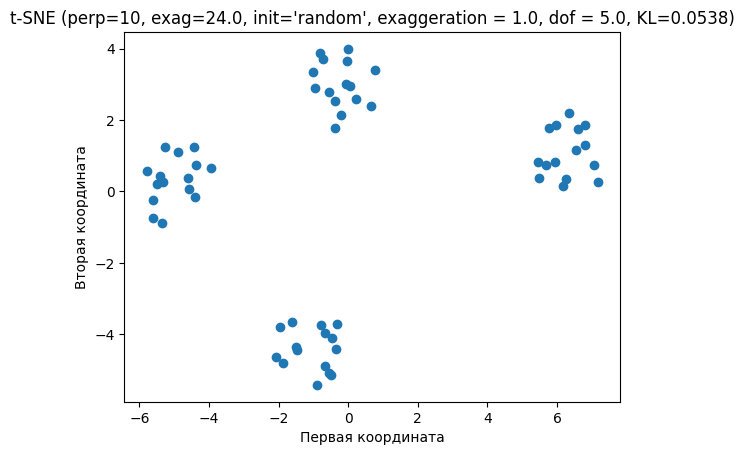

Время работы: 0.23 сек
Финальная KL-дивергенция: 0.0538

Запуск t-SNE с perplexity=10, early_exaggeration=24.0, init='pca', exaggeration = 1.0, dof = 5.0
<class 'openTSNE.sklearn.TSNE'>
0.05409037224107216
TSNE(dof=5.0, early_exaggeration=24.0, exaggeration=1.0, perplexity=10,
     random_state=42)


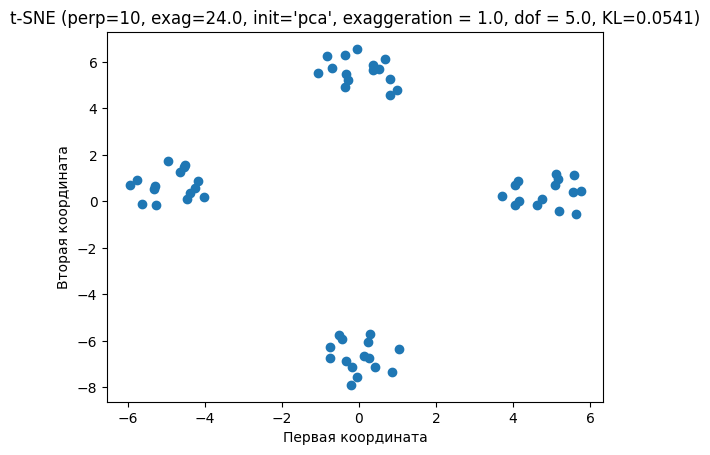

Время работы: 0.24 сек
Финальная KL-дивергенция: 0.0541

Запуск t-SNE с perplexity=10, early_exaggeration=24.0, init='random', exaggeration = 4.0, dof = 5.0
<class 'openTSNE.sklearn.TSNE'>
0.28066177091433
TSNE(dof=5.0, early_exaggeration=24.0, exaggeration=4.0,
     initialization='random', perplexity=10, random_state=42)


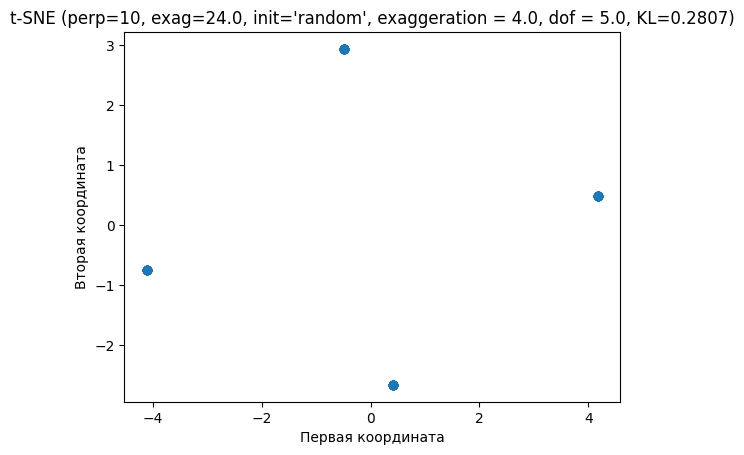

Время работы: 0.22 сек
Финальная KL-дивергенция: 0.2807

Запуск t-SNE с perplexity=10, early_exaggeration=24.0, init='pca', exaggeration = 4.0, dof = 5.0
<class 'openTSNE.sklearn.TSNE'>
0.2806699922924114
TSNE(dof=5.0, early_exaggeration=24.0, exaggeration=4.0, perplexity=10,
     random_state=42)


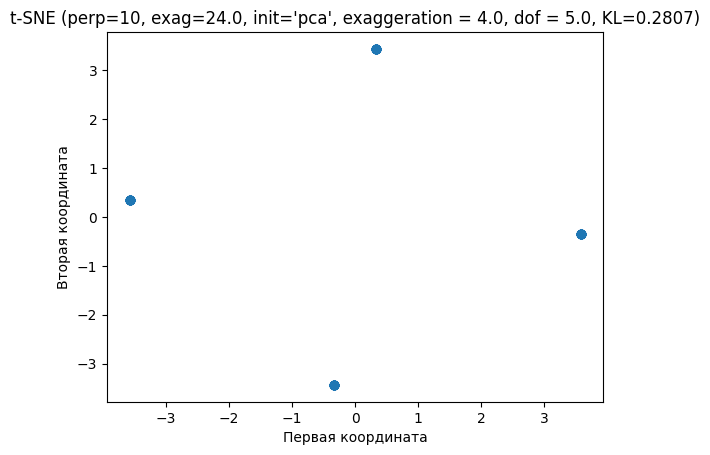

Время работы: 0.22 сек
Финальная KL-дивергенция: 0.2807

Запуск t-SNE с perplexity=10, early_exaggeration=24.0, init='random', exaggeration = 12.0, dof = 5.0
<class 'openTSNE.sklearn.TSNE'>
0.2858650231632085
TSNE(dof=5.0, early_exaggeration=24.0, exaggeration=12.0,
     initialization='random', perplexity=10, random_state=42)


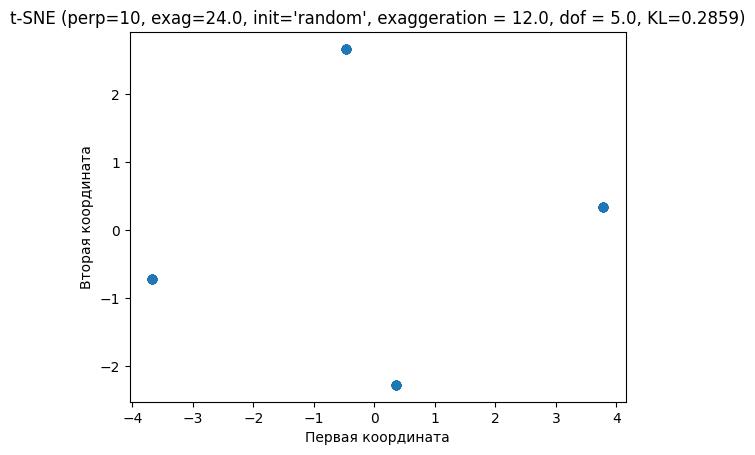

Время работы: 0.22 сек
Финальная KL-дивергенция: 0.2859

Запуск t-SNE с perplexity=10, early_exaggeration=24.0, init='pca', exaggeration = 12.0, dof = 5.0
<class 'openTSNE.sklearn.TSNE'>
0.26675321495445736
TSNE(dof=5.0, early_exaggeration=24.0, exaggeration=12.0, perplexity=10,
     random_state=42)


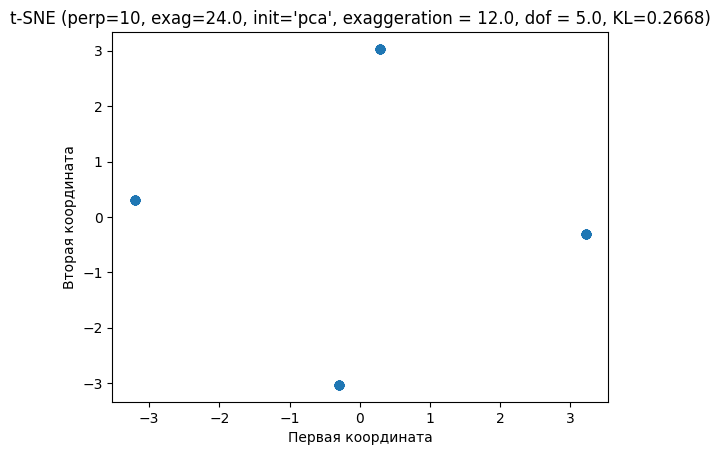

Perplexity value 20 is too high. Using perplexity 19.67 instead


Время работы: 0.22 сек
Финальная KL-дивергенция: 0.2668

Запуск t-SNE с perplexity=20, early_exaggeration=4.0, init='random', exaggeration = None, dof = 0.5
<class 'openTSNE.sklearn.TSNE'>
0.008550834236846327
TSNE(dof=0.5, early_exaggeration=4.0, initialization='random', perplexity=20,
     random_state=42)


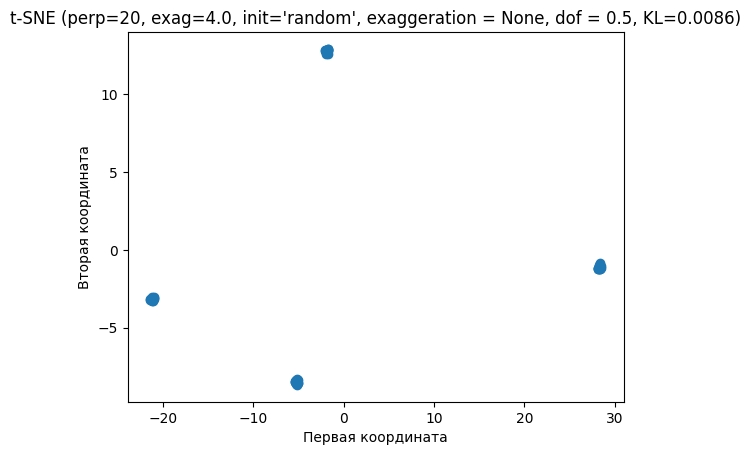

Perplexity value 20 is too high. Using perplexity 19.67 instead


Время работы: 0.24 сек
Финальная KL-дивергенция: 0.0086

Запуск t-SNE с perplexity=20, early_exaggeration=4.0, init='pca', exaggeration = None, dof = 0.5
<class 'openTSNE.sklearn.TSNE'>
0.00448169540019272
TSNE(dof=0.5, early_exaggeration=4.0, perplexity=20, random_state=42)


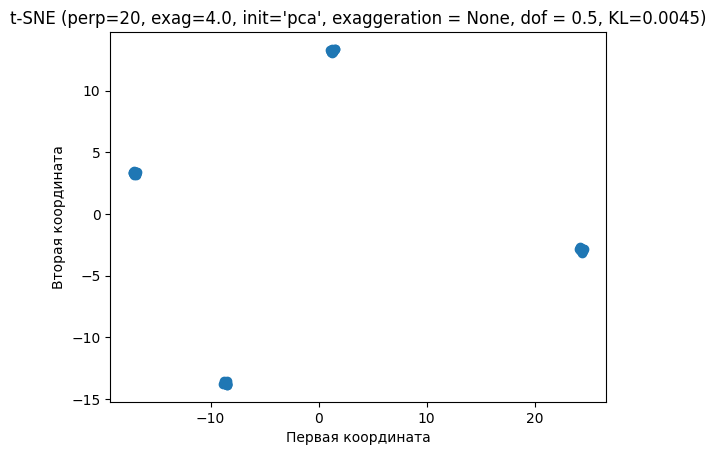

Perplexity value 20 is too high. Using perplexity 19.67 instead


Время работы: 0.23 сек
Финальная KL-дивергенция: 0.0045

Запуск t-SNE с perplexity=20, early_exaggeration=4.0, init='random', exaggeration = 1.0, dof = 0.5
<class 'openTSNE.sklearn.TSNE'>
0.008550834236846327
TSNE(dof=0.5, early_exaggeration=4.0, exaggeration=1.0, initialization='random',
     perplexity=20, random_state=42)


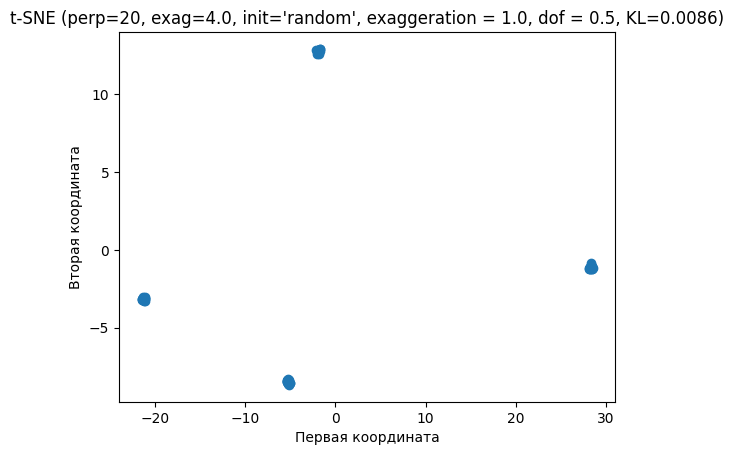

Perplexity value 20 is too high. Using perplexity 19.67 instead


Время работы: 0.23 сек
Финальная KL-дивергенция: 0.0086

Запуск t-SNE с perplexity=20, early_exaggeration=4.0, init='pca', exaggeration = 1.0, dof = 0.5
<class 'openTSNE.sklearn.TSNE'>
0.00448169540019272
TSNE(dof=0.5, early_exaggeration=4.0, exaggeration=1.0, perplexity=20,
     random_state=42)


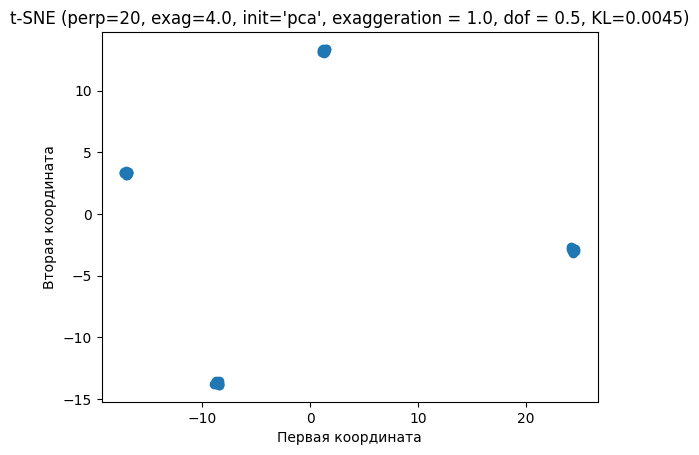

Perplexity value 20 is too high. Using perplexity 19.67 instead


Время работы: 0.24 сек
Финальная KL-дивергенция: 0.0045

Запуск t-SNE с perplexity=20, early_exaggeration=4.0, init='random', exaggeration = 4.0, dof = 0.5
<class 'openTSNE.sklearn.TSNE'>
0.15333242737934505
TSNE(dof=0.5, early_exaggeration=4.0, exaggeration=4.0, initialization='random',
     perplexity=20, random_state=42)


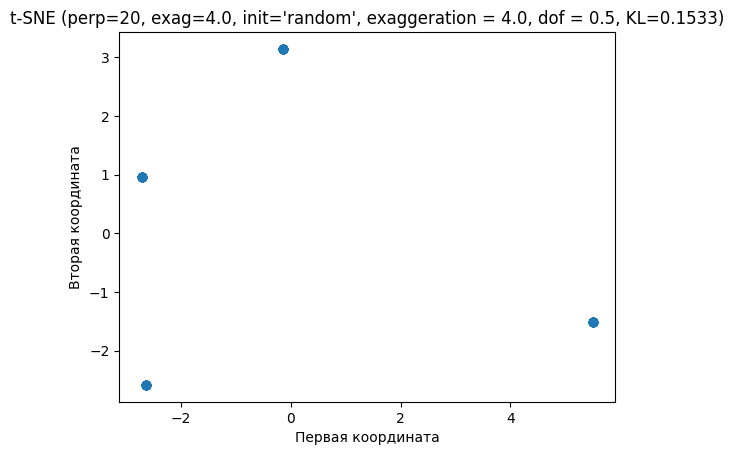

Perplexity value 20 is too high. Using perplexity 19.67 instead


Время работы: 0.23 сек
Финальная KL-дивергенция: 0.1533

Запуск t-SNE с perplexity=20, early_exaggeration=4.0, init='pca', exaggeration = 4.0, dof = 0.5
<class 'openTSNE.sklearn.TSNE'>
0.15851198673206035
TSNE(dof=0.5, early_exaggeration=4.0, exaggeration=4.0, perplexity=20,
     random_state=42)


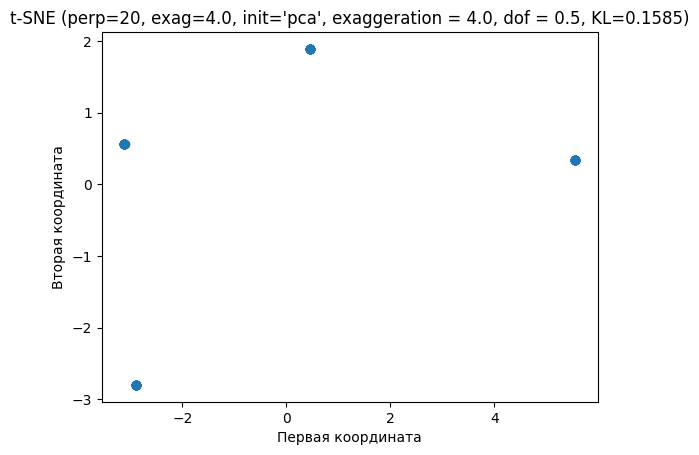

Perplexity value 20 is too high. Using perplexity 19.67 instead


Время работы: 0.23 сек
Финальная KL-дивергенция: 0.1585

Запуск t-SNE с perplexity=20, early_exaggeration=4.0, init='random', exaggeration = 12.0, dof = 0.5
<class 'openTSNE.sklearn.TSNE'>
0.9803058692203415
TSNE(dof=0.5, early_exaggeration=4.0, exaggeration=12.0,
     initialization='random', perplexity=20, random_state=42)


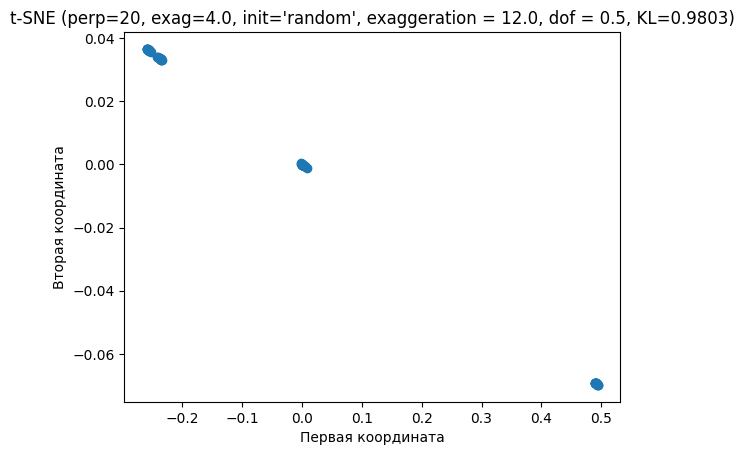

Perplexity value 20 is too high. Using perplexity 19.67 instead


Время работы: 0.22 сек
Финальная KL-дивергенция: 0.9803

Запуск t-SNE с perplexity=20, early_exaggeration=4.0, init='pca', exaggeration = 12.0, dof = 0.5
<class 'openTSNE.sklearn.TSNE'>
0.9802991003553858
TSNE(dof=0.5, early_exaggeration=4.0, exaggeration=12.0, perplexity=20,
     random_state=42)


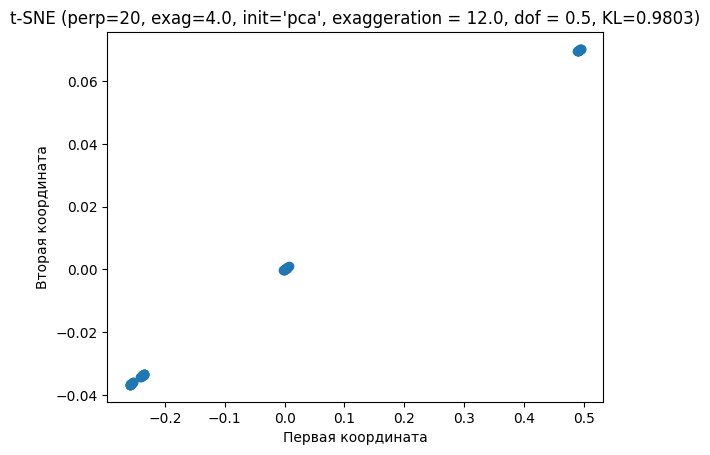

Perplexity value 20 is too high. Using perplexity 19.67 instead


Время работы: 0.21 сек
Финальная KL-дивергенция: 0.9803

Запуск t-SNE с perplexity=20, early_exaggeration=4.0, init='random', exaggeration = None, dof = 1.0
<class 'openTSNE.sklearn.TSNE'>
0.012190658523921094
TSNE(dof=1.0, early_exaggeration=4.0, initialization='random', perplexity=20,
     random_state=42)


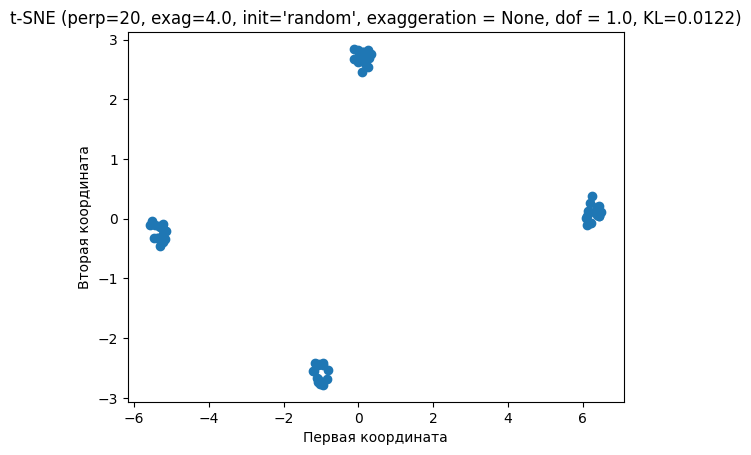

Perplexity value 20 is too high. Using perplexity 19.67 instead


Время работы: 0.17 сек
Финальная KL-дивергенция: 0.0122

Запуск t-SNE с perplexity=20, early_exaggeration=4.0, init='pca', exaggeration = None, dof = 1.0
<class 'openTSNE.sklearn.TSNE'>
0.002364278527302588
TSNE(dof=1.0, early_exaggeration=4.0, perplexity=20, random_state=42)


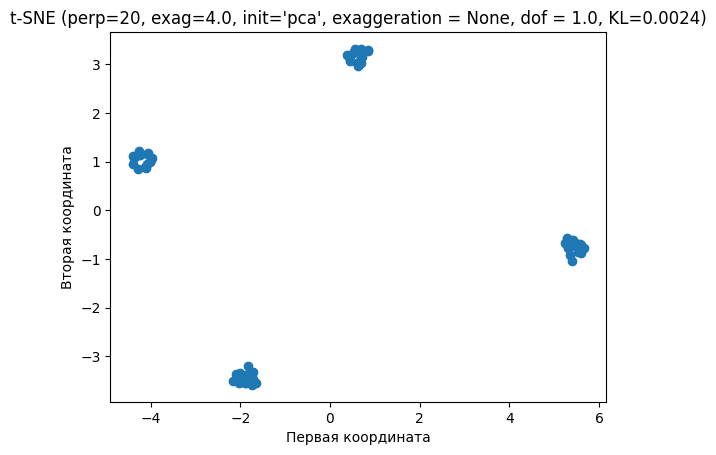

Perplexity value 20 is too high. Using perplexity 19.67 instead


Время работы: 0.17 сек
Финальная KL-дивергенция: 0.0024

Запуск t-SNE с perplexity=20, early_exaggeration=4.0, init='random', exaggeration = 1.0, dof = 1.0
<class 'openTSNE.sklearn.TSNE'>
0.012190658523921094
TSNE(dof=1.0, early_exaggeration=4.0, exaggeration=1.0, initialization='random',
     perplexity=20, random_state=42)


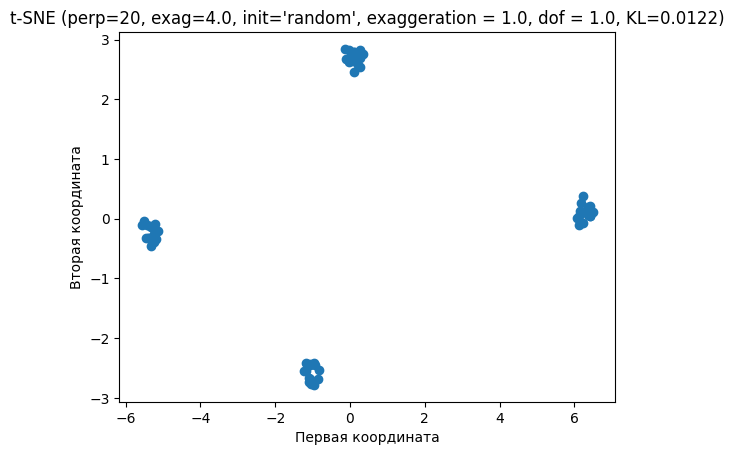

Perplexity value 20 is too high. Using perplexity 19.67 instead


Время работы: 0.17 сек
Финальная KL-дивергенция: 0.0122

Запуск t-SNE с perplexity=20, early_exaggeration=4.0, init='pca', exaggeration = 1.0, dof = 1.0
<class 'openTSNE.sklearn.TSNE'>
0.002364278527302588
TSNE(dof=1.0, early_exaggeration=4.0, exaggeration=1.0, perplexity=20,
     random_state=42)


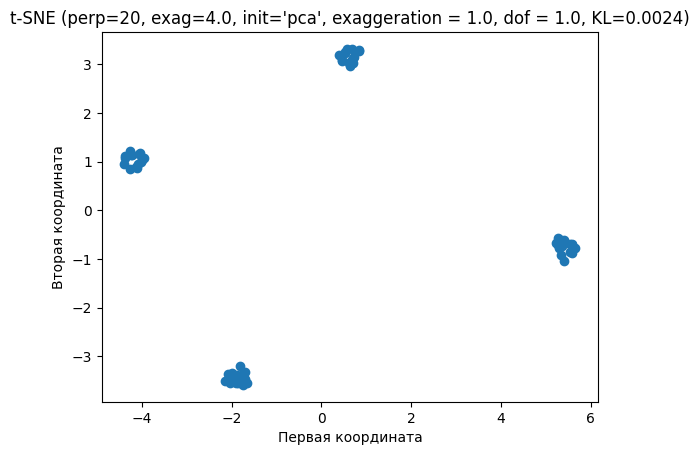

Perplexity value 20 is too high. Using perplexity 19.67 instead


Время работы: 0.16 сек
Финальная KL-дивергенция: 0.0024

Запуск t-SNE с perplexity=20, early_exaggeration=4.0, init='random', exaggeration = 4.0, dof = 1.0
<class 'openTSNE.sklearn.TSNE'>
0.17034691840583616
TSNE(dof=1.0, early_exaggeration=4.0, exaggeration=4.0, initialization='random',
     perplexity=20, random_state=42)


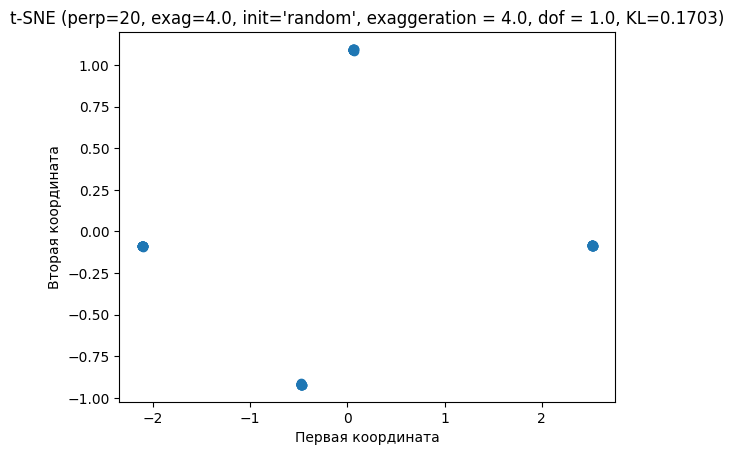

Perplexity value 20 is too high. Using perplexity 19.67 instead


Время работы: 0.17 сек
Финальная KL-дивергенция: 0.1703

Запуск t-SNE с perplexity=20, early_exaggeration=4.0, init='pca', exaggeration = 4.0, dof = 1.0
<class 'openTSNE.sklearn.TSNE'>
0.1567078346990387
TSNE(dof=1.0, early_exaggeration=4.0, exaggeration=4.0, perplexity=20,
     random_state=42)


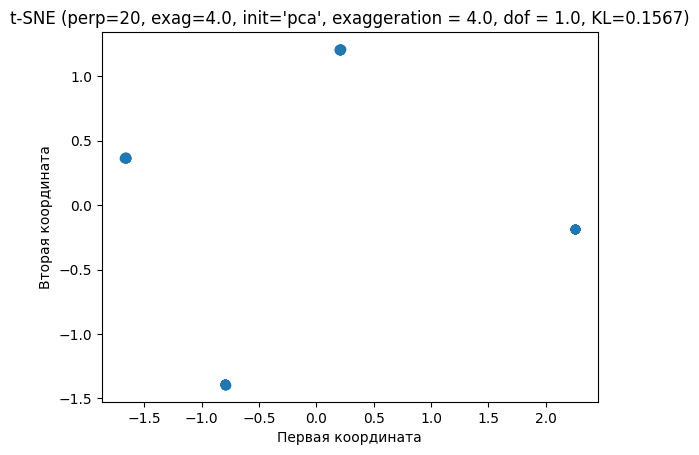

Perplexity value 20 is too high. Using perplexity 19.67 instead


Время работы: 0.18 сек
Финальная KL-дивергенция: 0.1567

Запуск t-SNE с perplexity=20, early_exaggeration=4.0, init='random', exaggeration = 12.0, dof = 1.0
<class 'openTSNE.sklearn.TSNE'>
0.9700599751591268
TSNE(dof=1.0, early_exaggeration=4.0, exaggeration=12.0,
     initialization='random', perplexity=20, random_state=42)


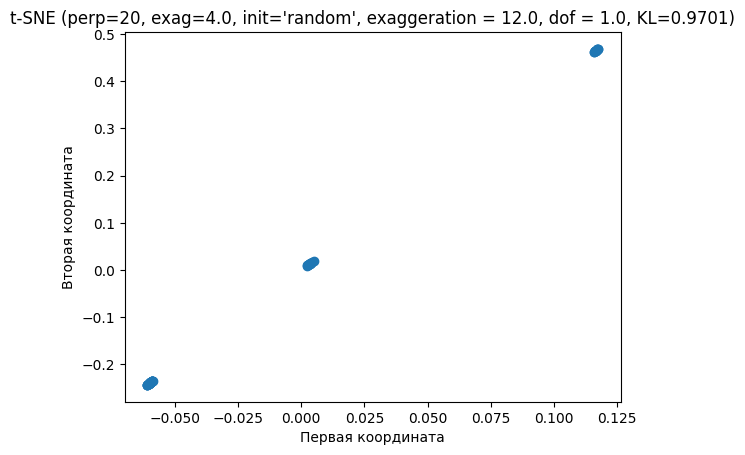

Perplexity value 20 is too high. Using perplexity 19.67 instead


Время работы: 0.18 сек
Финальная KL-дивергенция: 0.9701

Запуск t-SNE с perplexity=20, early_exaggeration=4.0, init='pca', exaggeration = 12.0, dof = 1.0
<class 'openTSNE.sklearn.TSNE'>
0.970057538432231
TSNE(dof=1.0, early_exaggeration=4.0, exaggeration=12.0, perplexity=20,
     random_state=42)


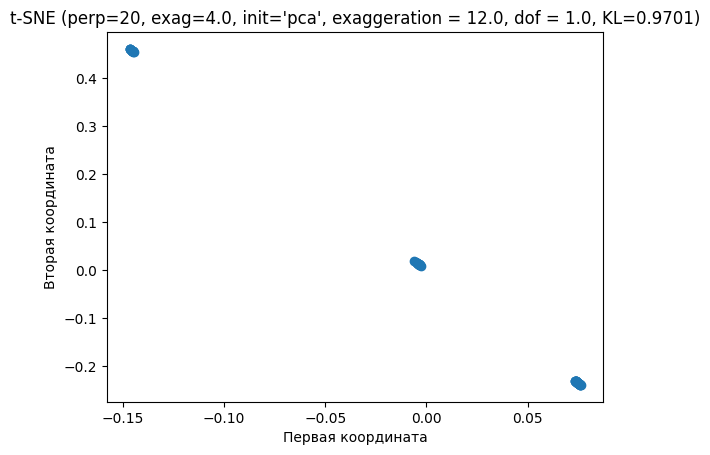

Perplexity value 20 is too high. Using perplexity 19.67 instead


Время работы: 0.17 сек
Финальная KL-дивергенция: 0.9701

Запуск t-SNE с perplexity=20, early_exaggeration=4.0, init='random', exaggeration = None, dof = 5.0
<class 'openTSNE.sklearn.TSNE'>
0.005361947709827675
TSNE(dof=5.0, early_exaggeration=4.0, initialization='random', perplexity=20,
     random_state=42)


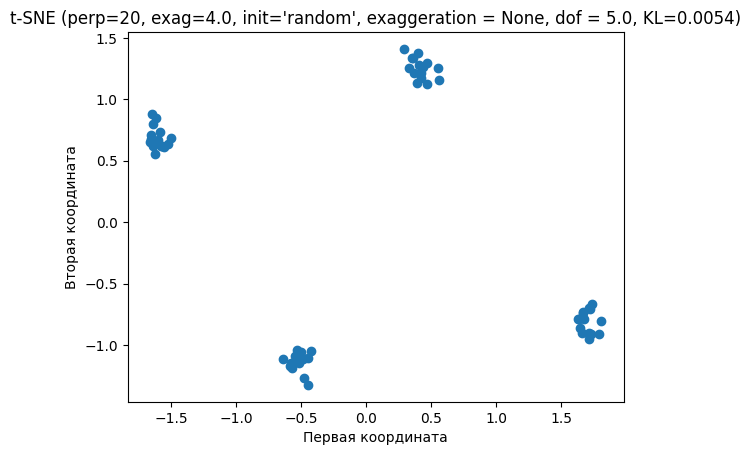

Perplexity value 20 is too high. Using perplexity 19.67 instead


Время работы: 0.21 сек
Финальная KL-дивергенция: 0.0054

Запуск t-SNE с perplexity=20, early_exaggeration=4.0, init='pca', exaggeration = None, dof = 5.0
<class 'openTSNE.sklearn.TSNE'>
0.005472341260547964
TSNE(dof=5.0, early_exaggeration=4.0, perplexity=20, random_state=42)


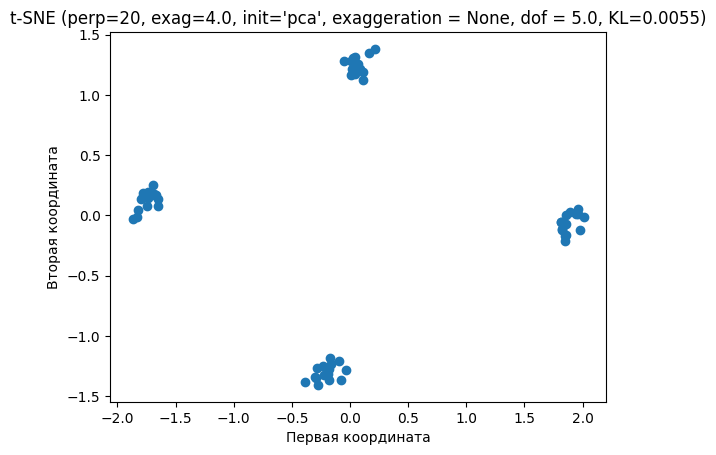

Perplexity value 20 is too high. Using perplexity 19.67 instead


Время работы: 0.22 сек
Финальная KL-дивергенция: 0.0055

Запуск t-SNE с perplexity=20, early_exaggeration=4.0, init='random', exaggeration = 1.0, dof = 5.0
<class 'openTSNE.sklearn.TSNE'>
0.005361947709827675
TSNE(dof=5.0, early_exaggeration=4.0, exaggeration=1.0, initialization='random',
     perplexity=20, random_state=42)


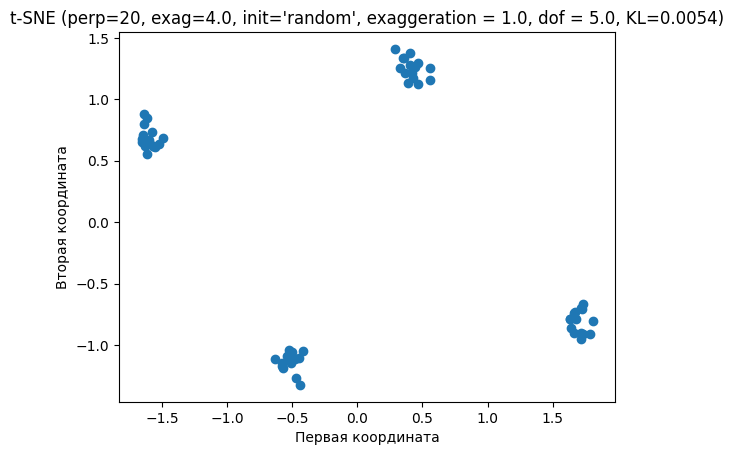

Perplexity value 20 is too high. Using perplexity 19.67 instead


Время работы: 0.21 сек
Финальная KL-дивергенция: 0.0054

Запуск t-SNE с perplexity=20, early_exaggeration=4.0, init='pca', exaggeration = 1.0, dof = 5.0
<class 'openTSNE.sklearn.TSNE'>
0.005472341260547964
TSNE(dof=5.0, early_exaggeration=4.0, exaggeration=1.0, perplexity=20,
     random_state=42)


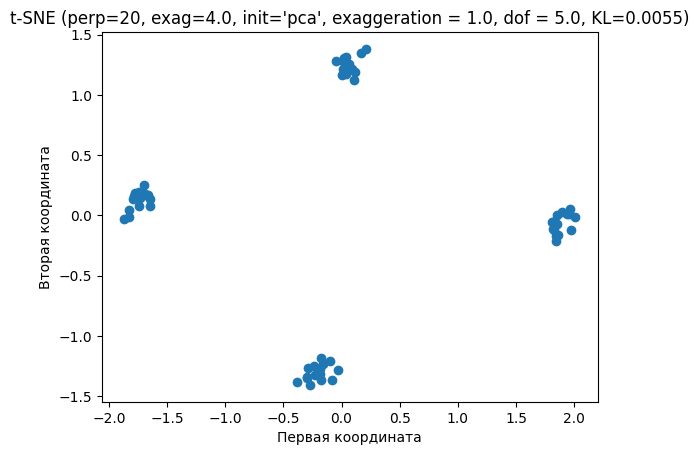

Perplexity value 20 is too high. Using perplexity 19.67 instead


Время работы: 0.22 сек
Финальная KL-дивергенция: 0.0055

Запуск t-SNE с perplexity=20, early_exaggeration=4.0, init='random', exaggeration = 4.0, dof = 5.0
<class 'openTSNE.sklearn.TSNE'>
0.16581524208193787
TSNE(dof=5.0, early_exaggeration=4.0, exaggeration=4.0, initialization='random',
     perplexity=20, random_state=42)


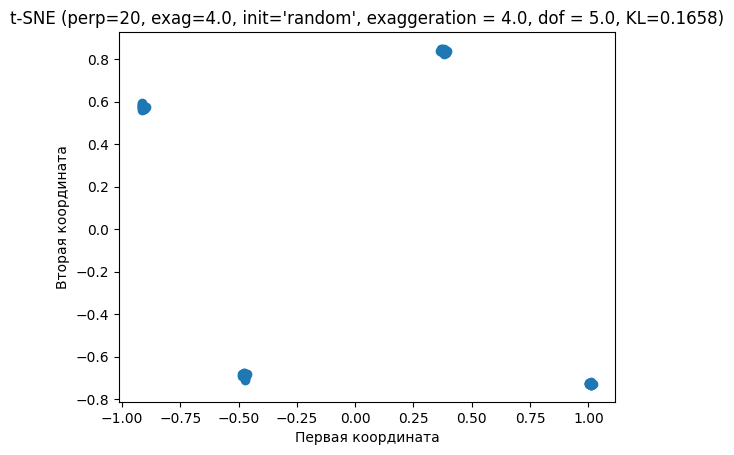

Perplexity value 20 is too high. Using perplexity 19.67 instead


Время работы: 0.23 сек
Финальная KL-дивергенция: 0.1658

Запуск t-SNE с perplexity=20, early_exaggeration=4.0, init='pca', exaggeration = 4.0, dof = 5.0
<class 'openTSNE.sklearn.TSNE'>
0.1658155526940499
TSNE(dof=5.0, early_exaggeration=4.0, exaggeration=4.0, perplexity=20,
     random_state=42)


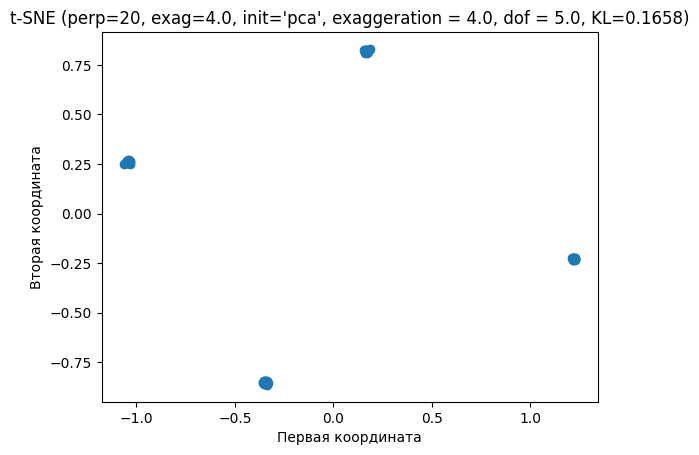

Perplexity value 20 is too high. Using perplexity 19.67 instead


Время работы: 0.22 сек
Финальная KL-дивергенция: 0.1658

Запуск t-SNE с perplexity=20, early_exaggeration=4.0, init='random', exaggeration = 12.0, dof = 5.0
<class 'openTSNE.sklearn.TSNE'>
0.9508971157140893
TSNE(dof=5.0, early_exaggeration=4.0, exaggeration=12.0,
     initialization='random', perplexity=20, random_state=42)


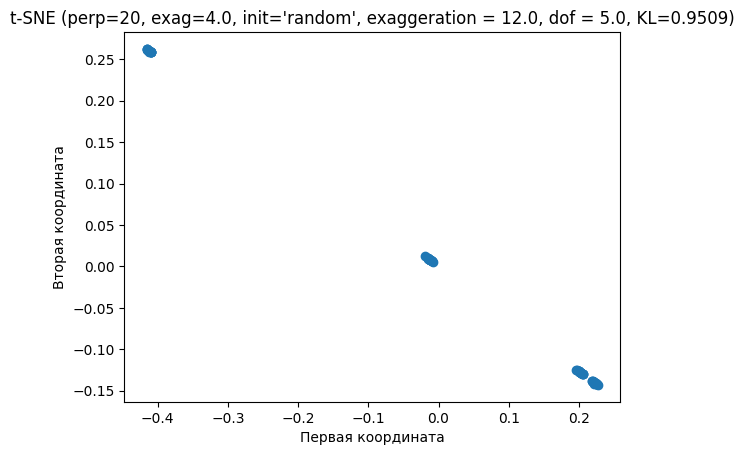

Perplexity value 20 is too high. Using perplexity 19.67 instead


Время работы: 0.21 сек
Финальная KL-дивергенция: 0.9509

Запуск t-SNE с perplexity=20, early_exaggeration=4.0, init='pca', exaggeration = 12.0, dof = 5.0
<class 'openTSNE.sklearn.TSNE'>
0.9606750222858933
TSNE(dof=5.0, early_exaggeration=4.0, exaggeration=12.0, perplexity=20,
     random_state=42)


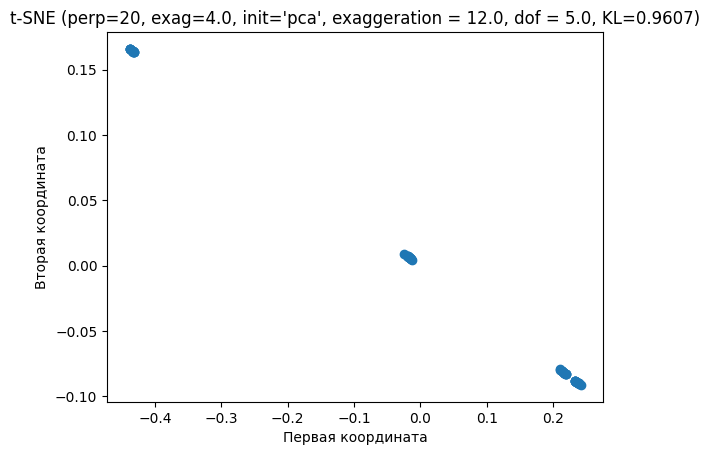

Perplexity value 20 is too high. Using perplexity 19.67 instead


Время работы: 0.21 сек
Финальная KL-дивергенция: 0.9607

Запуск t-SNE с perplexity=20, early_exaggeration=12.0, init='random', exaggeration = None, dof = 0.5
<class 'openTSNE.sklearn.TSNE'>
0.0049290357575912935
TSNE(dof=0.5, early_exaggeration=12.0, initialization='random', perplexity=20,
     random_state=42)


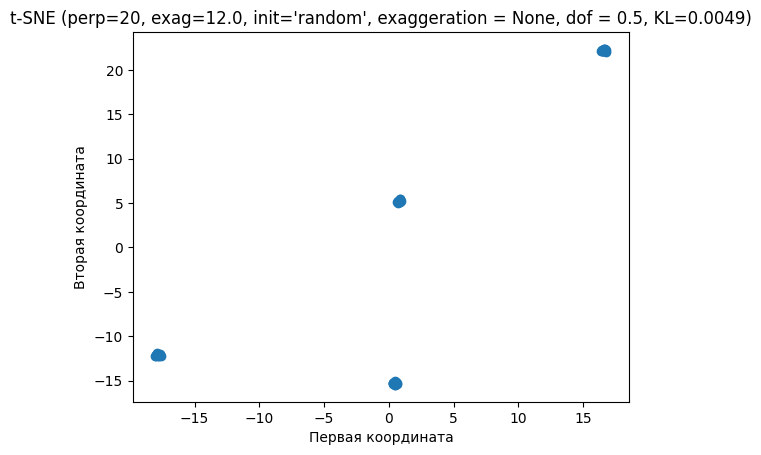

Perplexity value 20 is too high. Using perplexity 19.67 instead


Время работы: 0.21 сек
Финальная KL-дивергенция: 0.0049

Запуск t-SNE с perplexity=20, early_exaggeration=12.0, init='pca', exaggeration = None, dof = 0.5
<class 'openTSNE.sklearn.TSNE'>
0.004663389029953002
TSNE(dof=0.5, early_exaggeration=12.0, perplexity=20, random_state=42)


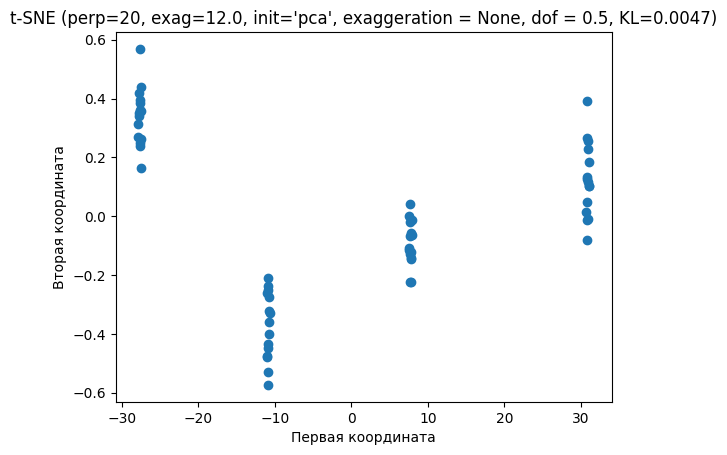

Perplexity value 20 is too high. Using perplexity 19.67 instead


Время работы: 0.22 сек
Финальная KL-дивергенция: 0.0047

Запуск t-SNE с perplexity=20, early_exaggeration=12.0, init='random', exaggeration = 1.0, dof = 0.5
<class 'openTSNE.sklearn.TSNE'>
0.0049290357575912935
TSNE(dof=0.5, early_exaggeration=12.0, exaggeration=1.0,
     initialization='random', perplexity=20, random_state=42)


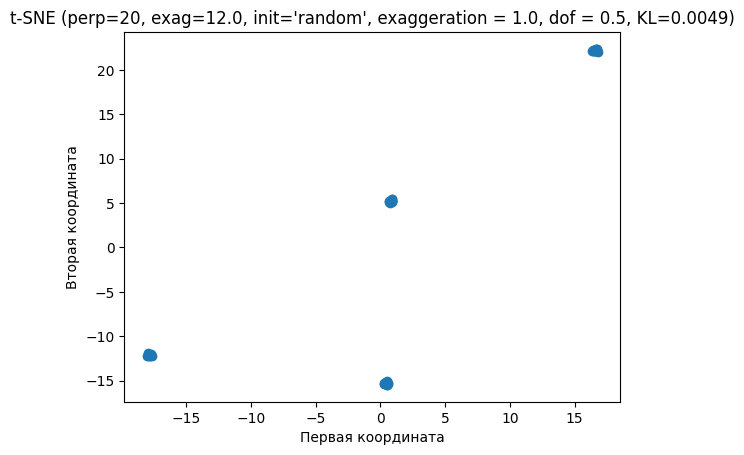

Perplexity value 20 is too high. Using perplexity 19.67 instead


Время работы: 0.21 сек
Финальная KL-дивергенция: 0.0049

Запуск t-SNE с perplexity=20, early_exaggeration=12.0, init='pca', exaggeration = 1.0, dof = 0.5
<class 'openTSNE.sklearn.TSNE'>
0.004663389029953002
TSNE(dof=0.5, early_exaggeration=12.0, exaggeration=1.0, perplexity=20,
     random_state=42)


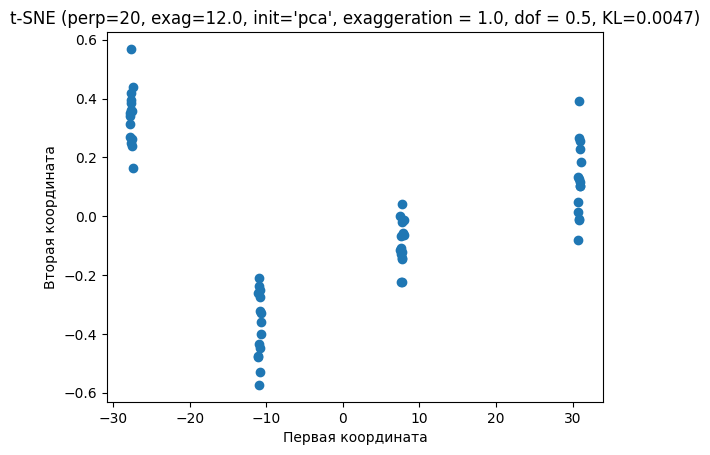

Perplexity value 20 is too high. Using perplexity 19.67 instead


Время работы: 0.23 сек
Финальная KL-дивергенция: 0.0047

Запуск t-SNE с perplexity=20, early_exaggeration=12.0, init='random', exaggeration = 4.0, dof = 0.5
<class 'openTSNE.sklearn.TSNE'>
0.1580907220176675
TSNE(dof=0.5, early_exaggeration=12.0, exaggeration=4.0,
     initialization='random', perplexity=20, random_state=42)


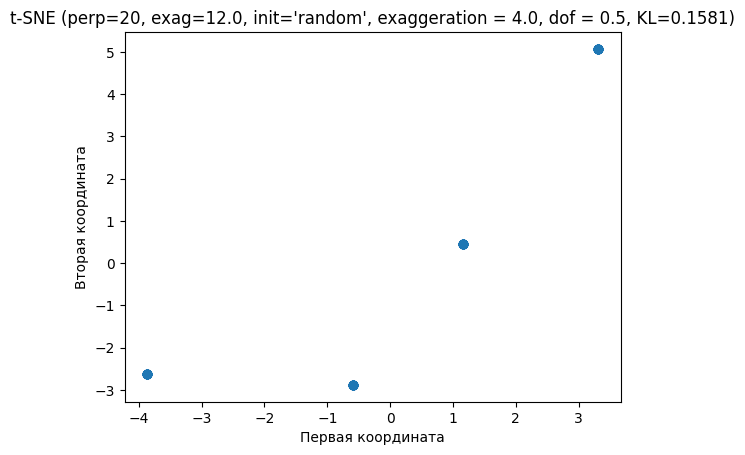

Perplexity value 20 is too high. Using perplexity 19.67 instead


Время работы: 0.22 сек
Финальная KL-дивергенция: 0.1581

Запуск t-SNE с perplexity=20, early_exaggeration=12.0, init='pca', exaggeration = 4.0, dof = 0.5
<class 'openTSNE.sklearn.TSNE'>
0.14724259058363032
TSNE(dof=0.5, early_exaggeration=12.0, exaggeration=4.0, perplexity=20,
     random_state=42)


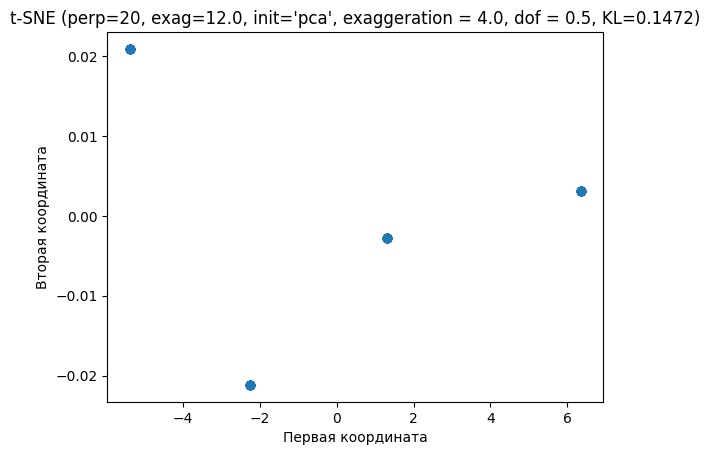

Perplexity value 20 is too high. Using perplexity 19.67 instead


Время работы: 0.22 сек
Финальная KL-дивергенция: 0.1472

Запуск t-SNE с perplexity=20, early_exaggeration=12.0, init='random', exaggeration = 12.0, dof = 0.5
<class 'openTSNE.sklearn.TSNE'>
0.9742538556504732
TSNE(dof=0.5, early_exaggeration=12.0, exaggeration=12.0,
     initialization='random', perplexity=20, random_state=42)


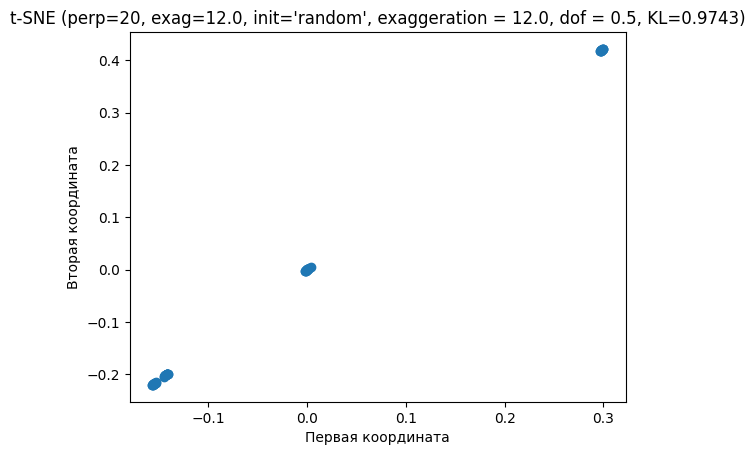

Perplexity value 20 is too high. Using perplexity 19.67 instead


Время работы: 0.21 сек
Финальная KL-дивергенция: 0.9743

Запуск t-SNE с perplexity=20, early_exaggeration=12.0, init='pca', exaggeration = 12.0, dof = 0.5
<class 'openTSNE.sklearn.TSNE'>
0.9803087839353513
TSNE(dof=0.5, early_exaggeration=12.0, exaggeration=12.0, perplexity=20,
     random_state=42)


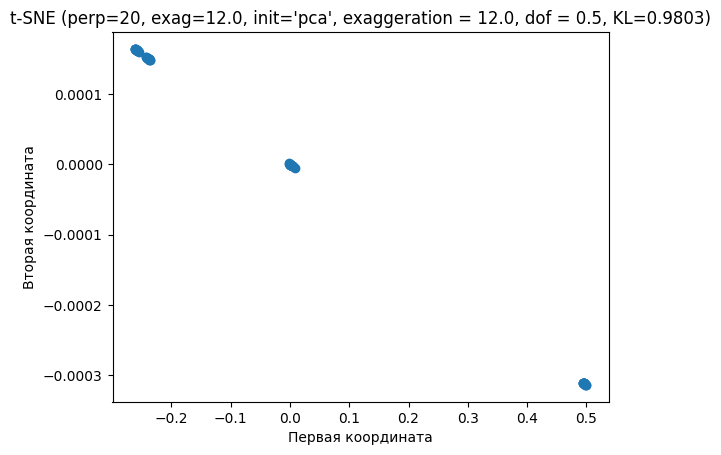

Perplexity value 20 is too high. Using perplexity 19.67 instead


Время работы: 0.20 сек
Финальная KL-дивергенция: 0.9803

Запуск t-SNE с perplexity=20, early_exaggeration=12.0, init='random', exaggeration = None, dof = 1.0
<class 'openTSNE.sklearn.TSNE'>
0.002224474796883591
TSNE(dof=1.0, early_exaggeration=12.0, initialization='random', perplexity=20,
     random_state=42)


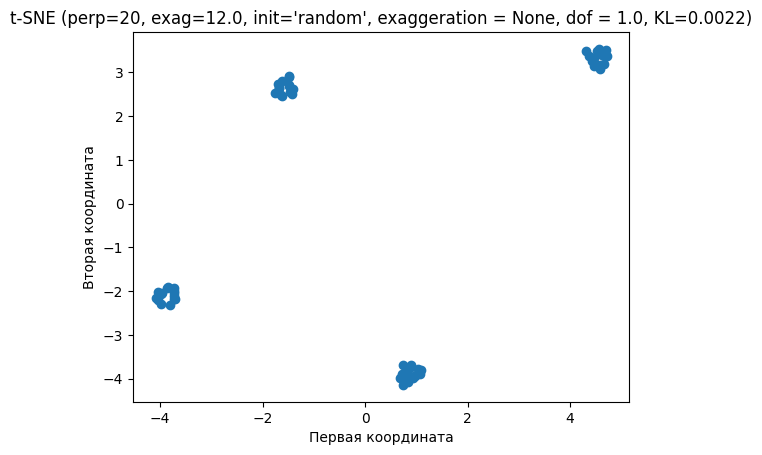

Perplexity value 20 is too high. Using perplexity 19.67 instead


Время работы: 0.17 сек
Финальная KL-дивергенция: 0.0022

Запуск t-SNE с perplexity=20, early_exaggeration=12.0, init='pca', exaggeration = None, dof = 1.0
<class 'openTSNE.sklearn.TSNE'>
0.005214028731162834
TSNE(dof=1.0, early_exaggeration=12.0, perplexity=20, random_state=42)


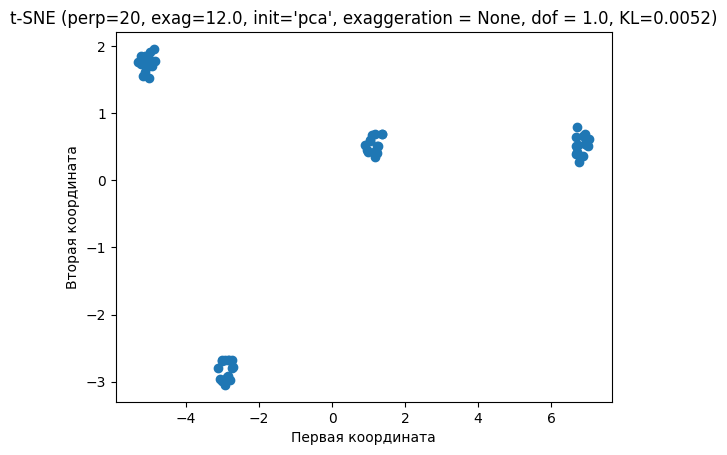

Perplexity value 20 is too high. Using perplexity 19.67 instead


Время работы: 0.17 сек
Финальная KL-дивергенция: 0.0052

Запуск t-SNE с perplexity=20, early_exaggeration=12.0, init='random', exaggeration = 1.0, dof = 1.0
<class 'openTSNE.sklearn.TSNE'>
0.002224474796883591
TSNE(dof=1.0, early_exaggeration=12.0, exaggeration=1.0,
     initialization='random', perplexity=20, random_state=42)


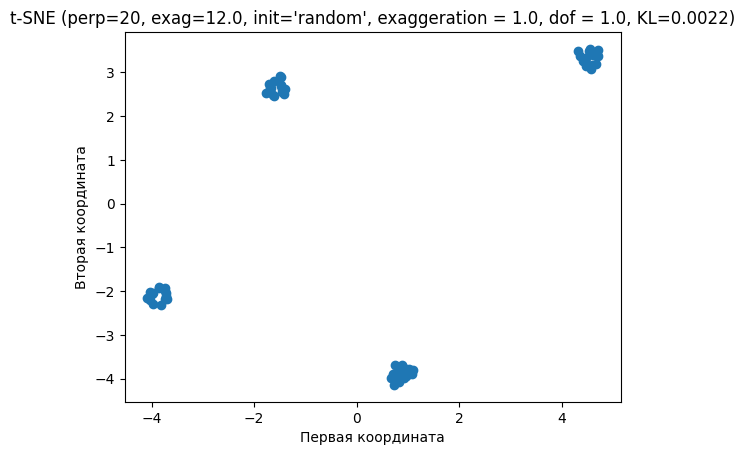

Perplexity value 20 is too high. Using perplexity 19.67 instead


Время работы: 0.17 сек
Финальная KL-дивергенция: 0.0022

Запуск t-SNE с perplexity=20, early_exaggeration=12.0, init='pca', exaggeration = 1.0, dof = 1.0
<class 'openTSNE.sklearn.TSNE'>
0.005214028731162834
TSNE(dof=1.0, early_exaggeration=12.0, exaggeration=1.0, perplexity=20,
     random_state=42)


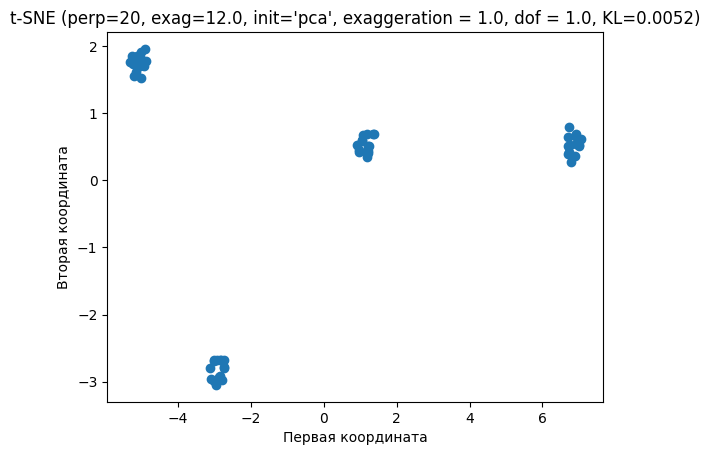

Perplexity value 20 is too high. Using perplexity 19.67 instead


Время работы: 0.16 сек
Финальная KL-дивергенция: 0.0052

Запуск t-SNE с perplexity=20, early_exaggeration=12.0, init='random', exaggeration = 4.0, dof = 1.0
<class 'openTSNE.sklearn.TSNE'>
0.15670784015828154
TSNE(dof=1.0, early_exaggeration=12.0, exaggeration=4.0,
     initialization='random', perplexity=20, random_state=42)


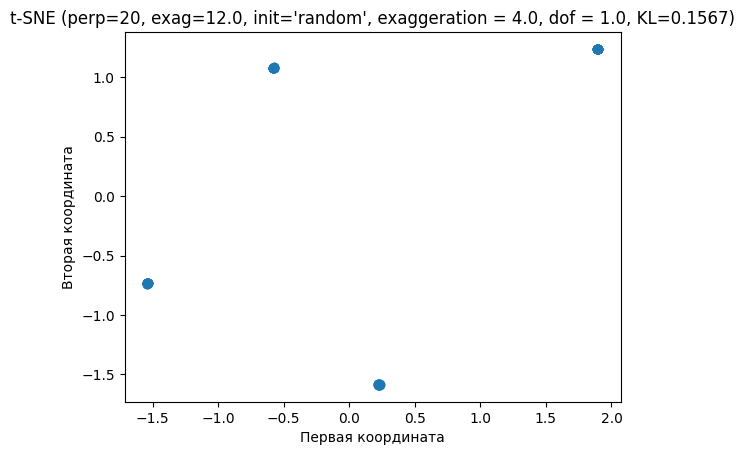

Perplexity value 20 is too high. Using perplexity 19.67 instead


Время работы: 0.16 сек
Финальная KL-дивергенция: 0.1567

Запуск t-SNE с perplexity=20, early_exaggeration=12.0, init='pca', exaggeration = 4.0, dof = 1.0
<class 'openTSNE.sklearn.TSNE'>
0.15670783578928393
TSNE(dof=1.0, early_exaggeration=12.0, exaggeration=4.0, perplexity=20,
     random_state=42)


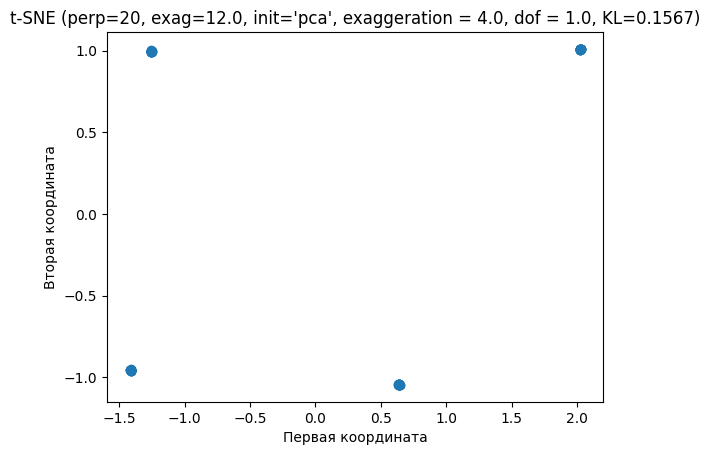

Perplexity value 20 is too high. Using perplexity 19.67 instead


Время работы: 0.17 сек
Финальная KL-дивергенция: 0.1567

Запуск t-SNE с perplexity=20, early_exaggeration=12.0, init='random', exaggeration = 12.0, dof = 1.0
<class 'openTSNE.sklearn.TSNE'>
0.9604029066362116
TSNE(dof=1.0, early_exaggeration=12.0, exaggeration=12.0,
     initialization='random', perplexity=20, random_state=42)


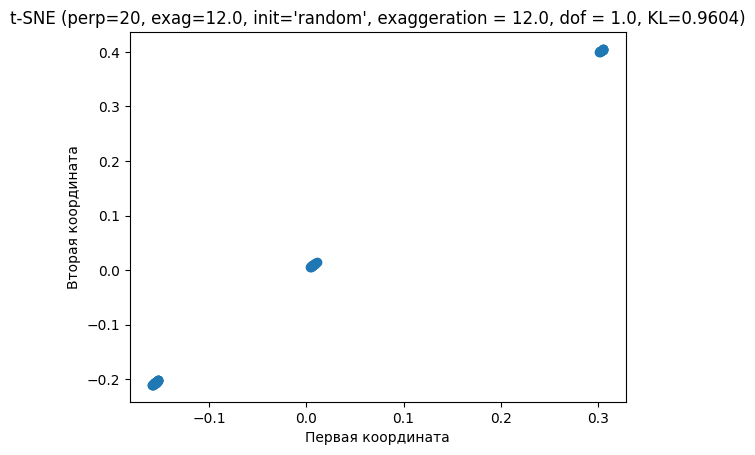

Perplexity value 20 is too high. Using perplexity 19.67 instead


Время работы: 0.16 сек
Финальная KL-дивергенция: 0.9604

Запуск t-SNE с perplexity=20, early_exaggeration=12.0, init='pca', exaggeration = 12.0, dof = 1.0
<class 'openTSNE.sklearn.TSNE'>
0.970396918543047
TSNE(dof=1.0, early_exaggeration=12.0, exaggeration=12.0, perplexity=20,
     random_state=42)


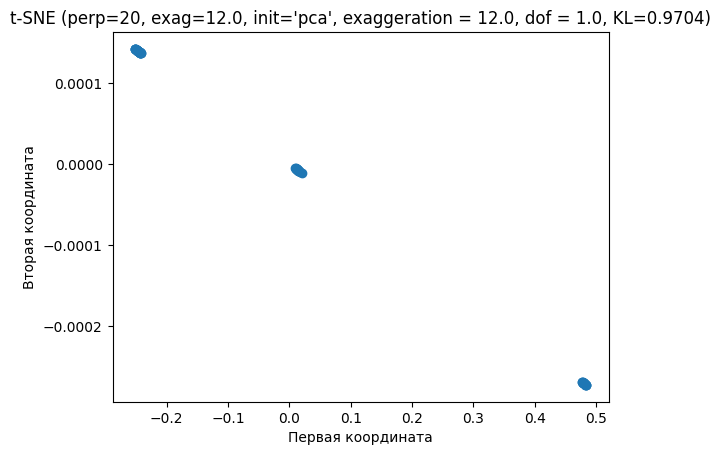

Perplexity value 20 is too high. Using perplexity 19.67 instead


Время работы: 0.17 сек
Финальная KL-дивергенция: 0.9704

Запуск t-SNE с perplexity=20, early_exaggeration=12.0, init='random', exaggeration = None, dof = 5.0
<class 'openTSNE.sklearn.TSNE'>
0.005382277651602152
TSNE(dof=5.0, early_exaggeration=12.0, initialization='random', perplexity=20,
     random_state=42)


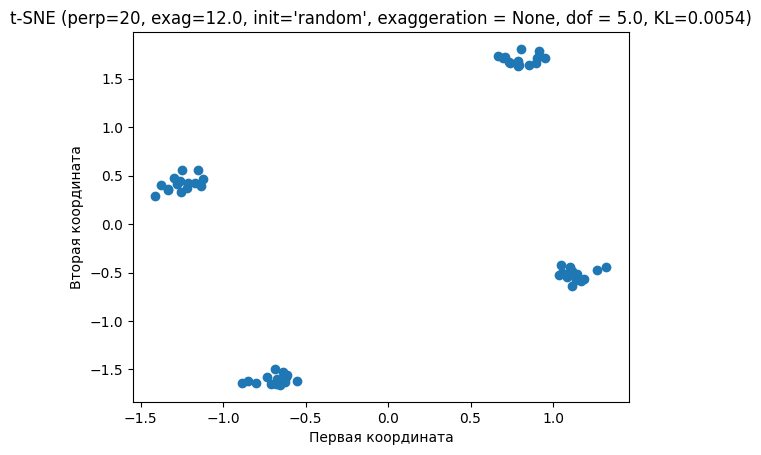

Perplexity value 20 is too high. Using perplexity 19.67 instead


Время работы: 0.21 сек
Финальная KL-дивергенция: 0.0054

Запуск t-SNE с perplexity=20, early_exaggeration=12.0, init='pca', exaggeration = None, dof = 5.0
<class 'openTSNE.sklearn.TSNE'>
0.005468022986236498
TSNE(dof=5.0, early_exaggeration=12.0, perplexity=20, random_state=42)


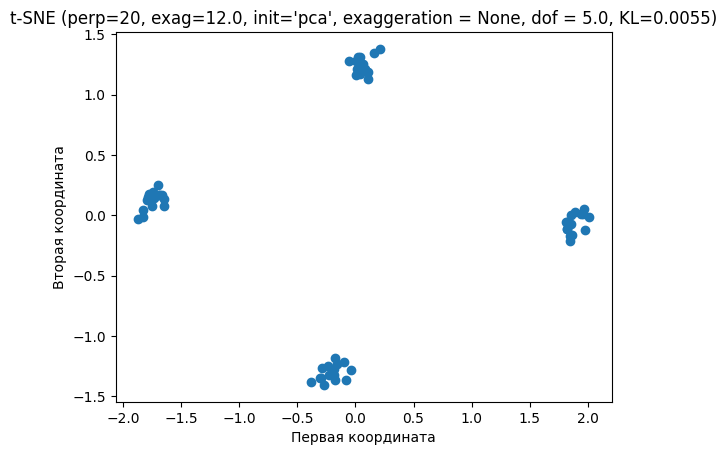

Perplexity value 20 is too high. Using perplexity 19.67 instead


Время работы: 0.21 сек
Финальная KL-дивергенция: 0.0055

Запуск t-SNE с perplexity=20, early_exaggeration=12.0, init='random', exaggeration = 1.0, dof = 5.0
<class 'openTSNE.sklearn.TSNE'>
0.005382277651602152
TSNE(dof=5.0, early_exaggeration=12.0, exaggeration=1.0,
     initialization='random', perplexity=20, random_state=42)


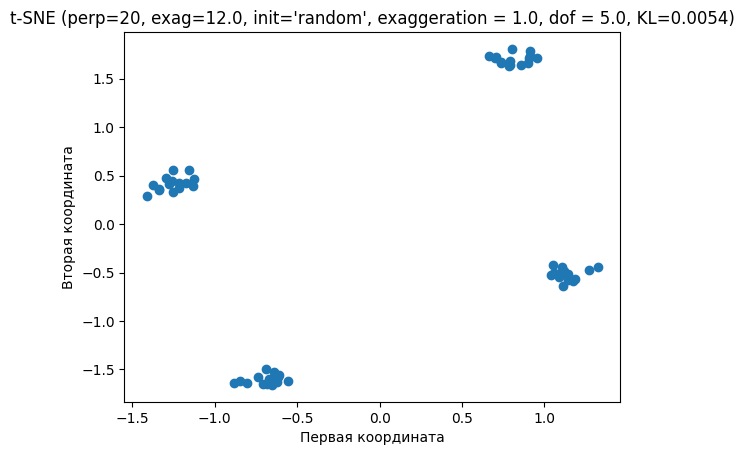

Perplexity value 20 is too high. Using perplexity 19.67 instead


Время работы: 0.21 сек
Финальная KL-дивергенция: 0.0054

Запуск t-SNE с perplexity=20, early_exaggeration=12.0, init='pca', exaggeration = 1.0, dof = 5.0
<class 'openTSNE.sklearn.TSNE'>
0.005468022986236498
TSNE(dof=5.0, early_exaggeration=12.0, exaggeration=1.0, perplexity=20,
     random_state=42)


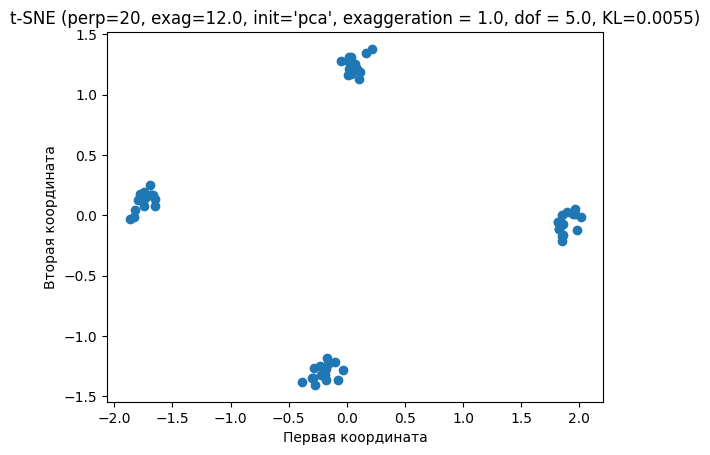

Perplexity value 20 is too high. Using perplexity 19.67 instead


Время работы: 0.21 сек
Финальная KL-дивергенция: 0.0055

Запуск t-SNE с perplexity=20, early_exaggeration=12.0, init='random', exaggeration = 4.0, dof = 5.0
<class 'openTSNE.sklearn.TSNE'>
0.1658154904951008
TSNE(dof=5.0, early_exaggeration=12.0, exaggeration=4.0,
     initialization='random', perplexity=20, random_state=42)


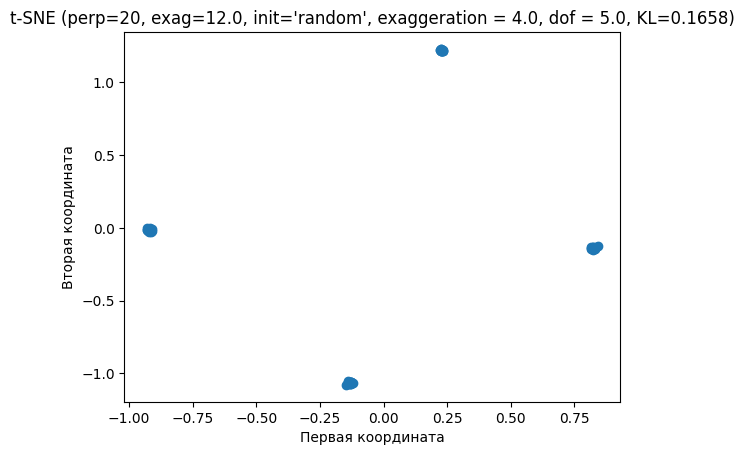

Perplexity value 20 is too high. Using perplexity 19.67 instead


Время работы: 0.22 сек
Финальная KL-дивергенция: 0.1658

Запуск t-SNE с perplexity=20, early_exaggeration=12.0, init='pca', exaggeration = 4.0, dof = 5.0
<class 'openTSNE.sklearn.TSNE'>
0.16581535486935017
TSNE(dof=5.0, early_exaggeration=12.0, exaggeration=4.0, perplexity=20,
     random_state=42)


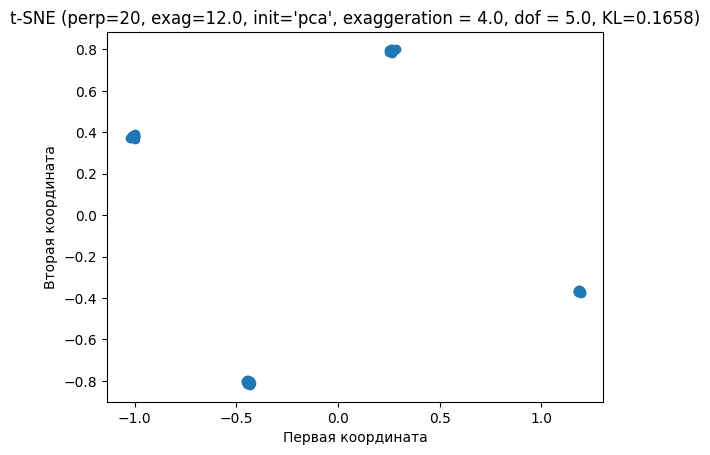

Perplexity value 20 is too high. Using perplexity 19.67 instead


Время работы: 0.21 сек
Финальная KL-дивергенция: 0.1658

Запуск t-SNE с perplexity=20, early_exaggeration=12.0, init='random', exaggeration = 12.0, dof = 5.0
<class 'openTSNE.sklearn.TSNE'>
0.9504998818613366
TSNE(dof=5.0, early_exaggeration=12.0, exaggeration=12.0,
     initialization='random', perplexity=20, random_state=42)


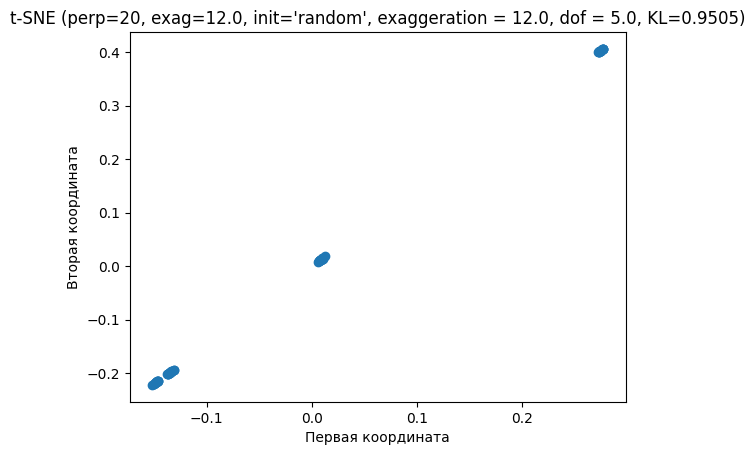

Perplexity value 20 is too high. Using perplexity 19.67 instead


Время работы: 0.21 сек
Финальная KL-дивергенция: 0.9505

Запуск t-SNE с perplexity=20, early_exaggeration=12.0, init='pca', exaggeration = 12.0, dof = 5.0
<class 'openTSNE.sklearn.TSNE'>
0.9606611480838803
TSNE(dof=5.0, early_exaggeration=12.0, exaggeration=12.0, perplexity=20,
     random_state=42)


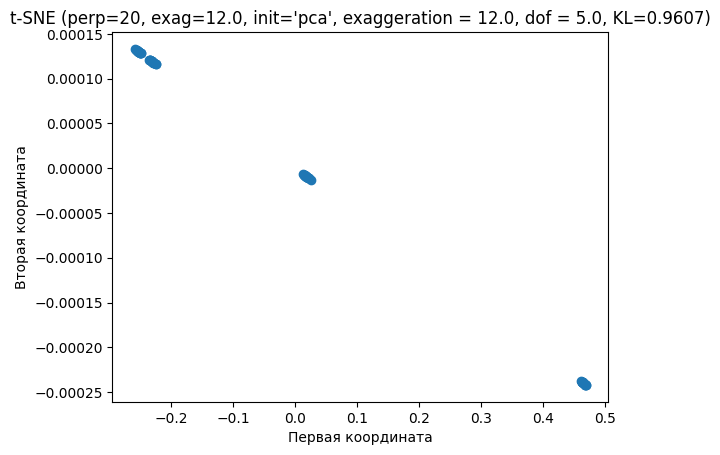

Perplexity value 20 is too high. Using perplexity 19.67 instead


Время работы: 0.20 сек
Финальная KL-дивергенция: 0.9607

Запуск t-SNE с perplexity=20, early_exaggeration=24.0, init='random', exaggeration = None, dof = 0.5
<class 'openTSNE.sklearn.TSNE'>
0.004588494158281442
TSNE(dof=0.5, early_exaggeration=24.0, initialization='random', perplexity=20,
     random_state=42)


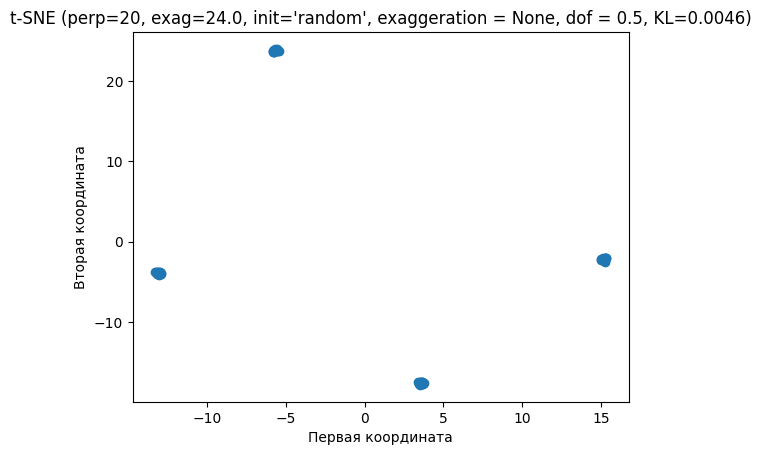

Perplexity value 20 is too high. Using perplexity 19.67 instead


Время работы: 0.19 сек
Финальная KL-дивергенция: 0.0046

Запуск t-SNE с perplexity=20, early_exaggeration=24.0, init='pca', exaggeration = None, dof = 0.5
<class 'openTSNE.sklearn.TSNE'>
0.004465523027906038
TSNE(dof=0.5, early_exaggeration=24.0, perplexity=20, random_state=42)


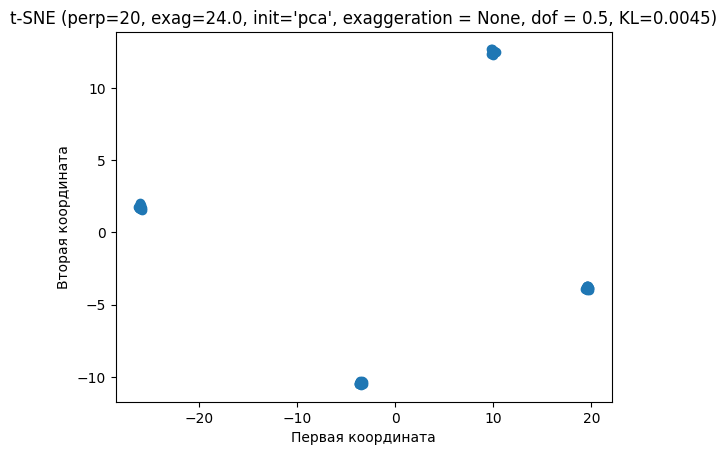

Perplexity value 20 is too high. Using perplexity 19.67 instead


Время работы: 0.18 сек
Финальная KL-дивергенция: 0.0045

Запуск t-SNE с perplexity=20, early_exaggeration=24.0, init='random', exaggeration = 1.0, dof = 0.5
<class 'openTSNE.sklearn.TSNE'>
0.004588494158281442
TSNE(dof=0.5, early_exaggeration=24.0, exaggeration=1.0,
     initialization='random', perplexity=20, random_state=42)


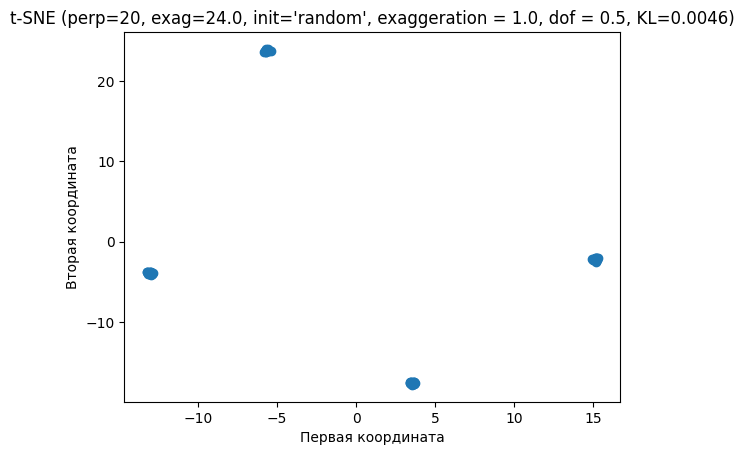

Perplexity value 20 is too high. Using perplexity 19.67 instead


Время работы: 0.19 сек
Финальная KL-дивергенция: 0.0046

Запуск t-SNE с perplexity=20, early_exaggeration=24.0, init='pca', exaggeration = 1.0, dof = 0.5
<class 'openTSNE.sklearn.TSNE'>
0.004465523027906038
TSNE(dof=0.5, early_exaggeration=24.0, exaggeration=1.0, perplexity=20,
     random_state=42)


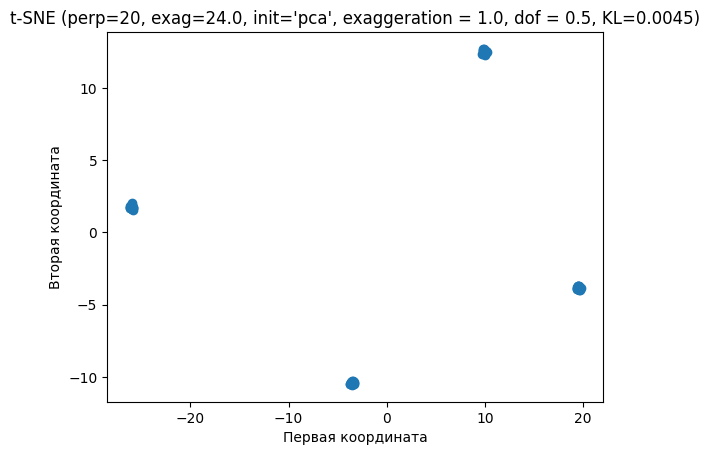

Perplexity value 20 is too high. Using perplexity 19.67 instead


Время работы: 0.18 сек
Финальная KL-дивергенция: 0.0045

Запуск t-SNE с perplexity=20, early_exaggeration=24.0, init='random', exaggeration = 4.0, dof = 0.5
<class 'openTSNE.sklearn.TSNE'>
0.15764352555121697
TSNE(dof=0.5, early_exaggeration=24.0, exaggeration=4.0,
     initialization='random', perplexity=20, random_state=42)


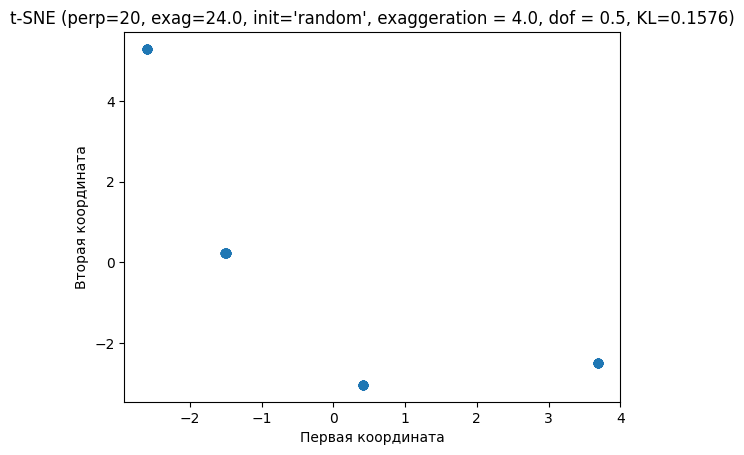

Perplexity value 20 is too high. Using perplexity 19.67 instead


Время работы: 0.19 сек
Финальная KL-дивергенция: 0.1576

Запуск t-SNE с perplexity=20, early_exaggeration=24.0, init='pca', exaggeration = 4.0, dof = 0.5
<class 'openTSNE.sklearn.TSNE'>
0.15814728958419355
TSNE(dof=0.5, early_exaggeration=24.0, exaggeration=4.0, perplexity=20,
     random_state=42)


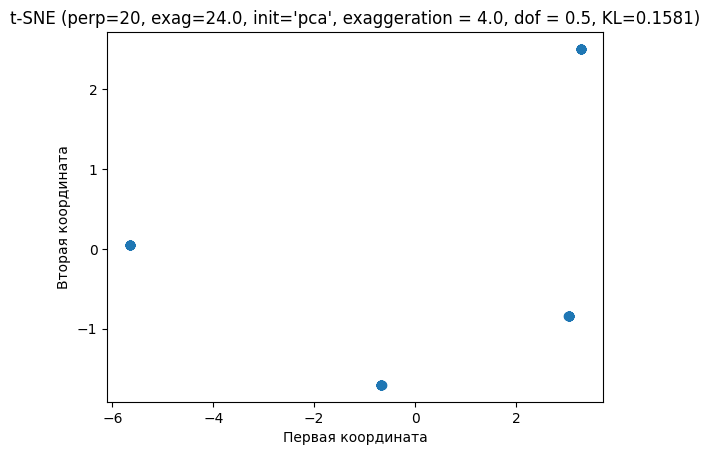

Perplexity value 20 is too high. Using perplexity 19.67 instead


Время работы: 0.18 сек
Финальная KL-дивергенция: 0.1581

Запуск t-SNE с perplexity=20, early_exaggeration=24.0, init='random', exaggeration = 12.0, dof = 0.5
<class 'openTSNE.sklearn.TSNE'>
0.9739360059065474
TSNE(dof=0.5, early_exaggeration=24.0, exaggeration=12.0,
     initialization='random', perplexity=20, random_state=42)


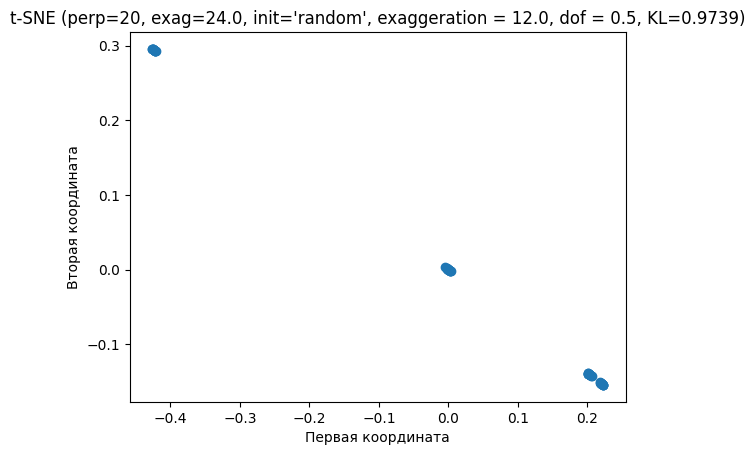

Perplexity value 20 is too high. Using perplexity 19.67 instead


Время работы: 0.17 сек
Финальная KL-дивергенция: 0.9739

Запуск t-SNE с perplexity=20, early_exaggeration=24.0, init='pca', exaggeration = 12.0, dof = 0.5
<class 'openTSNE.sklearn.TSNE'>
0.9802994755761416
TSNE(dof=0.5, early_exaggeration=24.0, exaggeration=12.0, perplexity=20,
     random_state=42)


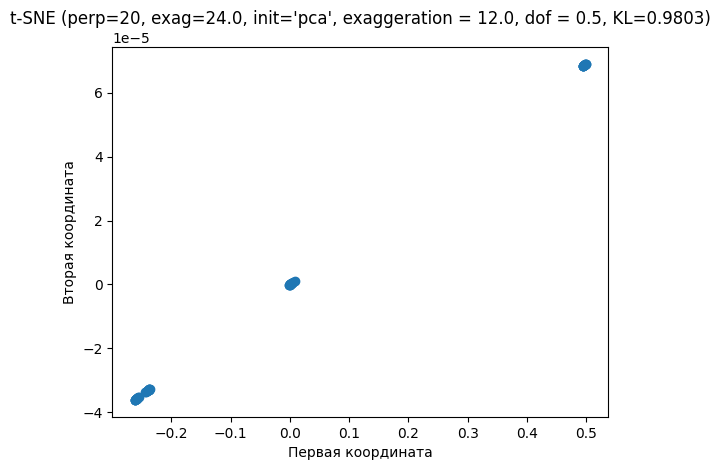

Perplexity value 20 is too high. Using perplexity 19.67 instead


Время работы: 0.17 сек
Финальная KL-дивергенция: 0.9803

Запуск t-SNE с perplexity=20, early_exaggeration=24.0, init='random', exaggeration = None, dof = 1.0
<class 'openTSNE.sklearn.TSNE'>
0.0022535775024783433
TSNE(dof=1.0, early_exaggeration=24.0, initialization='random', perplexity=20,
     random_state=42)


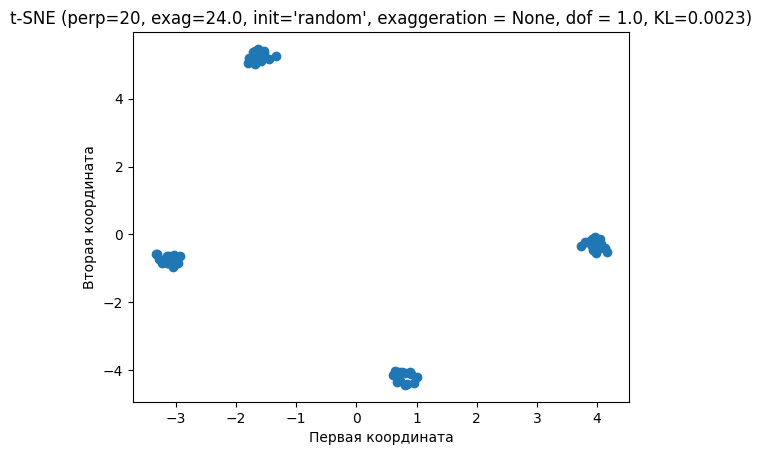

Perplexity value 20 is too high. Using perplexity 19.67 instead


Время работы: 0.15 сек
Финальная KL-дивергенция: 0.0023

Запуск t-SNE с perplexity=20, early_exaggeration=24.0, init='pca', exaggeration = None, dof = 1.0
<class 'openTSNE.sklearn.TSNE'>
0.002299170719414434
TSNE(dof=1.0, early_exaggeration=24.0, perplexity=20, random_state=42)


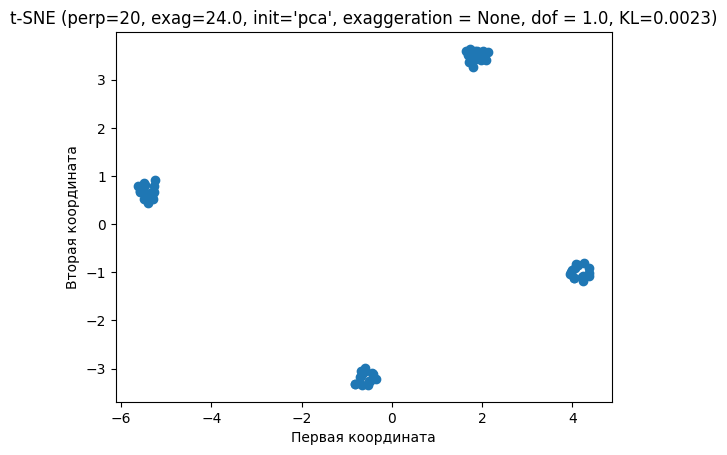

Perplexity value 20 is too high. Using perplexity 19.67 instead


Время работы: 0.14 сек
Финальная KL-дивергенция: 0.0023

Запуск t-SNE с perplexity=20, early_exaggeration=24.0, init='random', exaggeration = 1.0, dof = 1.0
<class 'openTSNE.sklearn.TSNE'>
0.0022535775024783433
TSNE(dof=1.0, early_exaggeration=24.0, exaggeration=1.0,
     initialization='random', perplexity=20, random_state=42)


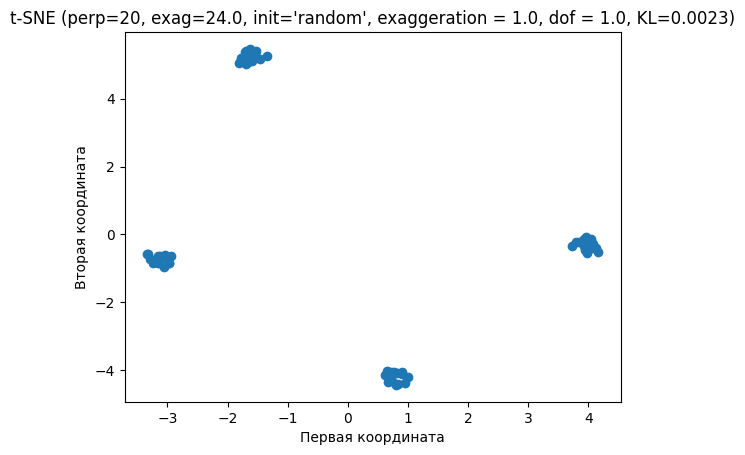

Perplexity value 20 is too high. Using perplexity 19.67 instead


Время работы: 0.14 сек
Финальная KL-дивергенция: 0.0023

Запуск t-SNE с perplexity=20, early_exaggeration=24.0, init='pca', exaggeration = 1.0, dof = 1.0
<class 'openTSNE.sklearn.TSNE'>
0.002299170719414434
TSNE(dof=1.0, early_exaggeration=24.0, exaggeration=1.0, perplexity=20,
     random_state=42)


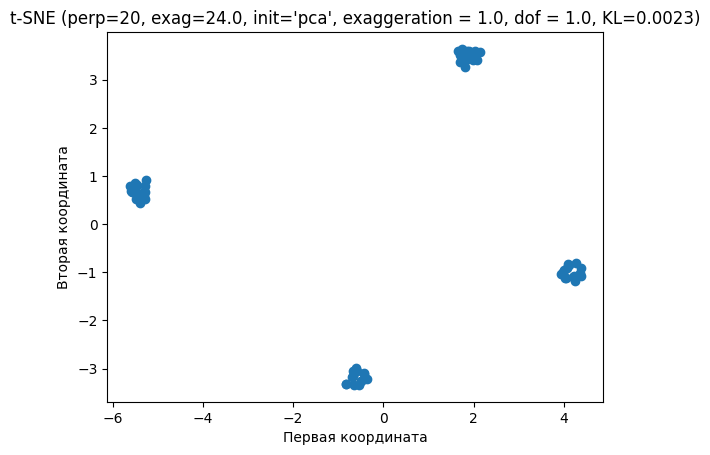

Perplexity value 20 is too high. Using perplexity 19.67 instead


Время работы: 0.15 сек
Финальная KL-дивергенция: 0.0023

Запуск t-SNE с perplexity=20, early_exaggeration=24.0, init='random', exaggeration = 4.0, dof = 1.0
<class 'openTSNE.sklearn.TSNE'>
0.15670788353468357
TSNE(dof=1.0, early_exaggeration=24.0, exaggeration=4.0,
     initialization='random', perplexity=20, random_state=42)


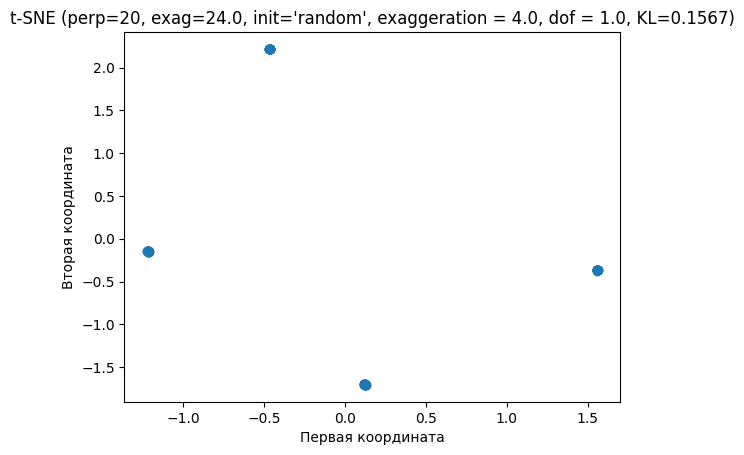

Perplexity value 20 is too high. Using perplexity 19.67 instead


Время работы: 0.15 сек
Финальная KL-дивергенция: 0.1567

Запуск t-SNE с perplexity=20, early_exaggeration=24.0, init='pca', exaggeration = 4.0, dof = 1.0
<class 'openTSNE.sklearn.TSNE'>
0.15670787329211588
TSNE(dof=1.0, early_exaggeration=24.0, exaggeration=4.0, perplexity=20,
     random_state=42)


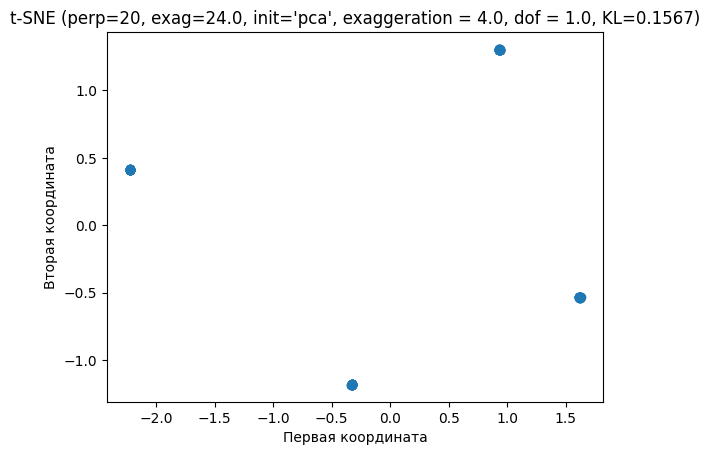

Perplexity value 20 is too high. Using perplexity 19.67 instead


Время работы: 0.15 сек
Финальная KL-дивергенция: 0.1567

Запуск t-SNE с perplexity=20, early_exaggeration=24.0, init='random', exaggeration = 12.0, dof = 1.0
<class 'openTSNE.sklearn.TSNE'>
0.9604063289481521
TSNE(dof=1.0, early_exaggeration=24.0, exaggeration=12.0,
     initialization='random', perplexity=20, random_state=42)


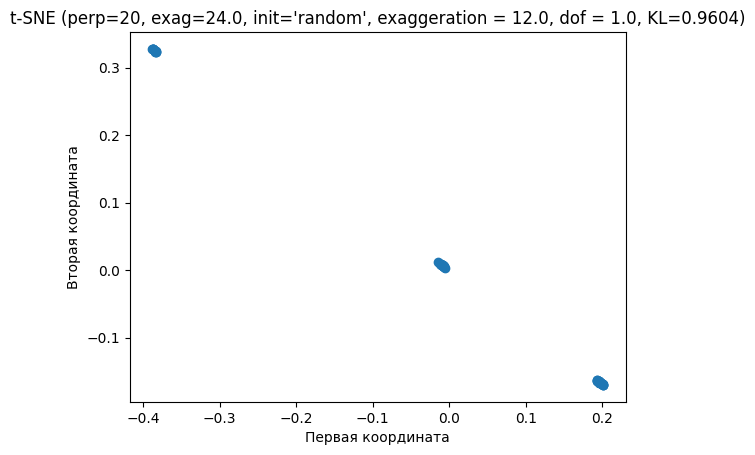

Perplexity value 20 is too high. Using perplexity 19.67 instead


Время работы: 0.15 сек
Финальная KL-дивергенция: 0.9604

Запуск t-SNE с perplexity=20, early_exaggeration=24.0, init='pca', exaggeration = 12.0, dof = 1.0
<class 'openTSNE.sklearn.TSNE'>
0.9700623482922364
TSNE(dof=1.0, early_exaggeration=24.0, exaggeration=12.0, perplexity=20,
     random_state=42)


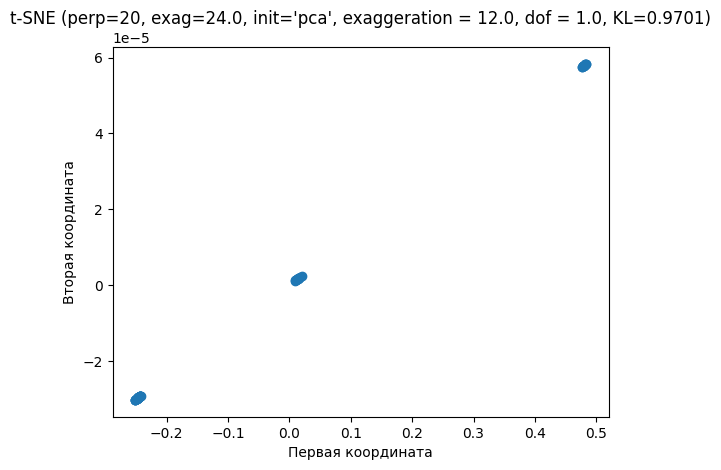

Perplexity value 20 is too high. Using perplexity 19.67 instead


Время работы: 0.15 сек
Финальная KL-дивергенция: 0.9701

Запуск t-SNE с perplexity=20, early_exaggeration=24.0, init='random', exaggeration = None, dof = 5.0
<class 'openTSNE.sklearn.TSNE'>
0.021497963610033644
TSNE(dof=5.0, early_exaggeration=24.0, initialization='random', perplexity=20,
     random_state=42)


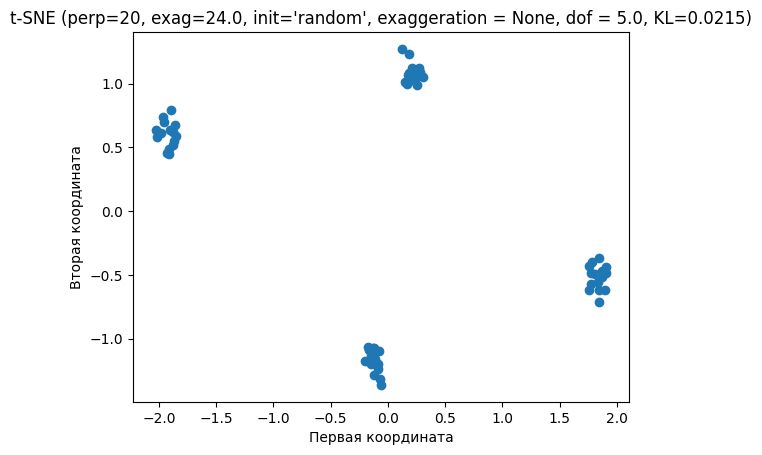

Perplexity value 20 is too high. Using perplexity 19.67 instead


Время работы: 0.19 сек
Финальная KL-дивергенция: 0.0215

Запуск t-SNE с perplexity=20, early_exaggeration=24.0, init='pca', exaggeration = None, dof = 5.0
<class 'openTSNE.sklearn.TSNE'>
0.00547160335142749
TSNE(dof=5.0, early_exaggeration=24.0, perplexity=20, random_state=42)


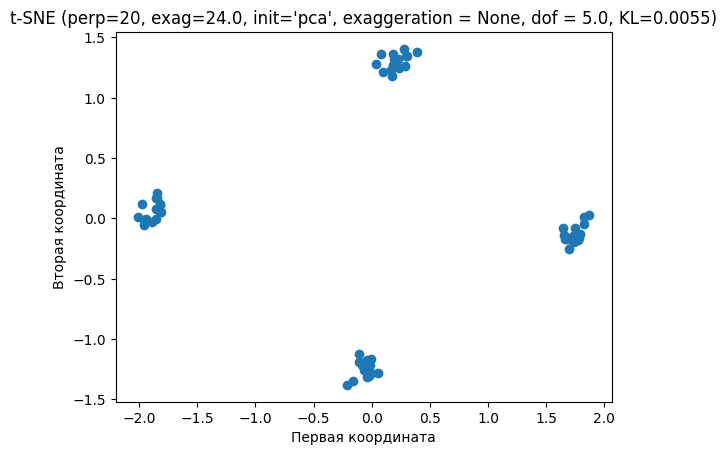

Perplexity value 20 is too high. Using perplexity 19.67 instead


Время работы: 0.19 сек
Финальная KL-дивергенция: 0.0055

Запуск t-SNE с perplexity=20, early_exaggeration=24.0, init='random', exaggeration = 1.0, dof = 5.0
<class 'openTSNE.sklearn.TSNE'>
0.021497963610033644
TSNE(dof=5.0, early_exaggeration=24.0, exaggeration=1.0,
     initialization='random', perplexity=20, random_state=42)


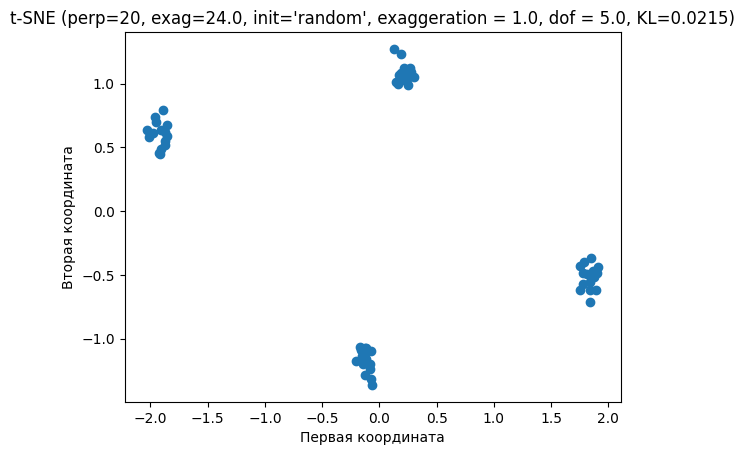

Perplexity value 20 is too high. Using perplexity 19.67 instead


Время работы: 0.20 сек
Финальная KL-дивергенция: 0.0215

Запуск t-SNE с perplexity=20, early_exaggeration=24.0, init='pca', exaggeration = 1.0, dof = 5.0
<class 'openTSNE.sklearn.TSNE'>
0.00547160335142749
TSNE(dof=5.0, early_exaggeration=24.0, exaggeration=1.0, perplexity=20,
     random_state=42)


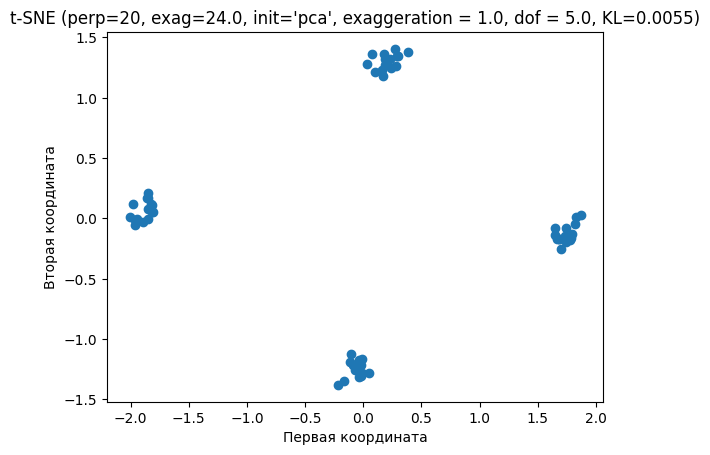

Perplexity value 20 is too high. Using perplexity 19.67 instead


Время работы: 0.19 сек
Финальная KL-дивергенция: 0.0055

Запуск t-SNE с perplexity=20, early_exaggeration=24.0, init='random', exaggeration = 4.0, dof = 5.0
<class 'openTSNE.sklearn.TSNE'>
0.19606984346113343
TSNE(dof=5.0, early_exaggeration=24.0, exaggeration=4.0,
     initialization='random', perplexity=20, random_state=42)


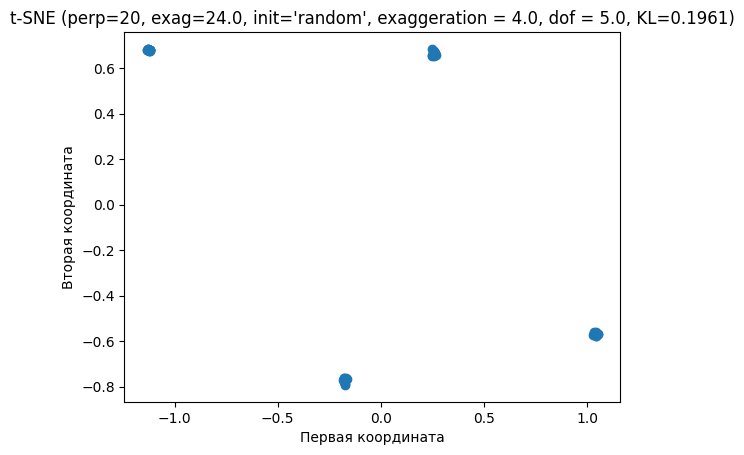

Perplexity value 20 is too high. Using perplexity 19.67 instead


Время работы: 0.19 сек
Финальная KL-дивергенция: 0.1961

Запуск t-SNE с perplexity=20, early_exaggeration=24.0, init='pca', exaggeration = 4.0, dof = 5.0
<class 'openTSNE.sklearn.TSNE'>
0.1658151690508065
TSNE(dof=5.0, early_exaggeration=24.0, exaggeration=4.0, perplexity=20,
     random_state=42)


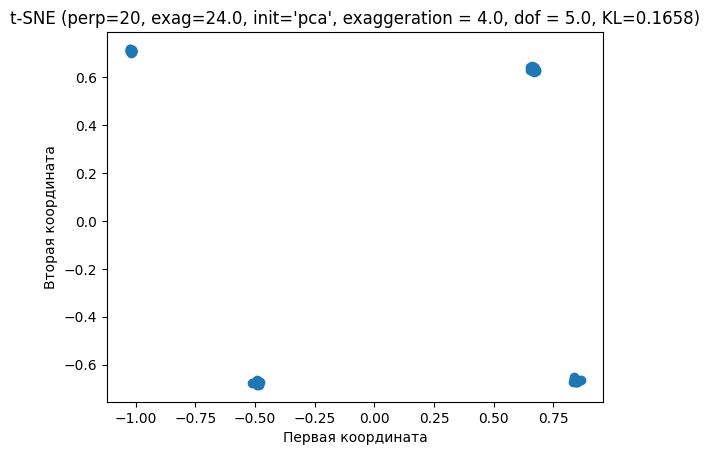

Perplexity value 20 is too high. Using perplexity 19.67 instead


Время работы: 0.19 сек
Финальная KL-дивергенция: 0.1658

Запуск t-SNE с perplexity=20, early_exaggeration=24.0, init='random', exaggeration = 12.0, dof = 5.0
<class 'openTSNE.sklearn.TSNE'>
0.9504269687060152
TSNE(dof=5.0, early_exaggeration=24.0, exaggeration=12.0,
     initialization='random', perplexity=20, random_state=42)


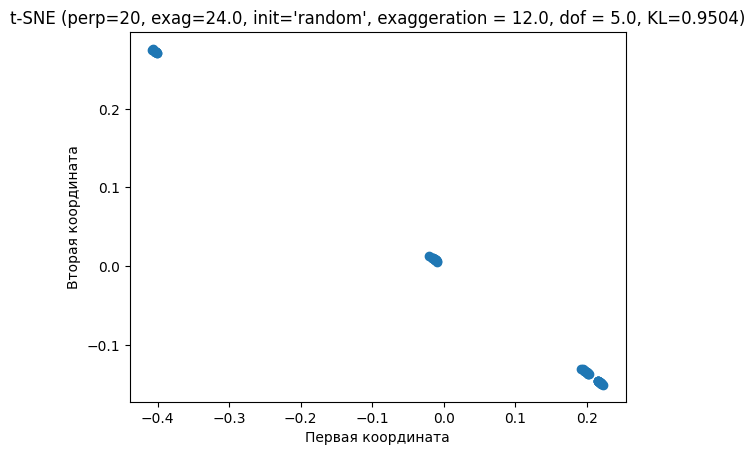

Perplexity value 20 is too high. Using perplexity 19.67 instead


Время работы: 0.18 сек
Финальная KL-дивергенция: 0.9504

Запуск t-SNE с perplexity=20, early_exaggeration=24.0, init='pca', exaggeration = 12.0, dof = 5.0
<class 'openTSNE.sklearn.TSNE'>
0.9606579592641236
TSNE(dof=5.0, early_exaggeration=24.0, exaggeration=12.0, perplexity=20,
     random_state=42)


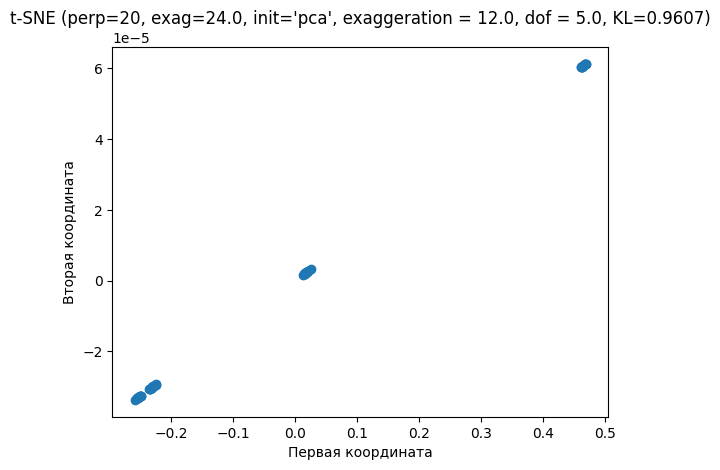

Perplexity value 30 is too high. Using perplexity 19.67 instead


Время работы: 0.17 сек
Финальная KL-дивергенция: 0.9607

Запуск t-SNE с perplexity=30, early_exaggeration=4.0, init='random', exaggeration = None, dof = 0.5
<class 'openTSNE.sklearn.TSNE'>
0.008550834236846327
TSNE(dof=0.5, early_exaggeration=4.0, initialization='random', random_state=42)


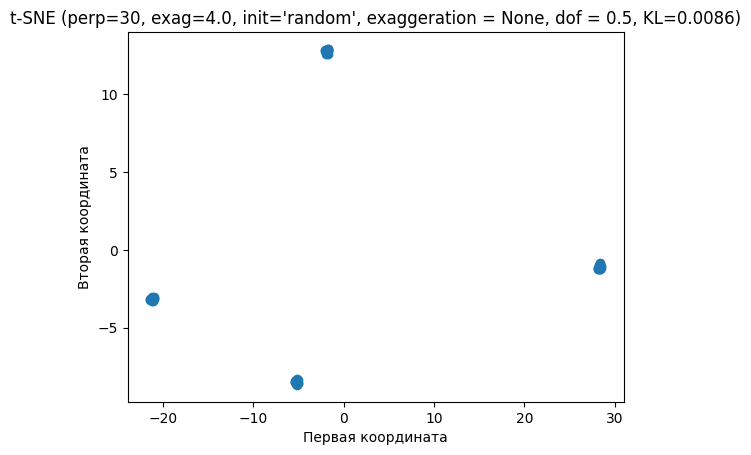

Perplexity value 30 is too high. Using perplexity 19.67 instead


Время работы: 0.24 сек
Финальная KL-дивергенция: 0.0086

Запуск t-SNE с perplexity=30, early_exaggeration=4.0, init='pca', exaggeration = None, dof = 0.5
<class 'openTSNE.sklearn.TSNE'>
0.00448169540019272
TSNE(dof=0.5, early_exaggeration=4.0, random_state=42)


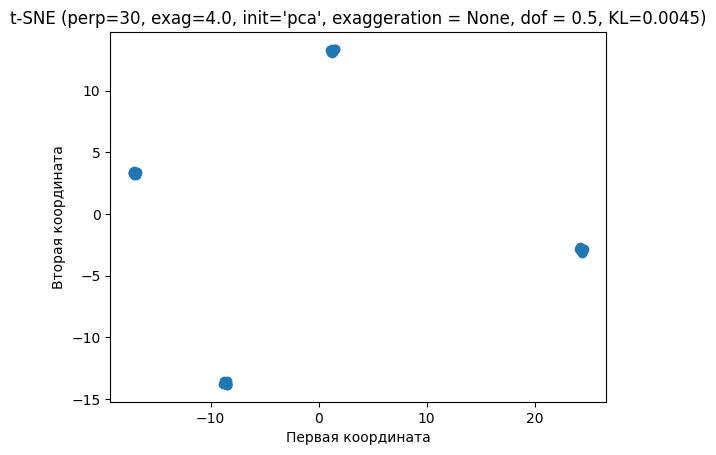

Perplexity value 30 is too high. Using perplexity 19.67 instead


Время работы: 0.23 сек
Финальная KL-дивергенция: 0.0045

Запуск t-SNE с perplexity=30, early_exaggeration=4.0, init='random', exaggeration = 1.0, dof = 0.5
<class 'openTSNE.sklearn.TSNE'>
0.008550834236846327
TSNE(dof=0.5, early_exaggeration=4.0, exaggeration=1.0, initialization='random',
     random_state=42)


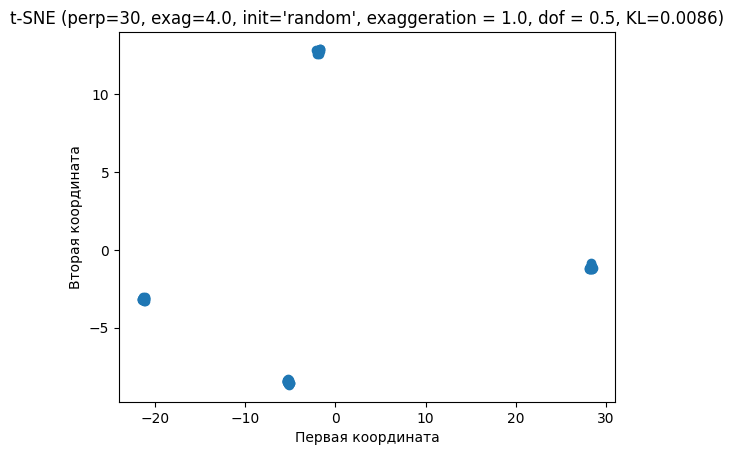

Perplexity value 30 is too high. Using perplexity 19.67 instead


Время работы: 0.23 сек
Финальная KL-дивергенция: 0.0086

Запуск t-SNE с perplexity=30, early_exaggeration=4.0, init='pca', exaggeration = 1.0, dof = 0.5
<class 'openTSNE.sklearn.TSNE'>
0.00448169540019272
TSNE(dof=0.5, early_exaggeration=4.0, exaggeration=1.0, random_state=42)


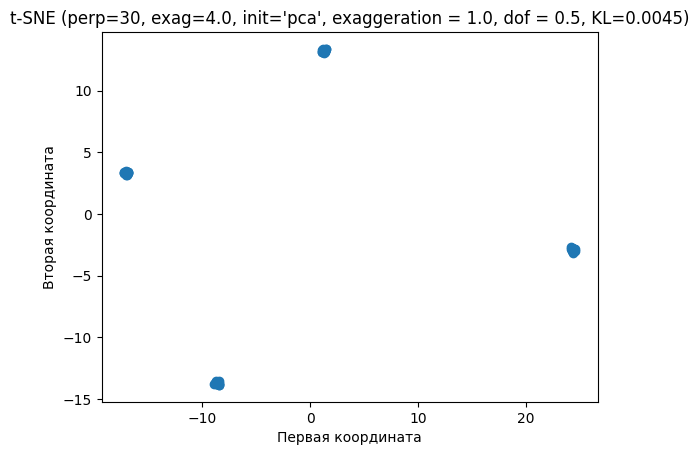

Perplexity value 30 is too high. Using perplexity 19.67 instead


Время работы: 0.24 сек
Финальная KL-дивергенция: 0.0045

Запуск t-SNE с perplexity=30, early_exaggeration=4.0, init='random', exaggeration = 4.0, dof = 0.5
<class 'openTSNE.sklearn.TSNE'>
0.15333242737934505
TSNE(dof=0.5, early_exaggeration=4.0, exaggeration=4.0, initialization='random',
     random_state=42)


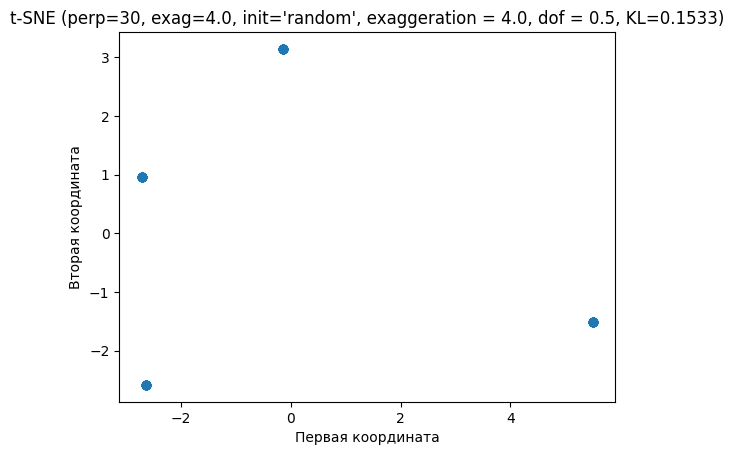

Perplexity value 30 is too high. Using perplexity 19.67 instead


Время работы: 0.23 сек
Финальная KL-дивергенция: 0.1533

Запуск t-SNE с perplexity=30, early_exaggeration=4.0, init='pca', exaggeration = 4.0, dof = 0.5
<class 'openTSNE.sklearn.TSNE'>
0.15851198673206035
TSNE(dof=0.5, early_exaggeration=4.0, exaggeration=4.0, random_state=42)


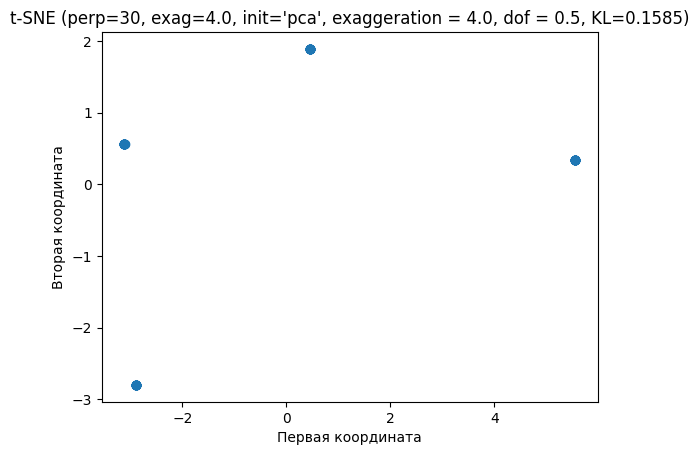

Perplexity value 30 is too high. Using perplexity 19.67 instead


Время работы: 0.23 сек
Финальная KL-дивергенция: 0.1585

Запуск t-SNE с perplexity=30, early_exaggeration=4.0, init='random', exaggeration = 12.0, dof = 0.5
<class 'openTSNE.sklearn.TSNE'>
0.9803058692203415
TSNE(dof=0.5, early_exaggeration=4.0, exaggeration=12.0,
     initialization='random', random_state=42)


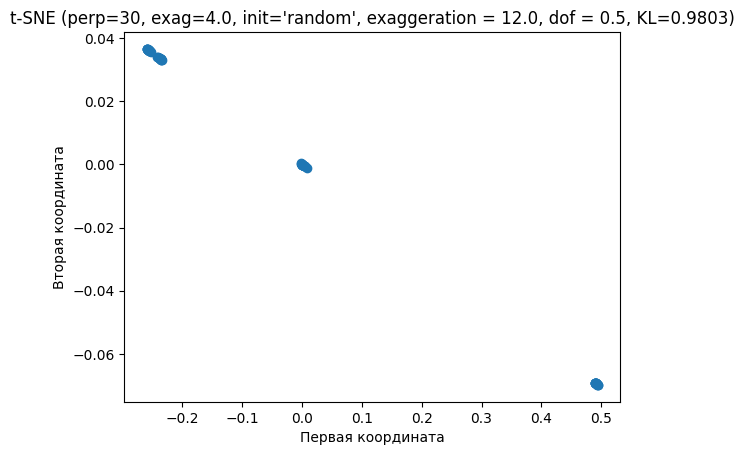

Perplexity value 30 is too high. Using perplexity 19.67 instead


Время работы: 0.22 сек
Финальная KL-дивергенция: 0.9803

Запуск t-SNE с perplexity=30, early_exaggeration=4.0, init='pca', exaggeration = 12.0, dof = 0.5
<class 'openTSNE.sklearn.TSNE'>
0.9802991003553858
TSNE(dof=0.5, early_exaggeration=4.0, exaggeration=12.0, random_state=42)


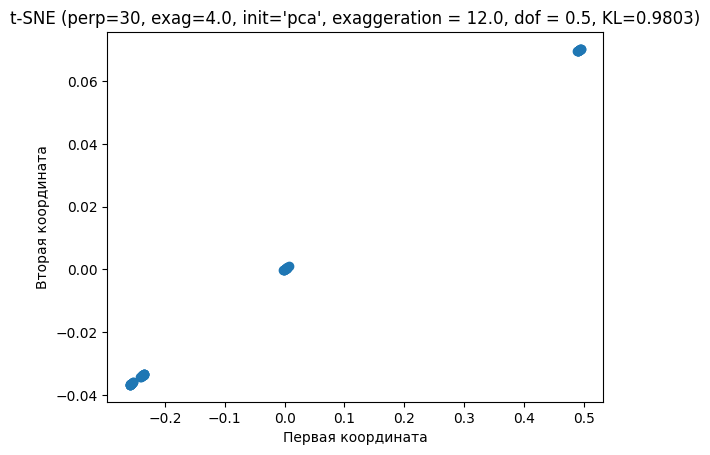

Perplexity value 30 is too high. Using perplexity 19.67 instead


Время работы: 0.22 сек
Финальная KL-дивергенция: 0.9803

Запуск t-SNE с perplexity=30, early_exaggeration=4.0, init='random', exaggeration = None, dof = 1.0
<class 'openTSNE.sklearn.TSNE'>
0.012190658523921094
TSNE(dof=1.0, early_exaggeration=4.0, initialization='random', random_state=42)


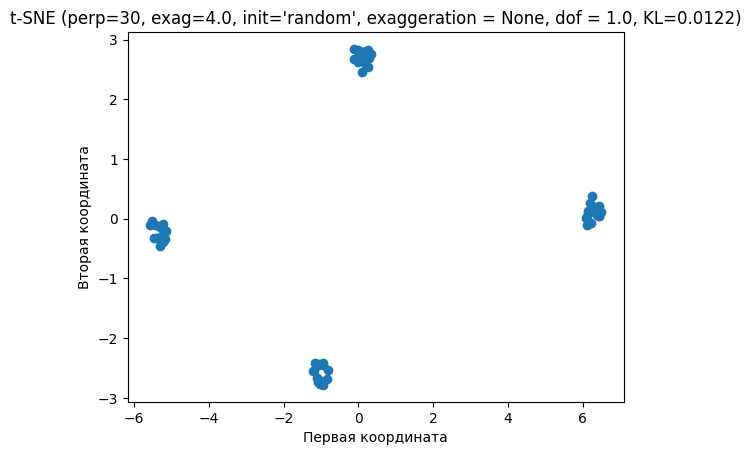

Perplexity value 30 is too high. Using perplexity 19.67 instead


Время работы: 0.17 сек
Финальная KL-дивергенция: 0.0122

Запуск t-SNE с perplexity=30, early_exaggeration=4.0, init='pca', exaggeration = None, dof = 1.0
<class 'openTSNE.sklearn.TSNE'>
0.002364278527302588
TSNE(dof=1.0, early_exaggeration=4.0, random_state=42)


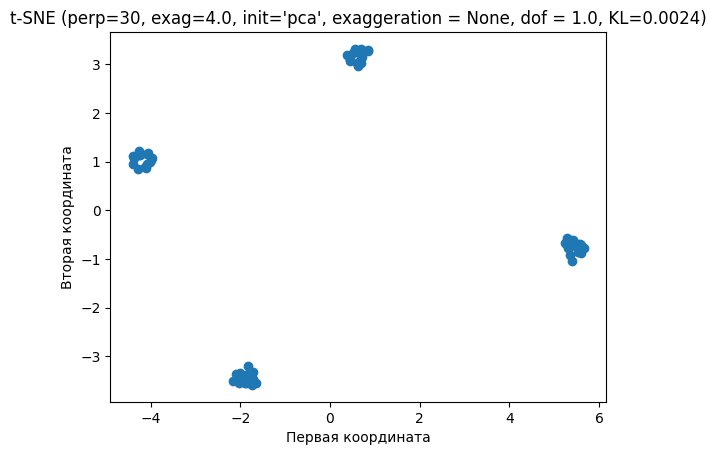

Perplexity value 30 is too high. Using perplexity 19.67 instead


Время работы: 0.17 сек
Финальная KL-дивергенция: 0.0024

Запуск t-SNE с perplexity=30, early_exaggeration=4.0, init='random', exaggeration = 1.0, dof = 1.0
<class 'openTSNE.sklearn.TSNE'>
0.012190658523921094
TSNE(dof=1.0, early_exaggeration=4.0, exaggeration=1.0, initialization='random',
     random_state=42)


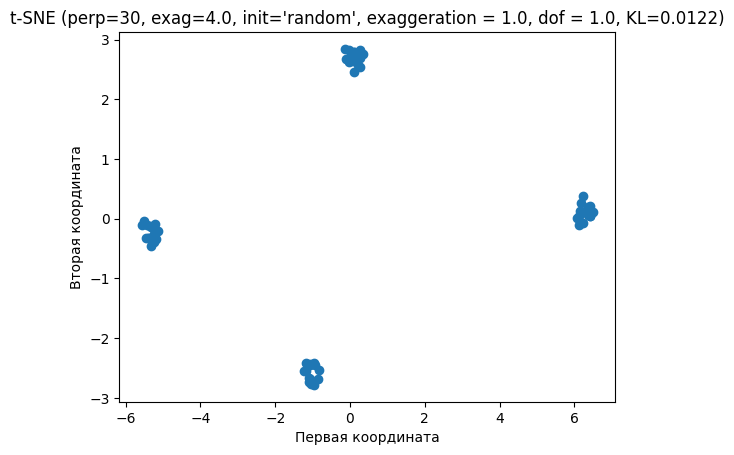

Perplexity value 30 is too high. Using perplexity 19.67 instead


Время работы: 0.17 сек
Финальная KL-дивергенция: 0.0122

Запуск t-SNE с perplexity=30, early_exaggeration=4.0, init='pca', exaggeration = 1.0, dof = 1.0
<class 'openTSNE.sklearn.TSNE'>
0.002364278527302588
TSNE(dof=1.0, early_exaggeration=4.0, exaggeration=1.0, random_state=42)


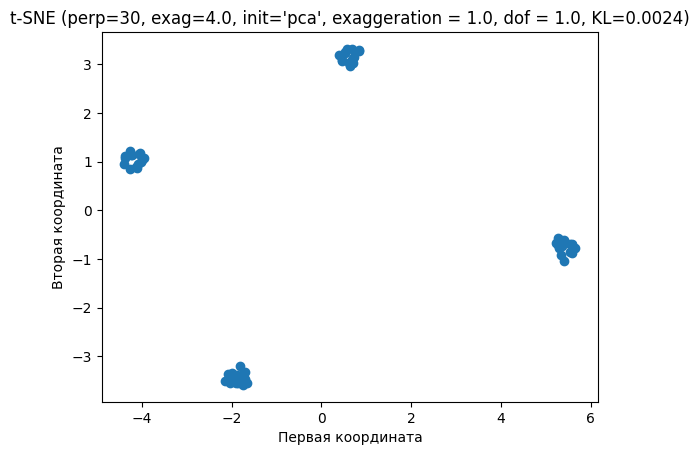

Perplexity value 30 is too high. Using perplexity 19.67 instead


Время работы: 0.17 сек
Финальная KL-дивергенция: 0.0024

Запуск t-SNE с perplexity=30, early_exaggeration=4.0, init='random', exaggeration = 4.0, dof = 1.0
<class 'openTSNE.sklearn.TSNE'>
0.17034691840583616
TSNE(dof=1.0, early_exaggeration=4.0, exaggeration=4.0, initialization='random',
     random_state=42)


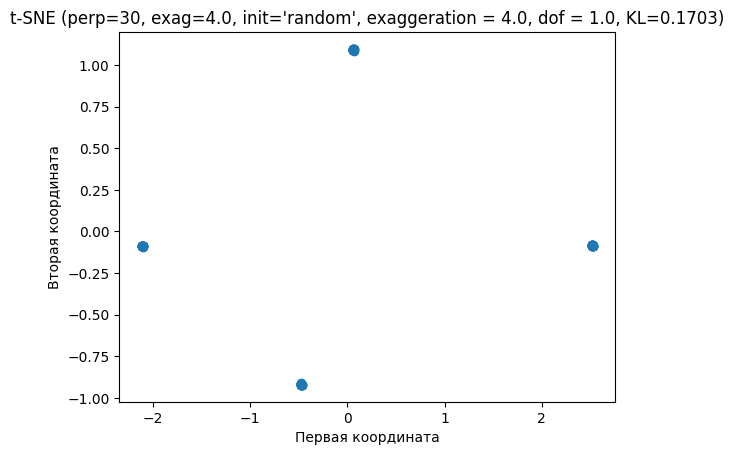

Perplexity value 30 is too high. Using perplexity 19.67 instead


Время работы: 0.16 сек
Финальная KL-дивергенция: 0.1703

Запуск t-SNE с perplexity=30, early_exaggeration=4.0, init='pca', exaggeration = 4.0, dof = 1.0
<class 'openTSNE.sklearn.TSNE'>
0.1567078346990387
TSNE(dof=1.0, early_exaggeration=4.0, exaggeration=4.0, random_state=42)


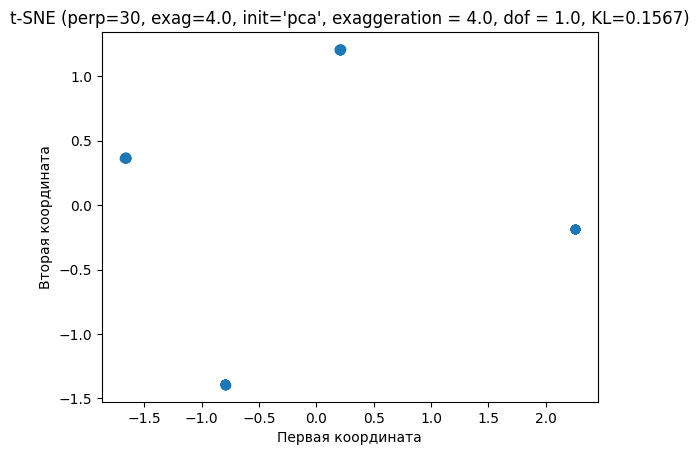

Perplexity value 30 is too high. Using perplexity 19.67 instead


Время работы: 0.17 сек
Финальная KL-дивергенция: 0.1567

Запуск t-SNE с perplexity=30, early_exaggeration=4.0, init='random', exaggeration = 12.0, dof = 1.0
<class 'openTSNE.sklearn.TSNE'>
0.9700599751591268
TSNE(dof=1.0, early_exaggeration=4.0, exaggeration=12.0,
     initialization='random', random_state=42)


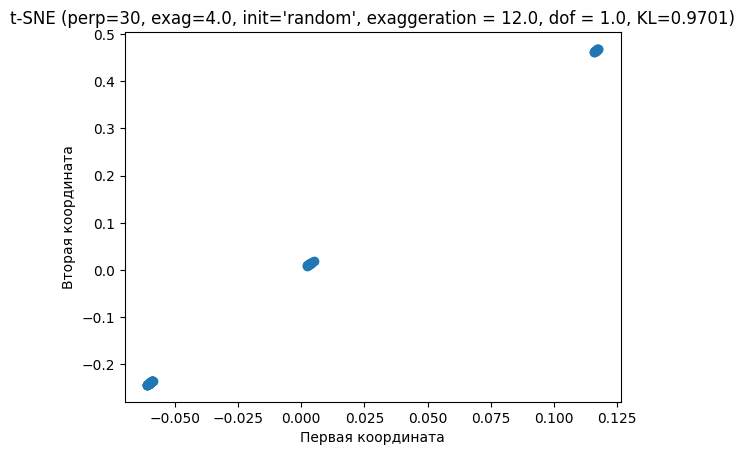

Perplexity value 30 is too high. Using perplexity 19.67 instead


Время работы: 0.18 сек
Финальная KL-дивергенция: 0.9701

Запуск t-SNE с perplexity=30, early_exaggeration=4.0, init='pca', exaggeration = 12.0, dof = 1.0
<class 'openTSNE.sklearn.TSNE'>
0.970057538432231
TSNE(dof=1.0, early_exaggeration=4.0, exaggeration=12.0, random_state=42)


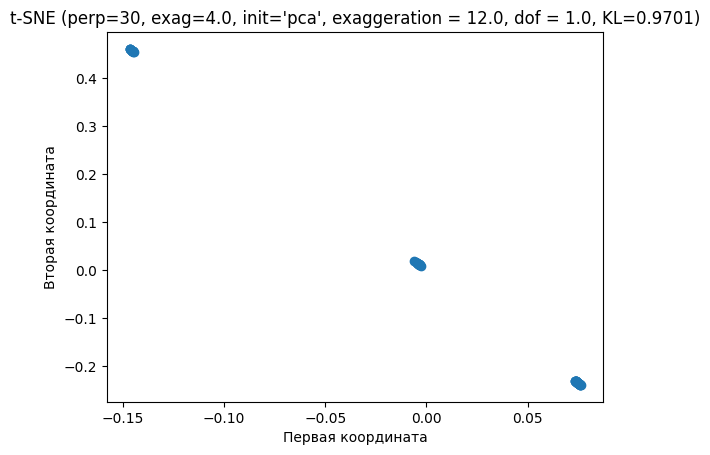

Perplexity value 30 is too high. Using perplexity 19.67 instead


Время работы: 0.18 сек
Финальная KL-дивергенция: 0.9701

Запуск t-SNE с perplexity=30, early_exaggeration=4.0, init='random', exaggeration = None, dof = 5.0
<class 'openTSNE.sklearn.TSNE'>
0.005361947709827675
TSNE(dof=5.0, early_exaggeration=4.0, initialization='random', random_state=42)


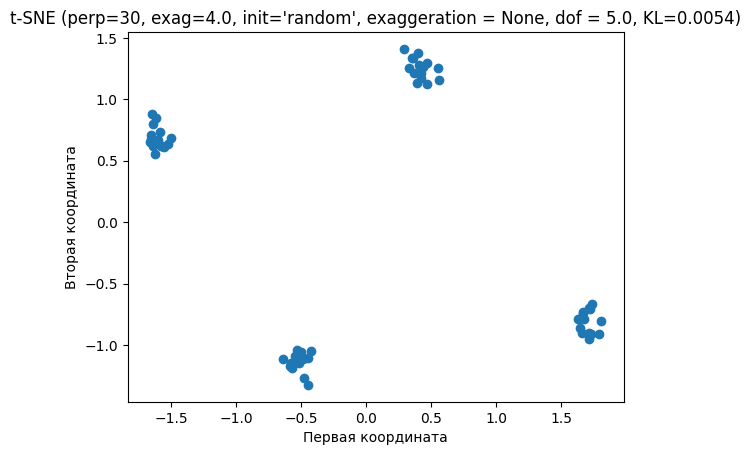

Perplexity value 30 is too high. Using perplexity 19.67 instead


Время работы: 0.22 сек
Финальная KL-дивергенция: 0.0054

Запуск t-SNE с perplexity=30, early_exaggeration=4.0, init='pca', exaggeration = None, dof = 5.0
<class 'openTSNE.sklearn.TSNE'>
0.005472341260547964
TSNE(dof=5.0, early_exaggeration=4.0, random_state=42)


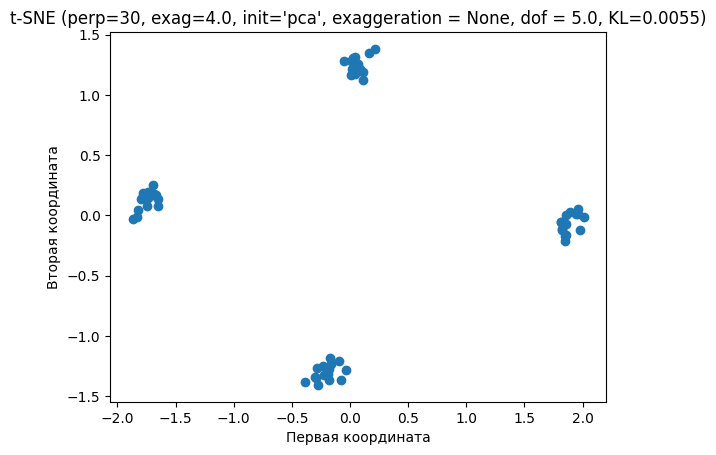

Perplexity value 30 is too high. Using perplexity 19.67 instead


Время работы: 0.22 сек
Финальная KL-дивергенция: 0.0055

Запуск t-SNE с perplexity=30, early_exaggeration=4.0, init='random', exaggeration = 1.0, dof = 5.0
<class 'openTSNE.sklearn.TSNE'>
0.005361947709827675
TSNE(dof=5.0, early_exaggeration=4.0, exaggeration=1.0, initialization='random',
     random_state=42)


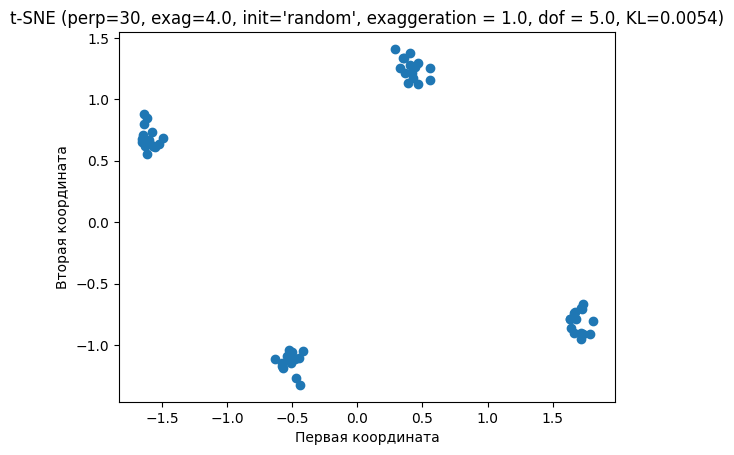

Perplexity value 30 is too high. Using perplexity 19.67 instead


Время работы: 0.22 сек
Финальная KL-дивергенция: 0.0054

Запуск t-SNE с perplexity=30, early_exaggeration=4.0, init='pca', exaggeration = 1.0, dof = 5.0
<class 'openTSNE.sklearn.TSNE'>
0.005472341260547964
TSNE(dof=5.0, early_exaggeration=4.0, exaggeration=1.0, random_state=42)


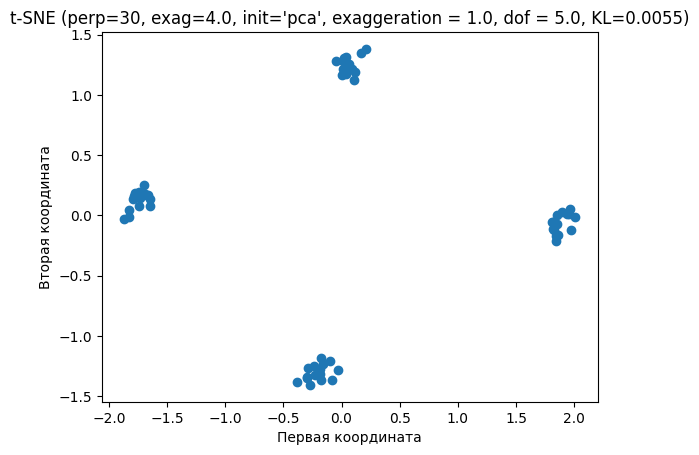

Perplexity value 30 is too high. Using perplexity 19.67 instead


Время работы: 0.23 сек
Финальная KL-дивергенция: 0.0055

Запуск t-SNE с perplexity=30, early_exaggeration=4.0, init='random', exaggeration = 4.0, dof = 5.0
<class 'openTSNE.sklearn.TSNE'>
0.16581524208193787
TSNE(dof=5.0, early_exaggeration=4.0, exaggeration=4.0, initialization='random',
     random_state=42)


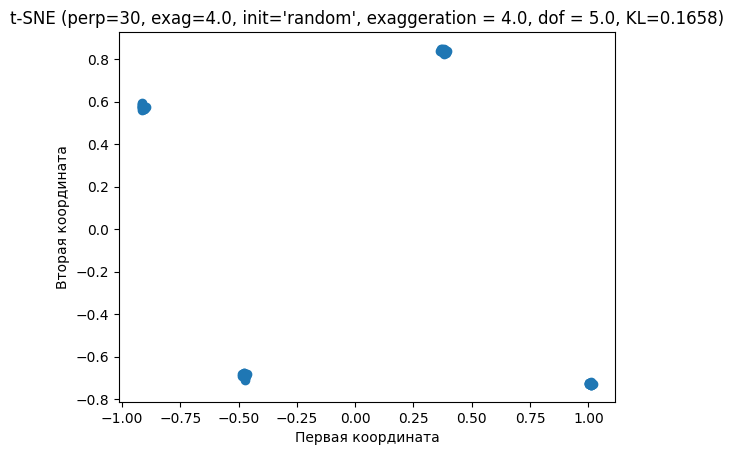

Perplexity value 30 is too high. Using perplexity 19.67 instead


Время работы: 0.23 сек
Финальная KL-дивергенция: 0.1658

Запуск t-SNE с perplexity=30, early_exaggeration=4.0, init='pca', exaggeration = 4.0, dof = 5.0
<class 'openTSNE.sklearn.TSNE'>
0.1658155526940499
TSNE(dof=5.0, early_exaggeration=4.0, exaggeration=4.0, random_state=42)


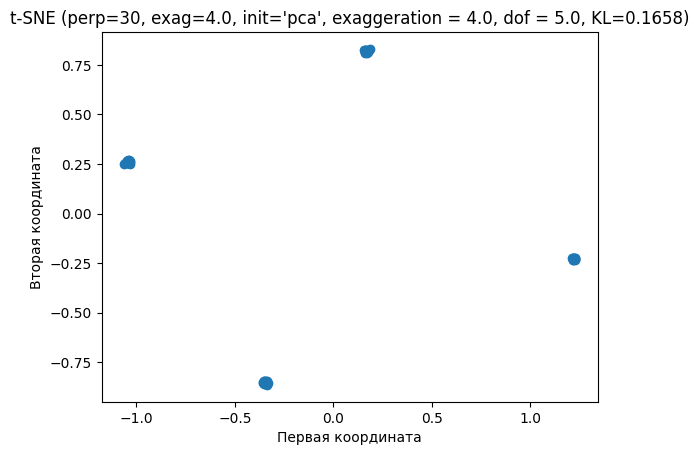

Perplexity value 30 is too high. Using perplexity 19.67 instead


Время работы: 0.23 сек
Финальная KL-дивергенция: 0.1658

Запуск t-SNE с perplexity=30, early_exaggeration=4.0, init='random', exaggeration = 12.0, dof = 5.0
<class 'openTSNE.sklearn.TSNE'>
0.9508971157140893
TSNE(dof=5.0, early_exaggeration=4.0, exaggeration=12.0,
     initialization='random', random_state=42)


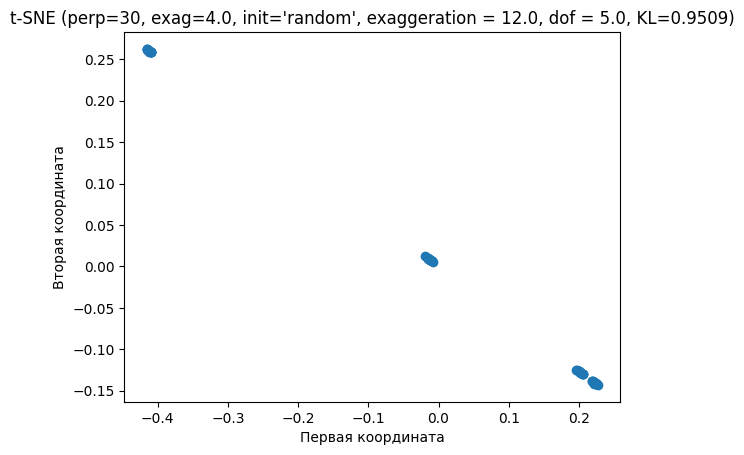

Perplexity value 30 is too high. Using perplexity 19.67 instead


Время работы: 0.21 сек
Финальная KL-дивергенция: 0.9509

Запуск t-SNE с perplexity=30, early_exaggeration=4.0, init='pca', exaggeration = 12.0, dof = 5.0
<class 'openTSNE.sklearn.TSNE'>
0.9606750222858933
TSNE(dof=5.0, early_exaggeration=4.0, exaggeration=12.0, random_state=42)


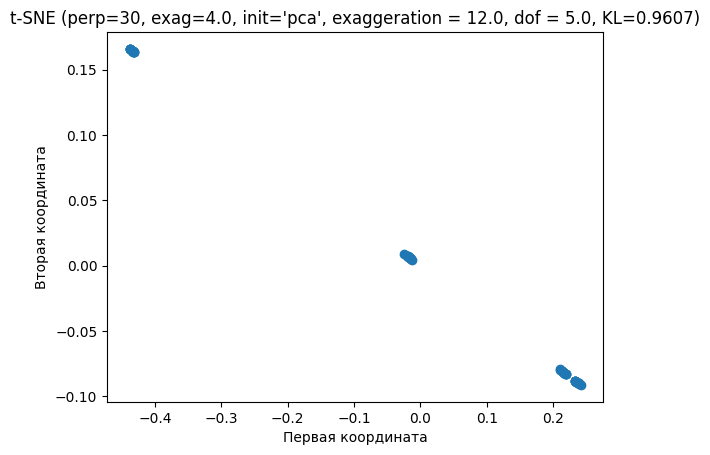

Perplexity value 30 is too high. Using perplexity 19.67 instead


Время работы: 0.22 сек
Финальная KL-дивергенция: 0.9607

Запуск t-SNE с perplexity=30, early_exaggeration=12.0, init='random', exaggeration = None, dof = 0.5
<class 'openTSNE.sklearn.TSNE'>
0.0049290357575912935
TSNE(dof=0.5, early_exaggeration=12.0, initialization='random', random_state=42)


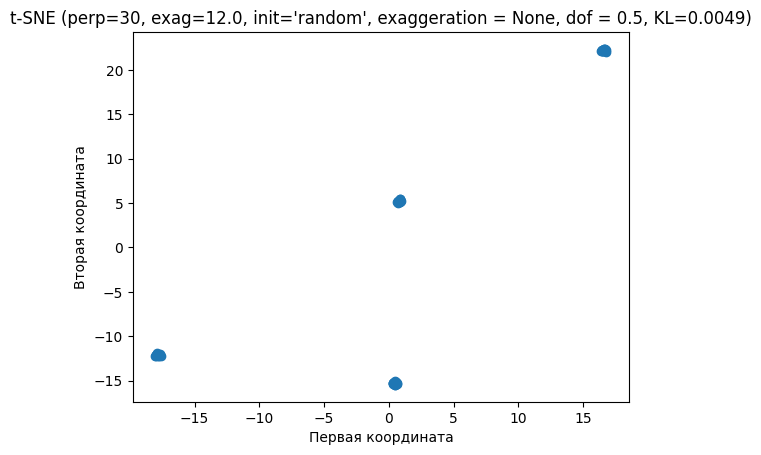

Perplexity value 30 is too high. Using perplexity 19.67 instead


Время работы: 0.23 сек
Финальная KL-дивергенция: 0.0049

Запуск t-SNE с perplexity=30, early_exaggeration=12.0, init='pca', exaggeration = None, dof = 0.5
<class 'openTSNE.sklearn.TSNE'>
0.004663389029953002
TSNE(dof=0.5, early_exaggeration=12.0, random_state=42)


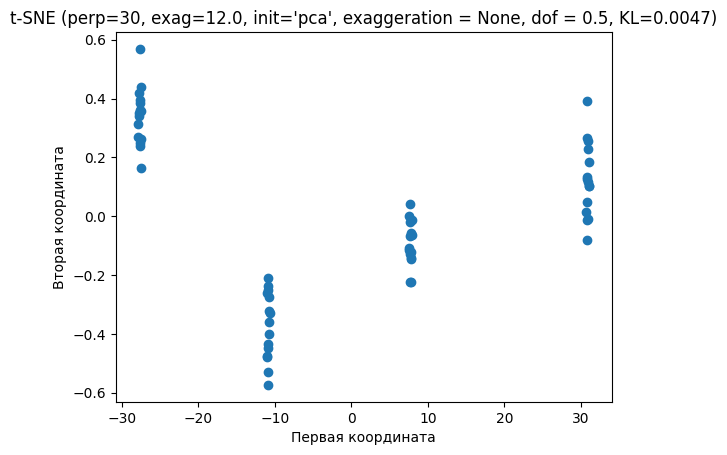

Perplexity value 30 is too high. Using perplexity 19.67 instead


Время работы: 0.24 сек
Финальная KL-дивергенция: 0.0047

Запуск t-SNE с perplexity=30, early_exaggeration=12.0, init='random', exaggeration = 1.0, dof = 0.5
<class 'openTSNE.sklearn.TSNE'>
0.0049290357575912935
TSNE(dof=0.5, early_exaggeration=12.0, exaggeration=1.0,
     initialization='random', random_state=42)


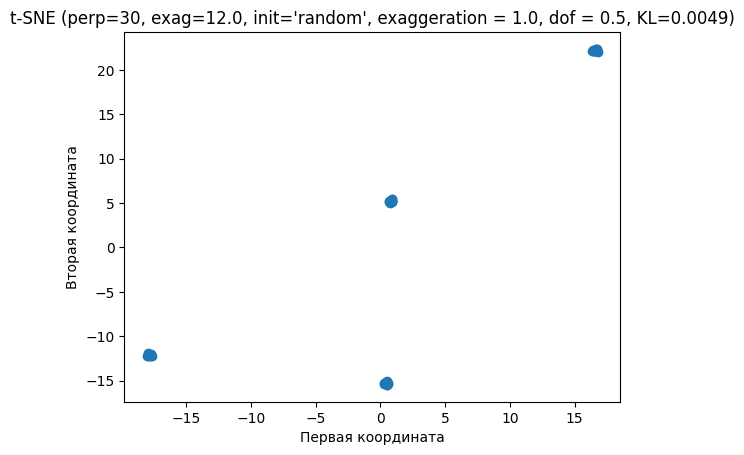

Perplexity value 30 is too high. Using perplexity 19.67 instead


Время работы: 0.23 сек
Финальная KL-дивергенция: 0.0049

Запуск t-SNE с perplexity=30, early_exaggeration=12.0, init='pca', exaggeration = 1.0, dof = 0.5
<class 'openTSNE.sklearn.TSNE'>
0.004663389029953002
TSNE(dof=0.5, early_exaggeration=12.0, exaggeration=1.0, random_state=42)


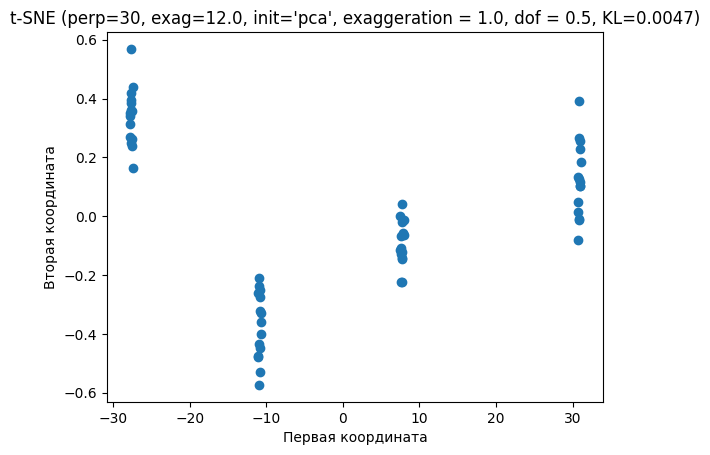

Perplexity value 30 is too high. Using perplexity 19.67 instead


Время работы: 0.22 сек
Финальная KL-дивергенция: 0.0047

Запуск t-SNE с perplexity=30, early_exaggeration=12.0, init='random', exaggeration = 4.0, dof = 0.5
<class 'openTSNE.sklearn.TSNE'>
0.1580907220176675
TSNE(dof=0.5, early_exaggeration=12.0, exaggeration=4.0,
     initialization='random', random_state=42)


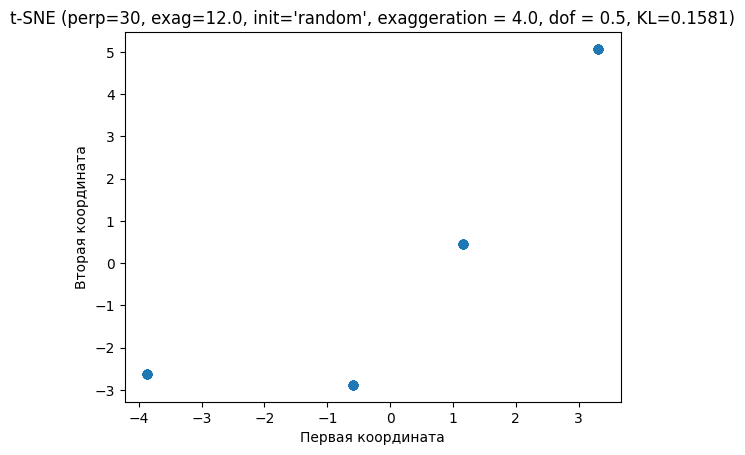

Perplexity value 30 is too high. Using perplexity 19.67 instead


Время работы: 0.22 сек
Финальная KL-дивергенция: 0.1581

Запуск t-SNE с perplexity=30, early_exaggeration=12.0, init='pca', exaggeration = 4.0, dof = 0.5
<class 'openTSNE.sklearn.TSNE'>
0.14724259058363032
TSNE(dof=0.5, early_exaggeration=12.0, exaggeration=4.0, random_state=42)


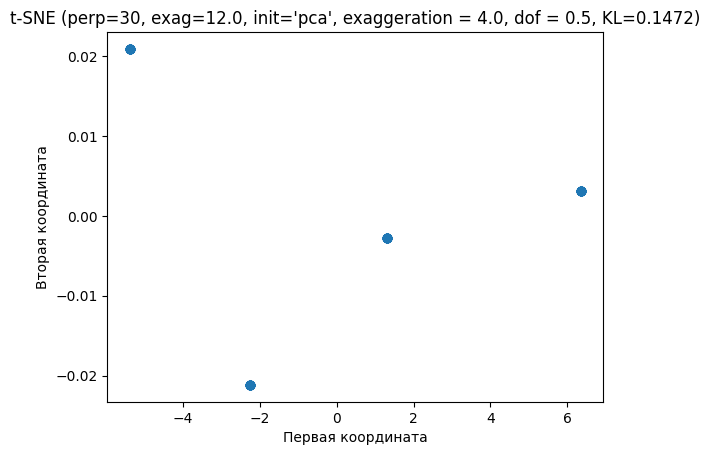

Perplexity value 30 is too high. Using perplexity 19.67 instead


Время работы: 0.24 сек
Финальная KL-дивергенция: 0.1472

Запуск t-SNE с perplexity=30, early_exaggeration=12.0, init='random', exaggeration = 12.0, dof = 0.5
<class 'openTSNE.sklearn.TSNE'>
0.9742538556504732
TSNE(dof=0.5, early_exaggeration=12.0, exaggeration=12.0,
     initialization='random', random_state=42)


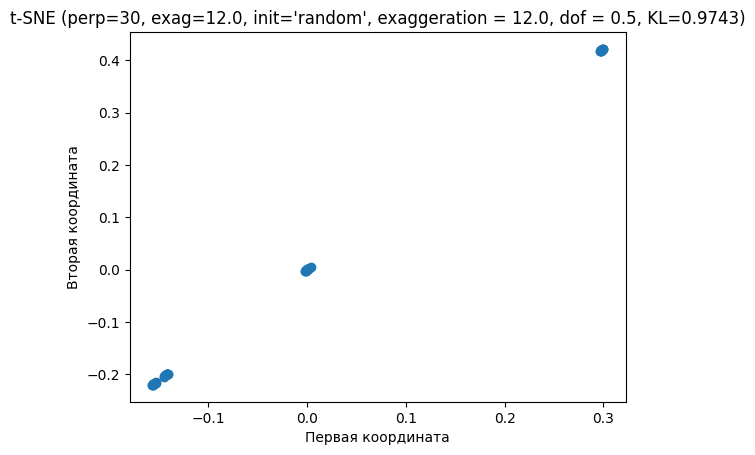

Perplexity value 30 is too high. Using perplexity 19.67 instead


Время работы: 0.22 сек
Финальная KL-дивергенция: 0.9743

Запуск t-SNE с perplexity=30, early_exaggeration=12.0, init='pca', exaggeration = 12.0, dof = 0.5
<class 'openTSNE.sklearn.TSNE'>
0.9803087839353513
TSNE(dof=0.5, early_exaggeration=12.0, exaggeration=12.0, random_state=42)


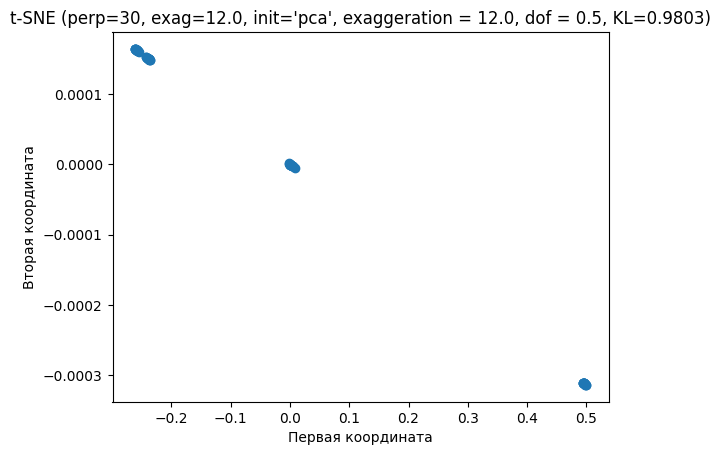

Perplexity value 30 is too high. Using perplexity 19.67 instead


Время работы: 0.21 сек
Финальная KL-дивергенция: 0.9803

Запуск t-SNE с perplexity=30, early_exaggeration=12.0, init='random', exaggeration = None, dof = 1.0
<class 'openTSNE.sklearn.TSNE'>
0.002224474796883591
TSNE(dof=1.0, early_exaggeration=12.0, initialization='random', random_state=42)


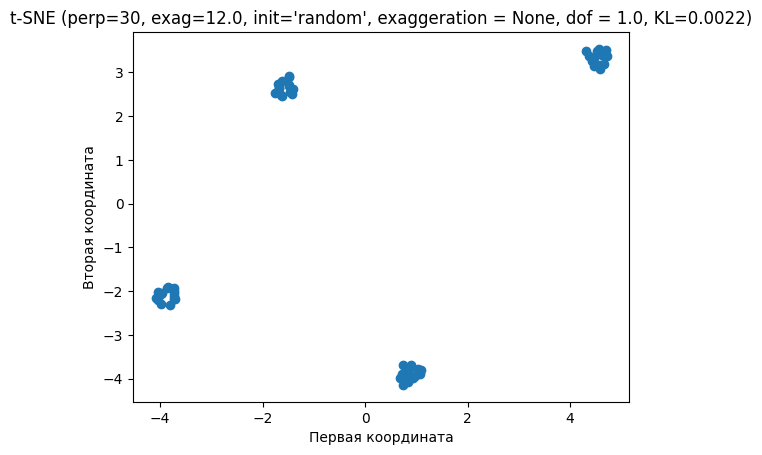

Perplexity value 30 is too high. Using perplexity 19.67 instead


Время работы: 0.16 сек
Финальная KL-дивергенция: 0.0022

Запуск t-SNE с perplexity=30, early_exaggeration=12.0, init='pca', exaggeration = None, dof = 1.0
<class 'openTSNE.sklearn.TSNE'>
0.005214028731162834
TSNE(dof=1.0, early_exaggeration=12.0, random_state=42)


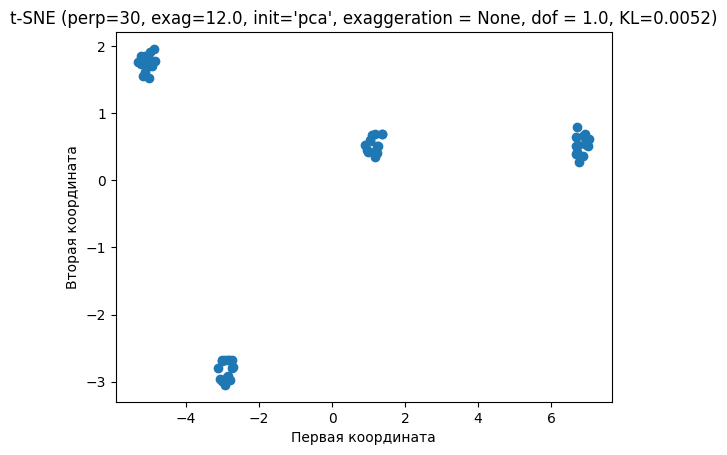

Perplexity value 30 is too high. Using perplexity 19.67 instead


Время работы: 0.16 сек
Финальная KL-дивергенция: 0.0052

Запуск t-SNE с perplexity=30, early_exaggeration=12.0, init='random', exaggeration = 1.0, dof = 1.0
<class 'openTSNE.sklearn.TSNE'>
0.002224474796883591
TSNE(dof=1.0, early_exaggeration=12.0, exaggeration=1.0,
     initialization='random', random_state=42)


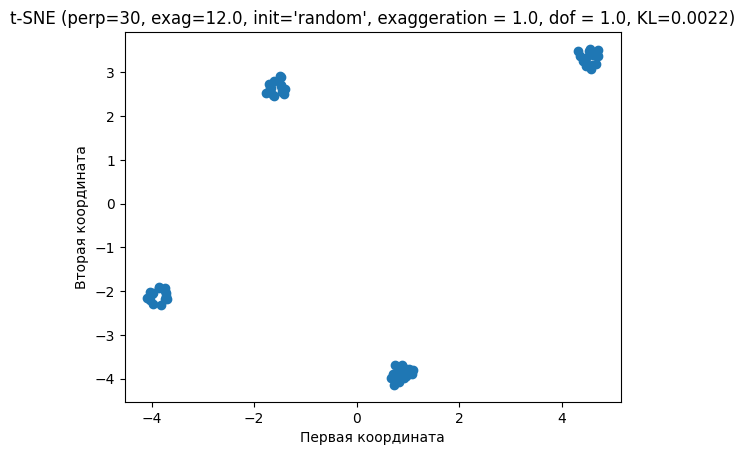

Perplexity value 30 is too high. Using perplexity 19.67 instead


Время работы: 0.18 сек
Финальная KL-дивергенция: 0.0022

Запуск t-SNE с perplexity=30, early_exaggeration=12.0, init='pca', exaggeration = 1.0, dof = 1.0
<class 'openTSNE.sklearn.TSNE'>
0.005214028731162834
TSNE(dof=1.0, early_exaggeration=12.0, exaggeration=1.0, random_state=42)


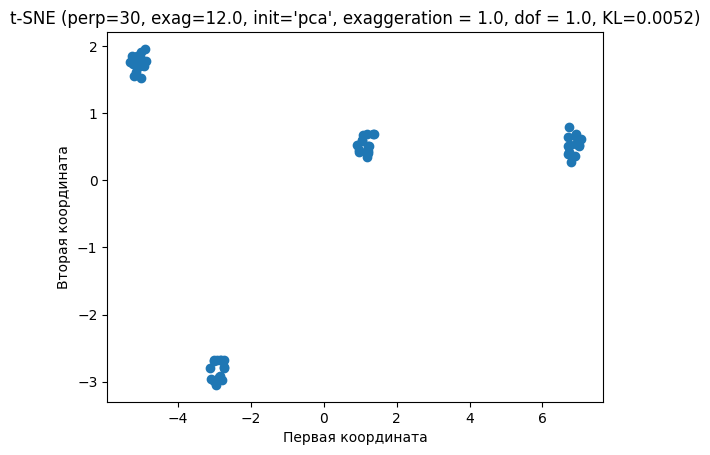

Perplexity value 30 is too high. Using perplexity 19.67 instead


Время работы: 0.18 сек
Финальная KL-дивергенция: 0.0052

Запуск t-SNE с perplexity=30, early_exaggeration=12.0, init='random', exaggeration = 4.0, dof = 1.0
<class 'openTSNE.sklearn.TSNE'>
0.15670784015828154
TSNE(dof=1.0, early_exaggeration=12.0, exaggeration=4.0,
     initialization='random', random_state=42)


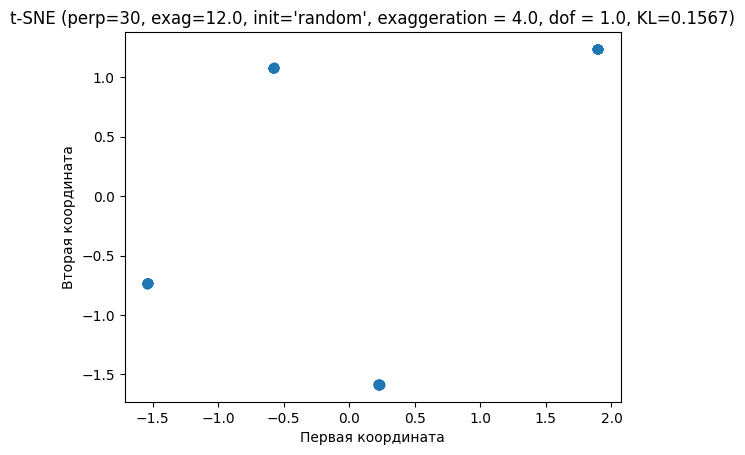

Perplexity value 30 is too high. Using perplexity 19.67 instead


Время работы: 0.18 сек
Финальная KL-дивергенция: 0.1567

Запуск t-SNE с perplexity=30, early_exaggeration=12.0, init='pca', exaggeration = 4.0, dof = 1.0
<class 'openTSNE.sklearn.TSNE'>
0.15670783578928393
TSNE(dof=1.0, early_exaggeration=12.0, exaggeration=4.0, random_state=42)


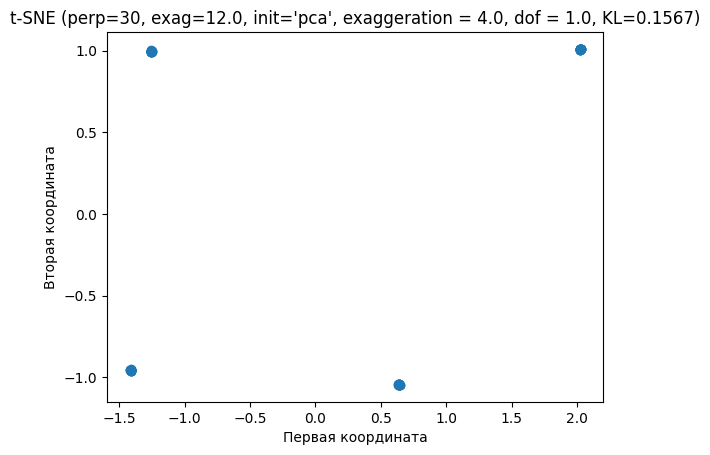

Perplexity value 30 is too high. Using perplexity 19.67 instead


Время работы: 0.18 сек
Финальная KL-дивергенция: 0.1567

Запуск t-SNE с perplexity=30, early_exaggeration=12.0, init='random', exaggeration = 12.0, dof = 1.0
<class 'openTSNE.sklearn.TSNE'>
0.9604029066362116
TSNE(dof=1.0, early_exaggeration=12.0, exaggeration=12.0,
     initialization='random', random_state=42)


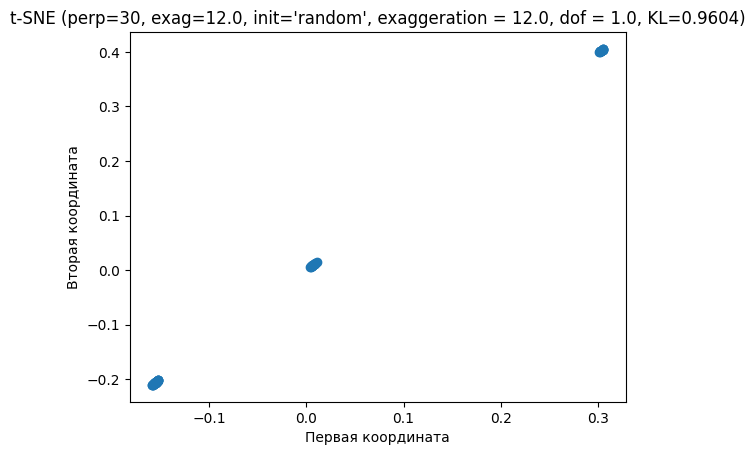

Perplexity value 30 is too high. Using perplexity 19.67 instead


Время работы: 0.17 сек
Финальная KL-дивергенция: 0.9604

Запуск t-SNE с perplexity=30, early_exaggeration=12.0, init='pca', exaggeration = 12.0, dof = 1.0
<class 'openTSNE.sklearn.TSNE'>
0.970396918543047
TSNE(dof=1.0, early_exaggeration=12.0, exaggeration=12.0, random_state=42)


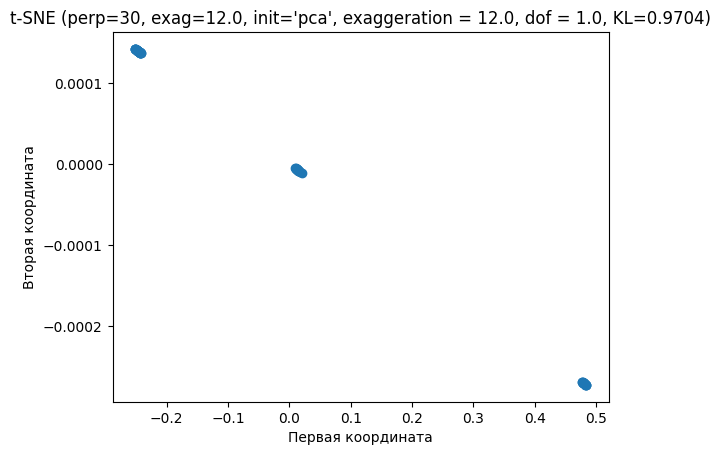

Perplexity value 30 is too high. Using perplexity 19.67 instead


Время работы: 0.18 сек
Финальная KL-дивергенция: 0.9704

Запуск t-SNE с perplexity=30, early_exaggeration=12.0, init='random', exaggeration = None, dof = 5.0
<class 'openTSNE.sklearn.TSNE'>
0.005382277651602152
TSNE(dof=5.0, early_exaggeration=12.0, initialization='random', random_state=42)


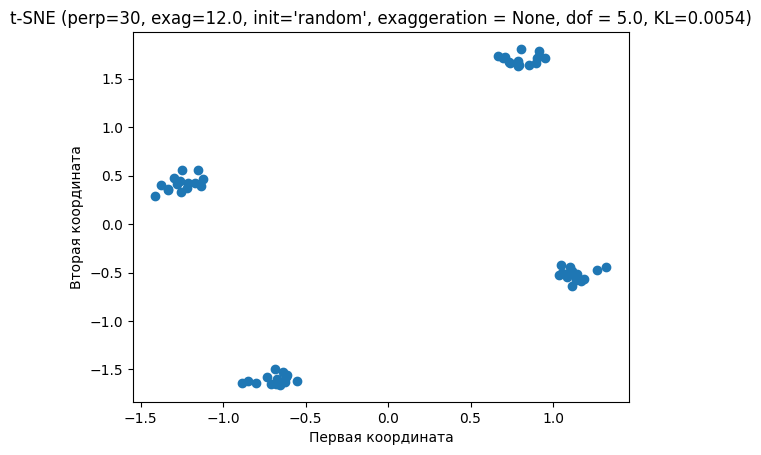

Perplexity value 30 is too high. Using perplexity 19.67 instead


Время работы: 0.23 сек
Финальная KL-дивергенция: 0.0054

Запуск t-SNE с perplexity=30, early_exaggeration=12.0, init='pca', exaggeration = None, dof = 5.0
<class 'openTSNE.sklearn.TSNE'>
0.005468022986236498
TSNE(dof=5.0, early_exaggeration=12.0, random_state=42)


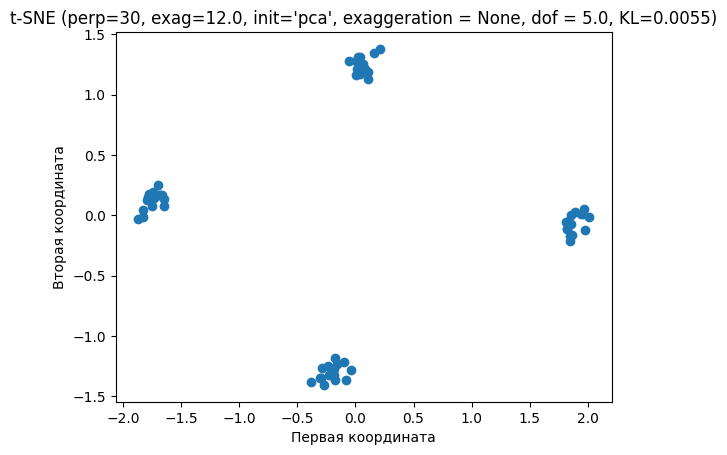

Perplexity value 30 is too high. Using perplexity 19.67 instead


Время работы: 0.22 сек
Финальная KL-дивергенция: 0.0055

Запуск t-SNE с perplexity=30, early_exaggeration=12.0, init='random', exaggeration = 1.0, dof = 5.0
<class 'openTSNE.sklearn.TSNE'>
0.005382277651602152
TSNE(dof=5.0, early_exaggeration=12.0, exaggeration=1.0,
     initialization='random', random_state=42)


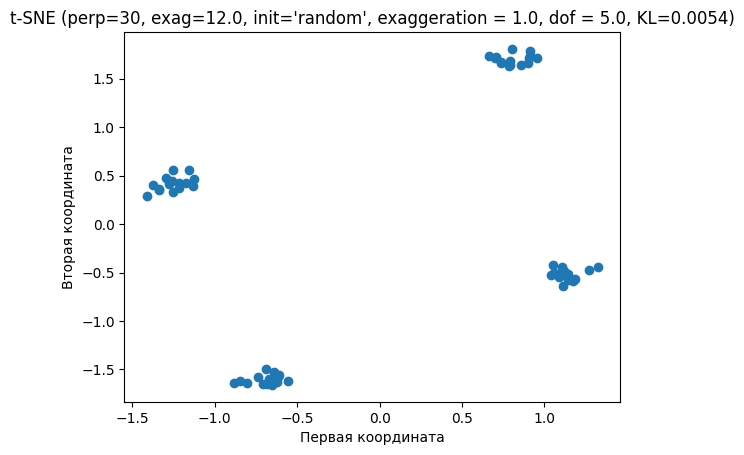

Perplexity value 30 is too high. Using perplexity 19.67 instead


Время работы: 0.22 сек
Финальная KL-дивергенция: 0.0054

Запуск t-SNE с perplexity=30, early_exaggeration=12.0, init='pca', exaggeration = 1.0, dof = 5.0
<class 'openTSNE.sklearn.TSNE'>
0.005468022986236498
TSNE(dof=5.0, early_exaggeration=12.0, exaggeration=1.0, random_state=42)


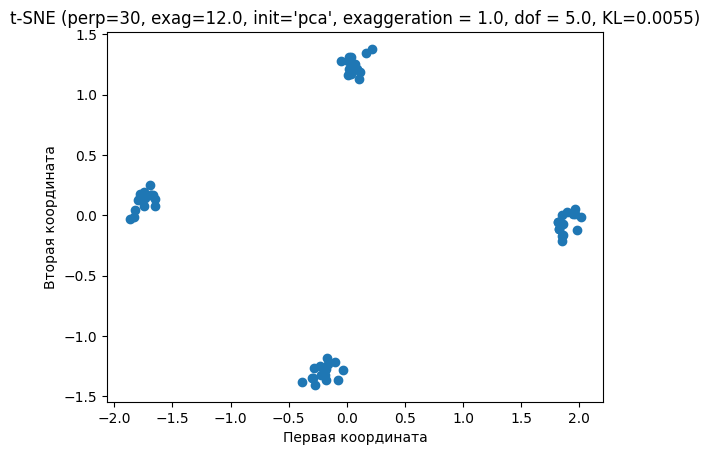

Perplexity value 30 is too high. Using perplexity 19.67 instead


Время работы: 0.22 сек
Финальная KL-дивергенция: 0.0055

Запуск t-SNE с perplexity=30, early_exaggeration=12.0, init='random', exaggeration = 4.0, dof = 5.0
<class 'openTSNE.sklearn.TSNE'>
0.1658154904951008
TSNE(dof=5.0, early_exaggeration=12.0, exaggeration=4.0,
     initialization='random', random_state=42)


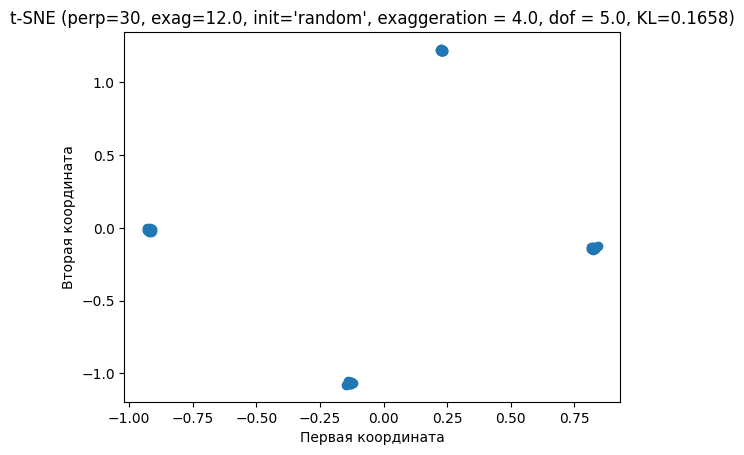

Perplexity value 30 is too high. Using perplexity 19.67 instead


Время работы: 0.21 сек
Финальная KL-дивергенция: 0.1658

Запуск t-SNE с perplexity=30, early_exaggeration=12.0, init='pca', exaggeration = 4.0, dof = 5.0
<class 'openTSNE.sklearn.TSNE'>
0.16581535486935017
TSNE(dof=5.0, early_exaggeration=12.0, exaggeration=4.0, random_state=42)


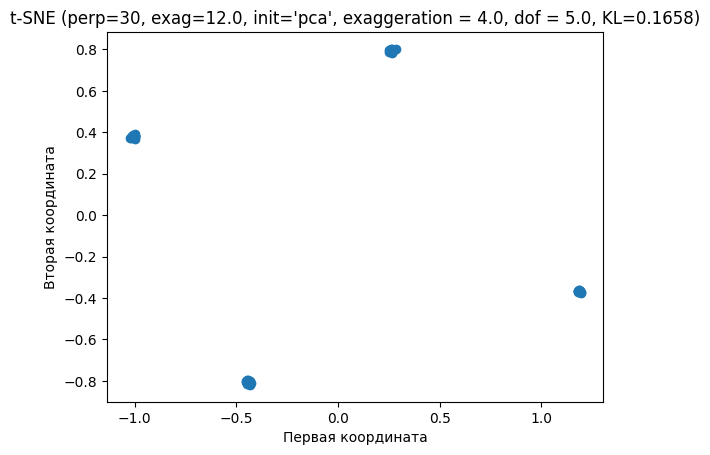

Perplexity value 30 is too high. Using perplexity 19.67 instead


Время работы: 0.21 сек
Финальная KL-дивергенция: 0.1658

Запуск t-SNE с perplexity=30, early_exaggeration=12.0, init='random', exaggeration = 12.0, dof = 5.0
<class 'openTSNE.sklearn.TSNE'>
0.9504998818613366
TSNE(dof=5.0, early_exaggeration=12.0, exaggeration=12.0,
     initialization='random', random_state=42)


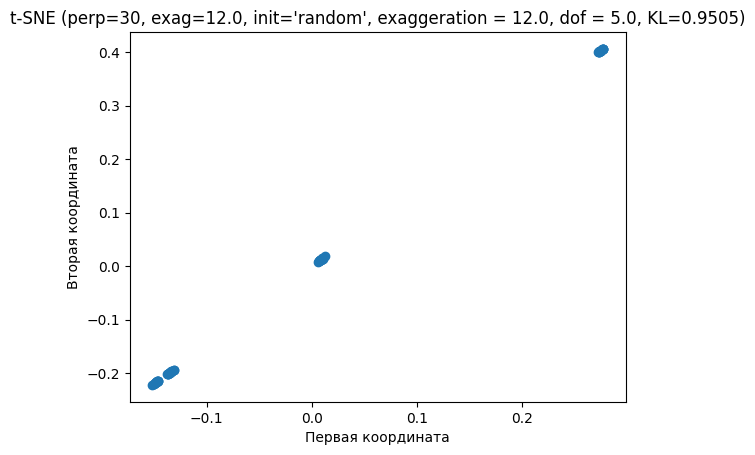

Perplexity value 30 is too high. Using perplexity 19.67 instead


Время работы: 0.21 сек
Финальная KL-дивергенция: 0.9505

Запуск t-SNE с perplexity=30, early_exaggeration=12.0, init='pca', exaggeration = 12.0, dof = 5.0
<class 'openTSNE.sklearn.TSNE'>
0.9606611480838803
TSNE(dof=5.0, early_exaggeration=12.0, exaggeration=12.0, random_state=42)


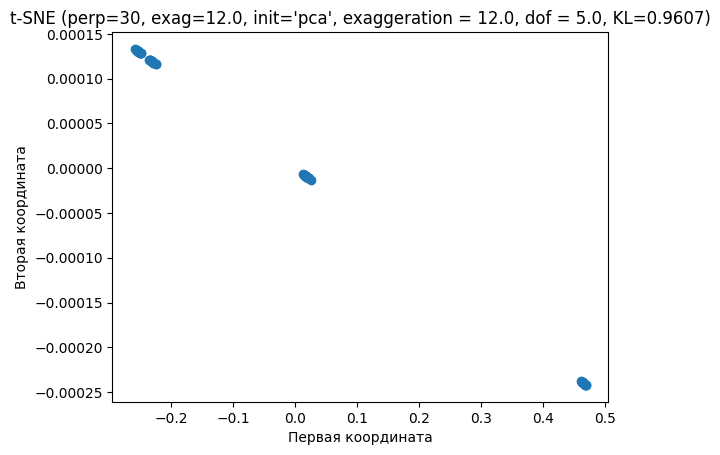

Perplexity value 30 is too high. Using perplexity 19.67 instead


Время работы: 0.20 сек
Финальная KL-дивергенция: 0.9607

Запуск t-SNE с perplexity=30, early_exaggeration=24.0, init='random', exaggeration = None, dof = 0.5
<class 'openTSNE.sklearn.TSNE'>
0.004588494158281442
TSNE(dof=0.5, early_exaggeration=24.0, initialization='random', random_state=42)


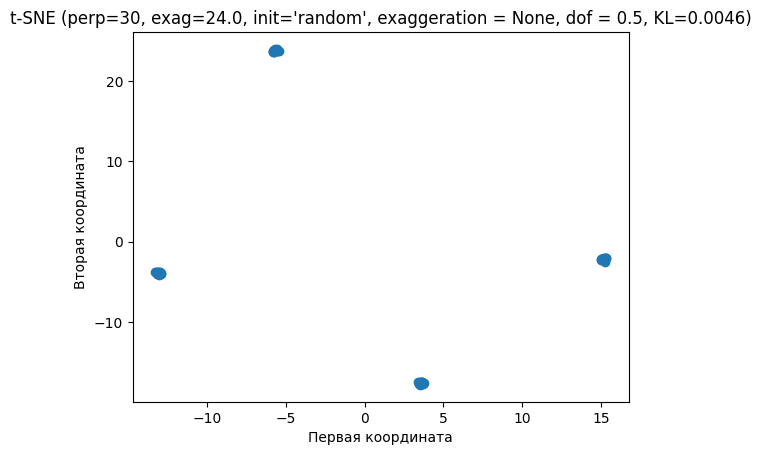

Perplexity value 30 is too high. Using perplexity 19.67 instead


Время работы: 0.20 сек
Финальная KL-дивергенция: 0.0046

Запуск t-SNE с perplexity=30, early_exaggeration=24.0, init='pca', exaggeration = None, dof = 0.5
<class 'openTSNE.sklearn.TSNE'>
0.004465523027906038
TSNE(dof=0.5, early_exaggeration=24.0, random_state=42)


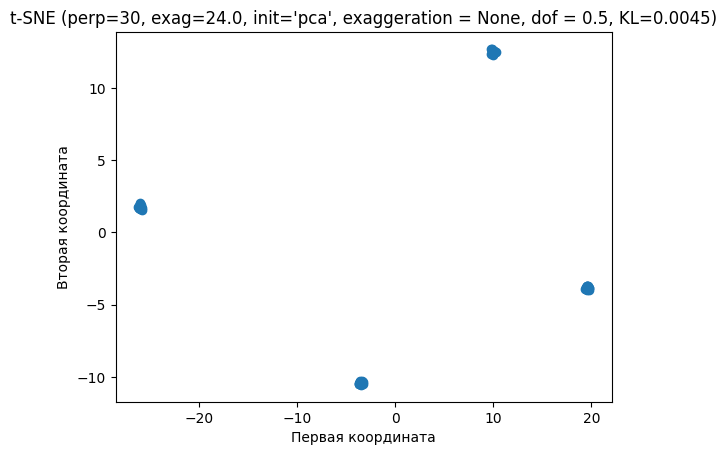

Perplexity value 30 is too high. Using perplexity 19.67 instead


Время работы: 0.19 сек
Финальная KL-дивергенция: 0.0045

Запуск t-SNE с perplexity=30, early_exaggeration=24.0, init='random', exaggeration = 1.0, dof = 0.5
<class 'openTSNE.sklearn.TSNE'>
0.004588494158281442
TSNE(dof=0.5, early_exaggeration=24.0, exaggeration=1.0,
     initialization='random', random_state=42)


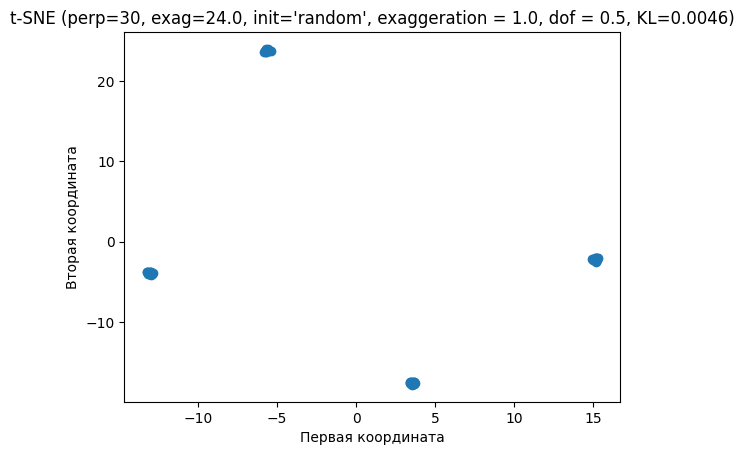

Perplexity value 30 is too high. Using perplexity 19.67 instead


Время работы: 0.19 сек
Финальная KL-дивергенция: 0.0046

Запуск t-SNE с perplexity=30, early_exaggeration=24.0, init='pca', exaggeration = 1.0, dof = 0.5
<class 'openTSNE.sklearn.TSNE'>
0.004465523027906038
TSNE(dof=0.5, early_exaggeration=24.0, exaggeration=1.0, random_state=42)


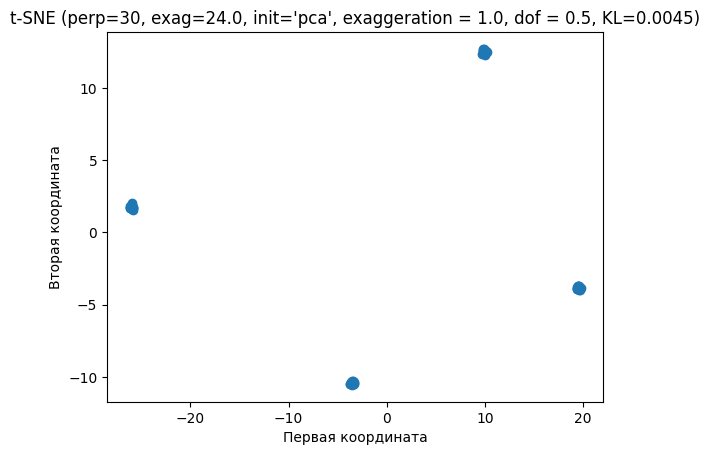

Perplexity value 30 is too high. Using perplexity 19.67 instead


Время работы: 0.19 сек
Финальная KL-дивергенция: 0.0045

Запуск t-SNE с perplexity=30, early_exaggeration=24.0, init='random', exaggeration = 4.0, dof = 0.5
<class 'openTSNE.sklearn.TSNE'>
0.15764352555121697
TSNE(dof=0.5, early_exaggeration=24.0, exaggeration=4.0,
     initialization='random', random_state=42)


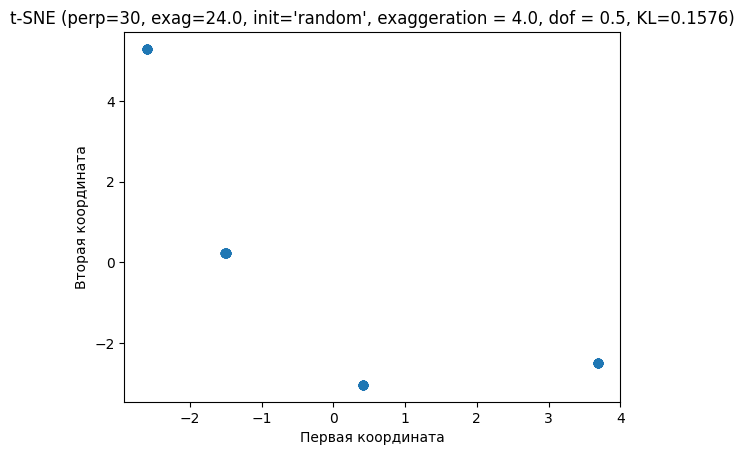

Perplexity value 30 is too high. Using perplexity 19.67 instead


Время работы: 0.21 сек
Финальная KL-дивергенция: 0.1576

Запуск t-SNE с perplexity=30, early_exaggeration=24.0, init='pca', exaggeration = 4.0, dof = 0.5
<class 'openTSNE.sklearn.TSNE'>
0.15814728958419355
TSNE(dof=0.5, early_exaggeration=24.0, exaggeration=4.0, random_state=42)


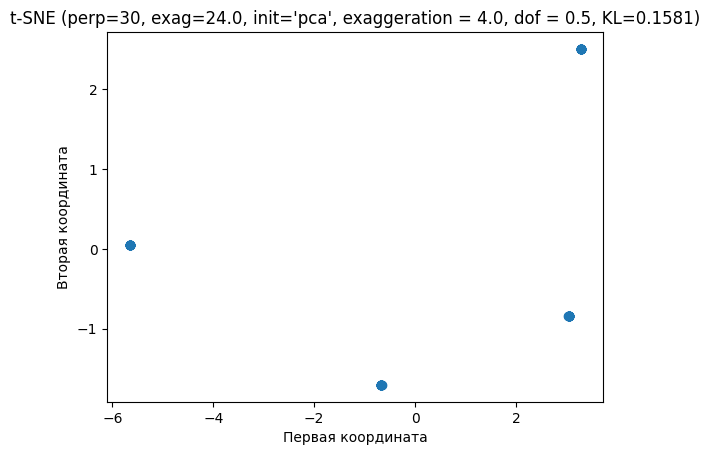

Perplexity value 30 is too high. Using perplexity 19.67 instead


Время работы: 0.19 сек
Финальная KL-дивергенция: 0.1581

Запуск t-SNE с perplexity=30, early_exaggeration=24.0, init='random', exaggeration = 12.0, dof = 0.5
<class 'openTSNE.sklearn.TSNE'>
0.9739360059065474
TSNE(dof=0.5, early_exaggeration=24.0, exaggeration=12.0,
     initialization='random', random_state=42)


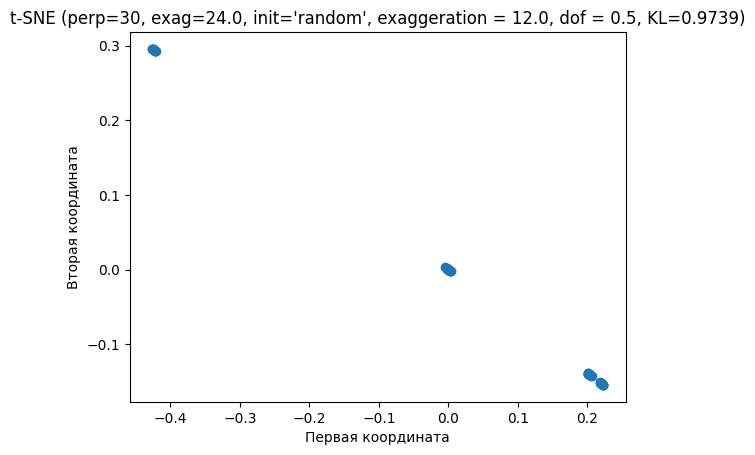

Perplexity value 30 is too high. Using perplexity 19.67 instead


Время работы: 0.20 сек
Финальная KL-дивергенция: 0.9739

Запуск t-SNE с perplexity=30, early_exaggeration=24.0, init='pca', exaggeration = 12.0, dof = 0.5
<class 'openTSNE.sklearn.TSNE'>
0.9802994755761416
TSNE(dof=0.5, early_exaggeration=24.0, exaggeration=12.0, random_state=42)


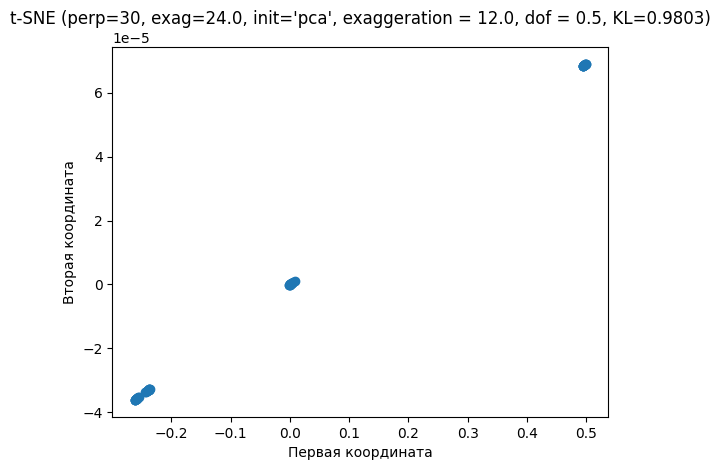

Perplexity value 30 is too high. Using perplexity 19.67 instead


Время работы: 0.18 сек
Финальная KL-дивергенция: 0.9803

Запуск t-SNE с perplexity=30, early_exaggeration=24.0, init='random', exaggeration = None, dof = 1.0
<class 'openTSNE.sklearn.TSNE'>
0.0022535775024783433
TSNE(dof=1.0, early_exaggeration=24.0, initialization='random', random_state=42)


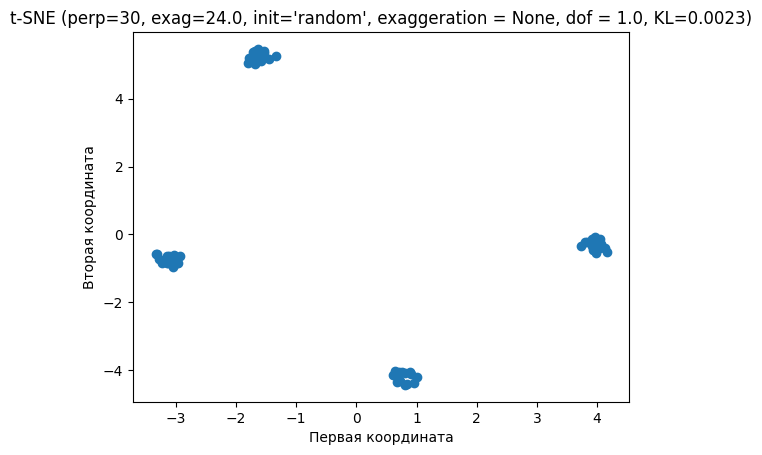

Perplexity value 30 is too high. Using perplexity 19.67 instead


Время работы: 0.16 сек
Финальная KL-дивергенция: 0.0023

Запуск t-SNE с perplexity=30, early_exaggeration=24.0, init='pca', exaggeration = None, dof = 1.0
<class 'openTSNE.sklearn.TSNE'>
0.002299170719414434
TSNE(dof=1.0, early_exaggeration=24.0, random_state=42)


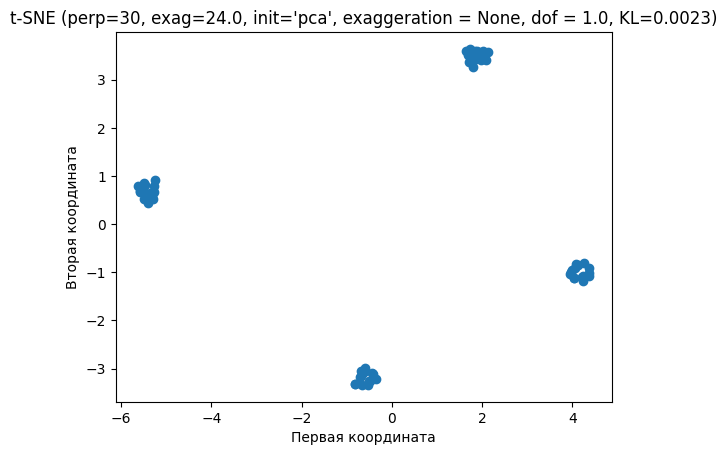

Perplexity value 30 is too high. Using perplexity 19.67 instead


Время работы: 0.15 сек
Финальная KL-дивергенция: 0.0023

Запуск t-SNE с perplexity=30, early_exaggeration=24.0, init='random', exaggeration = 1.0, dof = 1.0
<class 'openTSNE.sklearn.TSNE'>
0.0022535775024783433
TSNE(dof=1.0, early_exaggeration=24.0, exaggeration=1.0,
     initialization='random', random_state=42)


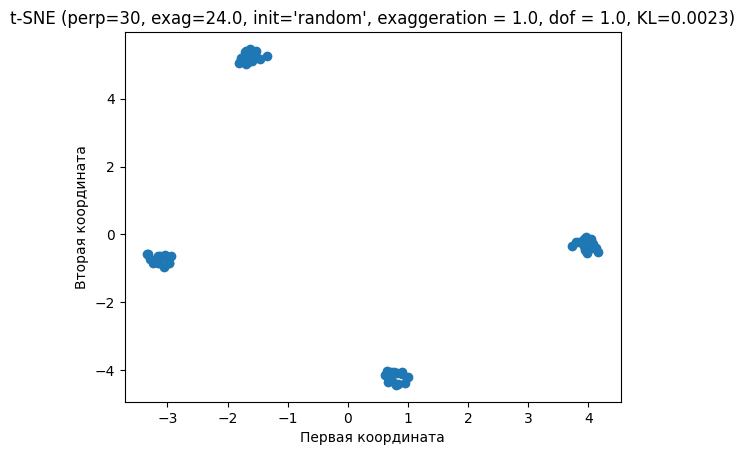

Perplexity value 30 is too high. Using perplexity 19.67 instead


Время работы: 0.15 сек
Финальная KL-дивергенция: 0.0023

Запуск t-SNE с perplexity=30, early_exaggeration=24.0, init='pca', exaggeration = 1.0, dof = 1.0
<class 'openTSNE.sklearn.TSNE'>
0.002299170719414434
TSNE(dof=1.0, early_exaggeration=24.0, exaggeration=1.0, random_state=42)


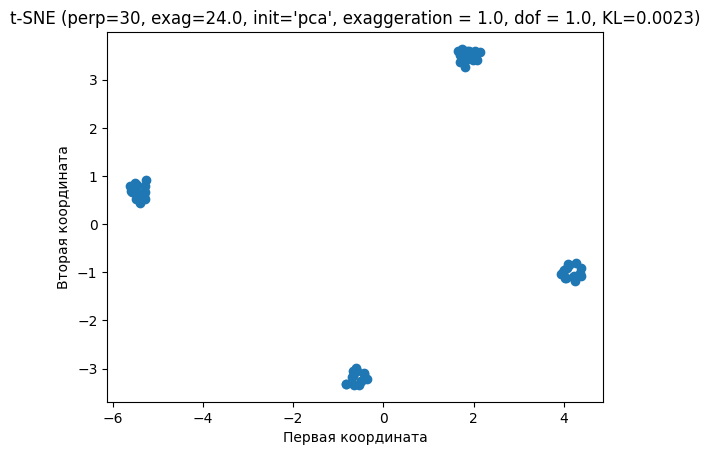

Perplexity value 30 is too high. Using perplexity 19.67 instead


Время работы: 0.15 сек
Финальная KL-дивергенция: 0.0023

Запуск t-SNE с perplexity=30, early_exaggeration=24.0, init='random', exaggeration = 4.0, dof = 1.0
<class 'openTSNE.sklearn.TSNE'>
0.15670788353468357
TSNE(dof=1.0, early_exaggeration=24.0, exaggeration=4.0,
     initialization='random', random_state=42)


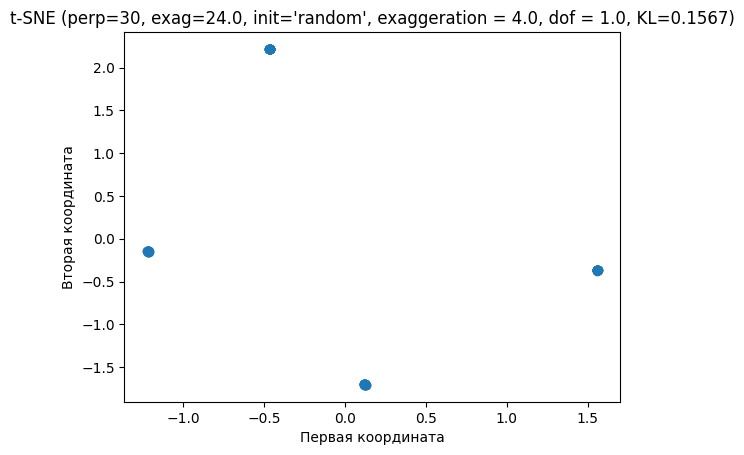

Perplexity value 30 is too high. Using perplexity 19.67 instead


Время работы: 0.15 сек
Финальная KL-дивергенция: 0.1567

Запуск t-SNE с perplexity=30, early_exaggeration=24.0, init='pca', exaggeration = 4.0, dof = 1.0
<class 'openTSNE.sklearn.TSNE'>
0.15670787329211588
TSNE(dof=1.0, early_exaggeration=24.0, exaggeration=4.0, random_state=42)


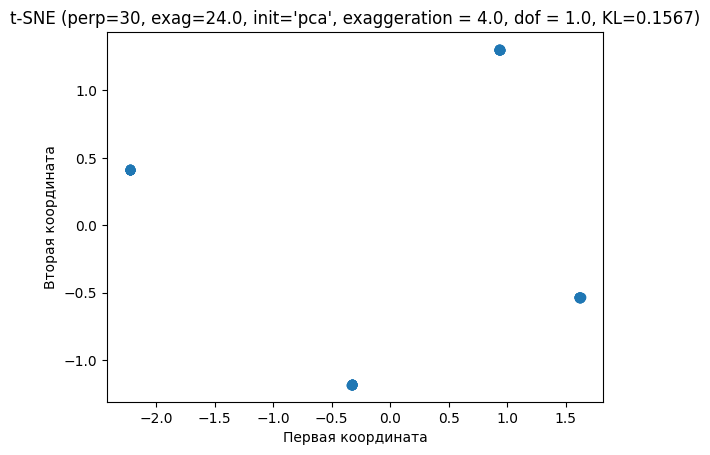

Perplexity value 30 is too high. Using perplexity 19.67 instead


Время работы: 0.15 сек
Финальная KL-дивергенция: 0.1567

Запуск t-SNE с perplexity=30, early_exaggeration=24.0, init='random', exaggeration = 12.0, dof = 1.0
<class 'openTSNE.sklearn.TSNE'>
0.9604063289481521
TSNE(dof=1.0, early_exaggeration=24.0, exaggeration=12.0,
     initialization='random', random_state=42)


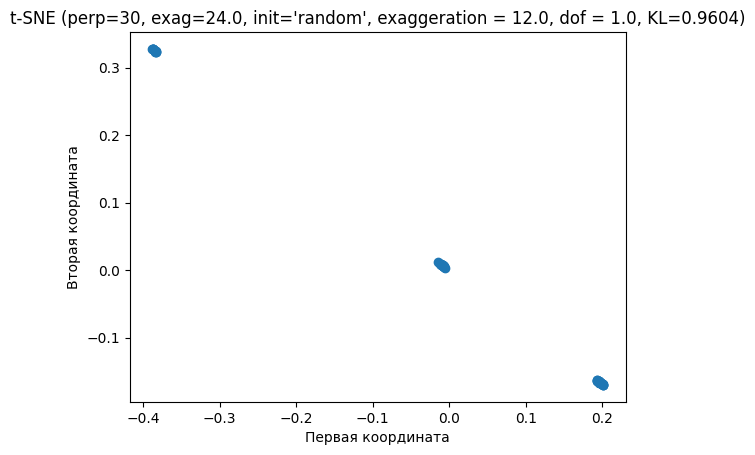

Perplexity value 30 is too high. Using perplexity 19.67 instead


Время работы: 0.15 сек
Финальная KL-дивергенция: 0.9604

Запуск t-SNE с perplexity=30, early_exaggeration=24.0, init='pca', exaggeration = 12.0, dof = 1.0
<class 'openTSNE.sklearn.TSNE'>
0.9700623482922364
TSNE(dof=1.0, early_exaggeration=24.0, exaggeration=12.0, random_state=42)


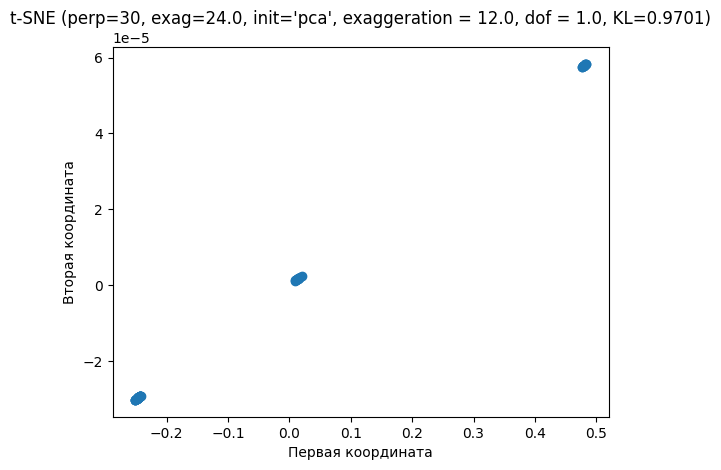

Perplexity value 30 is too high. Using perplexity 19.67 instead


Время работы: 0.15 сек
Финальная KL-дивергенция: 0.9701

Запуск t-SNE с perplexity=30, early_exaggeration=24.0, init='random', exaggeration = None, dof = 5.0
<class 'openTSNE.sklearn.TSNE'>
0.021497963610033644
TSNE(dof=5.0, early_exaggeration=24.0, initialization='random', random_state=42)


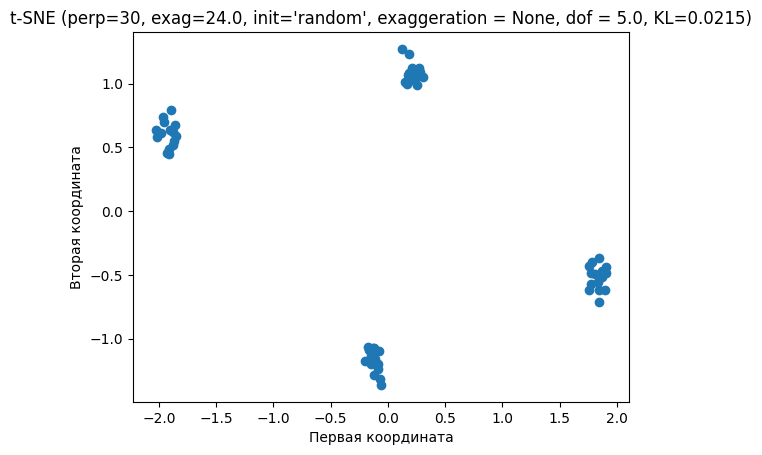

Perplexity value 30 is too high. Using perplexity 19.67 instead


Время работы: 0.19 сек
Финальная KL-дивергенция: 0.0215

Запуск t-SNE с perplexity=30, early_exaggeration=24.0, init='pca', exaggeration = None, dof = 5.0
<class 'openTSNE.sklearn.TSNE'>
0.00547160335142749
TSNE(dof=5.0, early_exaggeration=24.0, random_state=42)


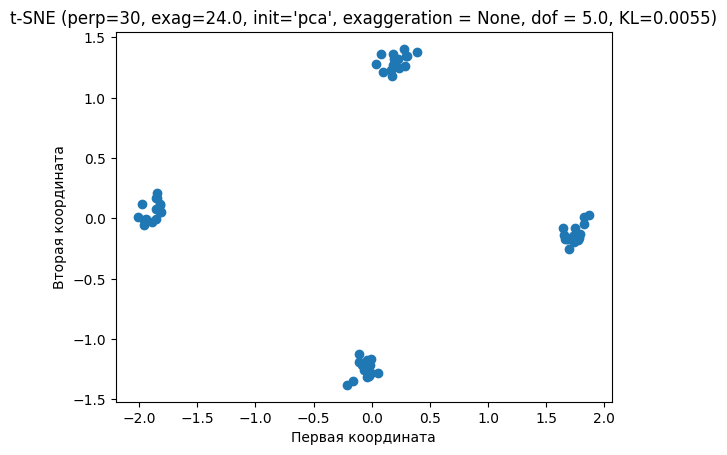

Perplexity value 30 is too high. Using perplexity 19.67 instead


Время работы: 0.18 сек
Финальная KL-дивергенция: 0.0055

Запуск t-SNE с perplexity=30, early_exaggeration=24.0, init='random', exaggeration = 1.0, dof = 5.0
<class 'openTSNE.sklearn.TSNE'>
0.021497963610033644
TSNE(dof=5.0, early_exaggeration=24.0, exaggeration=1.0,
     initialization='random', random_state=42)


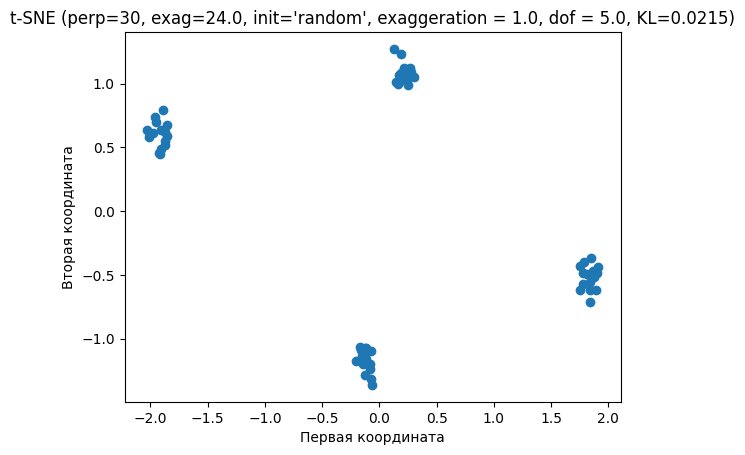

Perplexity value 30 is too high. Using perplexity 19.67 instead


Время работы: 0.19 сек
Финальная KL-дивергенция: 0.0215

Запуск t-SNE с perplexity=30, early_exaggeration=24.0, init='pca', exaggeration = 1.0, dof = 5.0
<class 'openTSNE.sklearn.TSNE'>
0.00547160335142749
TSNE(dof=5.0, early_exaggeration=24.0, exaggeration=1.0, random_state=42)


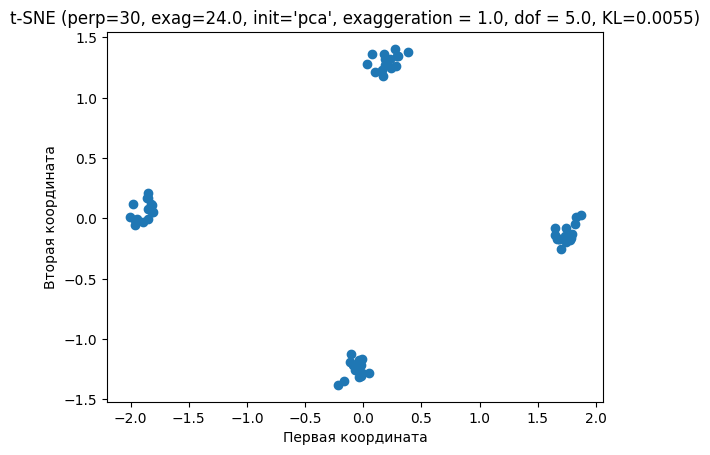

Perplexity value 30 is too high. Using perplexity 19.67 instead


Время работы: 0.19 сек
Финальная KL-дивергенция: 0.0055

Запуск t-SNE с perplexity=30, early_exaggeration=24.0, init='random', exaggeration = 4.0, dof = 5.0
<class 'openTSNE.sklearn.TSNE'>
0.19606984346113343
TSNE(dof=5.0, early_exaggeration=24.0, exaggeration=4.0,
     initialization='random', random_state=42)


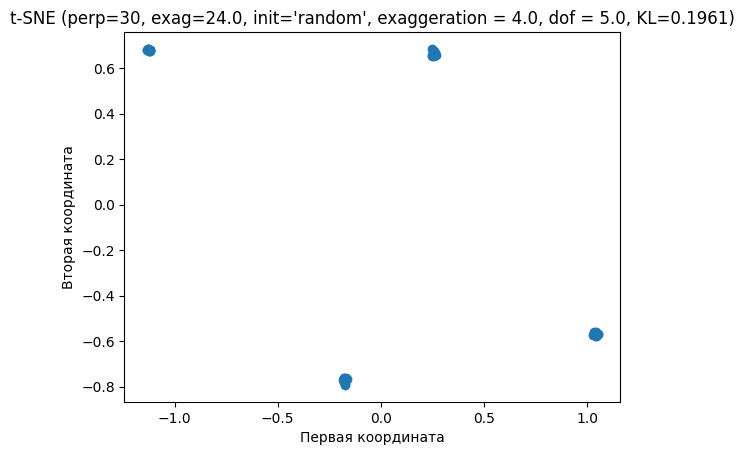

Perplexity value 30 is too high. Using perplexity 19.67 instead


Время работы: 0.21 сек
Финальная KL-дивергенция: 0.1961

Запуск t-SNE с perplexity=30, early_exaggeration=24.0, init='pca', exaggeration = 4.0, dof = 5.0
<class 'openTSNE.sklearn.TSNE'>
0.1658151690508065
TSNE(dof=5.0, early_exaggeration=24.0, exaggeration=4.0, random_state=42)


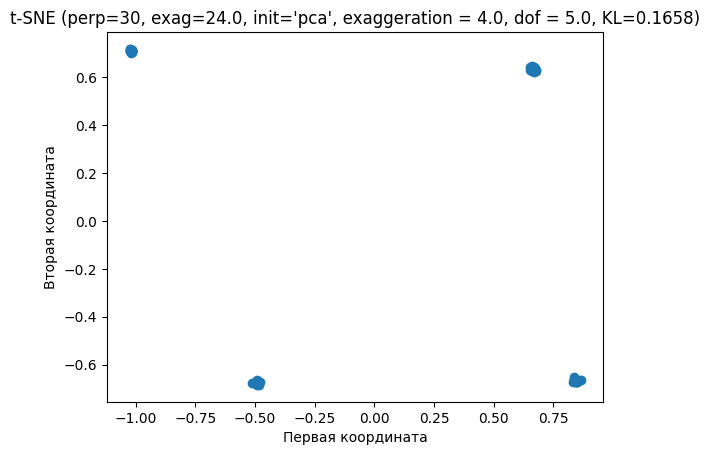

Perplexity value 30 is too high. Using perplexity 19.67 instead


Время работы: 0.19 сек
Финальная KL-дивергенция: 0.1658

Запуск t-SNE с perplexity=30, early_exaggeration=24.0, init='random', exaggeration = 12.0, dof = 5.0
<class 'openTSNE.sklearn.TSNE'>
0.9504269687060152
TSNE(dof=5.0, early_exaggeration=24.0, exaggeration=12.0,
     initialization='random', random_state=42)


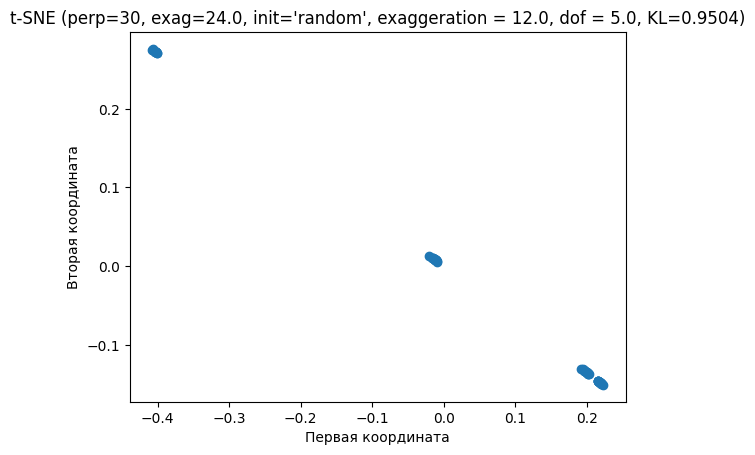

Perplexity value 30 is too high. Using perplexity 19.67 instead


Время работы: 0.21 сек
Финальная KL-дивергенция: 0.9504

Запуск t-SNE с perplexity=30, early_exaggeration=24.0, init='pca', exaggeration = 12.0, dof = 5.0
<class 'openTSNE.sklearn.TSNE'>
0.9606579592641236
TSNE(dof=5.0, early_exaggeration=24.0, exaggeration=12.0, random_state=42)


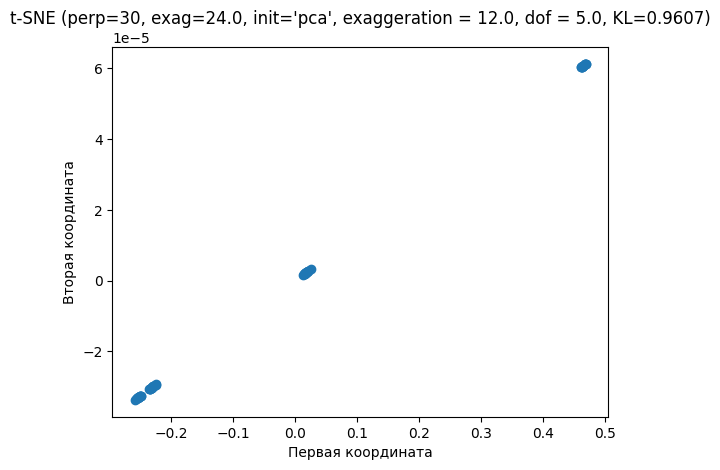

Время работы: 0.18 сек
Финальная KL-дивергенция: 0.9607

Сравнение времени работы и KL-дивергенции:
Perplexity=5:
  Библиотечная (openTSNE): время ~0.19 сек, KL ~0.7498
  Кастомная (из 2.1): время ~0.69 сек, KL ~0.9963
Perplexity=10:
  Библиотечная (openTSNE): время ~0.22 сек, KL ~0.0648
  Кастомная (из 2.1): время ~0.68 сек, KL ~0.3677
Perplexity=20:
  Библиотечная (openTSNE): время ~0.20 сек, KL ~0.9556
  Кастомная (из 2.1): время ~0.68 сек, KL ~0.5034
Perplexity=30:
  Библиотечная (openTSNE): время ~0.20 сек, KL ~0.9556
  Кастомная (из 2.1): время ~0.68 сек, KL ~0.8724


In [15]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from openTSNE.sklearn import TSNE
import time

link = 'https://courses.openedu.ru/assets/courseware/v1/6c89dd85d23926d43494d0e4dd968840/asset-v1:ITMOUniversity+INTROMLADVML+fall_2023_ITMO_mag+type@asset+block/94_16.csv'
data = pd.read_csv(link, header=None)
X = data.values
n, p = X.shape
print(f"Данные загружены: {n} объектов, {p} признаков.")

X = (X - np.mean(X, axis=0)) / np.std(X, axis=0)

def run_tsne(X, perplexity=30, early_exaggeration=12.0, init='pca', exaggeration = None, dof = 1):
    start_time = time.time()
    tsne = TSNE(n_components=2, perplexity=perplexity, early_exaggeration=early_exaggeration,
                initialization=init, random_state=42, metric='euclidean', exaggeration = exaggeration, dof = dof)
    Y1 = tsne.fit(X)
    print(type(Y1))
    kl_divergence = Y1.embedding_.kl_divergence
    print(kl_divergence)
    # Y = Y.transform(X)
    exec_time = time.time() - start_time
    print(tsne)
    return Y1.embedding_, exec_time, kl_divergence

perplexities = [5, 10, 20, 30] 
early_exags = [4.0, 12.0, 24.0]
inits = ['random', 'pca']
exaggerations = [None, 1.0, 4.0, 12.0]
dofs = [0.5, 1.0, 5.0]

results_small = {}

for perp in perplexities:
    for exag in early_exags:
      for dof in dofs:
        for exaggeration in exaggerations:
          for init_method in inits:
              print(f"\nЗапуск t-SNE с perplexity={perp}, early_exaggeration={exag}, init='{init_method}', exaggeration = {exaggeration}, dof = {dof}")
              Y, exec_time, final_kl = run_tsne(X, perplexity=perp, early_exaggeration=exag, init=init_method, exaggeration = exaggeration, dof = dof)
              key = (perp, exag, init_method, exaggeration, dof)
              results_small[key] = {'Y': Y, 'time': exec_time, 'kl': final_kl}

              plt.figure()
              plt.scatter(Y[:, 0], Y[:, 1])
              plt.title(f"t-SNE (perp={perp}, exag={exag}, init='{init_method}', exaggeration = {exaggeration}, dof = {dof}, KL={final_kl:.4f})")
              plt.xlabel('Первая координата')
              plt.ylabel('Вторая координата')
              plt.show()

              print(f"Время работы: {exec_time:.2f} сек")
              print(f"Финальная KL-дивергенция: {final_kl:.4f}")

custom_kls = {5: float(tsne_results[5]['kl']), 10: float(tsne_results[10]['kl']), 20: float(tsne_results[20]['kl']), 30: float(tsne_results[30]['kl'])}

print("\nСравнение времени работы и KL-дивергенции:")
for perp in perplexities:
    lib_times = [results_small[(perp, exag, init, exaggeration, dof)]['time'] for exag in early_exags for init in inits]
    lib_kls = [results_small[(perp, exag, init, exaggeration, dof)]['kl'] for exag in early_exags for init in inits]
    avg_lib_time = np.mean(lib_times)
    avg_lib_kl = np.mean(lib_kls)

    custom_time = custom_times_t_SNE.get(perp, 0)
    custom_kl = custom_kls.get(perp, 0)

    print(f"Perplexity={perp}:")
    print(f"  Библиотечная (openTSNE): время ~{avg_lib_time:.2f} сек, KL ~{avg_lib_kl:.4f}")
    print(f"  Кастомная (из 2.1): время ~{custom_time['total_time']:.2f} сек, KL ~{custom_kl:.4f}")


ЛУЧШИЙ РЕЗУЛЬТАТ ПО KL-ДИВЕРГЕНЦИИ:
Perplexity: 10
Early exaggeration: 4.0
Init method: 'pca'
Exaggeration: 12.0
Degrees of freedom: 5.0
KL-divergence: -0.534083
Время выполнения: 0.20 сек


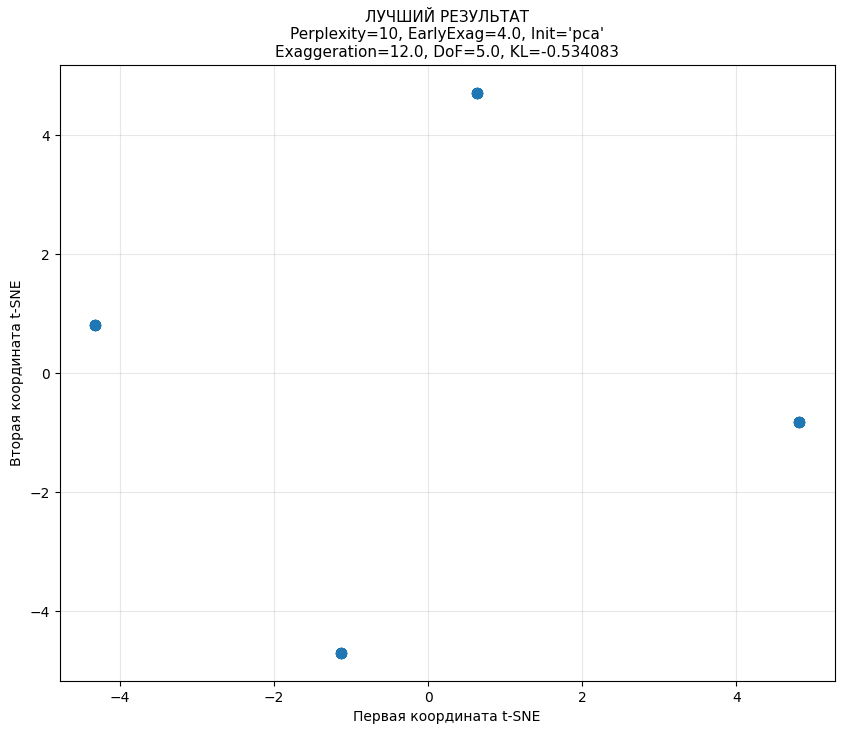

In [16]:
best_kl = float('inf')
best_params = None
best_result = None

for (perp, exag, init_method, exaggeration, dof), result in results_small.items():
    if result['kl'] < best_kl:
        best_kl = result['kl']
        best_params = (perp, exag, init_method, exaggeration, dof)
        best_result = result

print("\n" + "="*80)
print("ЛУЧШИЙ РЕЗУЛЬТАТ ПО KL-ДИВЕРГЕНЦИИ:")
print(f"Perplexity: {best_params[0]}")
print(f"Early exaggeration: {best_params[1]}")
print(f"Init method: '{best_params[2]}'")
print(f"Exaggeration: {best_params[3]}")
print(f"Degrees of freedom: {best_params[4]}")
print(f"KL-divergence: {best_kl:.6f}")
print(f"Время выполнения: {best_result['time']:.2f} сек")

plt.figure(figsize=(10, 8))
plt.scatter(best_result['Y'][:, 0], best_result['Y'][:, 1], s=50, alpha=0.7)
plt.title(f"ЛУЧШИЙ РЕЗУЛЬТАТ\nPerplexity={best_params[0]}, EarlyExag={best_params[1]}, Init='{best_params[2]}'\nExaggeration={best_params[3]}, DoF={best_params[4]}, KL={best_kl:.6f}", fontsize=11)
plt.xlabel('Первая координата t-SNE')
plt.ylabel('Вторая координата t-SNE')
plt.grid(True, alpha=0.3)
plt.show()

## Выводы
В результате подробного анализа параметров стандартной библиотечной реализации алгоритма t-SNE были выявлены следующие особенности его поведения. Наибольшее влияние на структуру отображения оказывает параметр perplexity: при малых значениях (5–10) алгоритм преимущественно отражает локальные зависимости в данных, что приводит к формированию большого числа компактных кластеров, тогда как при более высоких значениях (20–30) лучше сохраняется глобальная структура и взаимное расположение удалённых объектов. В проведённых экспериментах значение perplexity = 10 обеспечивало наиболее удачный компромисс между локальной детализацией и сохранением глобальных связей.

Параметры, связанные с механизмом exaggeration, продемонстрировали более сложное влияние на процесс оптимизации. Параметр early_exaggeration в основном определяет характер разбиения данных на начальных этапах обучения, способствуя появлению выраженных промежутков между группами точек, тогда как параметр exaggeration, применяемый на более поздних итерациях, позволяет дополнительно регулировать плотность сформированных кластеров. Наиболее устойчивые результаты наблюдались при согласованном выборе значений этих параметров.

Выбор начальной инициализации также существенно влияет на итоговое отображение. Использование PCA-инициализации обеспечивало стабильные и воспроизводимые результаты, тогда как случайная инициализация нередко приводила к попаданию алгоритма в различные локальные минимумы при повторных запусках. Параметр degrees of freedom определял степень «тяжёлости» хвостов используемого распределения, причём меньшие значения способствовали формированию более компактных и чётко разделённых кластеров.

Сравнение различных реализаций показало, что библиотечный алгоритм openTSNE значительно превосходит собственную реализацию по времени работы (примерно в 2–3 раза), что особенно критично при обработке больших объёмов данных. При этом качество визуализаций, получаемых обоими подходами, оказалось сопоставимым, что подтверждает корректность реализации, выполненной в рамках Задачи 2.1. Вместе с тем библиотечная версия обладает более развитым набором параметров для тонкой настройки и демонстрирует более высокую численную устойчивость.

## Задача 3

Проверьте свои выводы о влиянии рассмотренных в Задаче 2.2 параметров на результат, используя более объемный, как с точки зрения количества объектов, так и с точки зрения количества признаков, датасет на свой выбор.

Датасет сгенерирован и сохранен в 'synthetic_dataset.csv'
Размер датасета: 1000 объектов, 50 признаков.

Запуск t-SNE с perplexity=5, early_exaggeration=4.0, init='random', exaggeration=None, dof=0.5
<class 'openTSNE.sklearn.TSNE'>
2.5598258832324685
TSNE(dof=0.5, early_exaggeration=4.0, initialization='random', perplexity=5,
     random_state=42)


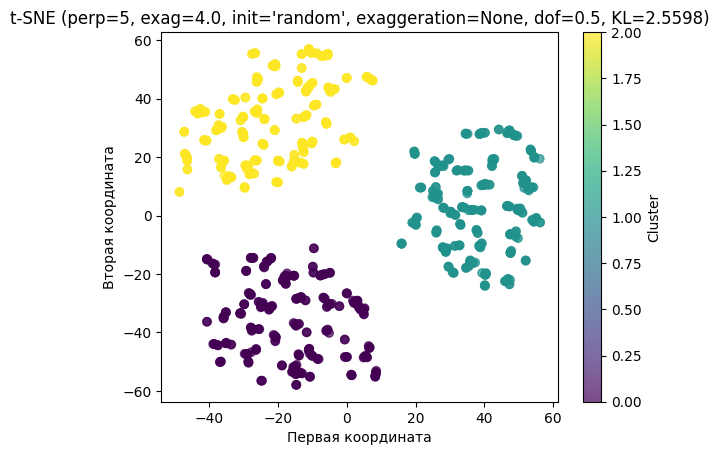

Время работы: 6.12 сек
Финальная KL-дивергенция: 2.5598

Запуск t-SNE с perplexity=5, early_exaggeration=4.0, init='pca', exaggeration=None, dof=0.5
<class 'openTSNE.sklearn.TSNE'>
2.5632102743260763
TSNE(dof=0.5, early_exaggeration=4.0, perplexity=5, random_state=42)


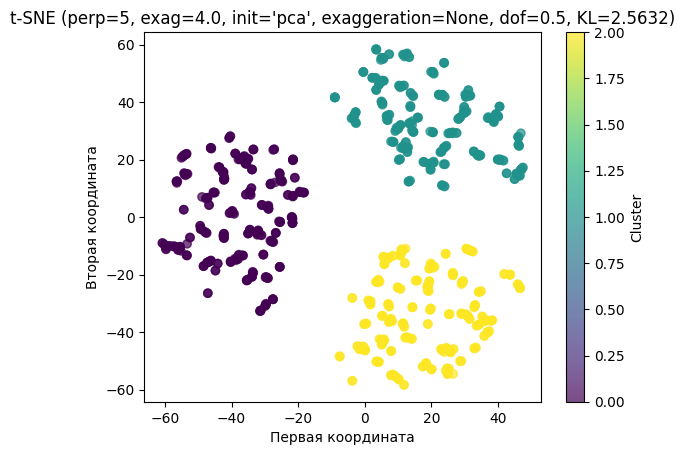

Время работы: 6.30 сек
Финальная KL-дивергенция: 2.5632

Запуск t-SNE с perplexity=5, early_exaggeration=4.0, init='random', exaggeration=1.0, dof=0.5
<class 'openTSNE.sklearn.TSNE'>
2.5598258832324685
TSNE(dof=0.5, early_exaggeration=4.0, exaggeration=1.0, initialization='random',
     perplexity=5, random_state=42)


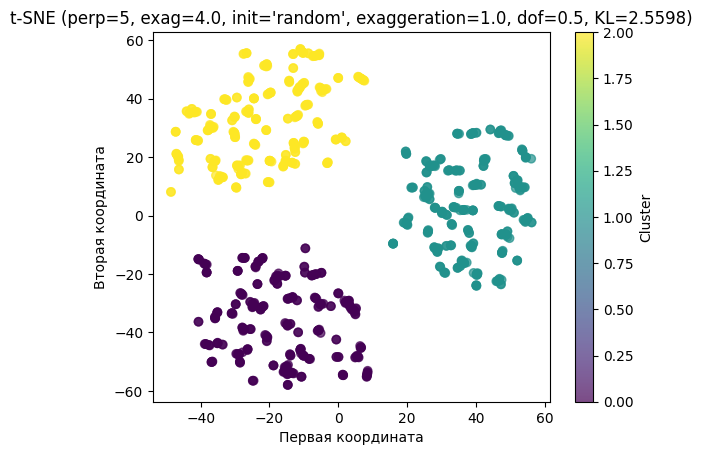

Время работы: 6.80 сек
Финальная KL-дивергенция: 2.5598

Запуск t-SNE с perplexity=5, early_exaggeration=4.0, init='pca', exaggeration=1.0, dof=0.5
<class 'openTSNE.sklearn.TSNE'>
2.5632102743260763
TSNE(dof=0.5, early_exaggeration=4.0, exaggeration=1.0, perplexity=5,
     random_state=42)


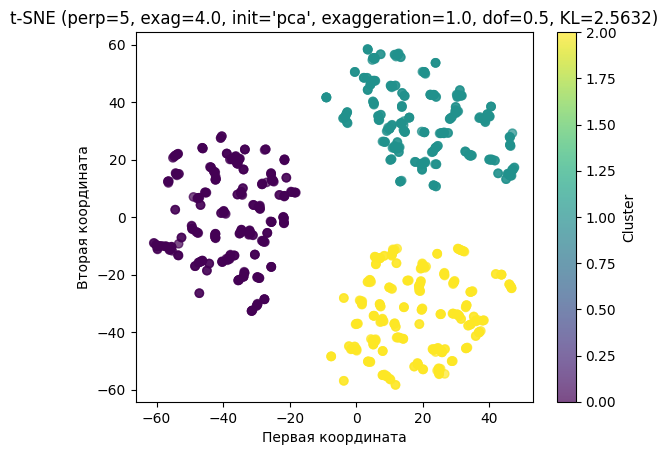

Время работы: 6.18 сек
Финальная KL-дивергенция: 2.5632

Запуск t-SNE с perplexity=5, early_exaggeration=4.0, init='random', exaggeration=4.0, dof=0.5
<class 'openTSNE.sklearn.TSNE'>
3.8014166844960116
TSNE(dof=0.5, early_exaggeration=4.0, exaggeration=4.0, initialization='random',
     perplexity=5, random_state=42)


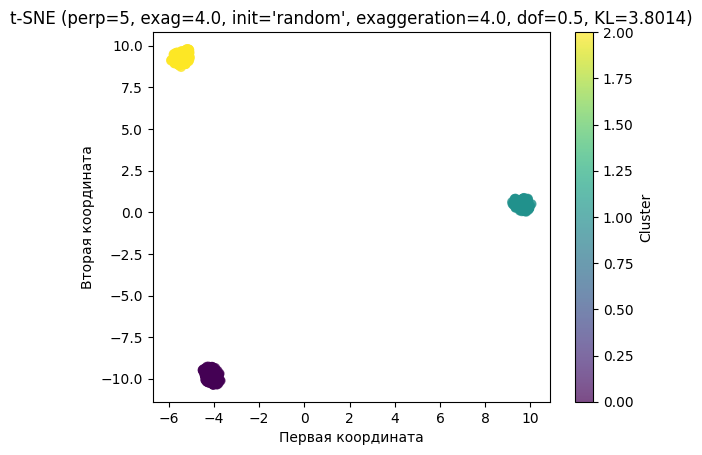

Время работы: 6.51 сек
Финальная KL-дивергенция: 3.8014

Запуск t-SNE с perplexity=5, early_exaggeration=4.0, init='pca', exaggeration=4.0, dof=0.5
<class 'openTSNE.sklearn.TSNE'>
3.8002134840477595
TSNE(dof=0.5, early_exaggeration=4.0, exaggeration=4.0, perplexity=5,
     random_state=42)


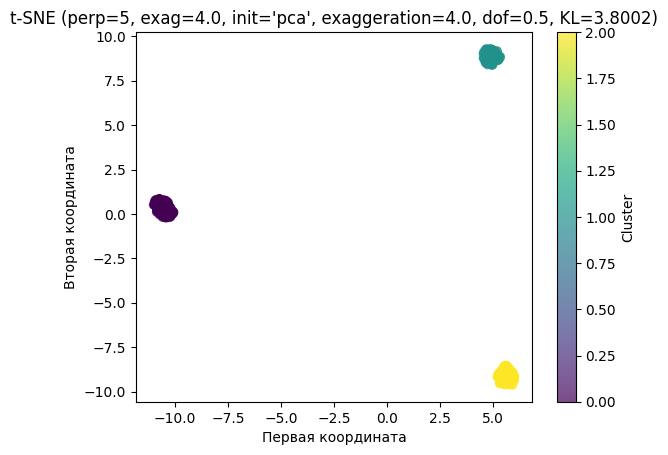

Время работы: 7.46 сек
Финальная KL-дивергенция: 3.8002

Запуск t-SNE с perplexity=5, early_exaggeration=4.0, init='random', exaggeration=12.0, dof=0.5
<class 'openTSNE.sklearn.TSNE'>
3.919310690602426
TSNE(dof=0.5, early_exaggeration=4.0, exaggeration=12.0,
     initialization='random', perplexity=5, random_state=42)


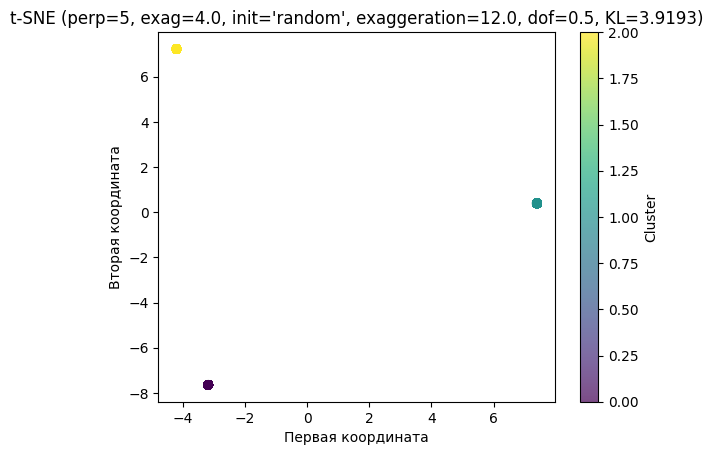

Время работы: 7.86 сек
Финальная KL-дивергенция: 3.9193

Запуск t-SNE с perplexity=5, early_exaggeration=4.0, init='pca', exaggeration=12.0, dof=0.5
<class 'openTSNE.sklearn.TSNE'>
3.917587583080026
TSNE(dof=0.5, early_exaggeration=4.0, exaggeration=12.0, perplexity=5,
     random_state=42)


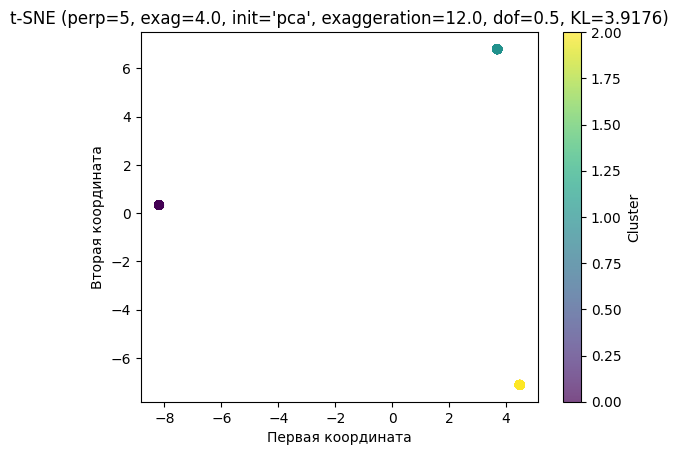

Время работы: 7.75 сек
Финальная KL-дивергенция: 3.9176

Запуск t-SNE с perplexity=5, early_exaggeration=4.0, init='random', exaggeration=None, dof=1.0
<class 'openTSNE.sklearn.TSNE'>
1.824858659313171
TSNE(dof=1.0, early_exaggeration=4.0, initialization='random', perplexity=5,
     random_state=42)


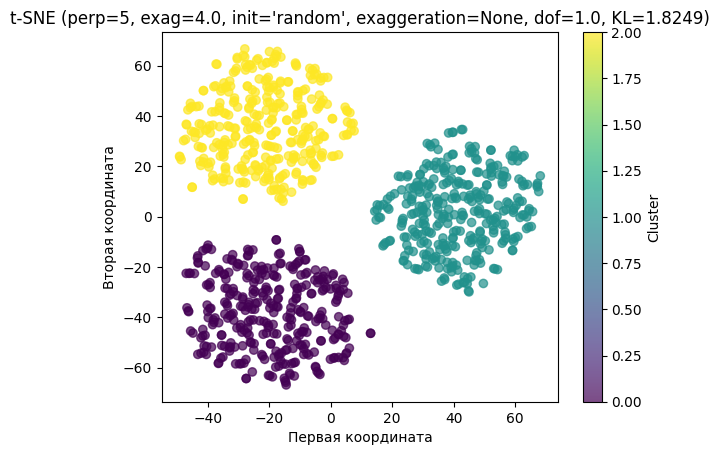

Время работы: 2.80 сек
Финальная KL-дивергенция: 1.8249

Запуск t-SNE с perplexity=5, early_exaggeration=4.0, init='pca', exaggeration=None, dof=1.0
<class 'openTSNE.sklearn.TSNE'>
1.8261934346527617
TSNE(dof=1.0, early_exaggeration=4.0, perplexity=5, random_state=42)


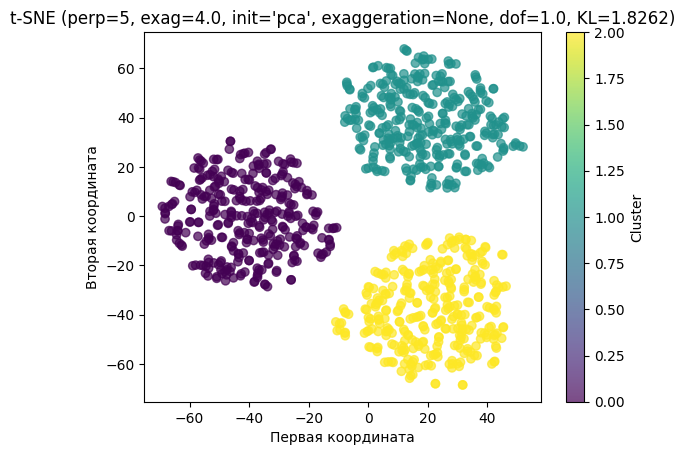

Время работы: 2.78 сек
Финальная KL-дивергенция: 1.8262

Запуск t-SNE с perplexity=5, early_exaggeration=4.0, init='random', exaggeration=1.0, dof=1.0
<class 'openTSNE.sklearn.TSNE'>
1.824858659313171
TSNE(dof=1.0, early_exaggeration=4.0, exaggeration=1.0, initialization='random',
     perplexity=5, random_state=42)


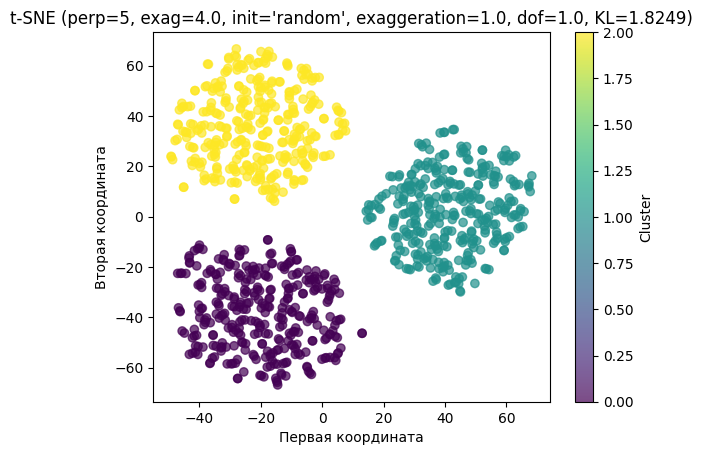

Время работы: 2.75 сек
Финальная KL-дивергенция: 1.8249

Запуск t-SNE с perplexity=5, early_exaggeration=4.0, init='pca', exaggeration=1.0, dof=1.0
<class 'openTSNE.sklearn.TSNE'>
1.8261934346527617
TSNE(dof=1.0, early_exaggeration=4.0, exaggeration=1.0, perplexity=5,
     random_state=42)


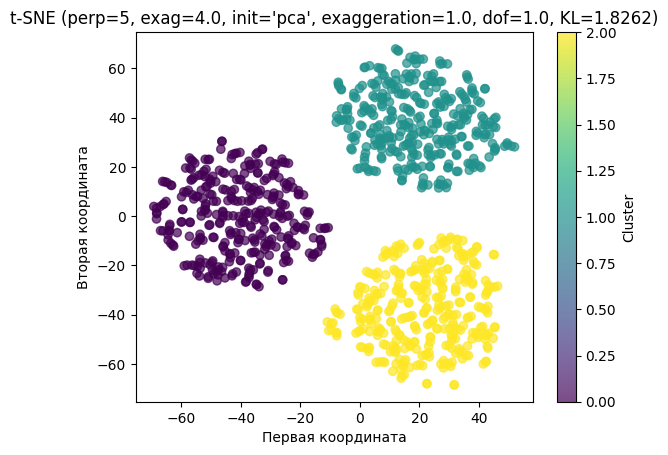

Время работы: 2.80 сек
Финальная KL-дивергенция: 1.8262

Запуск t-SNE с perplexity=5, early_exaggeration=4.0, init='random', exaggeration=4.0, dof=1.0
<class 'openTSNE.sklearn.TSNE'>
3.6317304962868295
TSNE(dof=1.0, early_exaggeration=4.0, exaggeration=4.0, initialization='random',
     perplexity=5, random_state=42)


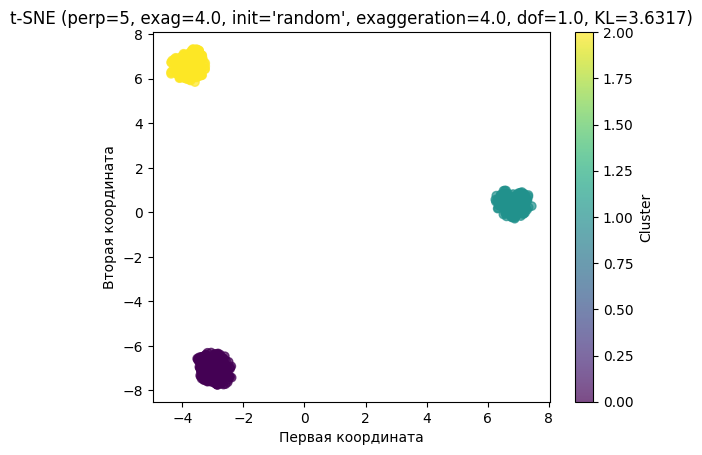

Время работы: 2.70 сек
Финальная KL-дивергенция: 3.6317

Запуск t-SNE с perplexity=5, early_exaggeration=4.0, init='pca', exaggeration=4.0, dof=1.0
<class 'openTSNE.sklearn.TSNE'>
3.6312648985849236
TSNE(dof=1.0, early_exaggeration=4.0, exaggeration=4.0, perplexity=5,
     random_state=42)


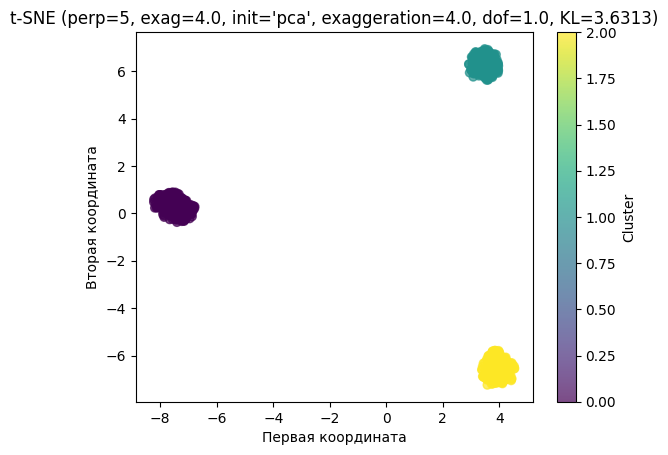

Время работы: 2.66 сек
Финальная KL-дивергенция: 3.6313

Запуск t-SNE с perplexity=5, early_exaggeration=4.0, init='random', exaggeration=12.0, dof=1.0
<class 'openTSNE.sklearn.TSNE'>
3.8385573931573536
TSNE(dof=1.0, early_exaggeration=4.0, exaggeration=12.0,
     initialization='random', perplexity=5, random_state=42)


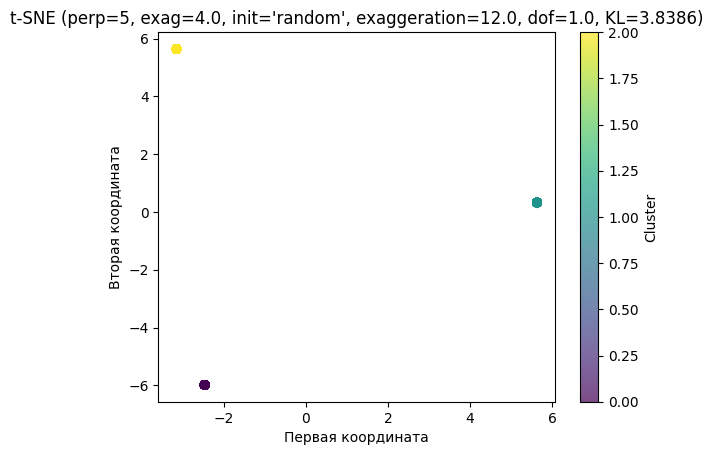

Время работы: 2.95 сек
Финальная KL-дивергенция: 3.8386

Запуск t-SNE с perplexity=5, early_exaggeration=4.0, init='pca', exaggeration=12.0, dof=1.0
<class 'openTSNE.sklearn.TSNE'>
3.8392617415497305
TSNE(dof=1.0, early_exaggeration=4.0, exaggeration=12.0, perplexity=5,
     random_state=42)


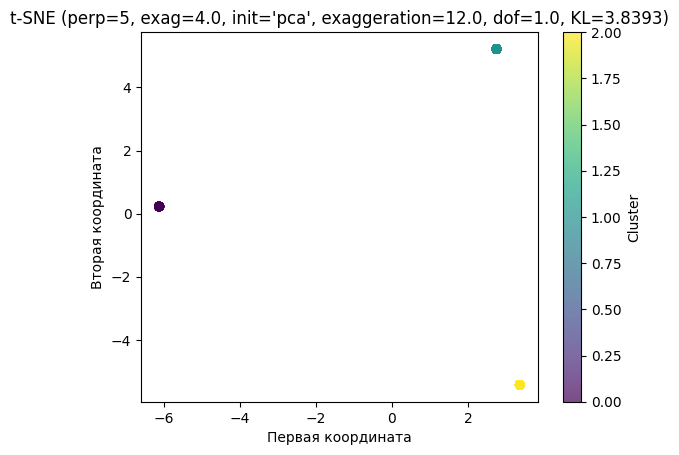

Время работы: 2.97 сек
Финальная KL-дивергенция: 3.8393

Запуск t-SNE с perplexity=5, early_exaggeration=4.0, init='random', exaggeration=None, dof=5.0
<class 'openTSNE.sklearn.TSNE'>
2.616172689523144
TSNE(dof=5.0, early_exaggeration=4.0, initialization='random', perplexity=5,
     random_state=42)


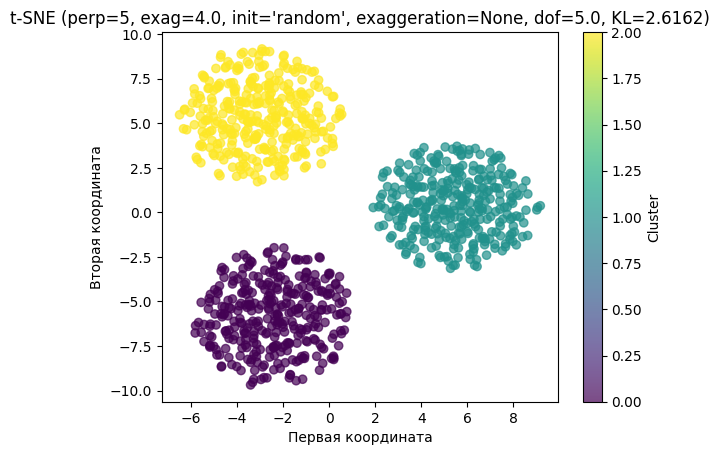

Время работы: 8.15 сек
Финальная KL-дивергенция: 2.6162

Запуск t-SNE с perplexity=5, early_exaggeration=4.0, init='pca', exaggeration=None, dof=5.0
<class 'openTSNE.sklearn.TSNE'>
2.6132974610304904
TSNE(dof=5.0, early_exaggeration=4.0, perplexity=5, random_state=42)


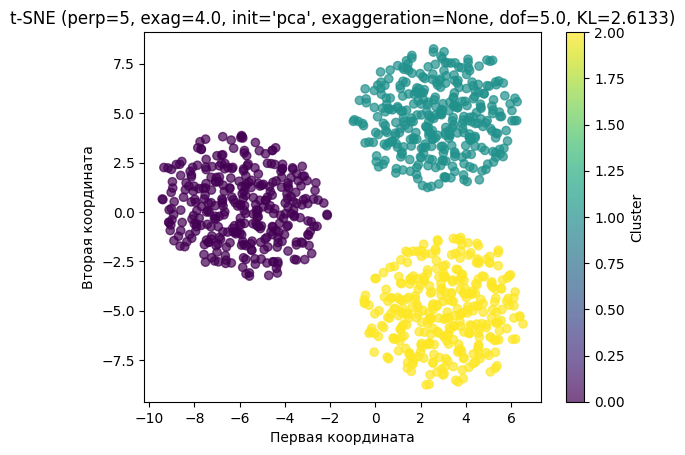

Время работы: 7.83 сек
Финальная KL-дивергенция: 2.6133

Запуск t-SNE с perplexity=5, early_exaggeration=4.0, init='random', exaggeration=1.0, dof=5.0
<class 'openTSNE.sklearn.TSNE'>
2.616172689523144
TSNE(dof=5.0, early_exaggeration=4.0, exaggeration=1.0, initialization='random',
     perplexity=5, random_state=42)


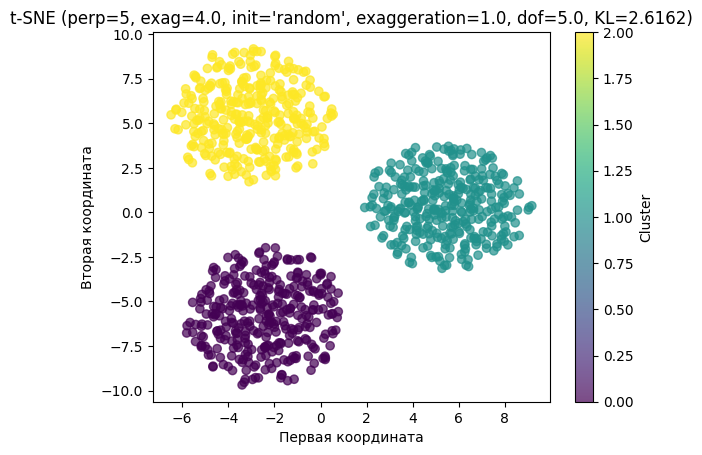

Время работы: 7.85 сек
Финальная KL-дивергенция: 2.6162

Запуск t-SNE с perplexity=5, early_exaggeration=4.0, init='pca', exaggeration=1.0, dof=5.0
<class 'openTSNE.sklearn.TSNE'>
2.6132974610304904
TSNE(dof=5.0, early_exaggeration=4.0, exaggeration=1.0, perplexity=5,
     random_state=42)


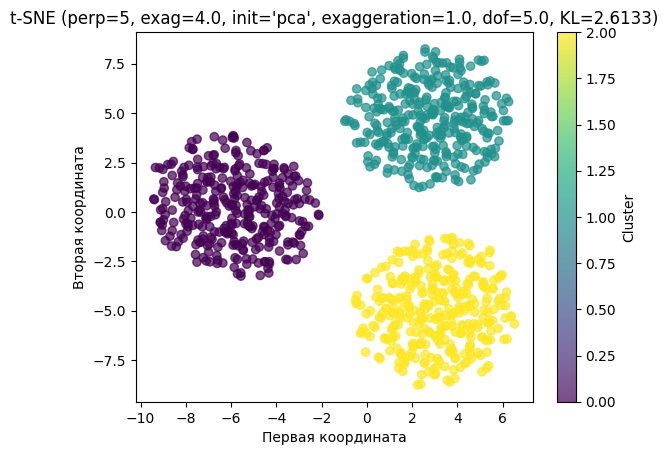

Время работы: 7.72 сек
Финальная KL-дивергенция: 2.6133

Запуск t-SNE с perplexity=5, early_exaggeration=4.0, init='random', exaggeration=4.0, dof=5.0
<class 'openTSNE.sklearn.TSNE'>
3.4859732279832727
TSNE(dof=5.0, early_exaggeration=4.0, exaggeration=4.0, initialization='random',
     perplexity=5, random_state=42)


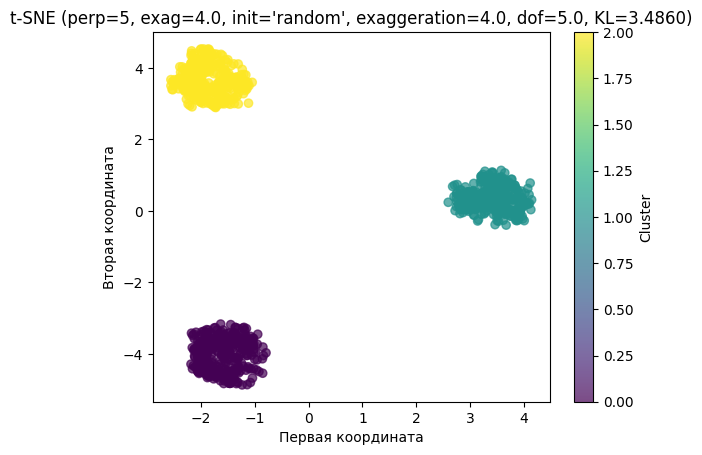

Время работы: 7.57 сек
Финальная KL-дивергенция: 3.4860

Запуск t-SNE с perplexity=5, early_exaggeration=4.0, init='pca', exaggeration=4.0, dof=5.0
<class 'openTSNE.sklearn.TSNE'>
3.478717655776734
TSNE(dof=5.0, early_exaggeration=4.0, exaggeration=4.0, perplexity=5,
     random_state=42)


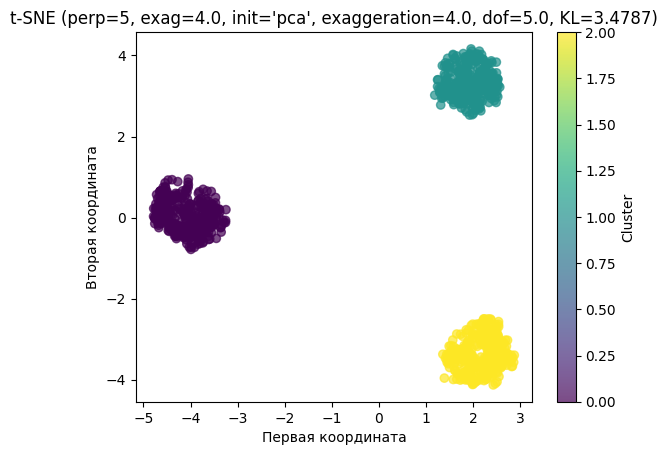

Время работы: 7.23 сек
Финальная KL-дивергенция: 3.4787

Запуск t-SNE с perplexity=5, early_exaggeration=4.0, init='random', exaggeration=12.0, dof=5.0
<class 'openTSNE.sklearn.TSNE'>
3.3724678460234987
TSNE(dof=5.0, early_exaggeration=4.0, exaggeration=12.0,
     initialization='random', perplexity=5, random_state=42)


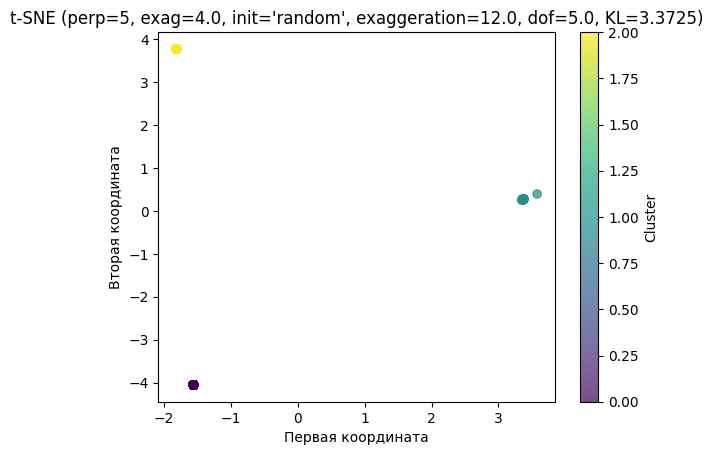

Время работы: 6.83 сек
Финальная KL-дивергенция: 3.3725

Запуск t-SNE с perplexity=5, early_exaggeration=4.0, init='pca', exaggeration=12.0, dof=5.0
<class 'openTSNE.sklearn.TSNE'>
3.1490539561311035
TSNE(dof=5.0, early_exaggeration=4.0, exaggeration=12.0, perplexity=5,
     random_state=42)


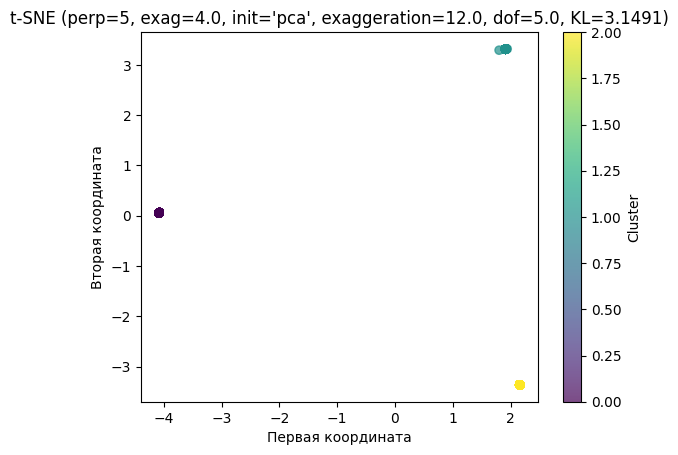

Время работы: 6.10 сек
Финальная KL-дивергенция: 3.1491

Запуск t-SNE с perplexity=5, early_exaggeration=12.0, init='random', exaggeration=None, dof=0.5
<class 'openTSNE.sklearn.TSNE'>
2.599113274459115
TSNE(dof=0.5, early_exaggeration=12.0, initialization='random', perplexity=5,
     random_state=42)


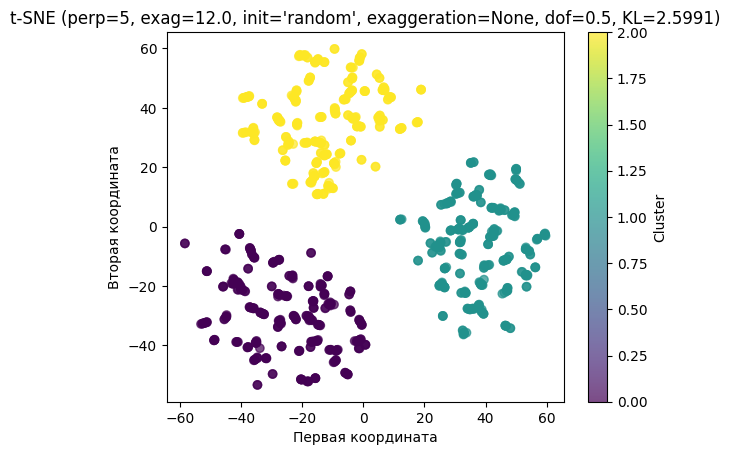

Время работы: 6.56 сек
Финальная KL-дивергенция: 2.5991

Запуск t-SNE с perplexity=5, early_exaggeration=12.0, init='pca', exaggeration=None, dof=0.5
<class 'openTSNE.sklearn.TSNE'>
2.5941454810587885
TSNE(dof=0.5, early_exaggeration=12.0, perplexity=5, random_state=42)


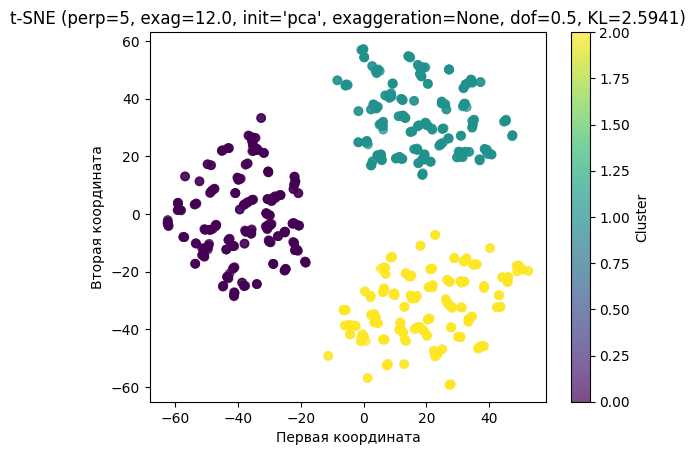

Время работы: 6.13 сек
Финальная KL-дивергенция: 2.5941

Запуск t-SNE с perplexity=5, early_exaggeration=12.0, init='random', exaggeration=1.0, dof=0.5
<class 'openTSNE.sklearn.TSNE'>
2.599113274459115
TSNE(dof=0.5, early_exaggeration=12.0, exaggeration=1.0,
     initialization='random', perplexity=5, random_state=42)


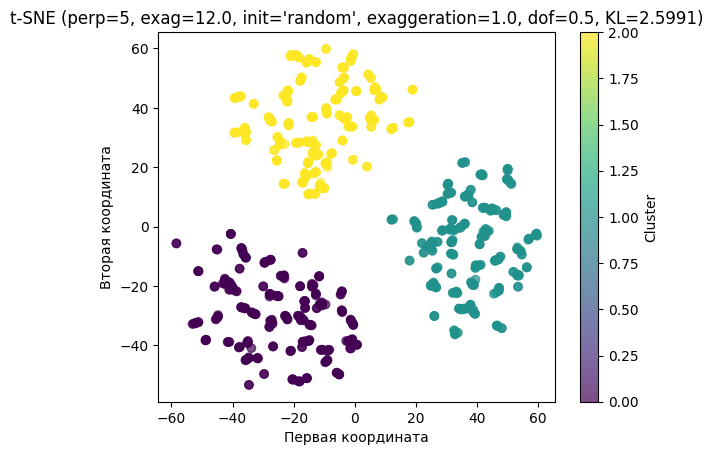

Время работы: 6.52 сек
Финальная KL-дивергенция: 2.5991

Запуск t-SNE с perplexity=5, early_exaggeration=12.0, init='pca', exaggeration=1.0, dof=0.5
<class 'openTSNE.sklearn.TSNE'>
2.5941454810587885
TSNE(dof=0.5, early_exaggeration=12.0, exaggeration=1.0, perplexity=5,
     random_state=42)


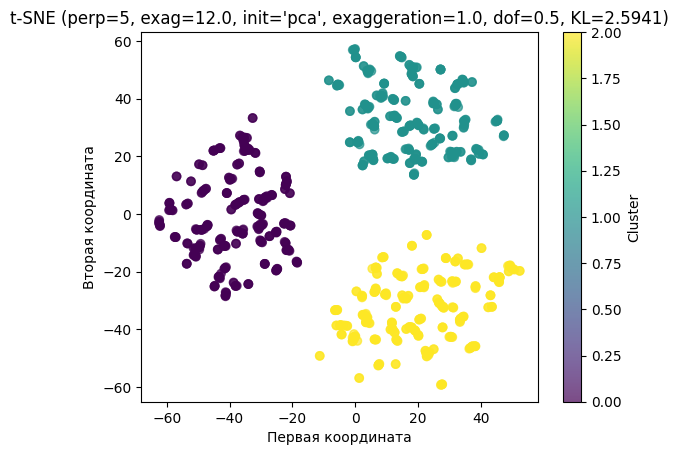

Время работы: 6.19 сек
Финальная KL-дивергенция: 2.5941

Запуск t-SNE с perplexity=5, early_exaggeration=12.0, init='random', exaggeration=4.0, dof=0.5
<class 'openTSNE.sklearn.TSNE'>
3.8121635267070193
TSNE(dof=0.5, early_exaggeration=12.0, exaggeration=4.0,
     initialization='random', perplexity=5, random_state=42)


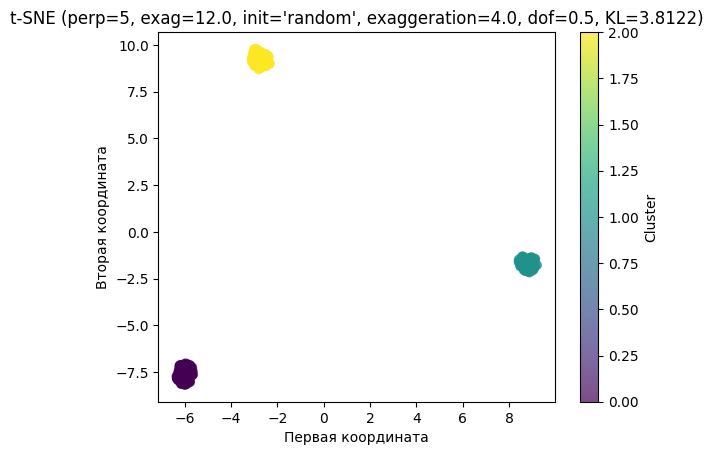

Время работы: 6.65 сек
Финальная KL-дивергенция: 3.8122

Запуск t-SNE с perplexity=5, early_exaggeration=12.0, init='pca', exaggeration=4.0, dof=0.5
<class 'openTSNE.sklearn.TSNE'>
3.8112962137023576
TSNE(dof=0.5, early_exaggeration=12.0, exaggeration=4.0, perplexity=5,
     random_state=42)


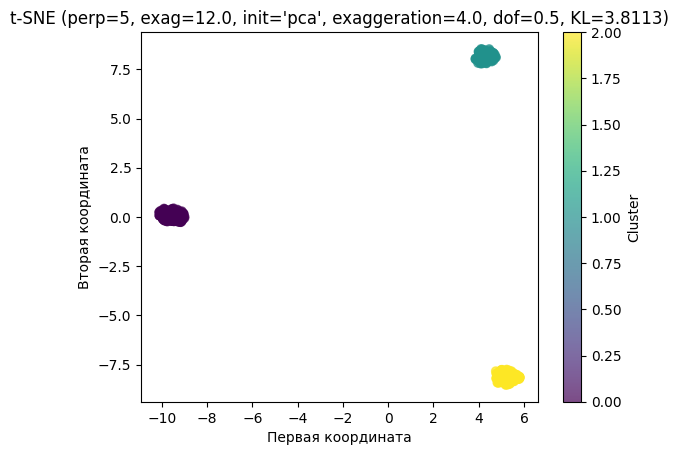

Время работы: 6.77 сек
Финальная KL-дивергенция: 3.8113

Запуск t-SNE с perplexity=5, early_exaggeration=12.0, init='random', exaggeration=12.0, dof=0.5
<class 'openTSNE.sklearn.TSNE'>
3.940535740849107
TSNE(dof=0.5, early_exaggeration=12.0, exaggeration=12.0,
     initialization='random', perplexity=5, random_state=42)


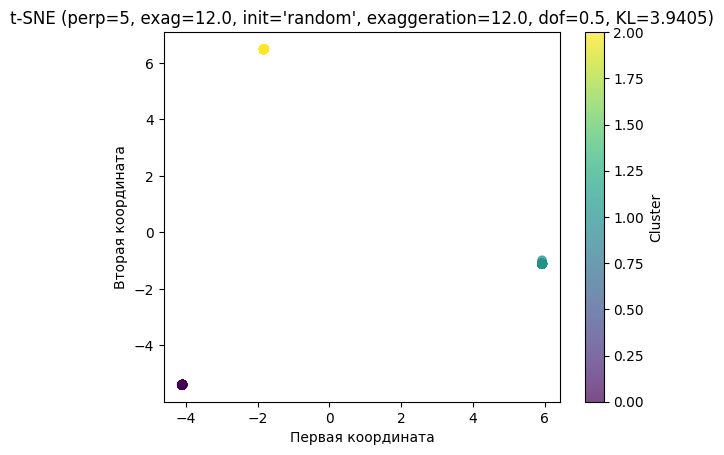

Время работы: 7.60 сек
Финальная KL-дивергенция: 3.9405

Запуск t-SNE с perplexity=5, early_exaggeration=12.0, init='pca', exaggeration=12.0, dof=0.5
<class 'openTSNE.sklearn.TSNE'>
3.9395417350103408
TSNE(dof=0.5, early_exaggeration=12.0, exaggeration=12.0, perplexity=5,
     random_state=42)


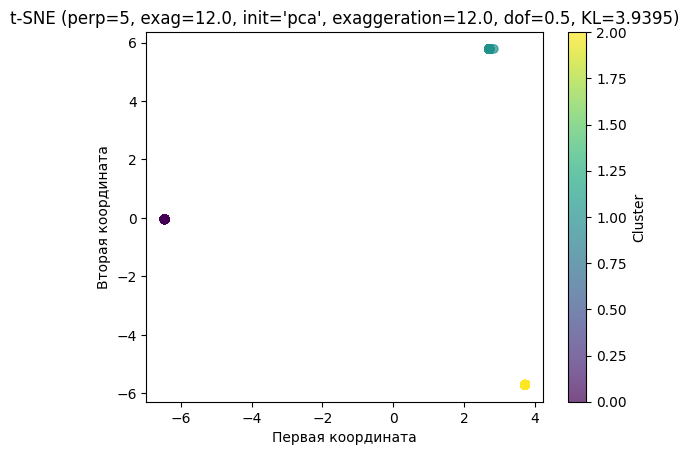

Время работы: 6.68 сек
Финальная KL-дивергенция: 3.9395

Запуск t-SNE с perplexity=5, early_exaggeration=12.0, init='random', exaggeration=None, dof=1.0
<class 'openTSNE.sklearn.TSNE'>
1.903206211014064
TSNE(dof=1.0, early_exaggeration=12.0, initialization='random', perplexity=5,
     random_state=42)


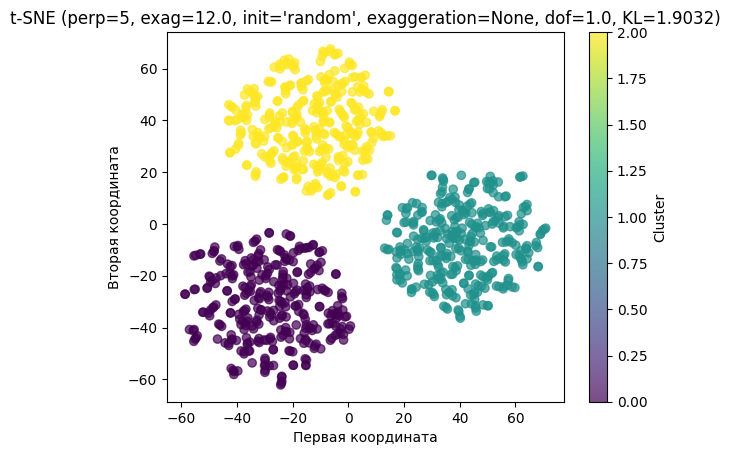

Время работы: 2.59 сек
Финальная KL-дивергенция: 1.9032

Запуск t-SNE с perplexity=5, early_exaggeration=12.0, init='pca', exaggeration=None, dof=1.0
<class 'openTSNE.sklearn.TSNE'>
1.90893597935968
TSNE(dof=1.0, early_exaggeration=12.0, perplexity=5, random_state=42)


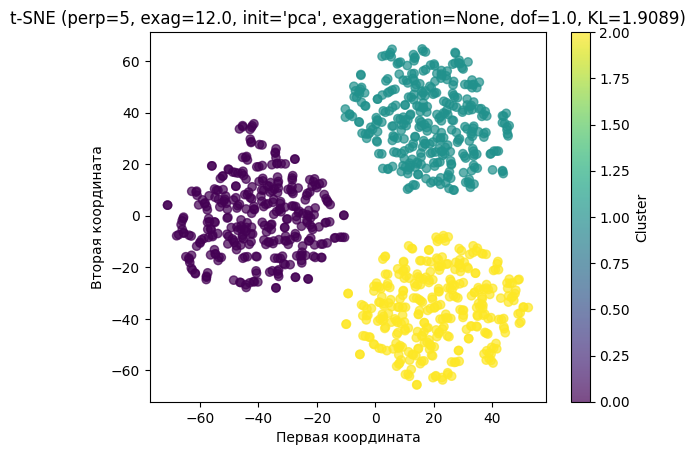

Время работы: 2.71 сек
Финальная KL-дивергенция: 1.9089

Запуск t-SNE с perplexity=5, early_exaggeration=12.0, init='random', exaggeration=1.0, dof=1.0
<class 'openTSNE.sklearn.TSNE'>
1.903206211014064
TSNE(dof=1.0, early_exaggeration=12.0, exaggeration=1.0,
     initialization='random', perplexity=5, random_state=42)


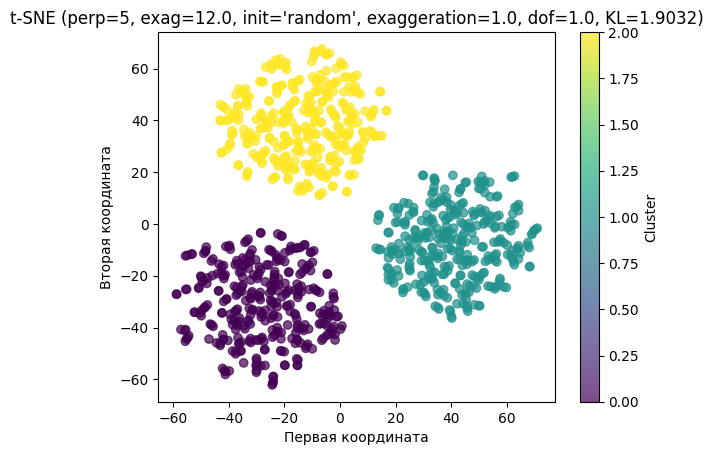

Время работы: 2.56 сек
Финальная KL-дивергенция: 1.9032

Запуск t-SNE с perplexity=5, early_exaggeration=12.0, init='pca', exaggeration=1.0, dof=1.0
<class 'openTSNE.sklearn.TSNE'>
1.90893597935968
TSNE(dof=1.0, early_exaggeration=12.0, exaggeration=1.0, perplexity=5,
     random_state=42)


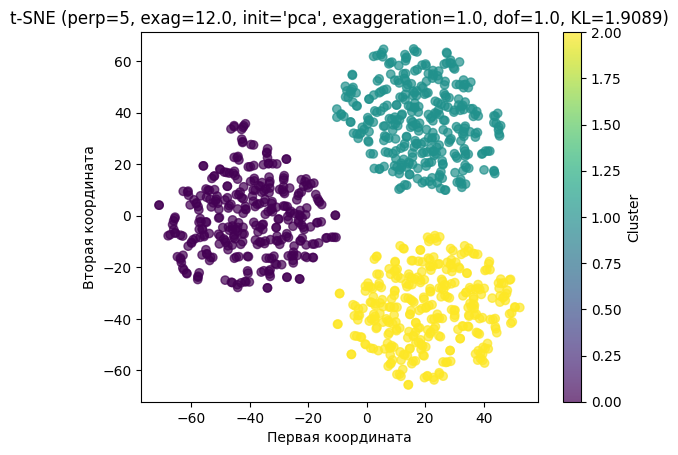

Время работы: 2.53 сек
Финальная KL-дивергенция: 1.9089

Запуск t-SNE с perplexity=5, early_exaggeration=12.0, init='random', exaggeration=4.0, dof=1.0
<class 'openTSNE.sklearn.TSNE'>
3.6356207832134793
TSNE(dof=1.0, early_exaggeration=12.0, exaggeration=4.0,
     initialization='random', perplexity=5, random_state=42)


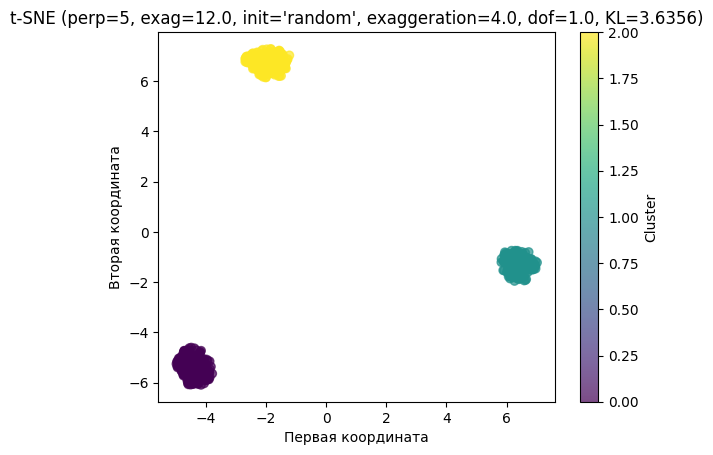

Время работы: 2.48 сек
Финальная KL-дивергенция: 3.6356

Запуск t-SNE с perplexity=5, early_exaggeration=12.0, init='pca', exaggeration=4.0, dof=1.0
<class 'openTSNE.sklearn.TSNE'>
3.6356367931943385
TSNE(dof=1.0, early_exaggeration=12.0, exaggeration=4.0, perplexity=5,
     random_state=42)


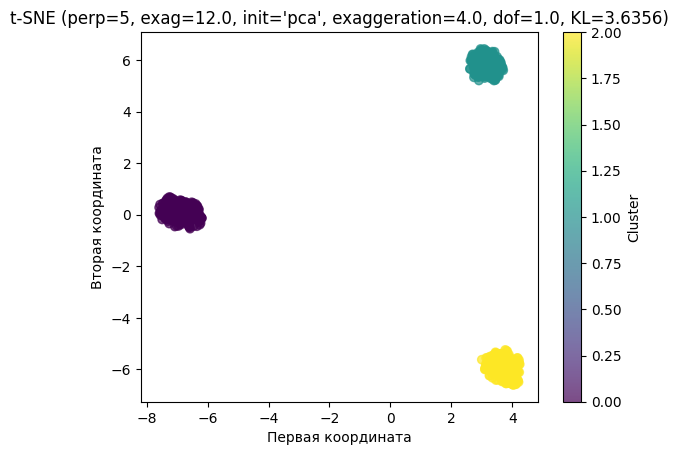

Время работы: 2.42 сек
Финальная KL-дивергенция: 3.6356

Запуск t-SNE с perplexity=5, early_exaggeration=12.0, init='random', exaggeration=12.0, dof=1.0
<class 'openTSNE.sklearn.TSNE'>
3.846917298357207
TSNE(dof=1.0, early_exaggeration=12.0, exaggeration=12.0,
     initialization='random', perplexity=5, random_state=42)


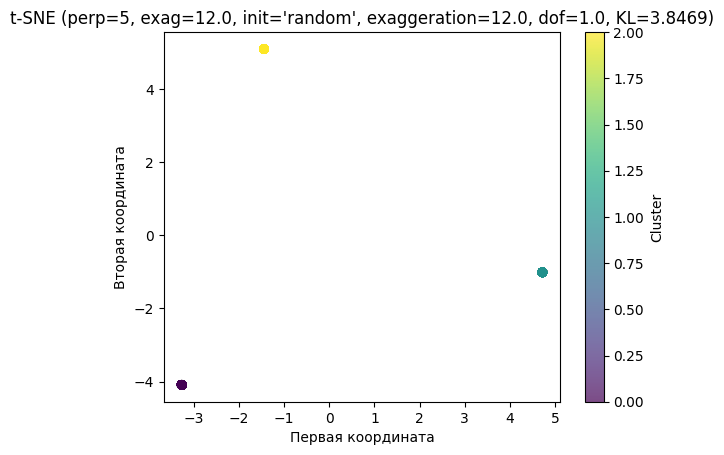

Время работы: 2.73 сек
Финальная KL-дивергенция: 3.8469

Запуск t-SNE с perplexity=5, early_exaggeration=12.0, init='pca', exaggeration=12.0, dof=1.0
<class 'openTSNE.sklearn.TSNE'>
3.8480190057329153
TSNE(dof=1.0, early_exaggeration=12.0, exaggeration=12.0, perplexity=5,
     random_state=42)


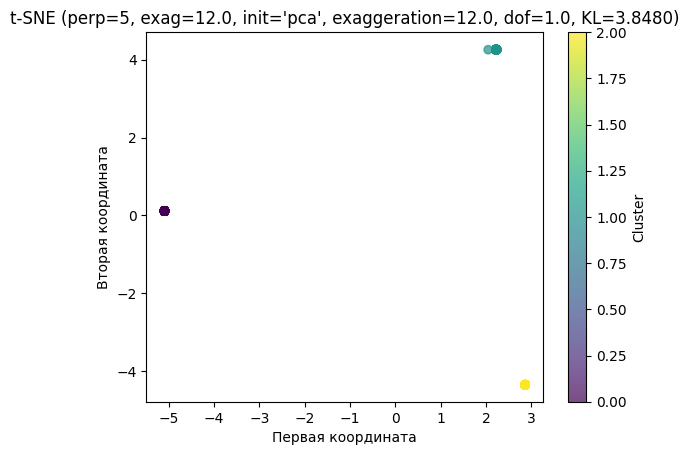

Время работы: 2.56 сек
Финальная KL-дивергенция: 3.8480

Запуск t-SNE с perplexity=5, early_exaggeration=12.0, init='random', exaggeration=None, dof=5.0
<class 'openTSNE.sklearn.TSNE'>
2.6256832723177395
TSNE(dof=5.0, early_exaggeration=12.0, initialization='random', perplexity=5,
     random_state=42)


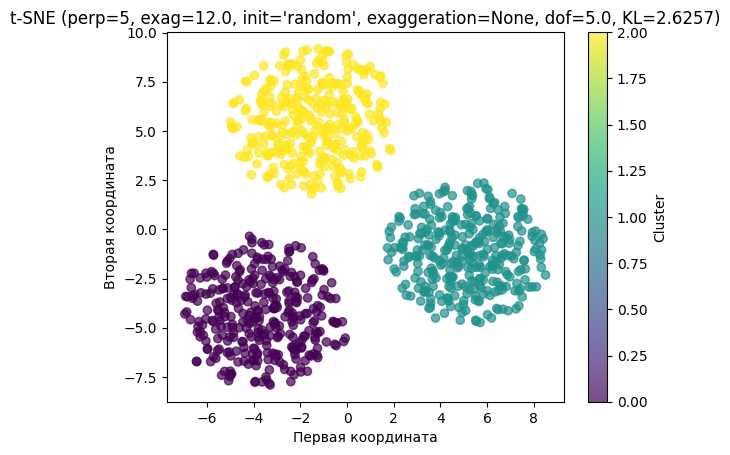

Время работы: 7.36 сек
Финальная KL-дивергенция: 2.6257

Запуск t-SNE с perplexity=5, early_exaggeration=12.0, init='pca', exaggeration=None, dof=5.0
<class 'openTSNE.sklearn.TSNE'>
2.6204455590470515
TSNE(dof=5.0, early_exaggeration=12.0, perplexity=5, random_state=42)


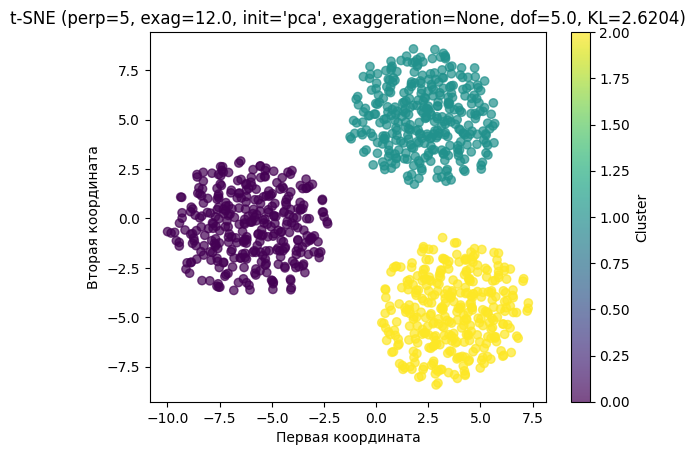

Время работы: 7.03 сек
Финальная KL-дивергенция: 2.6204

Запуск t-SNE с perplexity=5, early_exaggeration=12.0, init='random', exaggeration=1.0, dof=5.0
<class 'openTSNE.sklearn.TSNE'>
2.6256832723177395
TSNE(dof=5.0, early_exaggeration=12.0, exaggeration=1.0,
     initialization='random', perplexity=5, random_state=42)


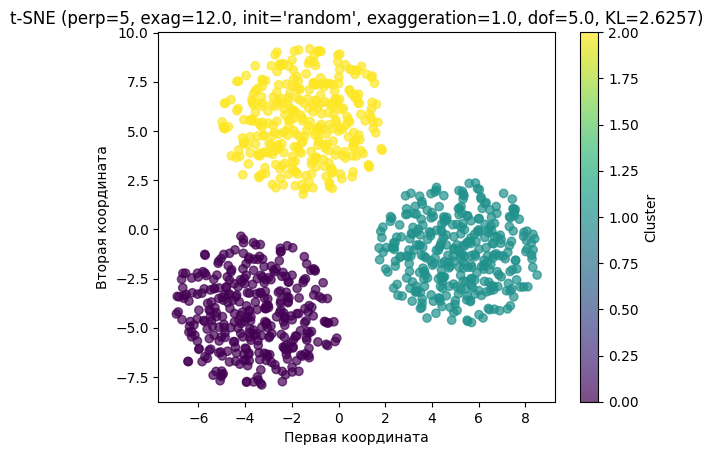

Время работы: 7.38 сек
Финальная KL-дивергенция: 2.6257

Запуск t-SNE с perplexity=5, early_exaggeration=12.0, init='pca', exaggeration=1.0, dof=5.0
<class 'openTSNE.sklearn.TSNE'>
2.6204455590470515
TSNE(dof=5.0, early_exaggeration=12.0, exaggeration=1.0, perplexity=5,
     random_state=42)


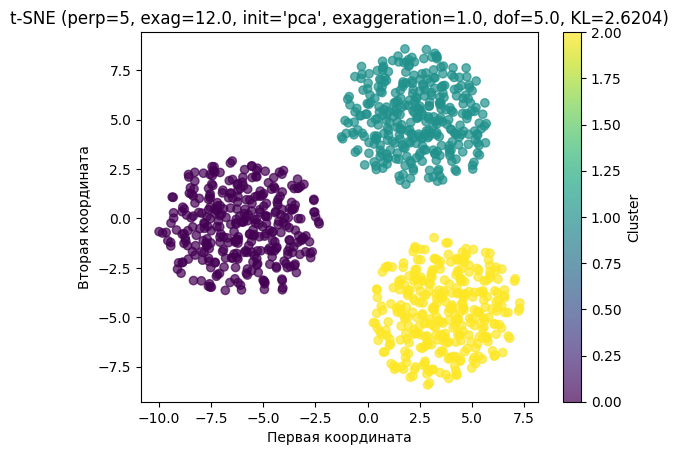

Время работы: 7.25 сек
Финальная KL-дивергенция: 2.6204

Запуск t-SNE с perplexity=5, early_exaggeration=12.0, init='random', exaggeration=4.0, dof=5.0
<class 'openTSNE.sklearn.TSNE'>
3.479221943243548
TSNE(dof=5.0, early_exaggeration=12.0, exaggeration=4.0,
     initialization='random', perplexity=5, random_state=42)


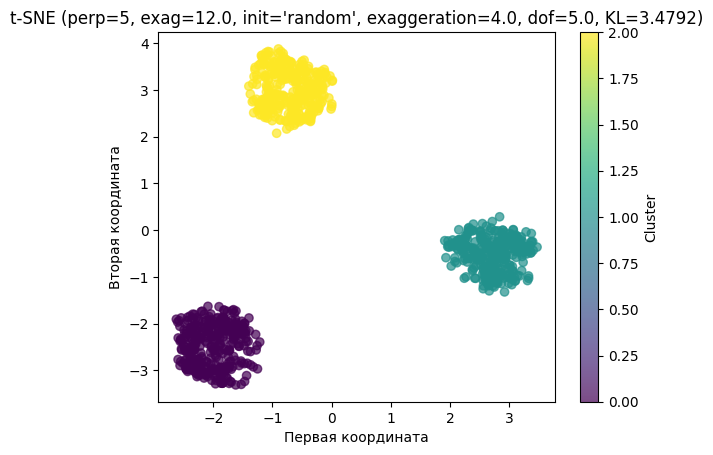

Время работы: 6.41 сек
Финальная KL-дивергенция: 3.4792

Запуск t-SNE с perplexity=5, early_exaggeration=12.0, init='pca', exaggeration=4.0, dof=5.0
<class 'openTSNE.sklearn.TSNE'>
3.478928168292194
TSNE(dof=5.0, early_exaggeration=12.0, exaggeration=4.0, perplexity=5,
     random_state=42)


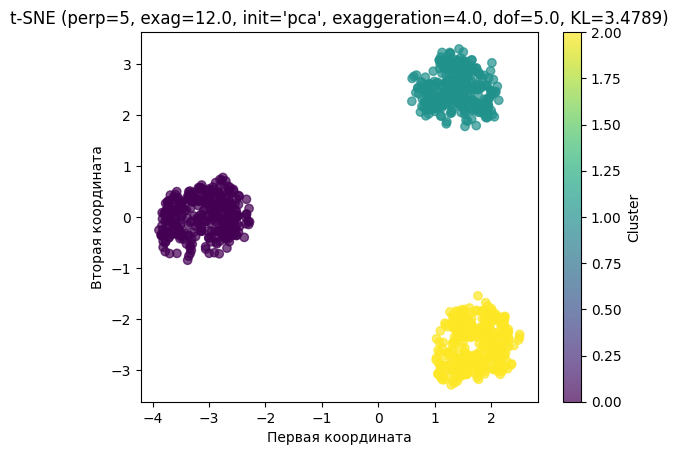

Время работы: 6.80 сек
Финальная KL-дивергенция: 3.4789

Запуск t-SNE с perplexity=5, early_exaggeration=12.0, init='random', exaggeration=12.0, dof=5.0


In [ ]:
np.random.seed(21)
n_samples = 1000
n_features = 50
n_clusters = 3

centers = np.random.uniform(-10, 10, size=(n_clusters, n_features))

X = np.empty((n_samples, n_features))
labels = np.empty(n_samples, dtype=int)

samples_per_cluster = n_samples // n_clusters
for i in range(n_clusters):
    start = i * samples_per_cluster
    end = start + samples_per_cluster if i < n_clusters - 1 else n_samples
    X[start:end] = centers[i] + np.random.normal(0, 2, size=(end - start, n_features))
    labels[start:end] = i

X += np.random.normal(0, 0.5, size=X.shape)
X = (X - np.mean(X, axis=0)) / np.std(X, axis=0)

df = pd.DataFrame(X)
df['label'] = labels
df.to_csv('synthetic_dataset.csv', index=False)
print('Датасет сгенерирован и сохранен в \'synthetic_dataset.csv\'')

print(f"Размер датасета: {X.shape[0]} объектов, {X.shape[1]} признаков.")

perplexities = [5, 10, 20, 30]
early_exags = [4.0, 12.0, 24.0]
inits = ['random', 'pca']
exaggerations = [None, 1.0, 4.0, 12.0]
dofs = [0.5, 1.0, 5.0]

results = {}

for perp in perplexities:
    for exag in early_exags:
        for dof in dofs:
            for exaggeration in exaggerations:
                for init_method in inits:
                    print(f"\nЗапуск t-SNE с perplexity={perp}, early_exaggeration={exag}, init='{init_method}', exaggeration={exaggeration}, dof={dof}")
                    Y, exec_time, final_kl = run_tsne(X, perplexity=perp, early_exaggeration=exag, init=init_method, exaggeration=exaggeration, dof=dof)
                    key = (perp, exag, init_method, exaggeration, dof)
                    results[key] = {'Y': Y, 'time': exec_time, 'kl': final_kl}

                    plt.figure()
                    plt.scatter(Y[:, 0], Y[:, 1], c=labels, cmap='viridis', alpha=0.7)
                    plt.colorbar(label='Cluster')
                    plt.title(f"t-SNE (perp={perp}, exag={exag}, init='{init_method}', exaggeration={exaggeration}, dof={dof}, KL={final_kl:.4f})")
                    plt.xlabel('Первая координата')
                    plt.ylabel('Вторая координата')
                    plt.show()

                    print(f"Время работы: {exec_time:.2f} сек")
                    print(f"Финальная KL-дивергенция: {final_kl:.4f}")

print("\nСравнение времени работы и KL-дивергенции с малым датасетом (Задача 2.2):")
for perp in perplexities:
    lib_times = [results[(perp, exag, init, exaggeration, dof)]['time'] for exag in early_exags for dof in dofs for exaggeration in exaggerations for init in inits]
    lib_kls = [results[(perp, exag, init, exaggeration, dof)]['kl'] for exag in early_exags for dof in dofs for exaggeration in exaggerations for init in inits]
    avg_lib_time = np.mean(lib_times)
    avg_lib_kl = np.mean(lib_kls)
    small_time = np.mean([results_small[(perp, exag, init, exaggeration, dof)]['time'] for exag in early_exags for init in inits])
    small_kl = np.mean([results_small[(perp, exag, init, exaggeration, dof)]['kl'] for exag in early_exags for init in inits])


    print(f"Perplexity={perp}:")
    print(f"  Большой датасет: время ~{avg_lib_time:.2f} сек, KL ~{avg_lib_kl:.4f}")
    print(f"  Малый датасет (2.2): время ~{small_time:.2f} сек, KL ~{small_kl:.4f}")

## Выводы
Проведённые эксперименты на синтетическом датасете большего объёма подтвердили и дополнили выводы, полученные ранее при анализе малых выборок. Использование более масштабного набора данных (1000 объектов и 50 признаков) позволило выявить как ожидаемые эффекты влияния параметров алгоритма, так и дополнительные особенности, проявляющиеся при увеличении размерности и сложности данных.

На большом датасете влияние параметра *perplexity* оказалось ещё более выраженным: при низких значениях (5–10) t-SNE преимущественно отражал локальную структуру, однако при этом существенно искажались глобальные взаимосвязи между кластерами. При значениях *perplexity* в диапазоне 20–30 достигался наиболее удачный компромисс между сохранением локальных деталей и общей структуры данных. При этом значения KL-дивергенции оказались заметно выше, чем в экспериментах с малым датасетом (примерно 1.9–3.1 против 0.1–1.0), что естественно объясняется возросшей сложностью данных и увеличением размерности исходного пространства.

Параметры, связанные с механизмом *exaggeration*, продемонстрировали сходные тенденции: значения *early_exaggeration* в диапазоне 12–24 способствовали более чёткому разделению кластеров на начальных этапах оптимизации, тогда как использование *exaggeration* в пределах 4–12 позволяло сохранить достигнутую структуру на финальных итерациях. Преимущество инициализации на основе PCA вновь оказалось заметным по сравнению со случайной инициализацией, особенно в условиях большого объёма данных, где случайный старт часто приводил алгоритм к менее удачным локальным минимумам.

С точки зрения вычислительных затрат увеличение объёма данных закономерно привело к существенному росту времени работы алгоритма — примерно в 15–25 раз по сравнению с малым датасетом. Кроме того, зависимость времени выполнения от значения *perplexity* стала более выраженной: при увеличении этого параметра возрастала и продолжительность расчётов. Максимальное время наблюдалось при *perplexity* = 30 (около 10.5 секунды против 0.62 секунды для малой выборки).

Таким образом, эксперименты на более масштабных данных подтвердили универсальность ранее выявленных закономерностей, одновременно показав, что с ростом объёма и размерности данных возрастает чувствительность алгоритма к выбору параметров. В этих условиях особенно важным становится корректный подбор значения *perplexity* и стратегии инициализации, от которых в значительной степени зависит как качество визуализации, так и эффективность вычислений.